<a href="https://colab.research.google.com/github/martijnvsprang/master-data-science/blob/main/Last_all_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split 
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers.embeddings import Embedding
from keras.preprocessing import sequence
np.random.seed(42)
from keras.layers import Input
from keras.utils import to_categorical
from keras import backend as K
from sklearn.metrics import classification_report
import imblearn
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.datasets import make_classification
from collections import Counter
import tensorflow as tf
from tensorflow import keras
from keras.layers import Input, LSTM, concatenate, Dense 
from keras.models import Model
import statistics
from imblearn.over_sampling import SMOTE
from keras.layers import Layer
import numpy as np
from tensorflow.keras import Input
from tensorflow.keras.layers import Dense, LSTM,GlobalAveragePooling1D,MaxPooling1D
from tensorflow.keras.models import load_model, Model
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3) ## if loss is longer than 3 times not changed terminate training

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
pip install attention

In [ ]:
from attention import Attention

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
df =  pd.read_csv('/content/drive/MyDrive/release_10_23_2020.csv')

Mounted at /content/drive


In [ ]:
df.info()## some characteristct en Dtypes for colums

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5433611 entries, 0 to 5433610
Data columns (total 6 columns):
 #   Column                     Dtype 
---  ------                     ----- 
 0   session_id_hash            object
 1   event_type                 object
 2   product_action             object
 3   product_skus_hash          object
 4   server_timestamp_epoch_ms  int64 
 5   hashed_url                 object
dtypes: int64(1), object(5)
memory usage: 248.7+ MB


In [ ]:
df['product_action'] = df['product_action'].fillna('not') ## replace Nan wit not so its iteratable for lamda create new symbol column

In [ ]:
df["symbol"] = df["product_action"].map(lambda x: '2' if "detail" in x else '3' if "add" in x else '4' if "remove" in x else '5' if "purchase" in x else '6' if "click" in x else '1') # based on symbolization as paper of cassani

In [ ]:
df1 = df.groupby('session_id_hash')['symbol'].apply(list).reset_index(name='sequence') ## group by session and make list of symbols who belong to session

In [ ]:
df2 = df.groupby('session_id_hash')['server_timestamp_epoch_ms'].apply(list).reset_index(name='time')# group by session and make list of time who belong to symbols and session

In [ ]:
df1['time'] = df2['time']## add the time list df to total df

In [ ]:
df1['liststring'] = [''.join(map(str, l)) for l in df1['sequence']] ## make stringlist of sequence

In [ ]:
df1['liststring'] = df1['liststring'].str.split("5",1) # split string sequence on 5 and exclude it 

In [ ]:
df1[['before','after']] = pd.DataFrame(df1.liststring.tolist(), index= df1.index) # devide sequence in before and after purchase

In [ ]:
df1['after'] = df1['after'].fillna('0') ## replace None wit 0 so its iteratable 

In [ ]:
df1['Conversion'] = df1['after'].map(lambda x: 0 if '0' in x else 1) ## label conversion and non conversion

In [ ]:
df1['sequence_before'] = [','.join(map(str, l)) for l in df1['before']] ## add comma after every action

In [ ]:
df1 = df1.assign(sequences_before_list=df1.sequence_before.str.split(",")) # split string on , and make a list again 

In [ ]:
df1 = df1.drop(['sequence', 'liststring','before','after','sequence_before'], axis=1) # drop columns 

In [ ]:
df1['length'] = df1.apply(lambda row: len(row.sequences_before_list) , axis=1) ## add sequence lenght as row in df

In [ ]:
df1['time_before_list'] = [x[0:y] for x,y in zip(df1['time'],df1['length'])] ## use the length of sequence to adjust the time stamps

In [ ]:
df1 = df1.drop(['time'],axis=1) ## drop old time

In [ ]:
df1['time_between'] = [np.diff(l) for l in df1['time_before_list']] ## add time between steps in dataframe

In [ ]:
df1['total_time'] = [l[-1]-l[0] for l in df1['time_before_list']]## add total time of sequence 

In [ ]:
df1 = df1.loc[df1['length'] >= 5] # select every sequence of equal or over 5 events and create new df 

In [ ]:
df1 = df1.loc[df1['length'] <= 155] # select evry sequence equal or of 155 and smaller

In [ ]:
df1['time_length'] = df1.apply(lambda row: len(row.time_between) , axis=1) ## add sequence lenght as row in df

In [ ]:
df1['total_time'] = df1['total_time'].div(1000) ## normalize total time to seconds

In [ ]:
df1['time_between'] = [l/1000 for l in df1['time_between']]  # normalize time between to seconds

In [ ]:
df1['max_time_between'] = [max(l) for l in df1['time_between']]  # max time between of sequence

In [ ]:
df1['min_time_between'] = [min(l) for l in df1['time_between']]  # min time between of sequence

In [ ]:
a = np.array(df1['time_between'])

In [ ]:
single_time_list = []
def single_time(a):
  for i in a:
    for j in i:
      single_time_list.append(j)
  
  

In [ ]:
single_time(a)

In [ ]:
statistics.mean(single_time_list)

56.1061169134063

In [ ]:
statistics.median(single_time_list)

23.453

In [ ]:
statistics.mode(single_time_list)

0.001

In [ ]:
def quantiles(data, *, n=4, method='exclusive'):
    """Divide *data* into *n* continuous intervals with equal probability.
    Returns a list of (n - 1) cut points separating the intervals.
    Set *n* to 4 for quartiles (the default).  Set *n* to 10 for deciles.
    Set *n* to 100 for percentiles which gives the 99 cuts points that
    separate *data* in to 100 equal sized groups.
    The *data* can be any iterable containing sample.
    The cut points are linearly interpolated between data points.
    If *method* is set to *inclusive*, *data* is treated as population
    data.  The minimum value is treated as the 0th percentile and the
    maximum value is treated as the 100th percentile.
    """
    if n < 1:
        raise StatisticsError('n must be at least 1')
    data = sorted(data)
    ld = len(data)
    if ld < 2:
        raise StatisticsError('must have at least two data points')
    if method == 'inclusive':
        m = ld - 1
        result = []
        for i in range(1, n):
            j, delta = divmod(i * m, n)
            interpolated = (data[j] * (n - delta) + data[j + 1] * delta) / n
            result.append(interpolated)
        return result
    if method == 'exclusive':
        m = ld + 1
        result = []
        for i in range(1, n):
            j = i * m // n                               # rescale i to m/n
            j = 1 if j < 1 else ld-1 if j > ld-1 else j  # clamp to 1 .. ld-1
            delta = i*m - j*n                            # exact integer math
            interpolated = (data[j - 1] * (n - delta) + data[j] * delta) / n
            result.append(interpolated)
        return result
    raise ValueError(f'Unknown method: {method!r}')

In [ ]:
quantiles(single_time_list,n=4)

[11.129, 23.453, 50.953]

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


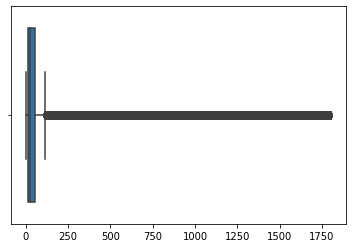

In [ ]:
sns.boxplot(single_time_list)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


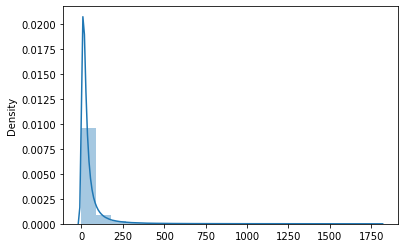

In [ ]:
sns.distplot(single_time_list,bins=20)

In [ ]:
def Boosting(item,time,median):
  boosted = []
  for i in range(len(time)):
    boosted.append(item[i])
    if time[i] > median:
      boosted.append(item[i])
  return boosted

In [ ]:
df1['time_between_B'] = [np.concatenate((l, [0])) for l in df1['time_between']]

In [ ]:
df1['Boosted'] = [Boosting(item,time,24) for item,time in zip(df1['sequences_before_list'],df1['time_between_B'])] ## use the length of sequence to adjust the time stamps

In [ ]:
dfC = df1.loc[df1['Conversion'] == 1] # select conversion class

In [ ]:
dfN = df1.loc[df1['Conversion'] == 0] # select non conversion class

In [ ]:
print(len(dfC)) ## 8329 conversion class
print(len(dfN)) ## 194755 non conversion class
print(len(dfC)+len(dfN)) ## total
print(len(dfC)/(len(dfC)+len(dfN))*100)

8329
194755
203084
4.101258592503595


In [ ]:
sequences = df1['sequences_before_list']
labels = df1['Conversion']
time = df1['time_between']

In [ ]:
sequences.shape

(203084,)

In [ ]:
time.shape

(203084,)

In [ ]:
labels.shape

(203084,)

In [ ]:
padded = pad_sequences(sequences, maxlen=155, value=0, padding='post')

In [ ]:
padded_time = pad_sequences(time, maxlen=155, value=0, padding='post')

In [ ]:
print(padded_time.shape)
print(padded.shape)
print(labels.shape)
print(Counter(labels))

(203084, 155)
(203084, 155)
(203084,)
Counter({0: 194755, 1: 8329})


In [ ]:
labels

2         0
5         0
7         0
13        0
14        0
         ..
443650    0
443651    0
443653    0
443654    0
443656    0
Name: Conversion, Length: 203084, dtype: int64

In [ ]:
# time

In [ ]:
X_train_time, X_test_time, y_train_time, y_test_time = train_test_split(padded_time, labels, test_size=0.30, random_state=42,stratify=labels) ## split dataset in train and test stratiefied

In [ ]:
X_val_time, X_test_time, y_val_time, y_test_time = train_test_split(X_test_time, y_test_time, test_size=0.5, random_state=42,stratify=y_test_time) ## split dataset in train and test stratiefied

In [ ]:
print(X_train_time.shape)
print(X_val_time.shape)
print(X_test_time.shape)
print(Counter(y_train_time))
print(Counter(y_val_time))
print(Counter(y_test_time))
print(Counter(y_train_time)[1]/len(X_train_time))
print(Counter(y_val_time)[1]/len(X_val_time))
print(Counter(y_test_time)[1]/len(X_test_time))
print(X_train_time[0:2])
print(y_train_time[0:2])

(142158, 155)
(30463, 155)
(30463, 155)
Counter({0: 136328, 1: 5830})
Counter({0: 29213, 1: 1250})
Counter({0: 29214, 1: 1249})
0.041010706397107445
0.041033384761842234
0.041000558054032764
[[169  18  33  60  48   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0]
 [ 20   1   0  22  47   5  18  13  39   4   6 153 286  46  75 185   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0 

In [ ]:
## sequences

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(padded, labels, test_size=0.30, random_state=42,stratify=labels) ## split dataset in train and test stratiefied

In [ ]:
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42,stratify=y_test) ## split dataset in train and test stratiefied

In [ ]:
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)
print(Counter(y_train))
print(Counter(y_val))
print(Counter(y_test))
print(Counter(y_train)[1]/len(X_train))
print(Counter(y_val)[1]/len(X_val))
print(Counter(y_test)[1]/len(X_test))
print(X_train[0:2])
print(y_train[0:2])

(142158, 155)
(30463, 155)
(30463, 155)
Counter({0: 136328, 1: 5830})
Counter({0: 29213, 1: 1250})
Counter({0: 29214, 1: 1249})
0.041010706397107445
0.041033384761842234
0.041000558054032764
[[1 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0]
 [2 3 3 3 2 2 2 2 2 2 2 2 1 2 1 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0]]
286128    0
305151    0
Name: Conversion, dtype: int64


In [ ]:
oversample = RandomOverSampler(sampling_strategy='minority') ## time  
X_over_time, y_over_time = oversample.fit_resample(X_train_time, y_train_time)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
print(Counter(y_over_time))
print(len(X_over_time))
print(X_over_time[0:2])
print(y_over_time[0:2])

Counter({0: 136328, 1: 136328})
272656
[[169  18  33  60  48   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0]
 [ 20   1   0  22  47   5  18  13  39   4   6 153 286  46  75 185   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0 

In [ ]:
oversample = RandomOverSampler(sampling_strategy='minority') ## sequences
X_over, y_over = oversample.fit_resample(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
print(Counter(y_over))
print(len(X_over))
print(X_over[0:2])
print(y_over[0:2])

Counter({0: 136328, 1: 136328})
272656
[[1 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0]
 [2 3 3 3 2 2 2 2 2 2 2 2 1 2 1 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0]]
[0 0]


In [ ]:
encoded_train = to_categorical(X_over,num_classes = 7)
encoded_val = to_categorical(X_val,num_classes=7)
encoded_test = to_categorical(X_test,num_classes = 7)

In [ ]:
print(encoded_train.shape)
print(y_over.shape)

(272656, 155, 7)
(272656,)


In [ ]:
print(X_over_time.shape)
print(y_over_time.shape)

(272656, 155)
(272656,)


In [ ]:
X_over_time = np.reshape(X_over_time,(len(X_over_time),155,1))

In [ ]:
print(X_over_time.shape)

(272656, 155, 1)


In [ ]:

print(type(y_over_time))

<class 'numpy.ndarray'>


In [ ]:
print(encoded_train[0])
print(type(encoded_train))

[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
<class 'numpy.ndarray'>


In [ ]:
type(y_over[0])

numpy.int64

In [ ]:
def to_bin(y_pred):
  L = []
  for i in y_pred:
    if i >0.5:
      L.append(1)
    else:
      L.append(0)
  return L


In [ ]:
##modelB = load_model('modelB.h5')
##pred2 = modelB.predict(encoded_test)
##y_pred = to_bin(pred2)
##print(classification_report(y_test, y_pred))

### plot and predict baseline model
##plt.plot(historyT.history['precision_2'])
##plt.plot(historyT.history['val_precision_2'])
##plt.plot(historyT.history['recall_2'])
##plt.plot(historyT.history['val_recall_2'])
##plt.title('model performance')
##plt.ylabel('score')
##plt.xlabel('epoch')
##plt.legend(['precision_1', 'val_precision_1','recall_1','val_recall_1'], loc='upper left')
##plt.show()


In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
import numpy as np


def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix attention + time model',
                          cmap=None,
                          normalize=True):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()

In [ ]:
# save baselinemodel and predict again
modelB = load_model('/content/drive/MyDrive/modelBOVER.h5')
pred2 = modelB.predict(encoded_test)
y_pred = to_bin(pred2)
print(classification_report(y_test, y_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9868    0.8776    0.9290     29214
           1     0.2023    0.7262    0.3164      1249

    accuracy                         0.8714     30463
   macro avg     0.5946    0.8019    0.6227     30463
weighted avg     0.9547    0.8714    0.9039     30463



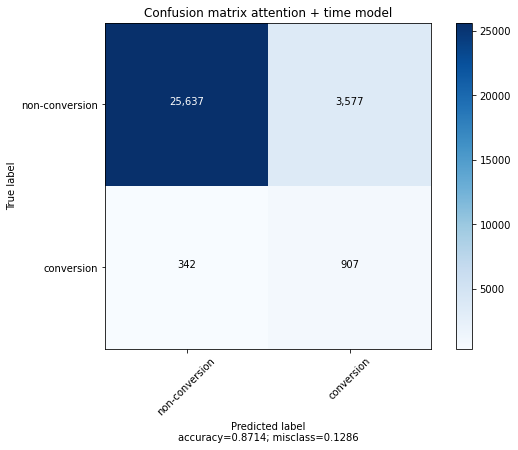

In [ ]:
from sklearn.metrics import confusion_matrix
base = confusion_matrix(y_test,y_pred)
plot_confusion_matrix(base,['non-conversion','conversion'],normalize=False)

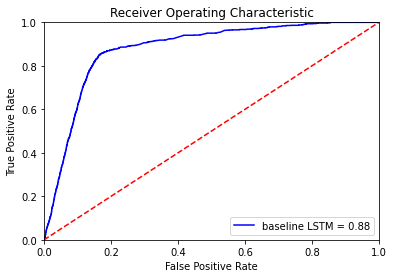

In [ ]:
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
probsB = modelB.predict(encoded_test)
predsB = probsB
fprB, tprB, threshold = metrics.roc_curve(y_test, predsB)
roc_aucB = metrics.auc(fprB, tprB)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fprB, tprB, 'b', label = 'baseline LSTM = %0.2f' % roc_aucB)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


In [ ]:
# save time model and predict again

modelT = load_model('/content/drive/MyDrive/modelTOVER.h5')
pred2 = modelT.predict([encoded_test,X_test_time])
y_pred = to_bin(pred2)
print(classification_report(y_test, y_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9910    0.9262    0.9575     29214
           1     0.3175    0.8030    0.4551      1249

    accuracy                         0.9212     30463
   macro avg     0.6542    0.8646    0.7063     30463
weighted avg     0.9634    0.9212    0.9369     30463



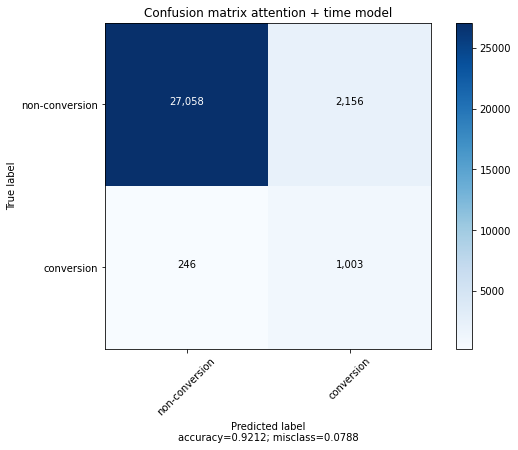

In [ ]:
from sklearn.metrics import confusion_matrix
time = confusion_matrix(y_test,y_pred)
plot_confusion_matrix(time,['non-conversion','conversion'],normalize=False)

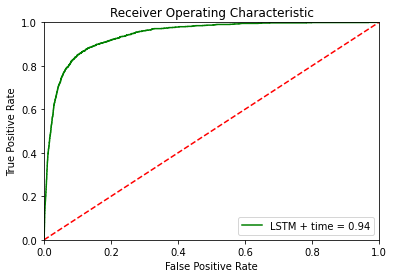

In [ ]:
probsT = modelT.predict([encoded_test,X_test_time])
predsT = probsT
fprT, tprT, threshold = metrics.roc_curve(y_test, predsT)
roc_aucT = metrics.auc(fprT, tprT)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fprT, tprT, 'g', label = 'LSTM + time = %0.2f' % roc_aucT)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


In [ ]:
# save and predict again
modelA = load_model('/content/drive/MyDrive/modelAOVER.h5')
pred2 = modelA.predict(encoded_test)
y_pred = to_bin(pred2)
print(classification_report(y_test, y_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9951    0.9219    0.9571     29214
           1     0.3285    0.8935    0.4804      1249

    accuracy                         0.9208     30463
   macro avg     0.6618    0.9077    0.7188     30463
weighted avg     0.9678    0.9208    0.9376     30463



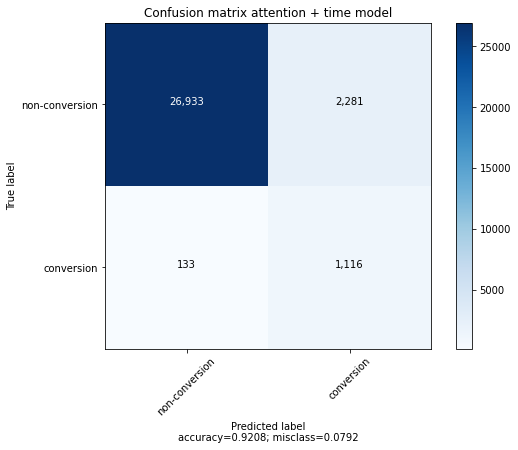

In [ ]:
from sklearn.metrics import confusion_matrix
attention = confusion_matrix(y_test,y_pred)
plot_confusion_matrix(attention,['non-conversion','conversion'],normalize=False)

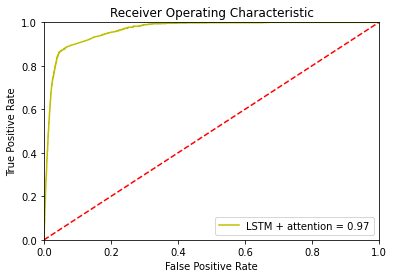

In [ ]:
probsA = modelA.predict(encoded_test)
predsA = probsA
fprA, tprA, threshold = metrics.roc_curve(y_test, predsA)
roc_aucA = metrics.auc(fprA, tprA)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fprA, tprA, 'y', label = 'LSTM + attention = %0.2f' % roc_aucA)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
## save attention and time model and predict again
modelAT = load_model('/content/drive/MyDrive/modelATOVER.h5')
pred2 = modelAT.predict(([encoded_test,X_test_time]))
y_pred = to_bin(pred2)
print(classification_report(y_test, y_pred,digits=4))

              precision    recall  f1-score   support

           0     0.9816    0.9872    0.9844     29214
           1     0.6540    0.5661    0.6069      1249

    accuracy                         0.9699     30463
   macro avg     0.8178    0.7766    0.7956     30463
weighted avg     0.9681    0.9699    0.9689     30463



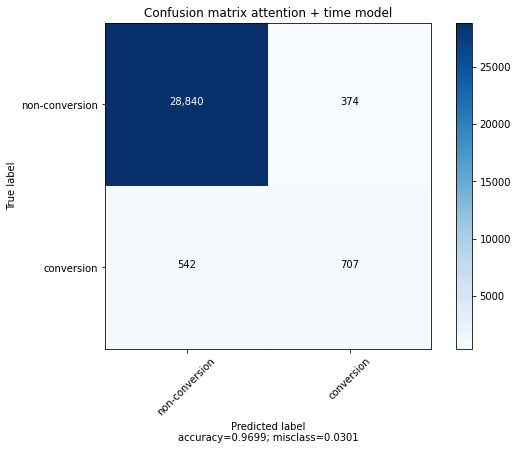

In [ ]:
from sklearn.metrics import confusion_matrix
attentiontime = confusion_matrix(y_test,y_pred)
plot_confusion_matrix(attentiontime,['non-conversion','conversion'],normalize=False)

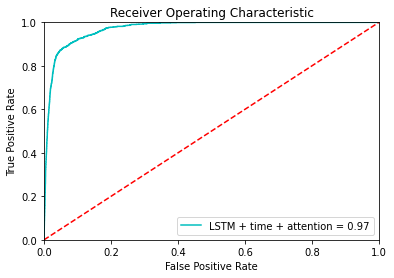

In [ ]:
probsAT = modelAT.predict([encoded_test,X_test_time])
predsAT = probsAT
fprAT, tprAT, threshold = metrics.roc_curve(y_test, predsAT)
roc_aucAT = metrics.auc(fprAT, tprAT)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fprAT, tprAT, 'c', label = 'LSTM + time + attention = %0.2f' % roc_aucAT)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


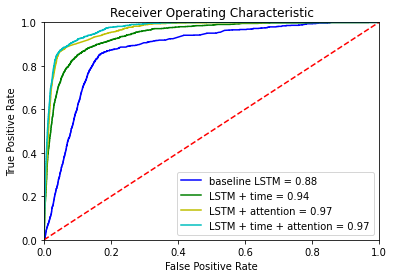

In [ ]:
# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fprB, tprB, 'b', label = 'baseline LSTM = %0.2f' % roc_aucB)
plt.plot(fprT, tprT, 'g', label = 'LSTM + time = %0.2f' % roc_aucT)
plt.plot(fprA, tprA, 'y', label = 'LSTM + attention = %0.2f' % roc_aucA)
plt.plot(fprAT, tprAT, 'c', label = 'LSTM + time + attention = %0.2f' % roc_aucAT)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


In [ ]:
### visualizing attention model

In [ ]:
modelA = load_model('/content/drive/MyDrive/modelAOVER.h5')
modelA.summary()
modelA = Model(inputs=modelA.input,
              outputs=[modelA.output, modelA.get_layer(index=5).output])

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 155, 7)]     0                                            
__________________________________________________________________________________________________
LSTM (LSTM)                     (None, 155, 64)      18432       input_1[0][0]                    
__________________________________________________________________________________________________
last_hidden_state (Lambda)      (None, 64)           0           LSTM[0][0]                       
__________________________________________________________________________________________________
attention_score_vec (Dense)     (None, 155, 64)      4096        LSTM[0][0]                       
____________________________________________________________________________________________

In [ ]:
outputs = modelA.predict(encoded_test)
model_outputs = outputs[0]
attention_outputs = outputs[1]

In [ ]:
y_test = y_test.values.reshape(len(y_test),1)

In [ ]:
y_test

array([[0],
       [0],
       [0],
       ...,
       [0],
       [0],
       [0]])

In [ ]:
model_outputs = to_bin(model_outputs)

In [ ]:
print(len(attention_outputs))

30463


In [ ]:
original_sequences=[]
for i in range(len(encoded_test)):
  a = np.array( [ np.argmax ( y, axis=None, out=None ) for y in encoded_test[i] ] )
  original_sequences.append(a)

In [ ]:
list_of = list(zip(original_sequences, attention_outputs)) 
df666 = pd.DataFrame(list_of, columns = ['original_sequences', 'attention_outputs'])

In [ ]:
df666['til_0'] = [''.join(map(str, l)) for l in df666['original_sequences']] ## make stringlist of sequence

In [ ]:
df666['til_0'] = df666['til_0'].str.split("0",1) # split string sequence on 0 and exclude it 

In [ ]:
df666[['before0','after0']] = pd.DataFrame(df666.til_0.tolist(), index= df666.index) # devide sequence in before and after 0 pad

In [ ]:
df666['before0'] = [','.join(map(str, l)) for l in df666['before0']] ## add comma after every action

In [ ]:
df6 = df666.assign(before0=df666.before0.str.split(",")) # split string on , and make a list again 

In [ ]:
df6['lenght'] = df6.apply(lambda row: len(row.before0) , axis=1) ## add sequence lenght as row in df

In [ ]:
df6 = df6.drop(['original_sequences', 'til_0','after0'], axis=1) # drop columns 

In [ ]:
df6['attention'] = [x[0:y] for x,y in zip(df6['attention_outputs'],df6['lenght'])] ## use the length of sequence to adjust the attetion index

In [ ]:
df6['model_output'] = model_outputs

In [ ]:
df6['y_test'] = y_test

In [ ]:
df6

,attention_outputs,before0,lenght,attention,model_output,y_test
0,"[0.00036703295, 0.00011798464, 0.00012582188, ...","[1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 1, 2, 1, 2, ...",25,"[0.00036703295, 0.00011798464, 0.00012582188, ...",0,0
1,"[0.007750268, 0.0024912474, 0.034008928, 0.000...","[1, 1, 2, 1, 1, 1]",6,"[0.007750268, 0.0024912474, 0.034008928, 0.000...",0,0
2,"[0.0010783137, 1.4395797e-05, 0.00014303131, 3...","[2, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 2]",13,"[0.0010783137, 1.4395797e-05, 0.00014303131, 3...",0,0
3,"[0.0060768747, 0.001953396, 0.0020831525, 0.01...","[1, 1, 1, 2, 6, 1, 2, 6, 1, 2, 6, 1, 2, 6, 1, ...",37,"[0.0060768747, 0.001953396, 0.0020831525, 0.01...",0,0
4,"[0.026605545, 0.00855225, 0.009120414, 0.01635...","[1, 1, 1, 1, 1, 1, 1, 2, 1]",9,"[0.026605545, 0.00855225, 0.009120414, 0.01635...",0,0
...,...,...,...,...,...,...
30458,"[0.008350741, 0.20307088, 0.008962359, 0.20013...","[1, 2, 1, 2, 1, 2, 1, 2, 1]",9,"[0.008350741, 0.20307088, 0.008962359, 0.20013...",0,0
30459,"[0.041372556, 0.013298959, 0.014182501, 0.0254...","[1, 1, 1, 1, 2]",5,"[0.041372556, 0.013298959, 0.014182501, 0.0254...",0,0
30460,"[2.2942915e-08, 7.3762716e-09, 1.0065514e-07, ...","[1, 1, 2, 2, 3, 2, 2, 3, 2, 1, 2, 1, 2, 3, 1, ...",59,"[2.2942915e-08, 7.3762716e-09, 1.0065514e-07, ...",0,0
30461,"[0.00017232112, 5.5392375e-05, 5.9072154e-05, ...","[1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 1]",16,"[0.00017232112, 5.5392375e-05, 5.9072154e-05, ...",0,0


In [ ]:
attention = df6['attention']
sequence = df6['before0']
model_output = df6['model_output']
y_test = df6['y_test']

In [ ]:
print(len(attention[0]))
print(len(sequence[0]))

25
25


In [ ]:
import matplotlib.pyplot as plt
import numpy as np; np.random.seed(1)

In [ ]:
print(sequence[0])

['1', '1', '1', '2', '1', '1', '2', '1', '2', '1', '2', '1', '2', '1', '2', '1', '1', '1', '2', '1', '1', '2', '1', '2', '1']


In [ ]:
sum(attention[6])

0.37512195436283946

In [ ]:
[1,1,1,1,1]
[0.2,0.3,4,5]

[0.2, 0.3, 4, 5]

<class 'matplotlib.axes._subplots.AxesSubplot'>


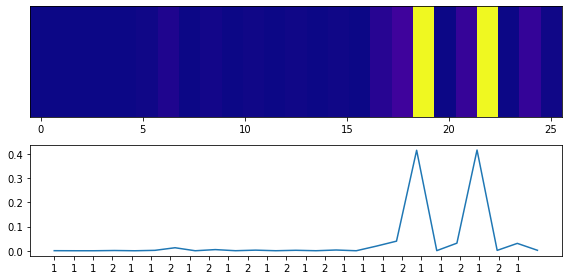

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


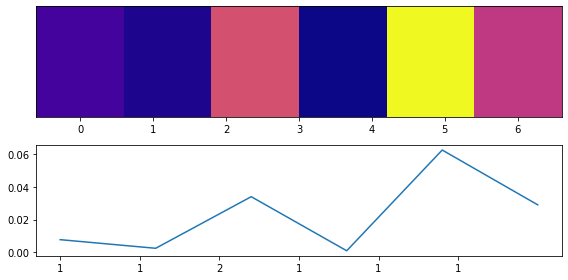

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


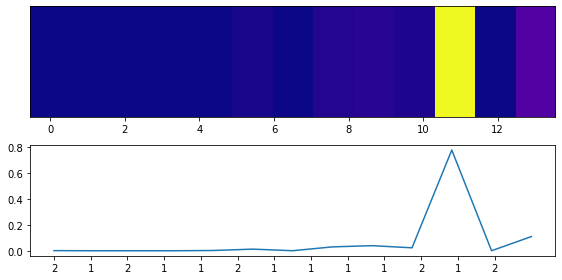

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


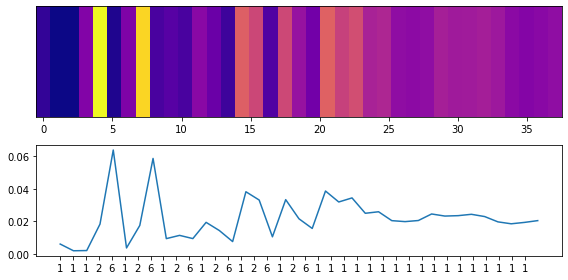

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


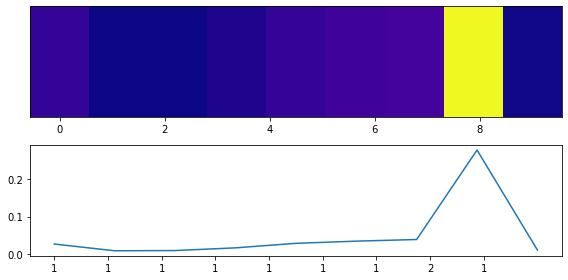

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


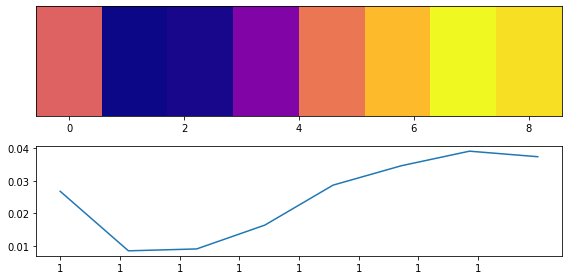

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


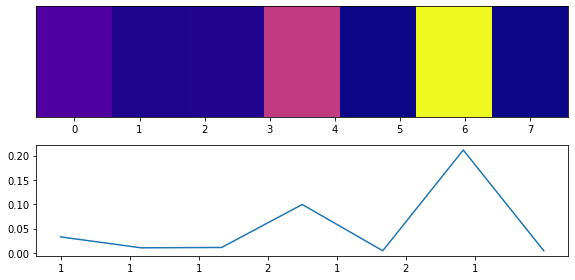

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


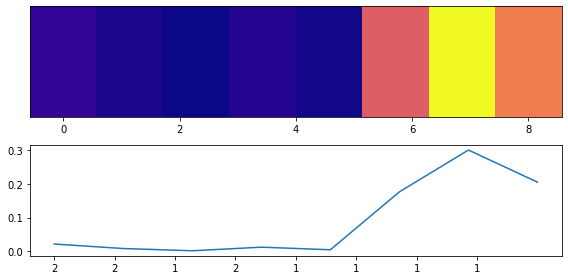

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


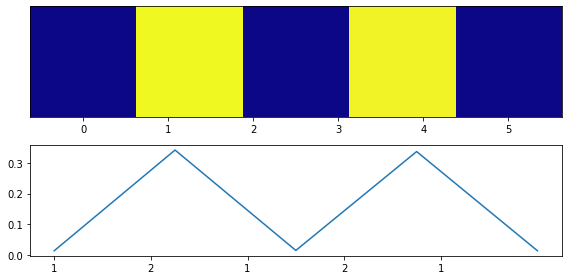

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


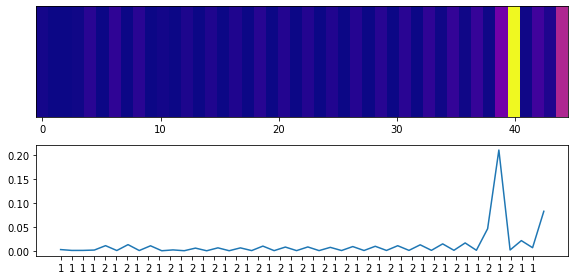

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


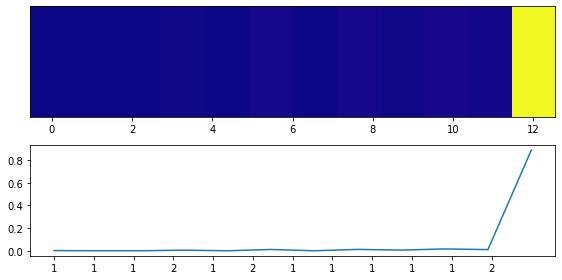

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


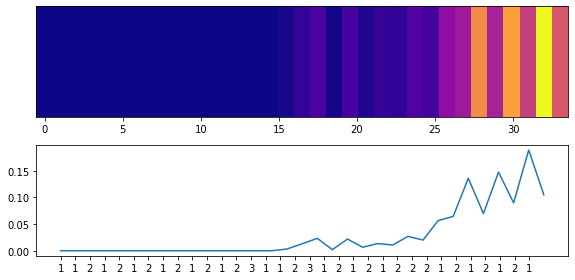

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


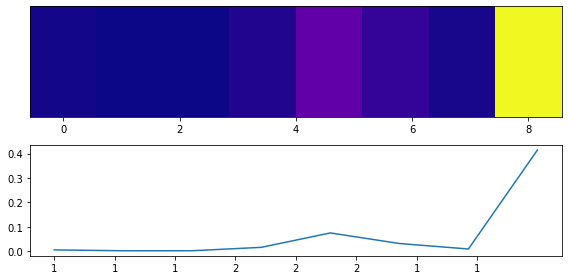

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


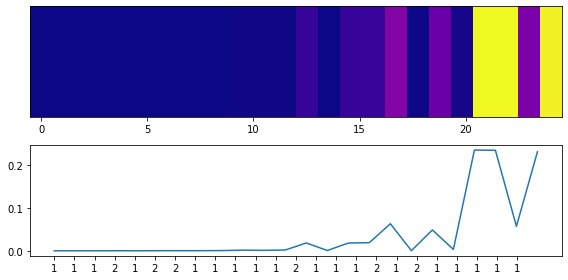

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


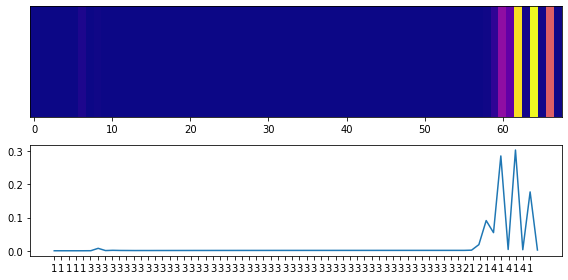

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


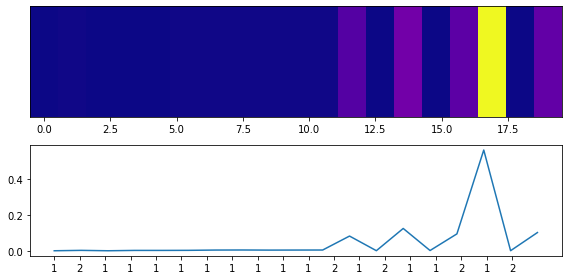

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


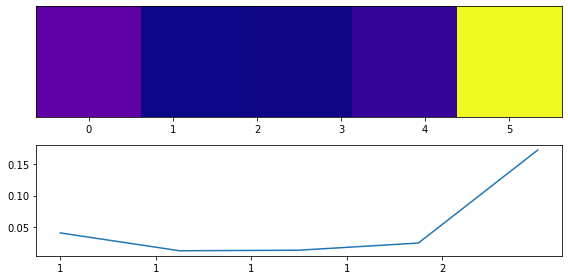

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


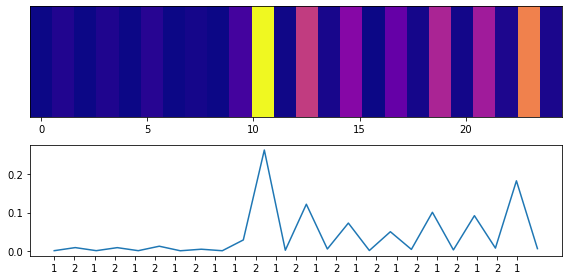

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


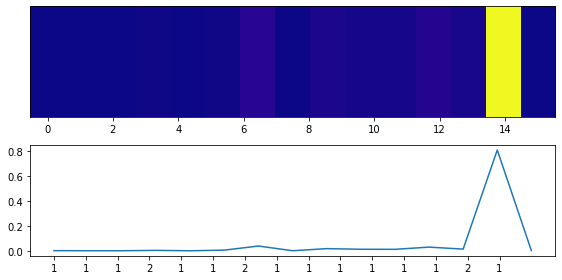

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


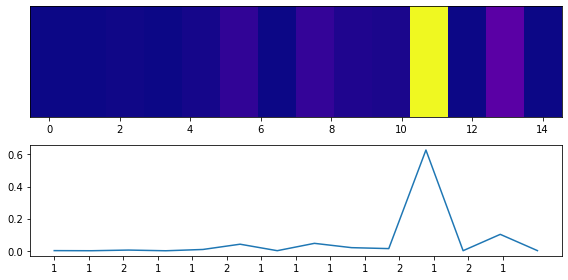

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


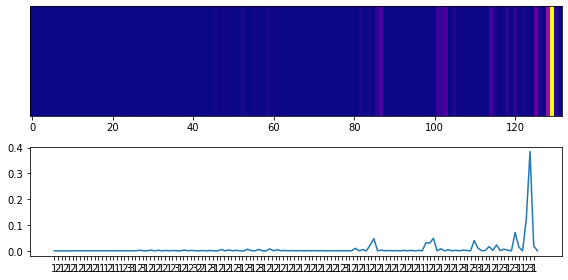

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


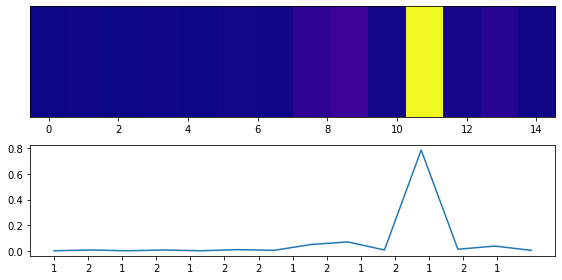

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


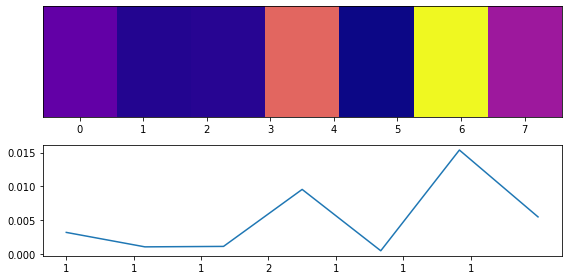

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


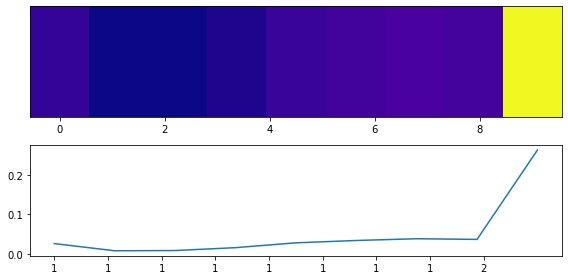

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


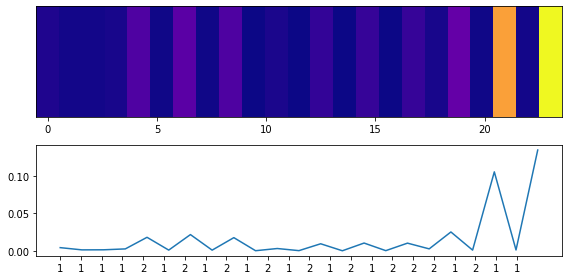

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


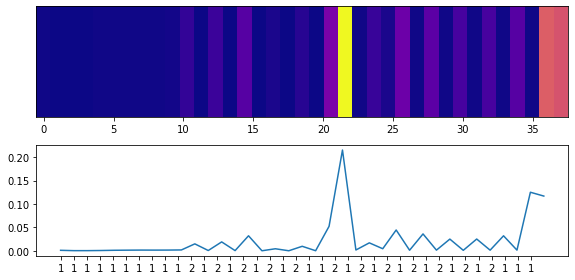

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


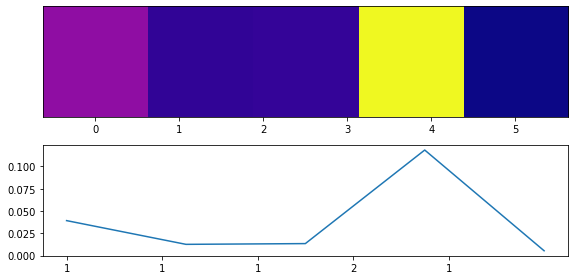

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


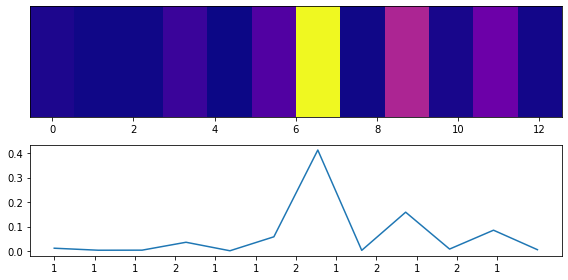

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


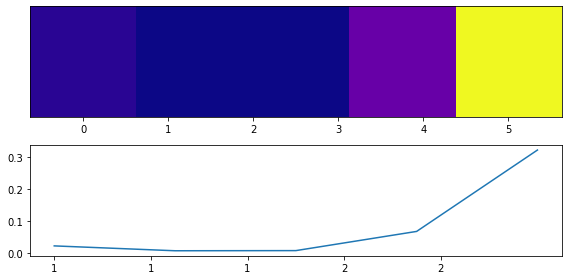

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


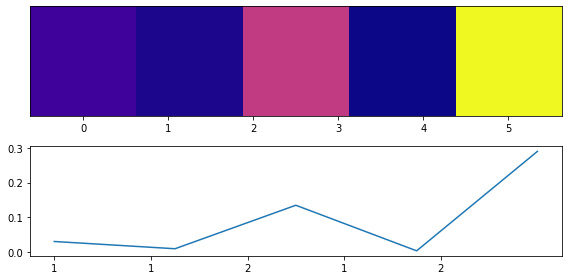

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


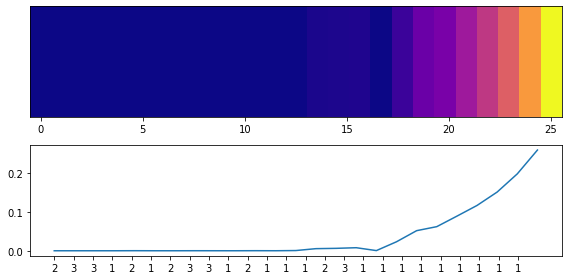

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


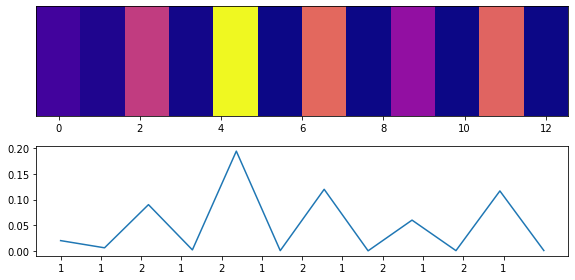

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


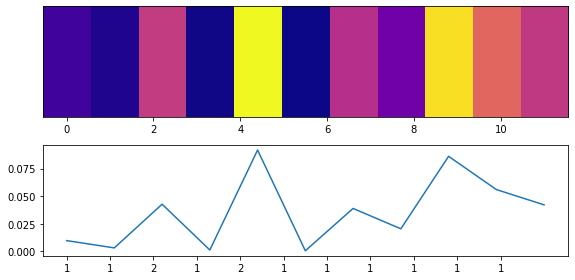

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


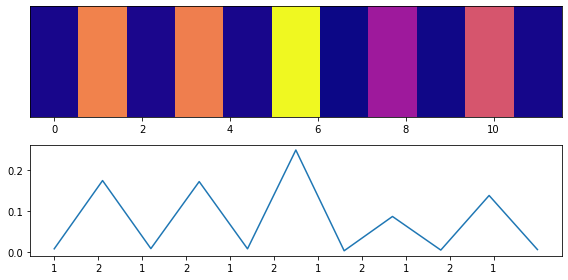

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


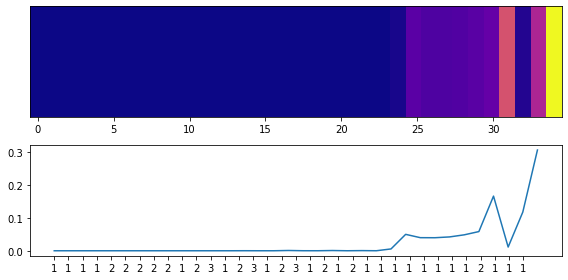

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


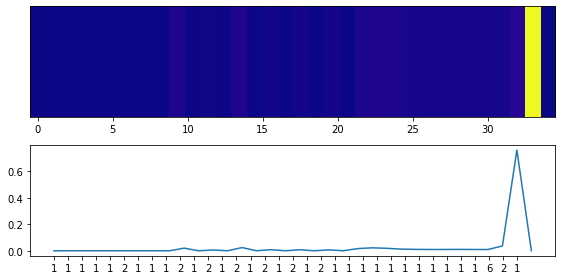

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


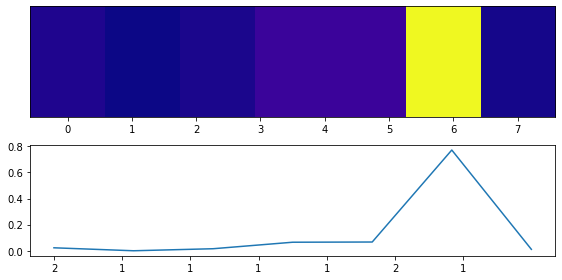

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


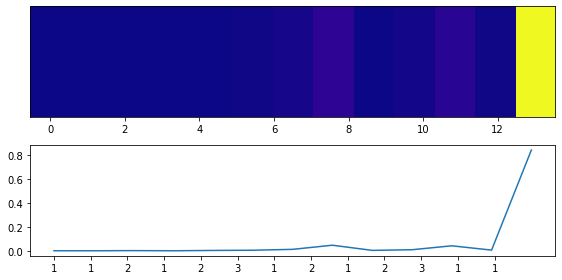

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


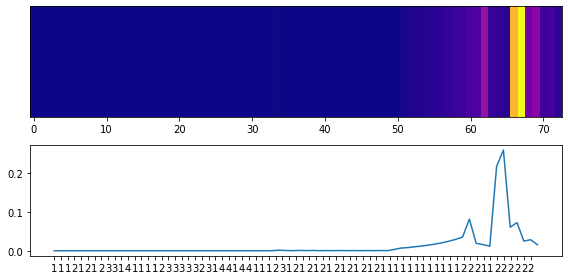

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


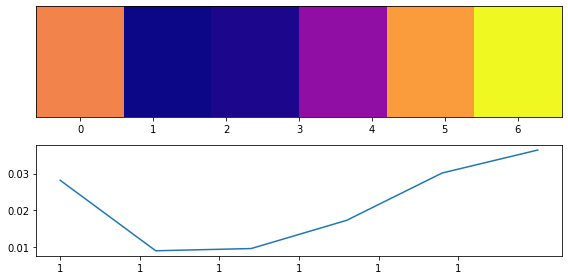

model prediction: 0 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


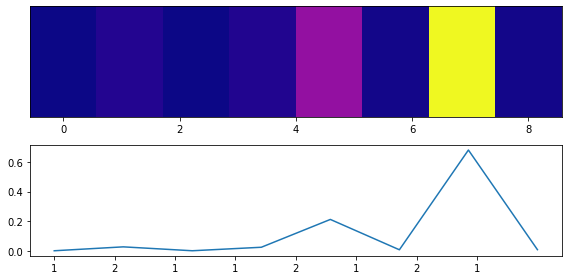

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


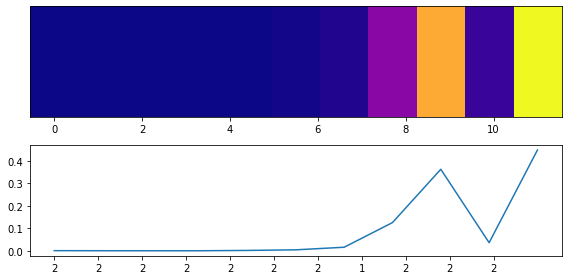

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


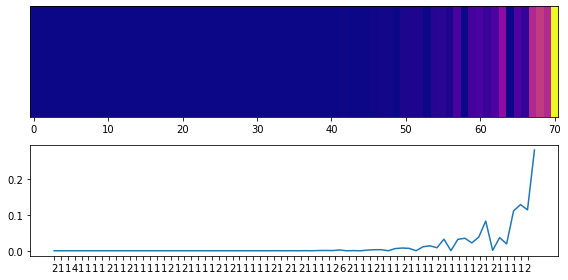

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


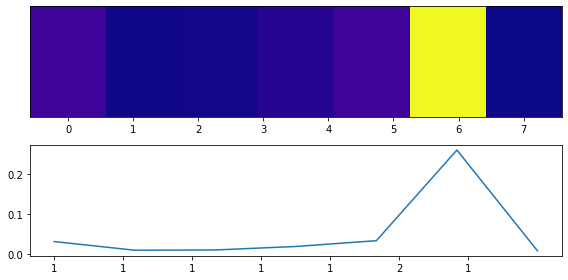

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


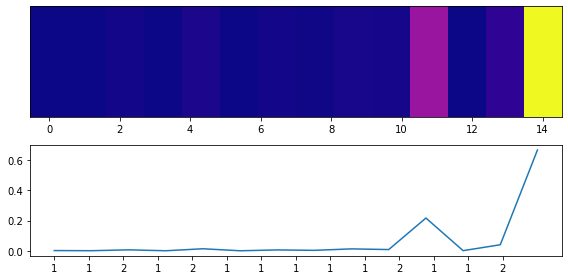

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


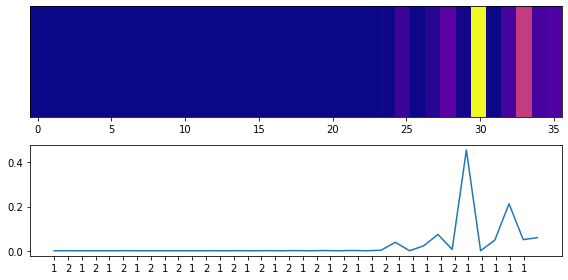

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


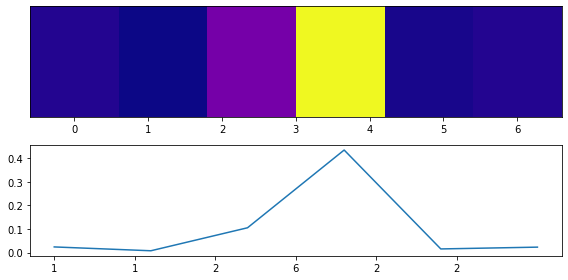

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


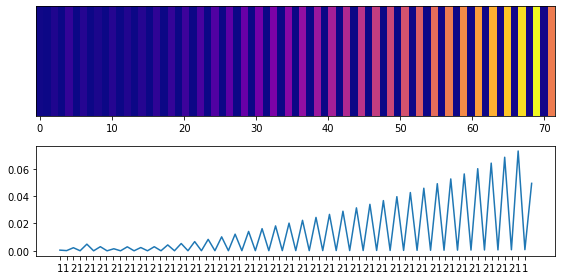

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


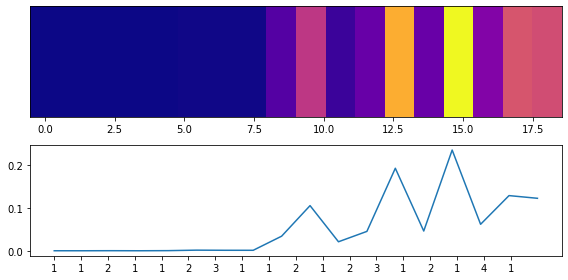

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


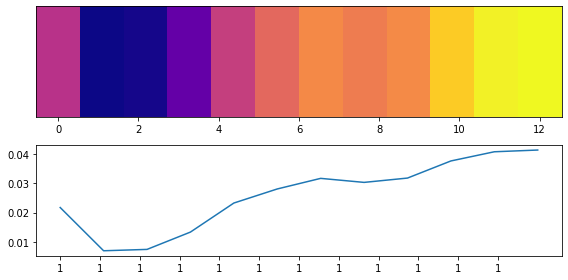

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


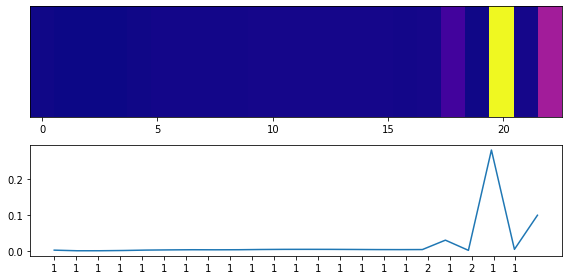

model prediction: 0 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


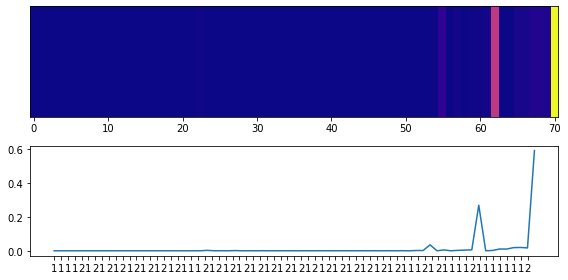

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


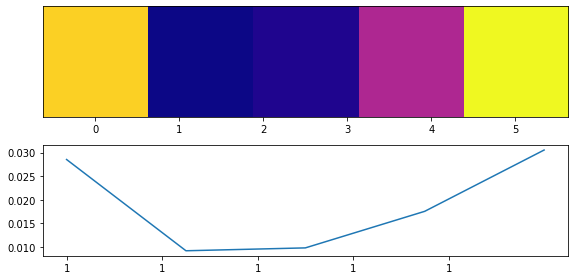

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


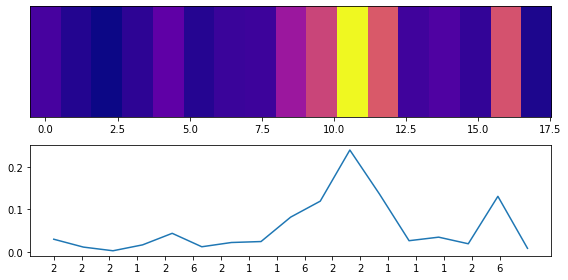

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


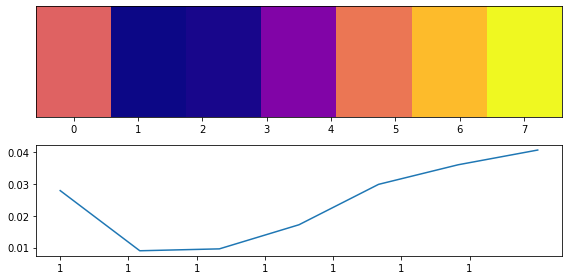

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


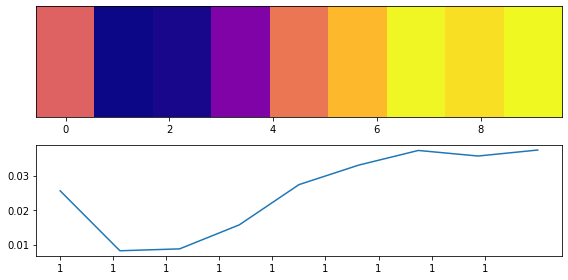

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


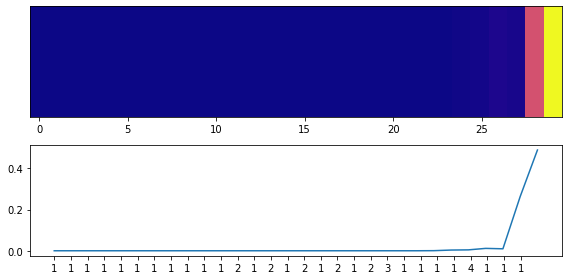

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


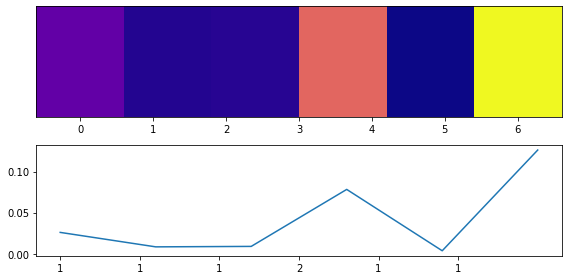

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


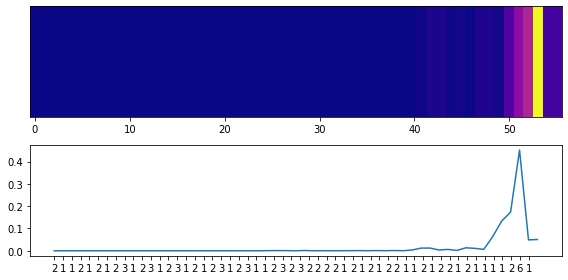

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


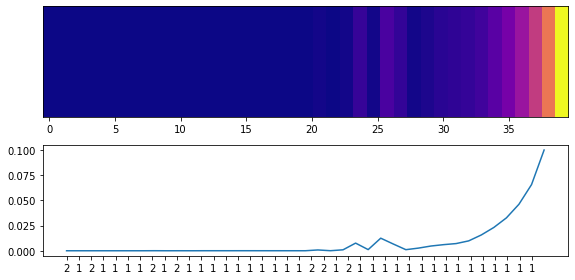

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


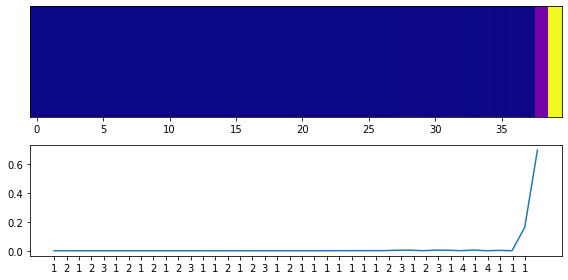

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


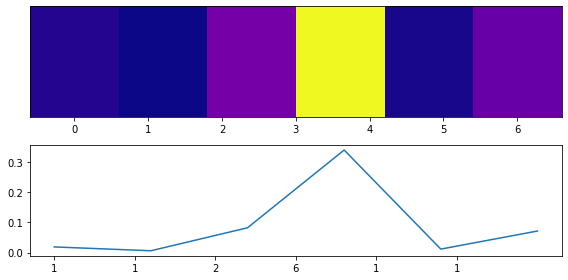

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


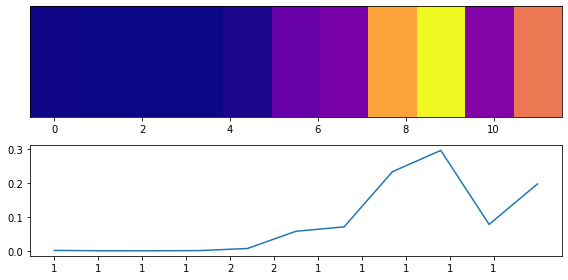

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


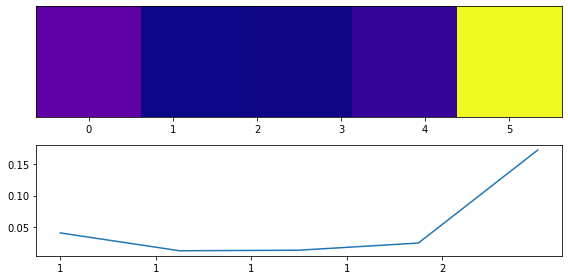

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


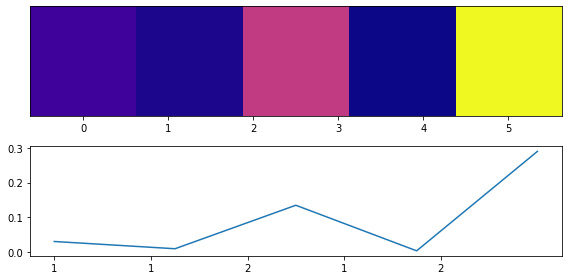

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


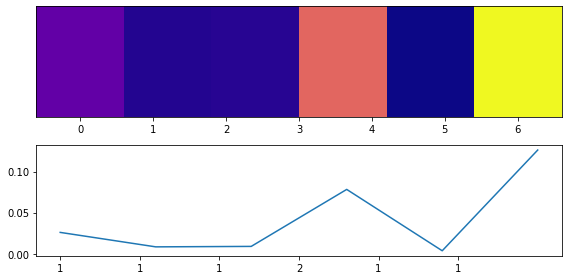

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


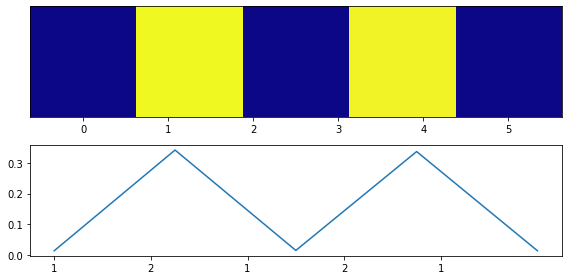

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


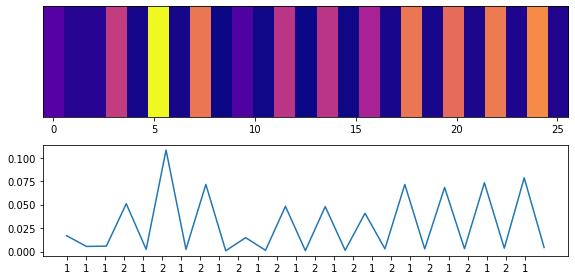

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


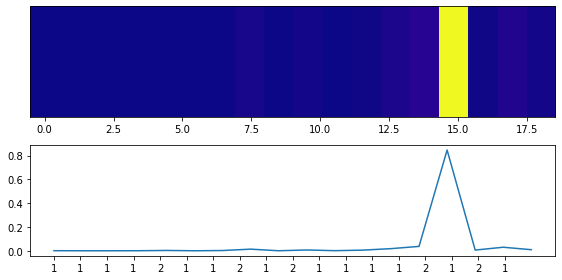

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


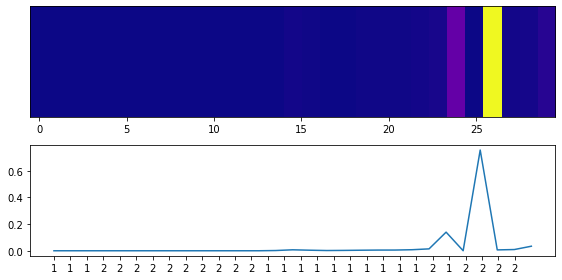

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


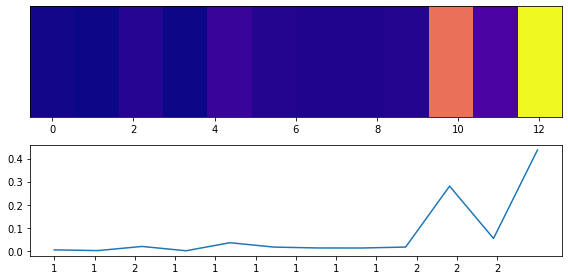

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


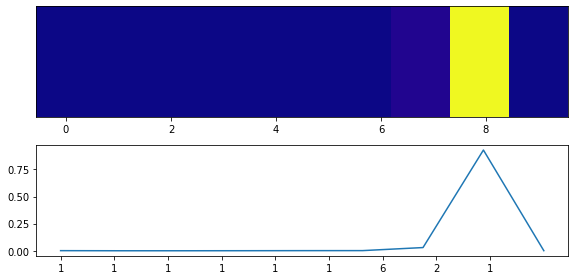

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


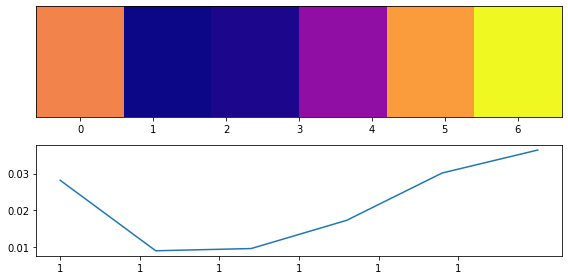

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


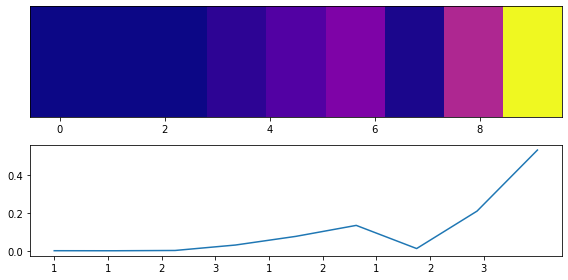

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


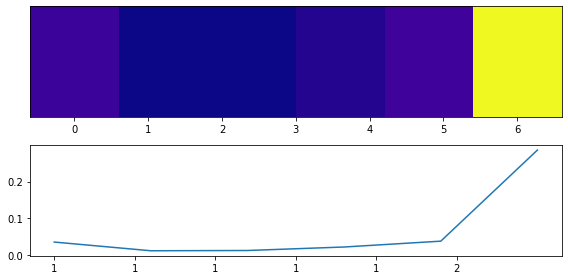

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


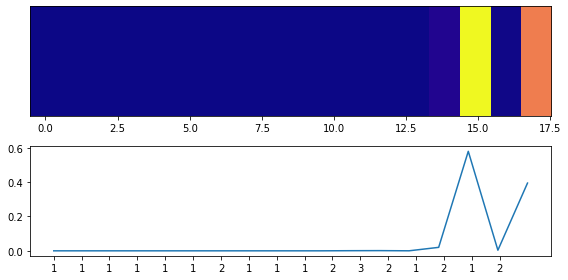

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


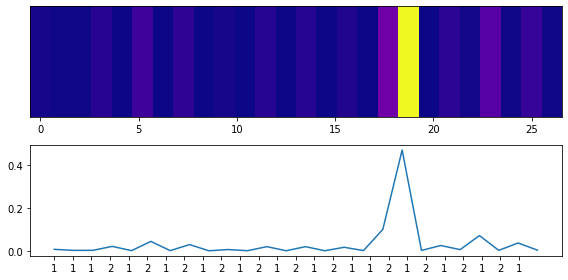

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


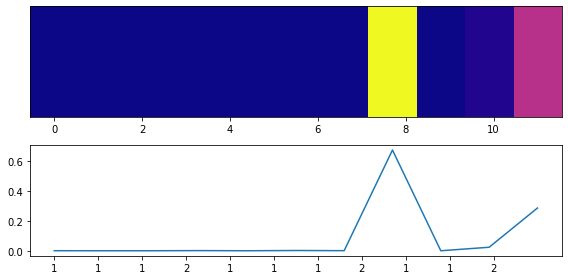

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


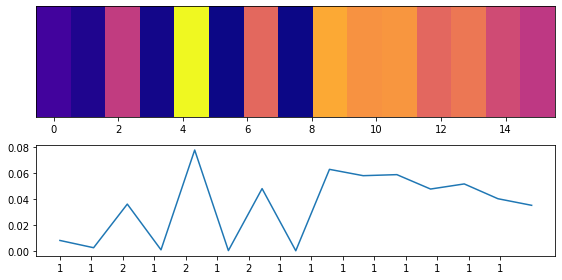

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


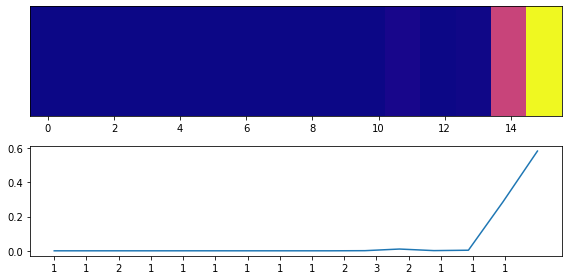

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


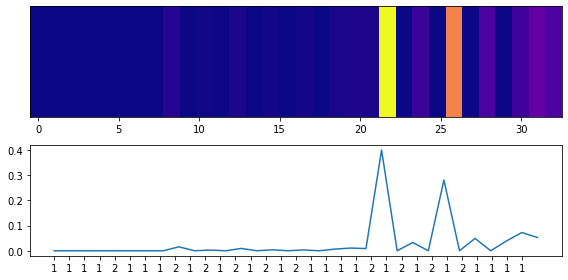

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


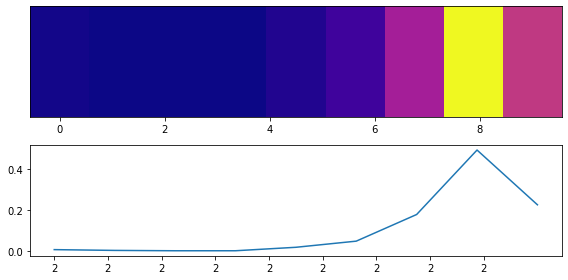

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


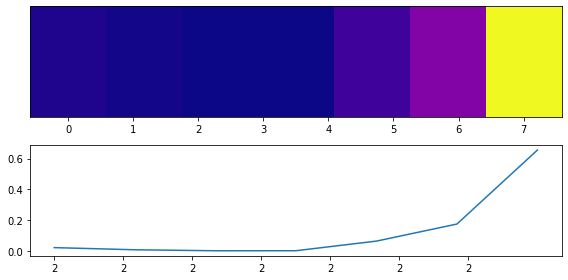

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


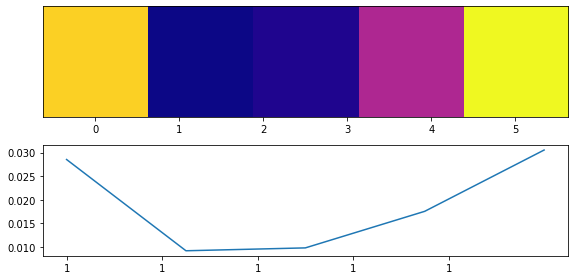

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


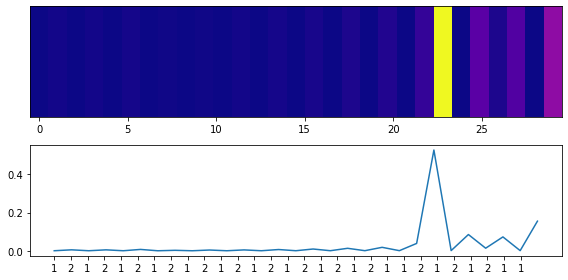

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


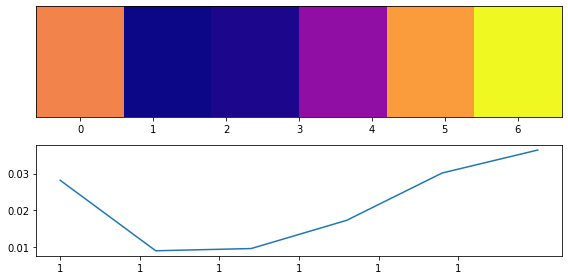

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


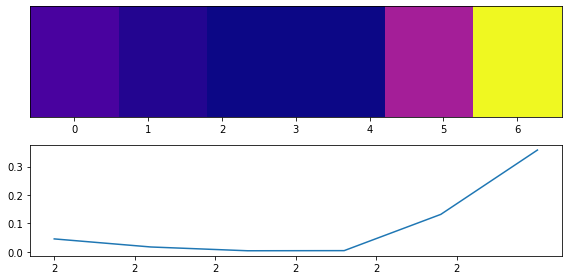

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


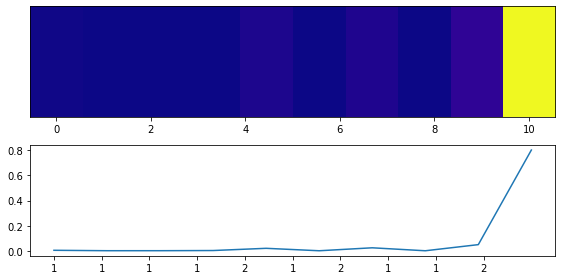

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


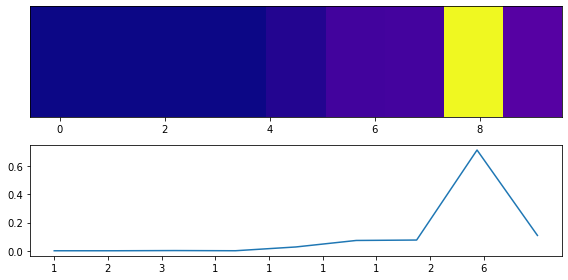

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


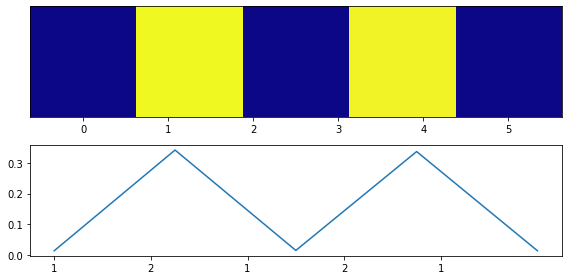

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


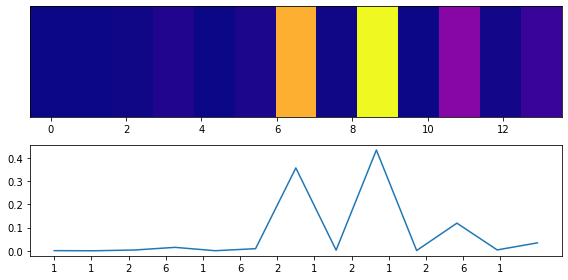

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


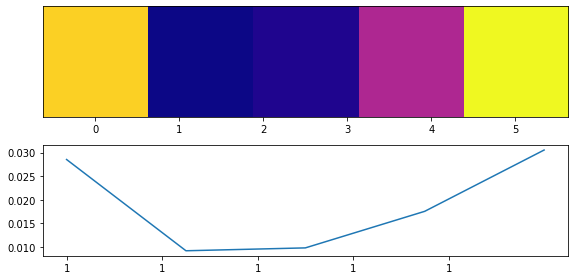

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


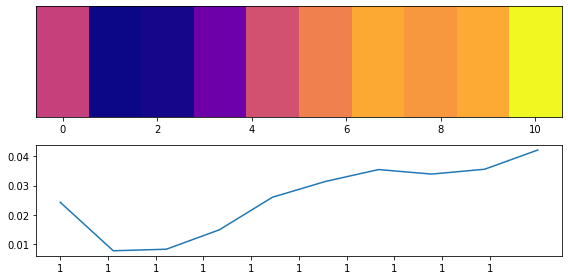

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


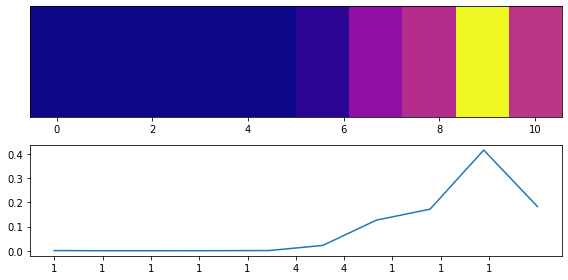

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


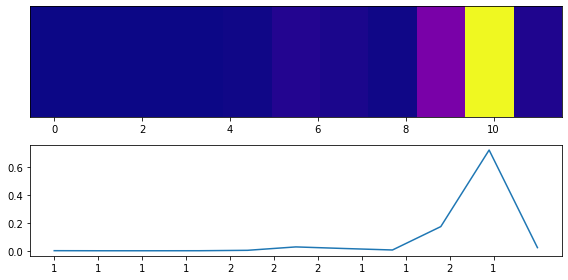

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


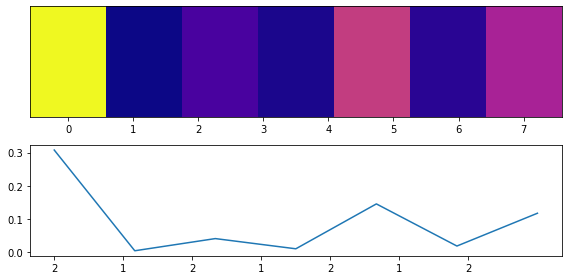

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


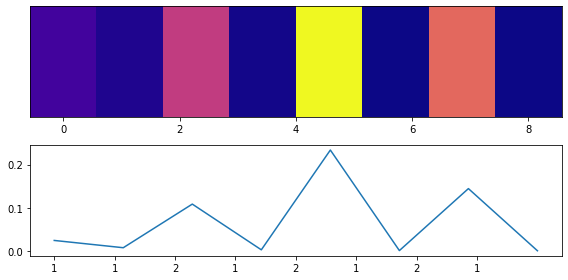

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


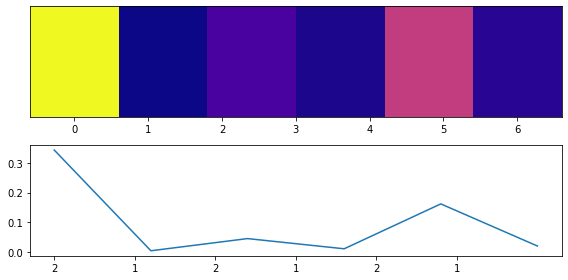

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


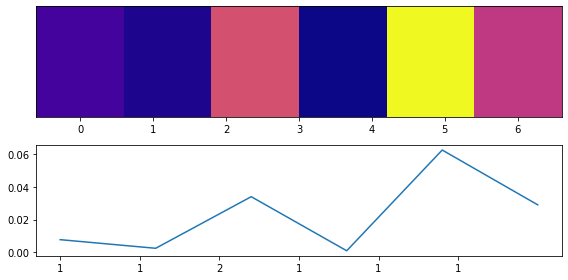

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


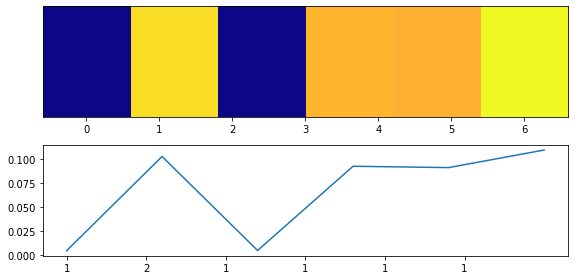

model prediction: 0 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


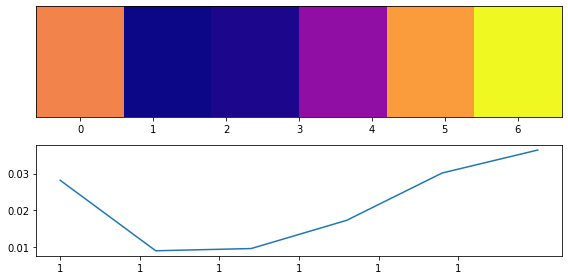

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


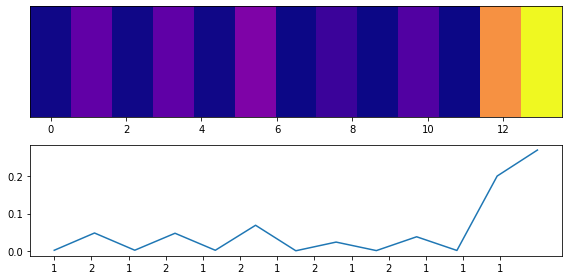

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


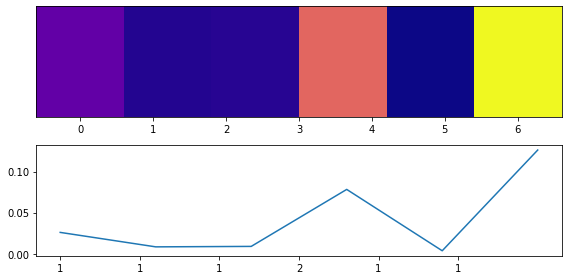

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


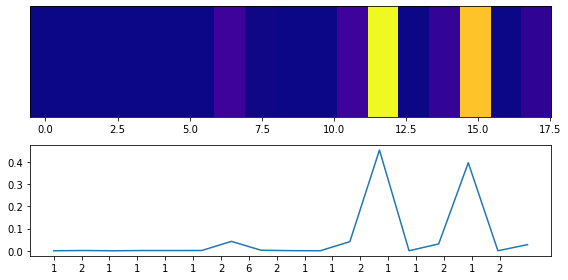

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


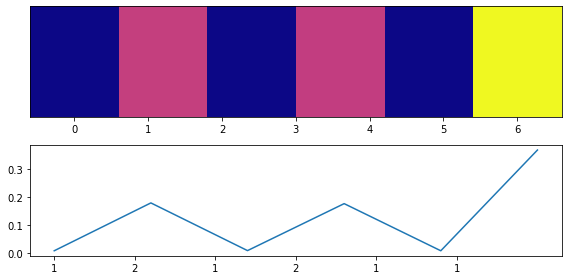

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


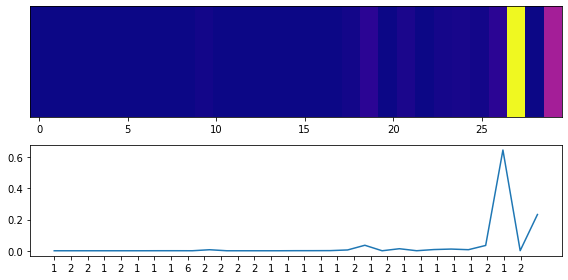

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


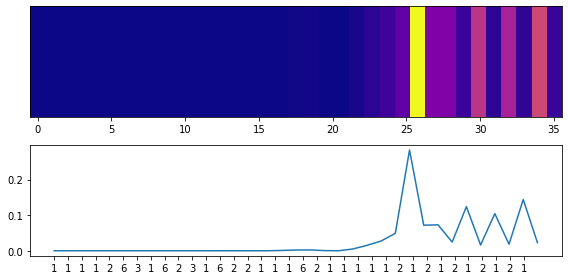

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


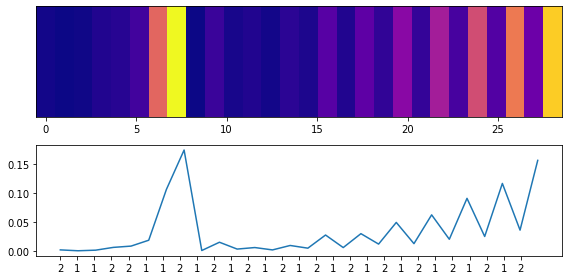

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


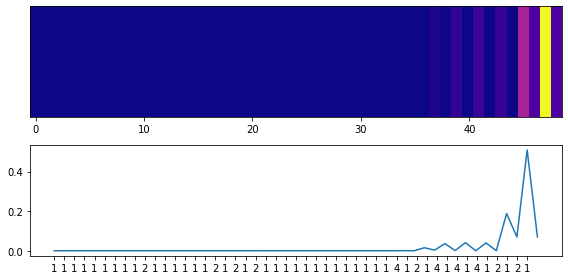

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


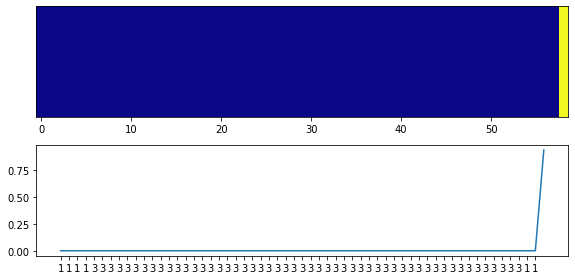

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


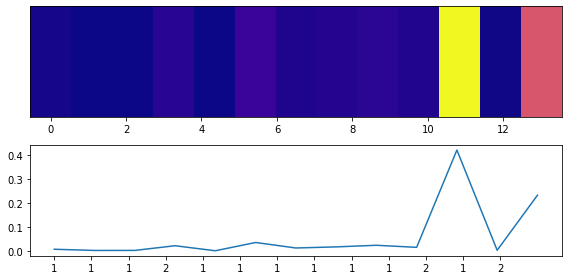

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


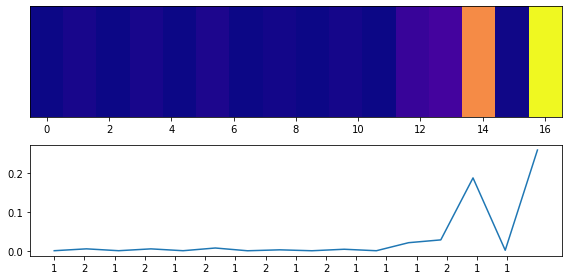

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


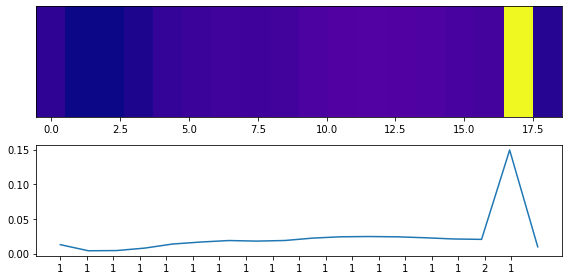

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


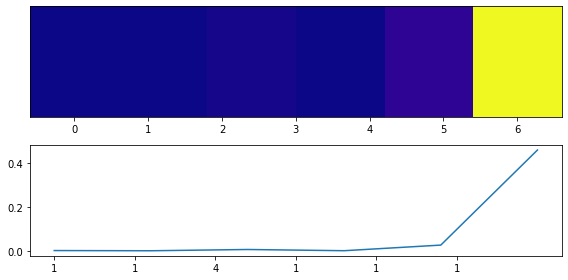

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


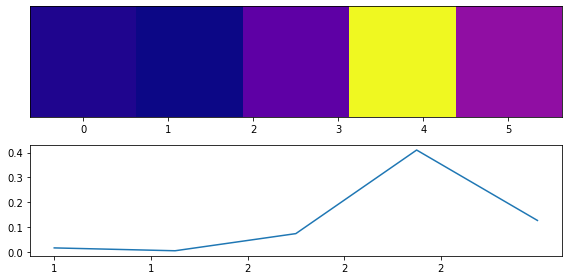

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


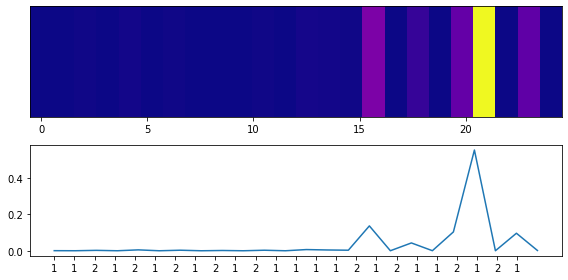

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


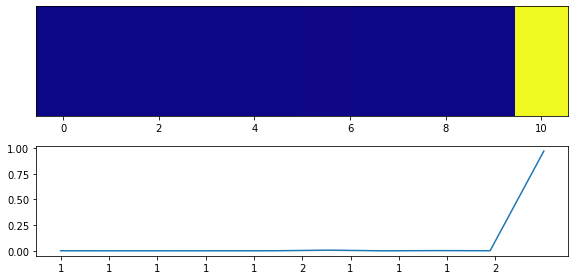

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


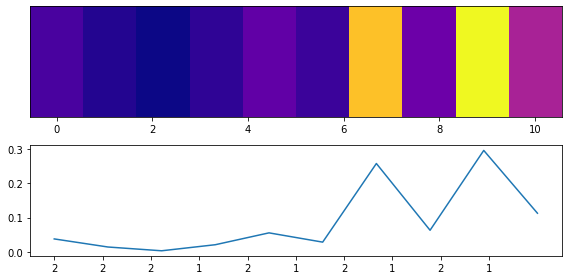

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


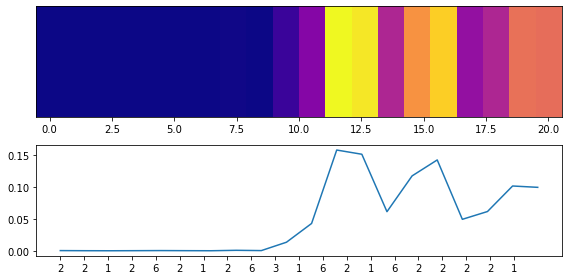

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


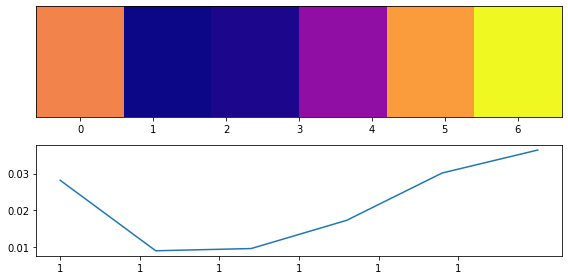

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


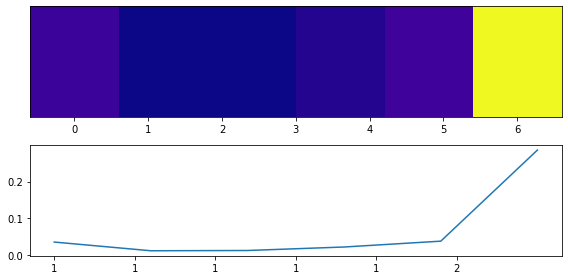

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


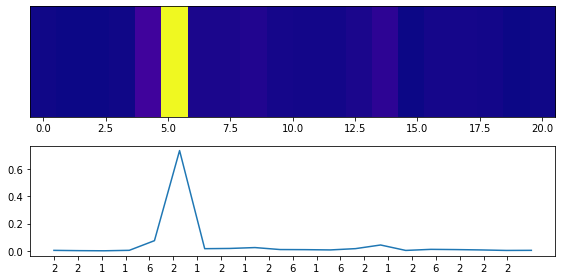

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


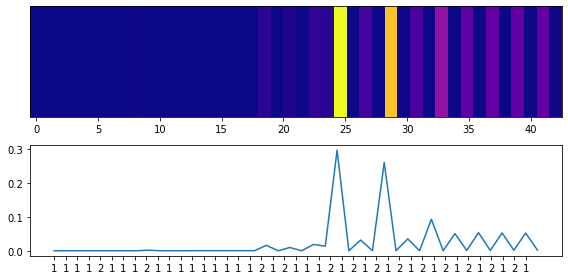

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


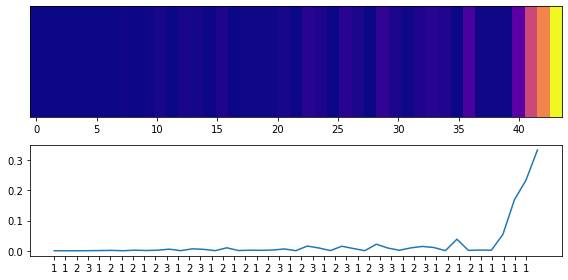

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


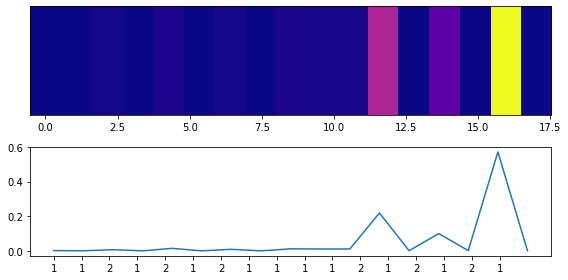

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


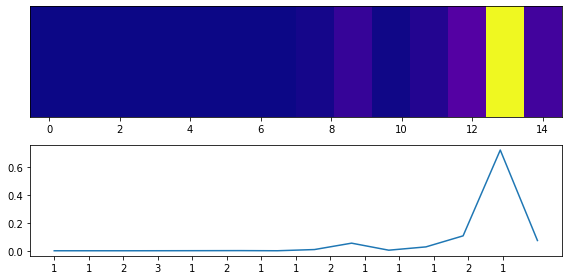

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


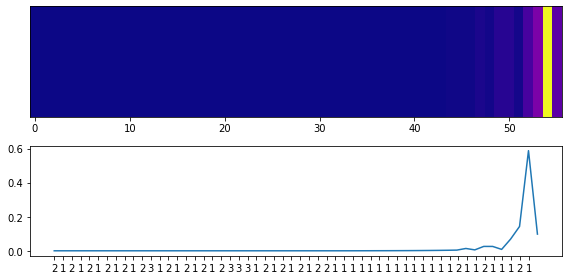

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


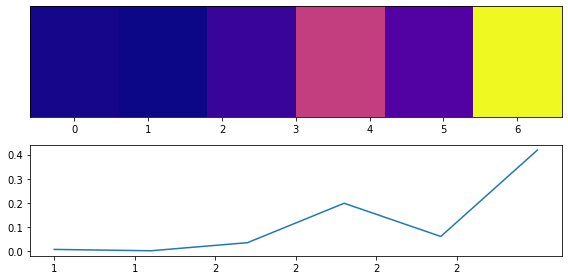

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


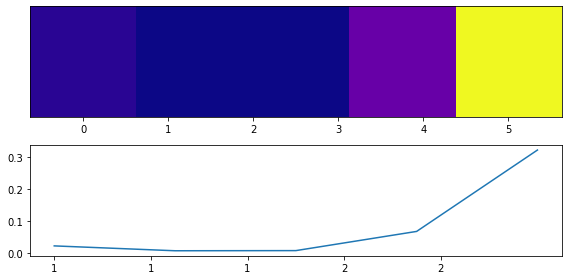

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


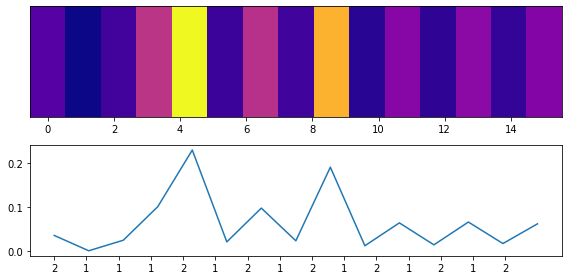

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


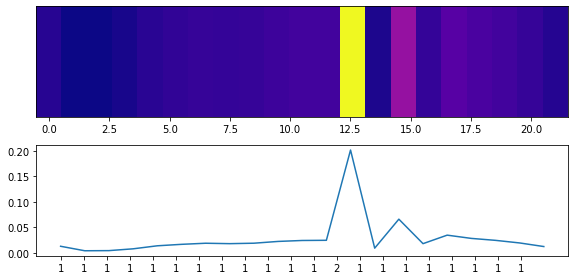

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


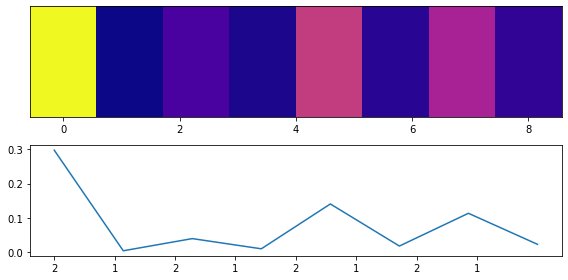

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


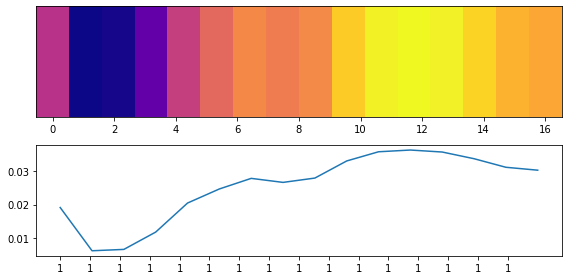

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


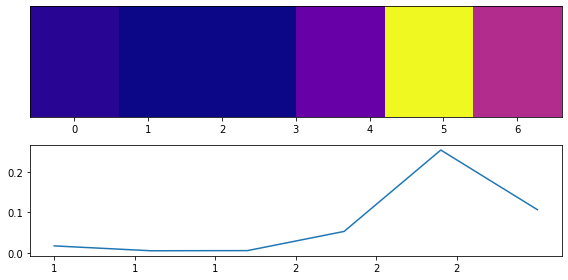

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


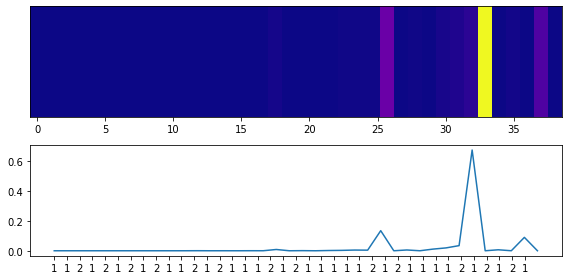

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


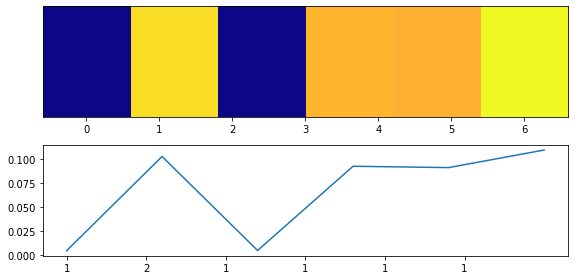

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


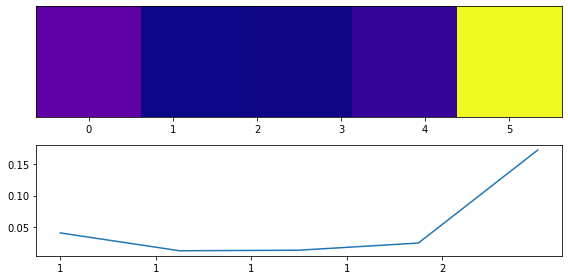

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


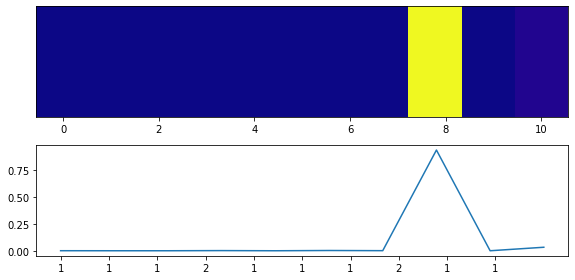

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


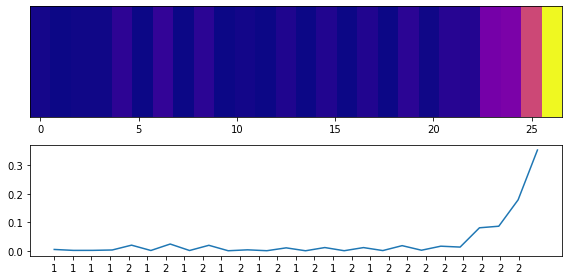

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


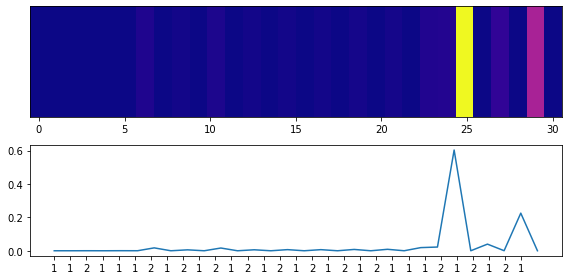

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


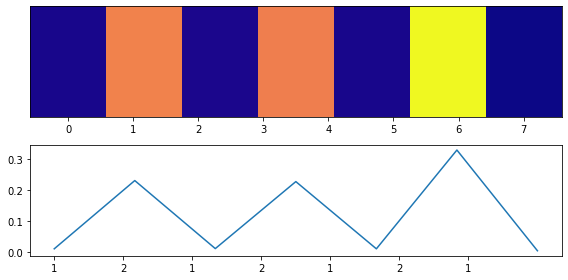

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


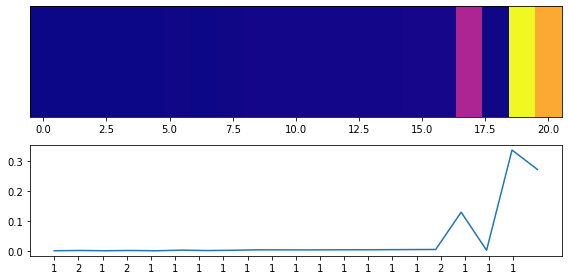

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


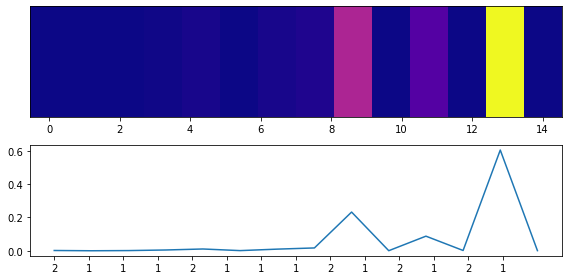

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


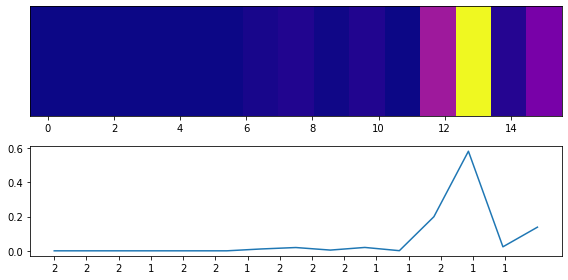

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


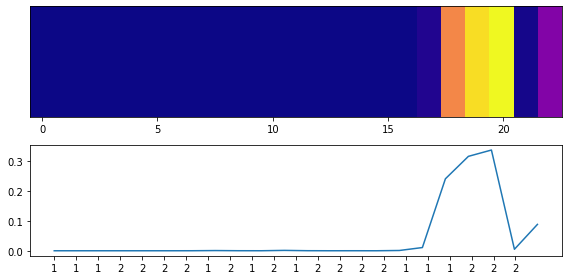

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


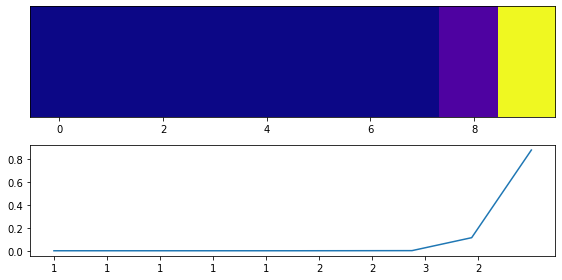

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


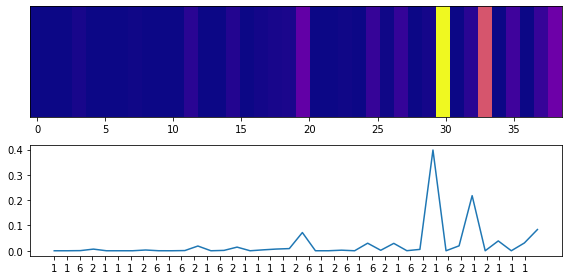

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


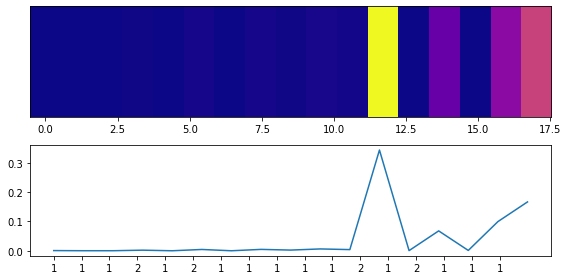

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


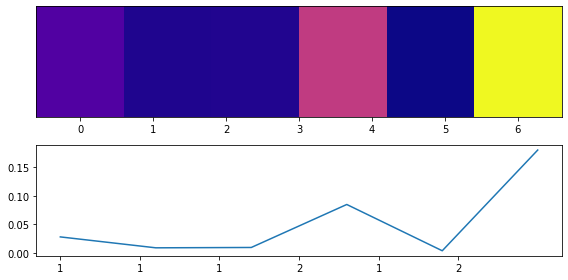

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


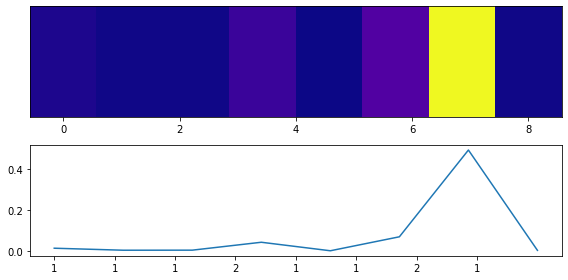

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


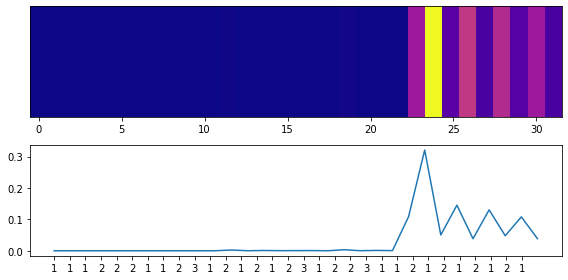

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


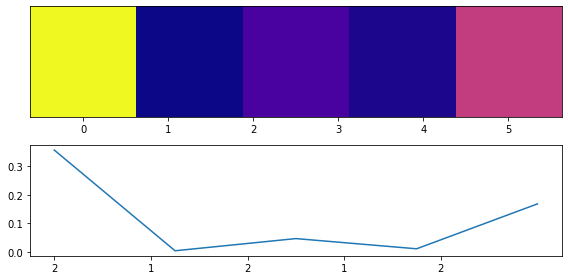

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


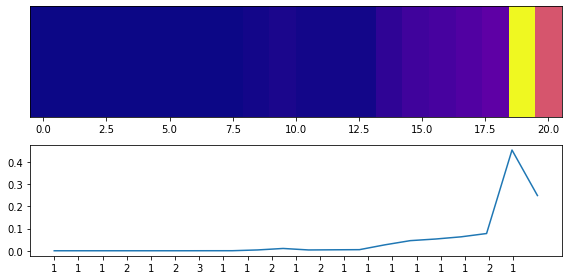

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


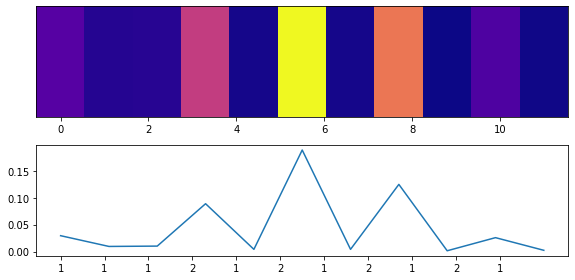

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


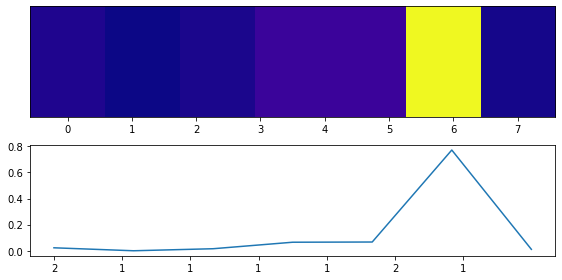

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


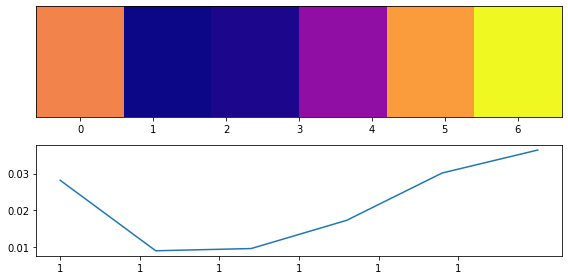

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


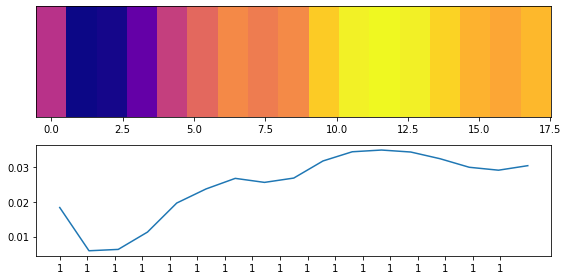

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


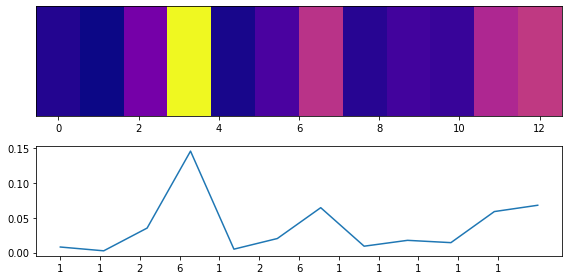

model prediction: 0 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


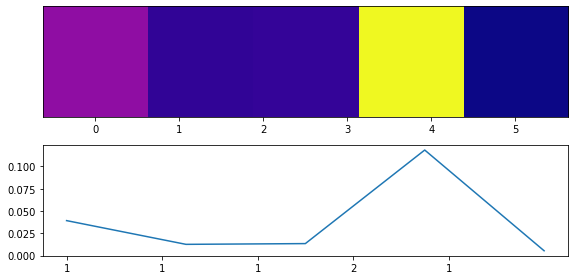

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


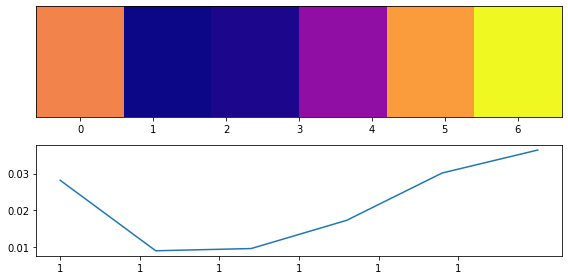

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


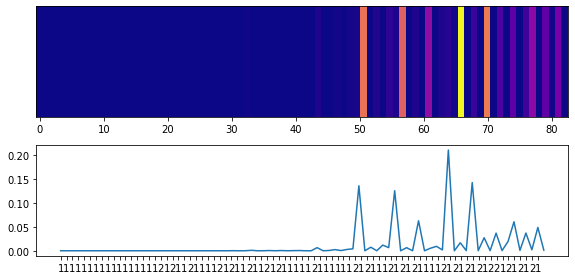

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


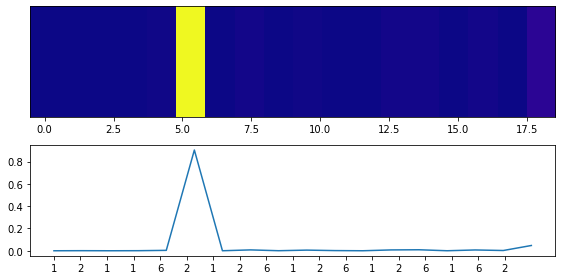

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


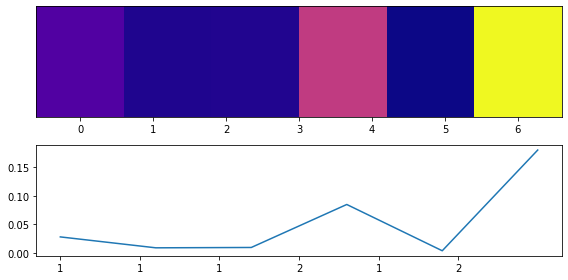

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


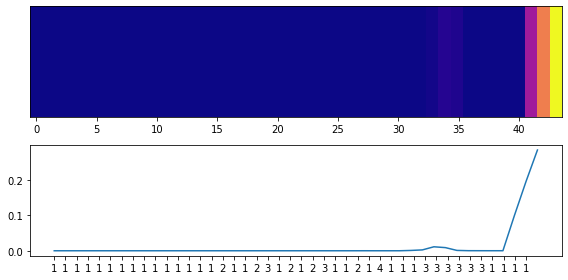

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


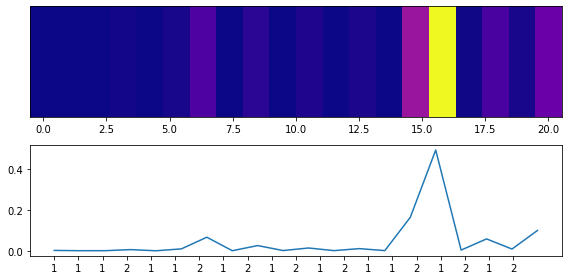

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


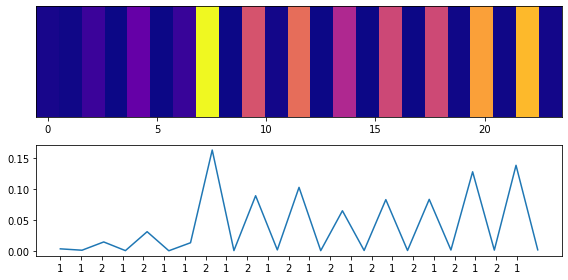

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


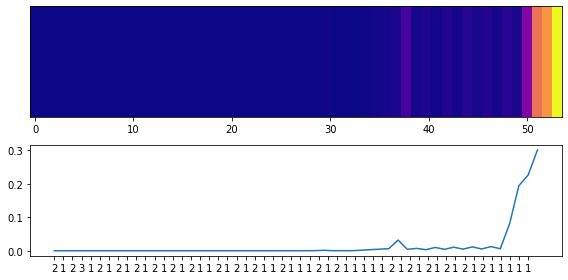

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


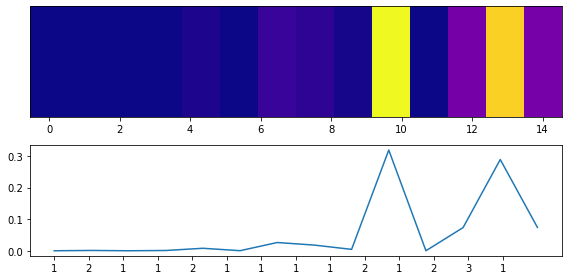

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


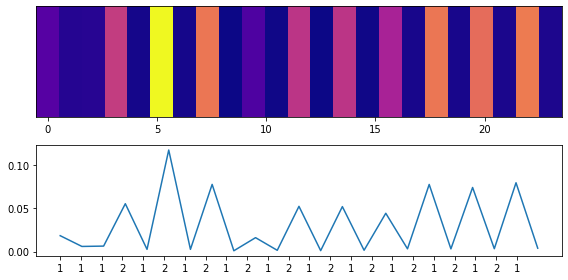

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


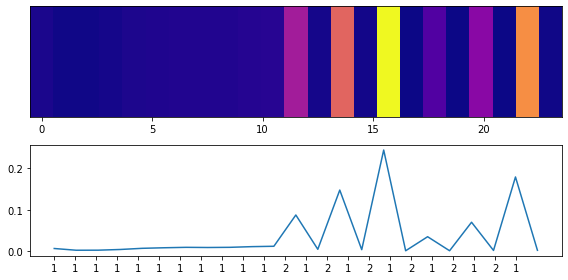

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


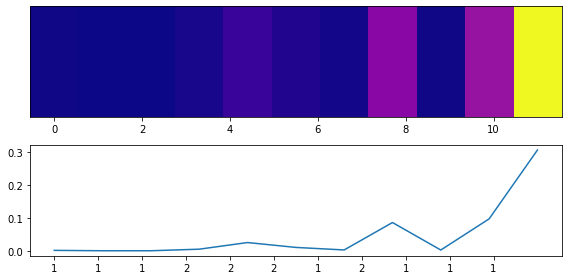

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


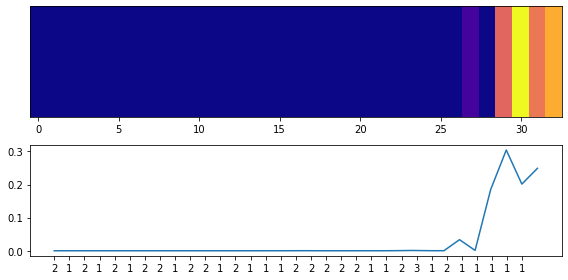

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


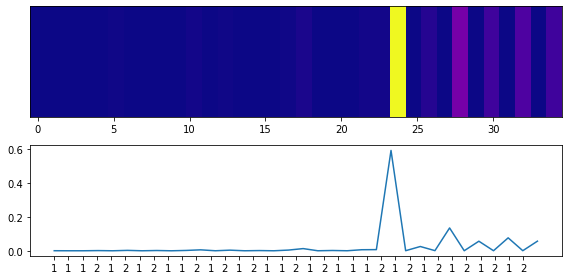

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


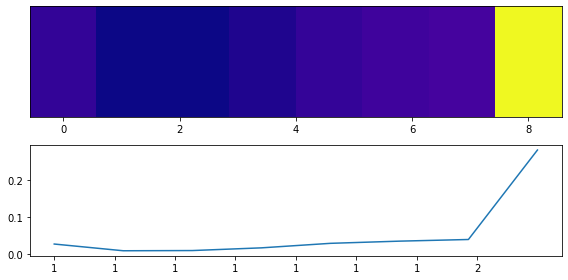

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


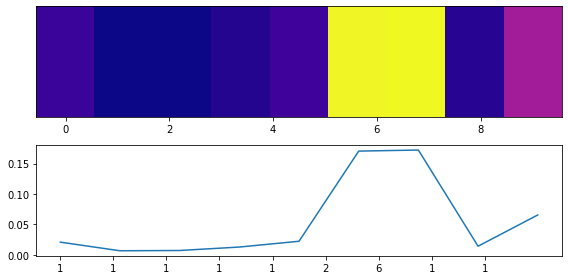

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


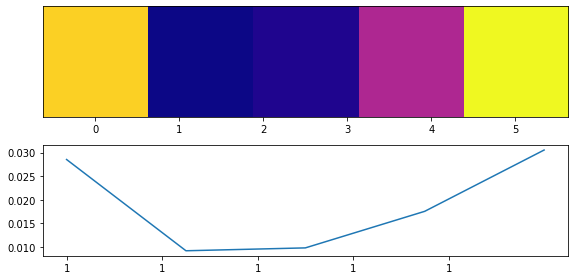

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


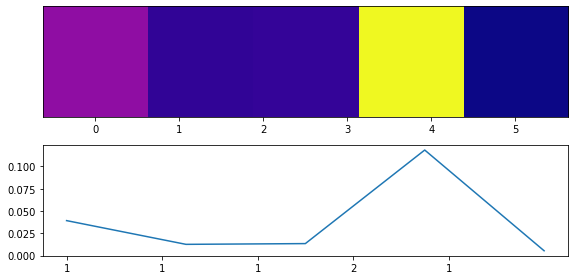

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


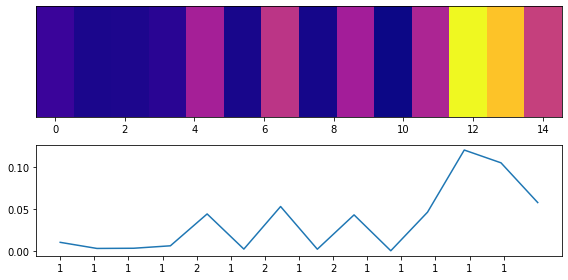

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


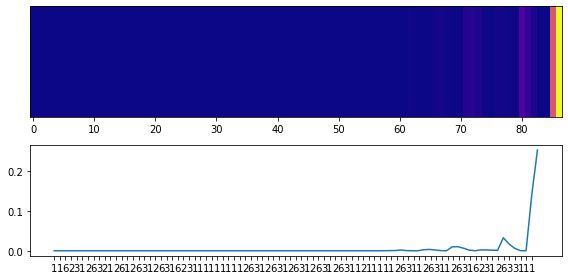

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


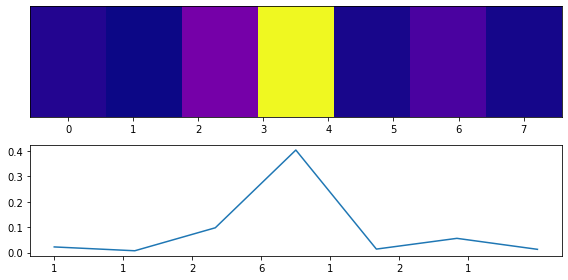

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


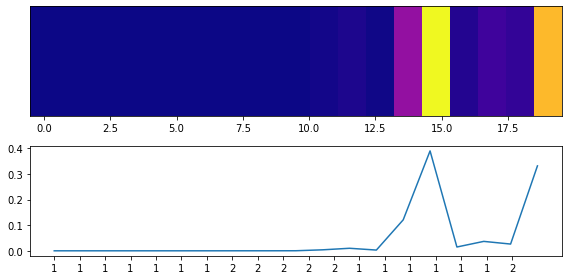

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


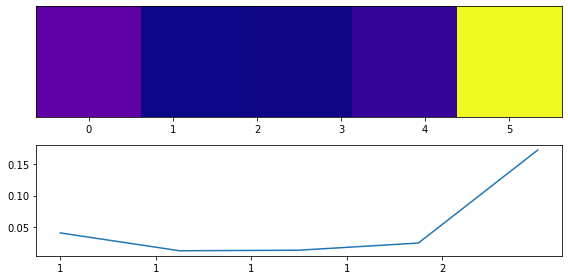

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


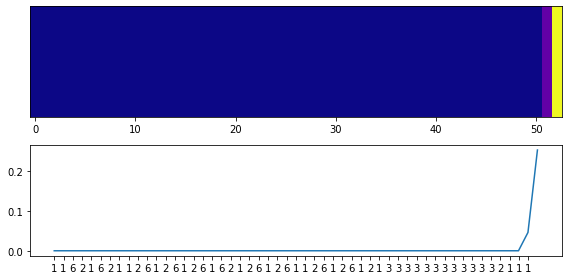

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


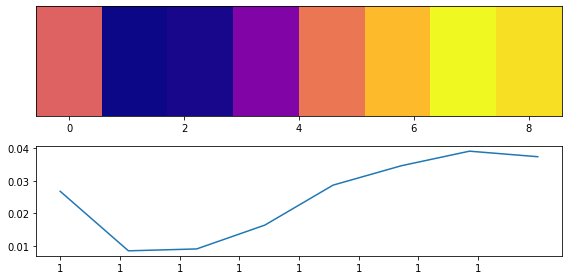

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


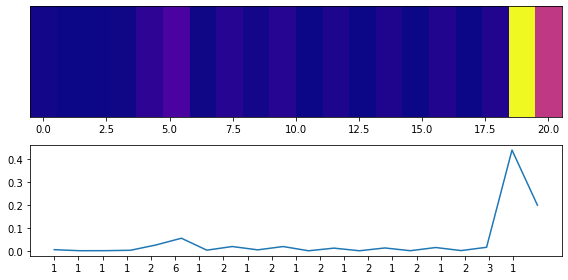

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


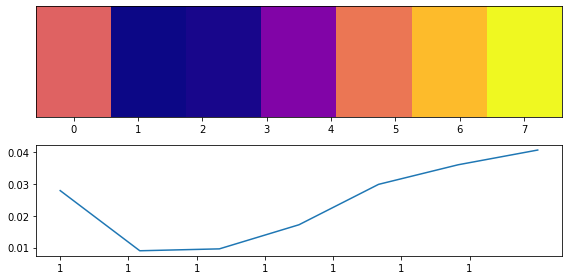

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


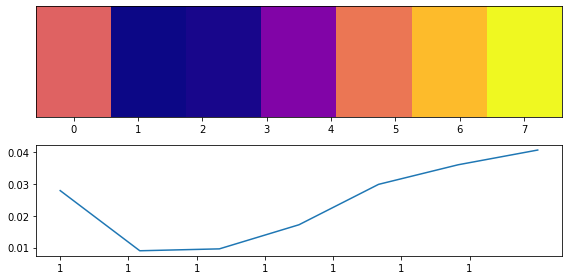

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


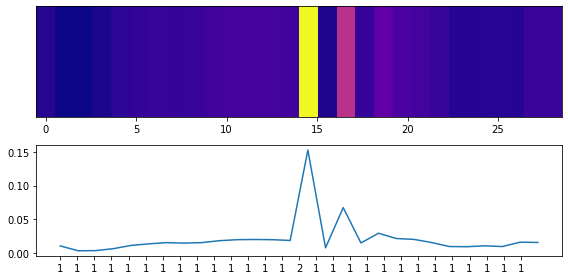

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


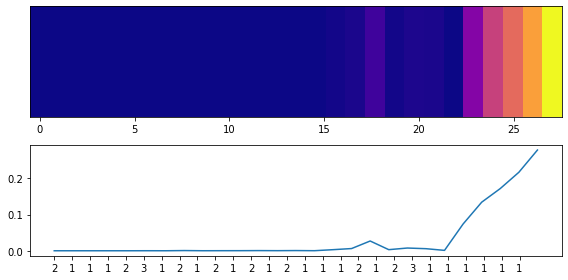

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


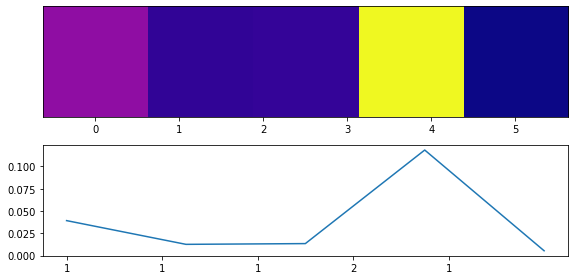

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


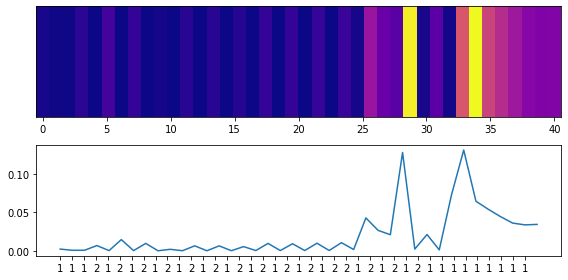

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


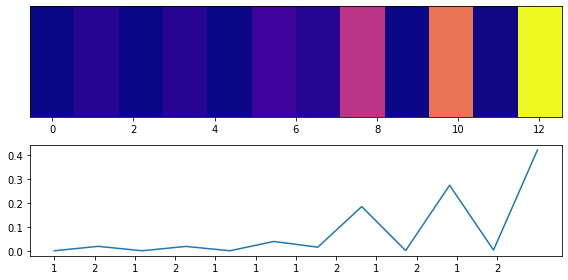

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


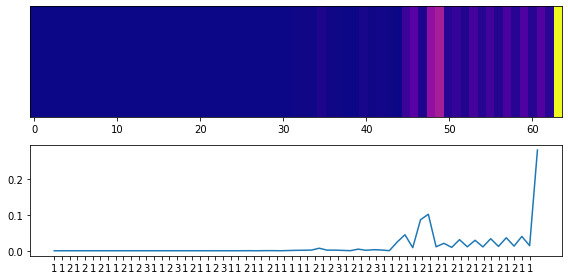

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


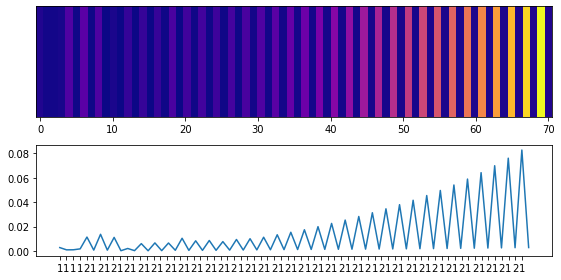

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


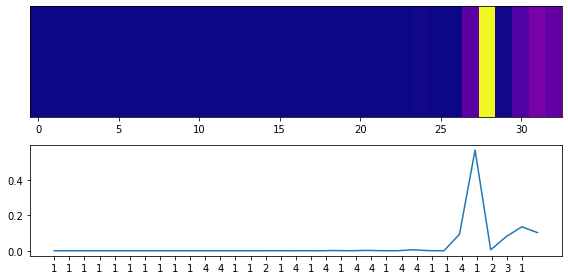

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


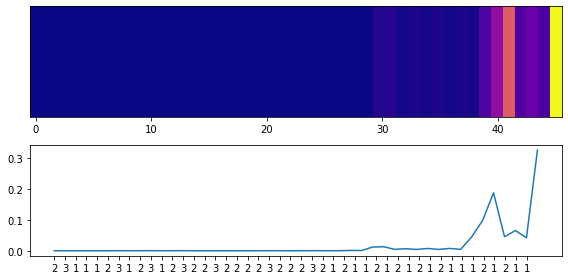

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


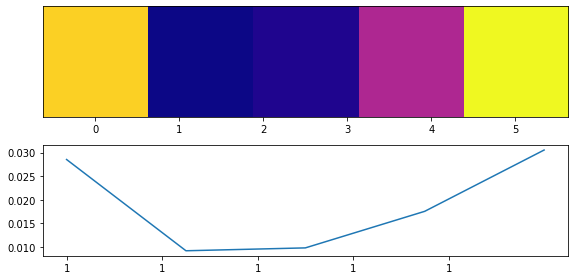

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


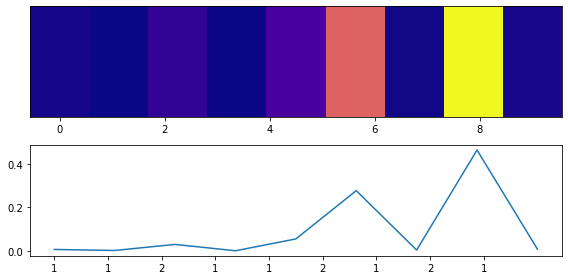

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


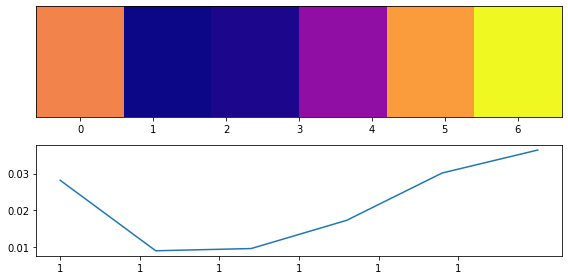

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


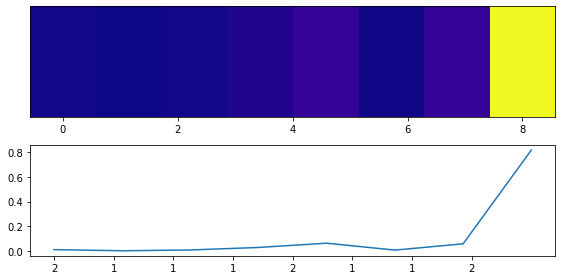

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


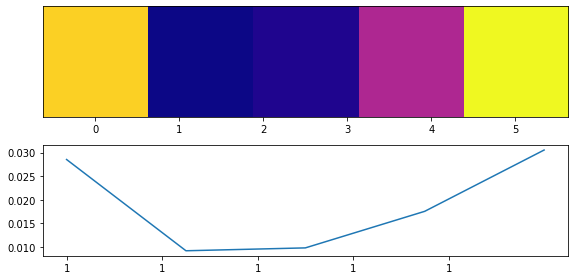

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


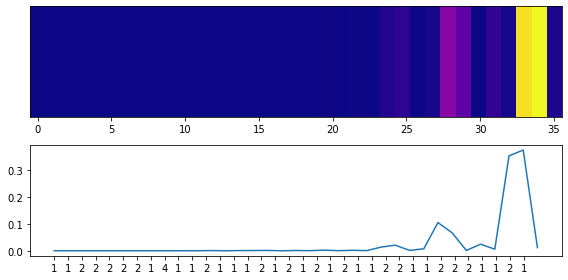

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


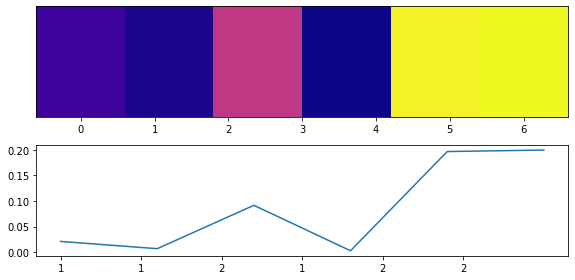

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


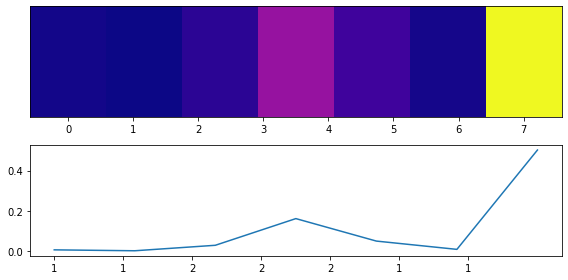

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


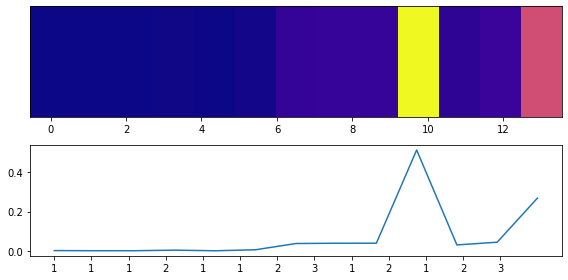

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


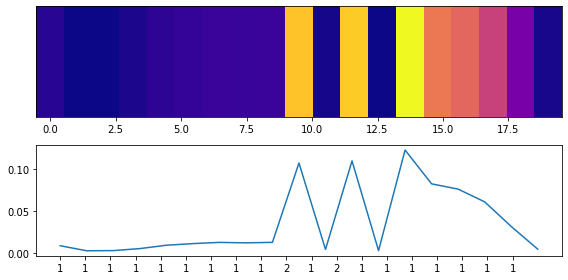

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


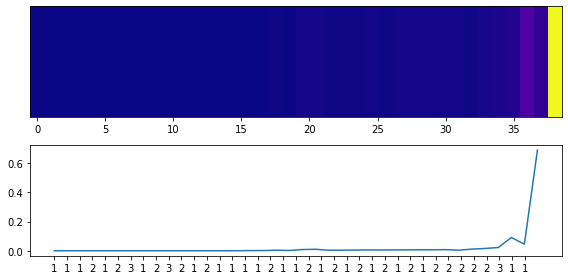

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


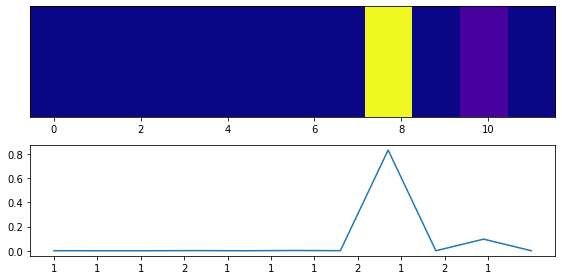

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


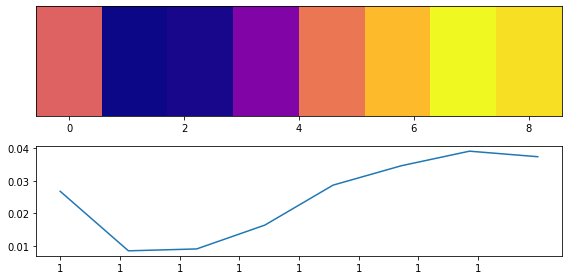

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


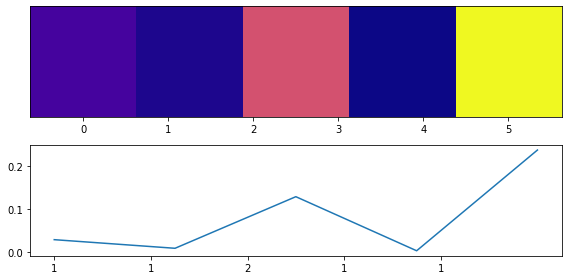

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


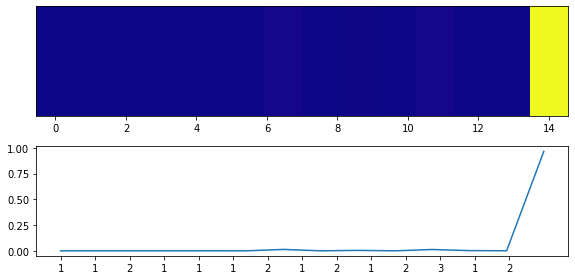

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


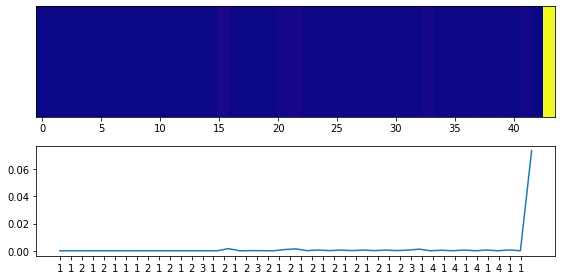

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


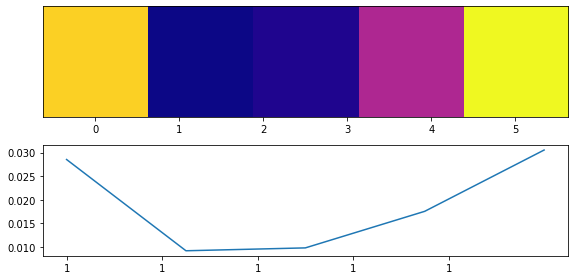

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


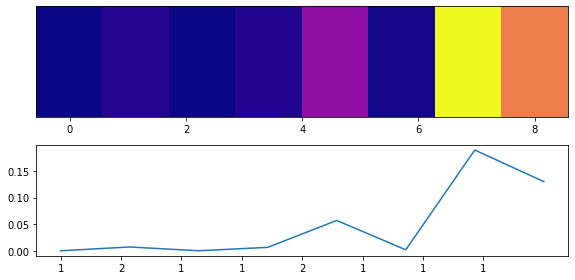

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


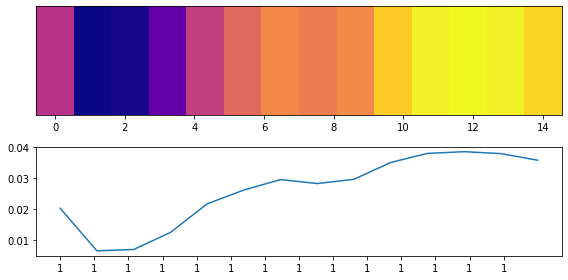

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


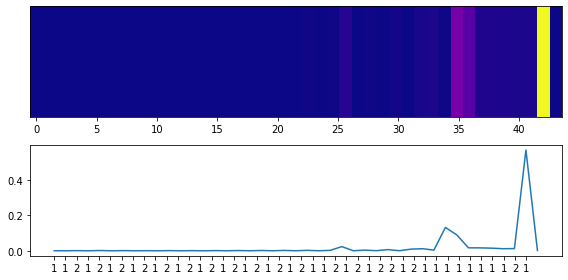

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


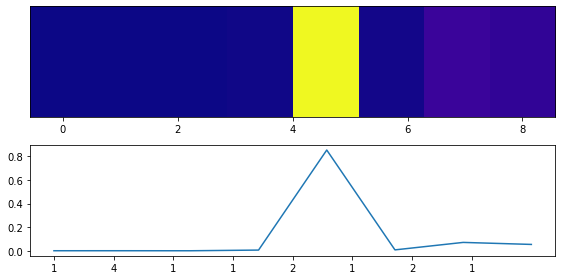

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


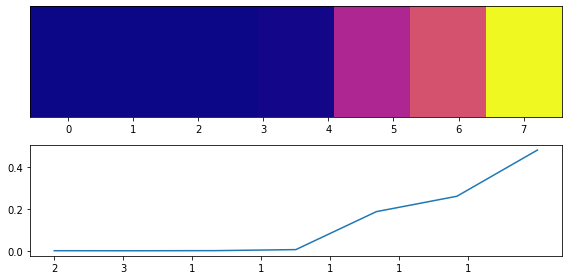

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


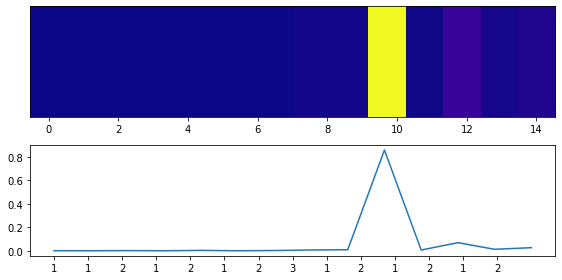

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


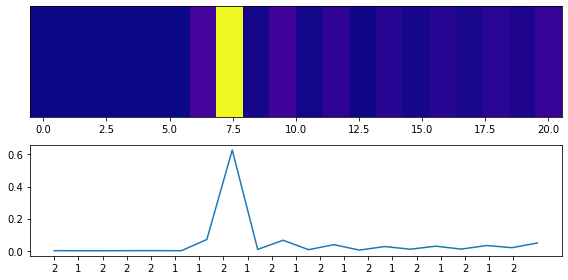

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


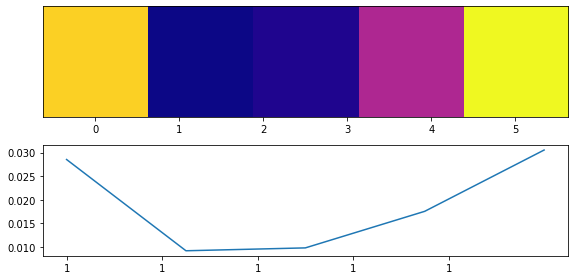

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


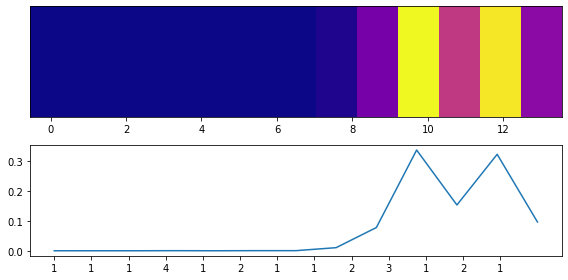

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


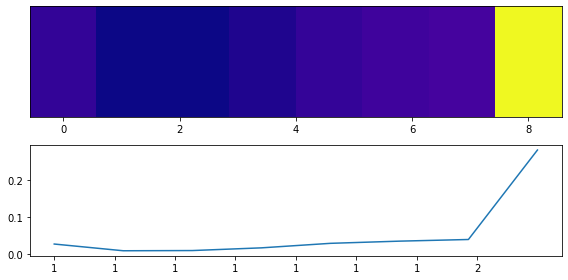

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


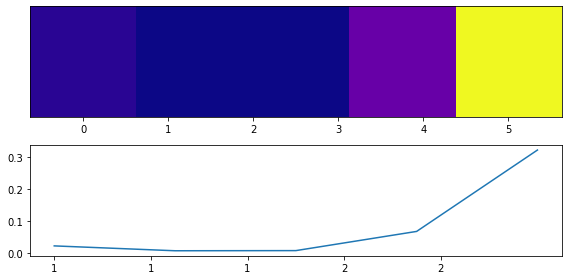

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


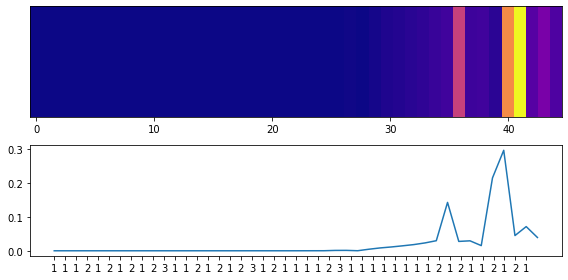

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


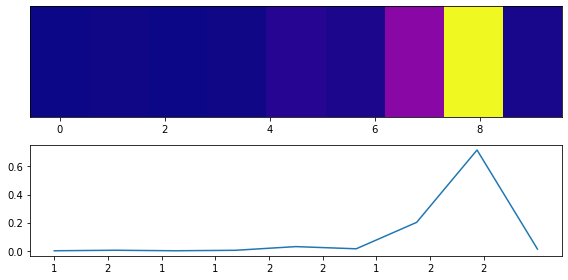

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


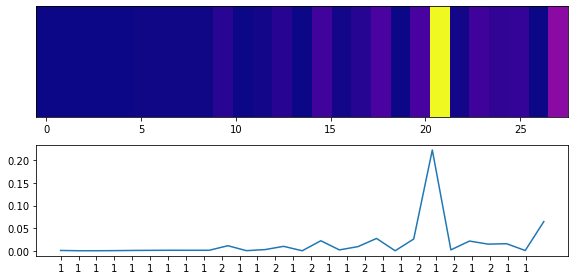

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


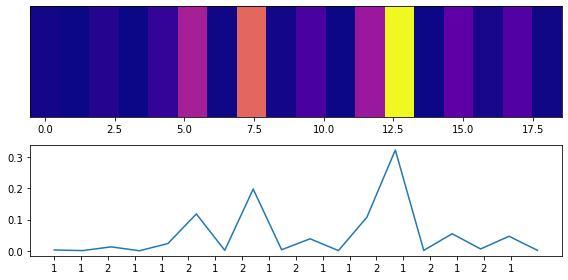

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


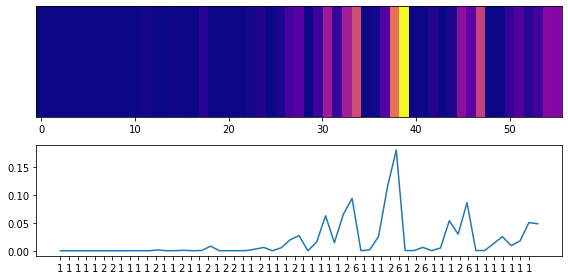

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


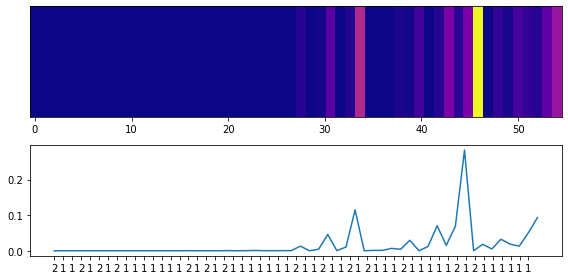

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


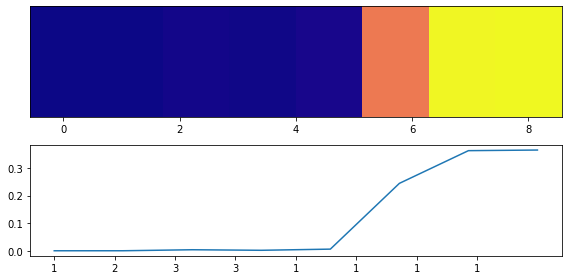

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


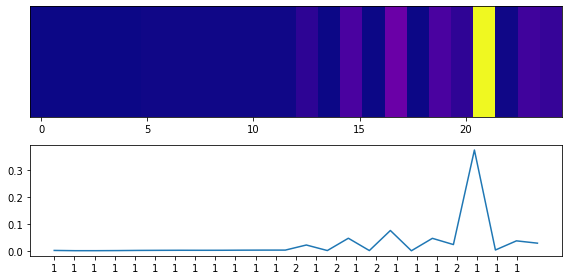

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


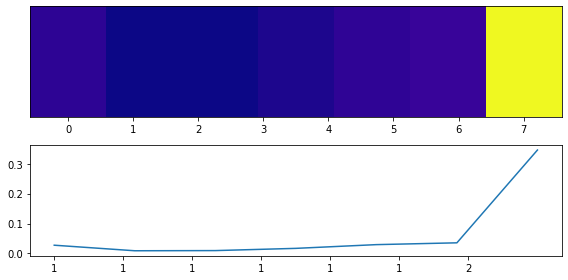

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


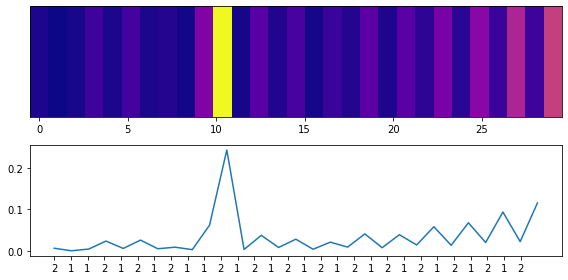

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


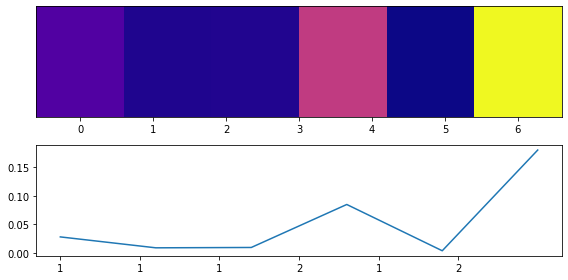

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


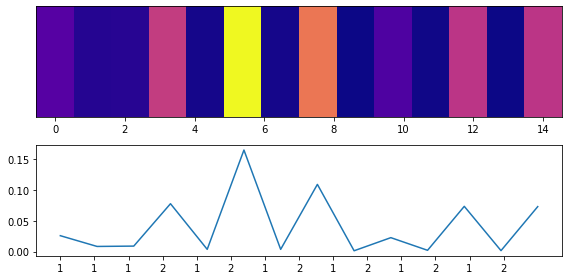

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


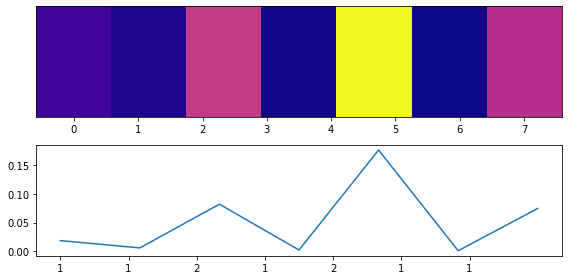

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


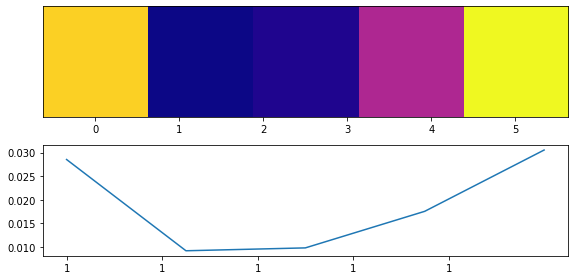

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


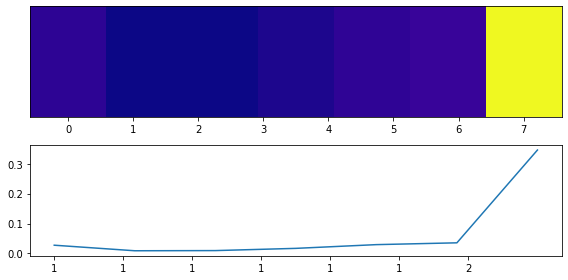

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


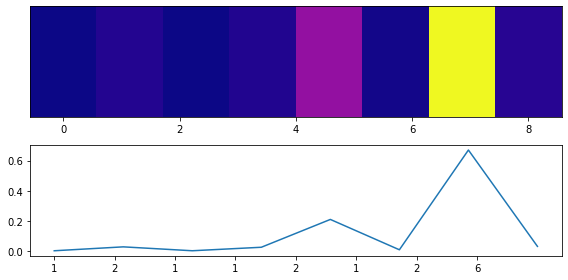

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


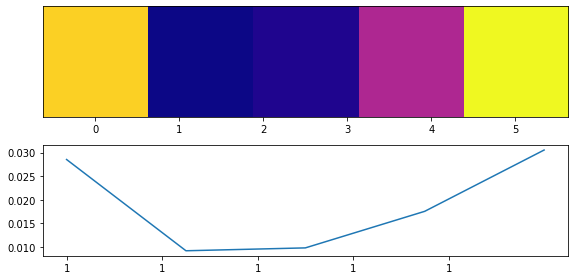

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


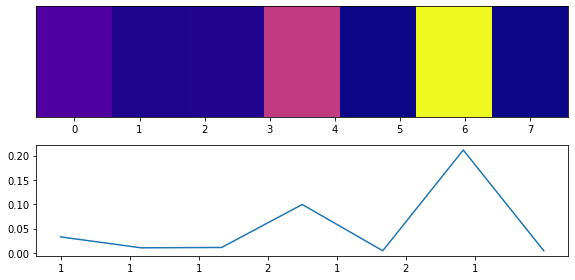

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


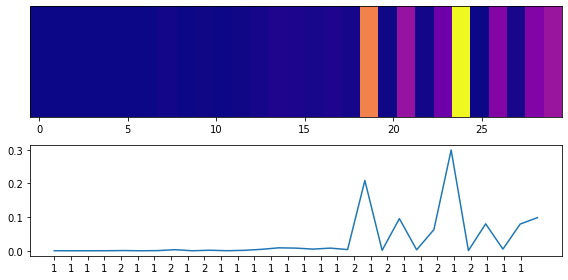

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


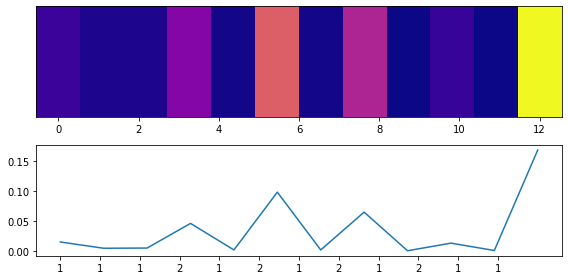

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


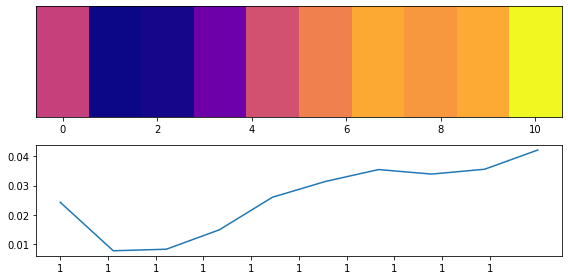

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


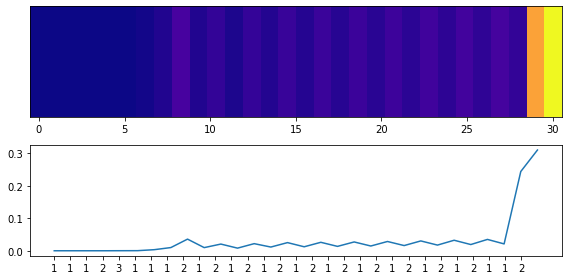

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


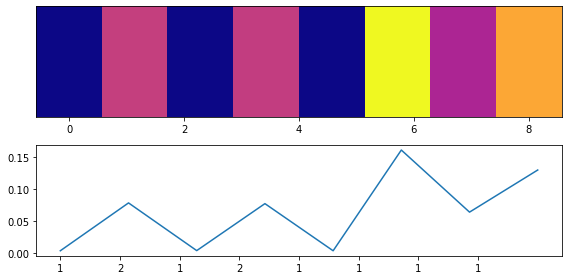

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


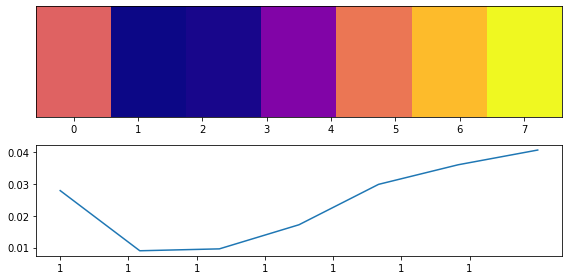

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


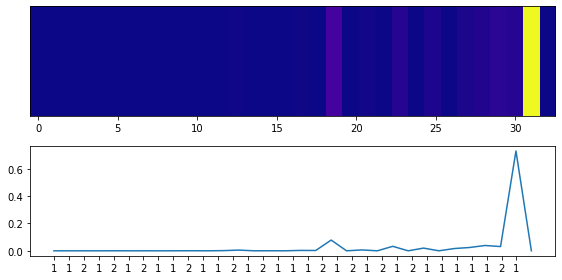

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


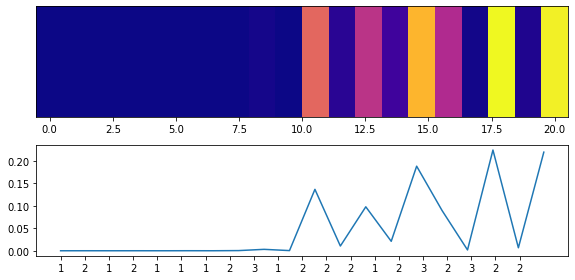

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


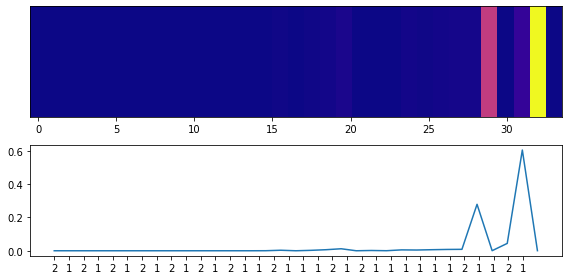

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


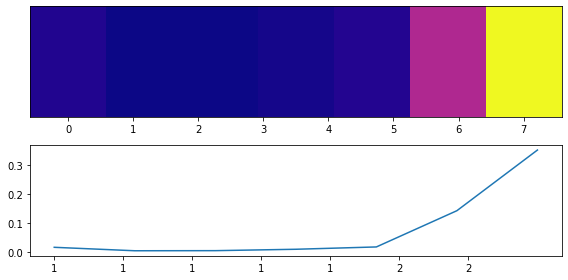

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


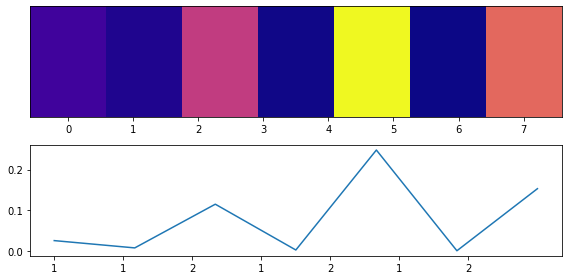

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


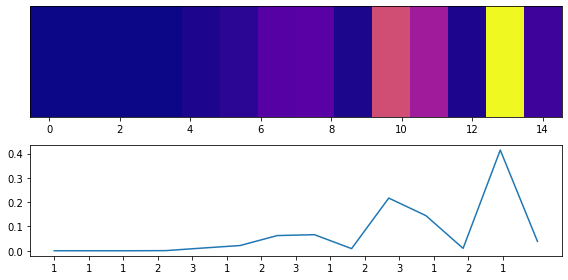

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


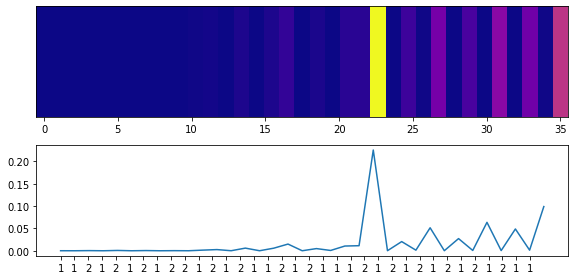

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


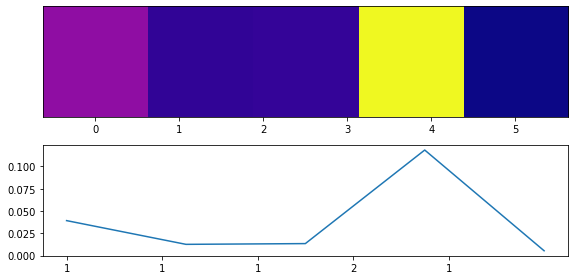

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


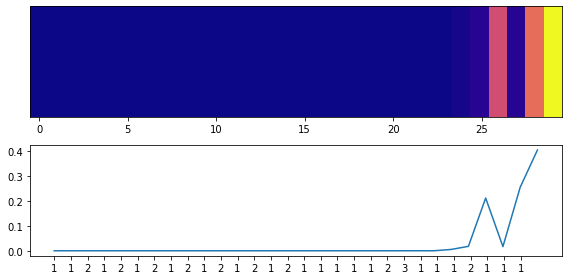

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


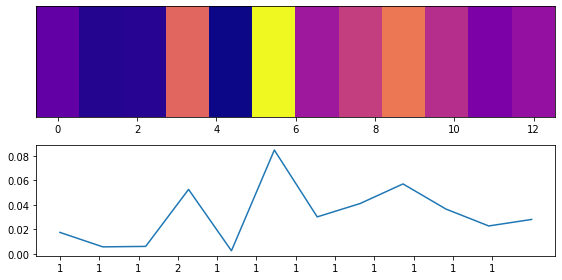

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


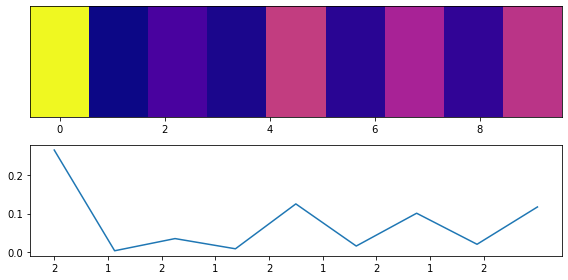

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


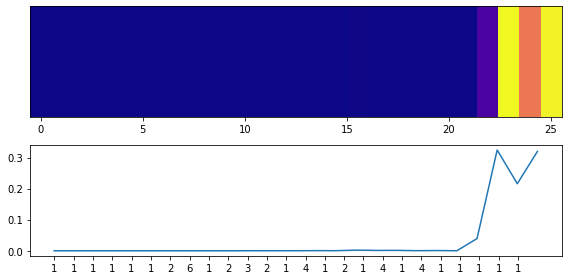

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


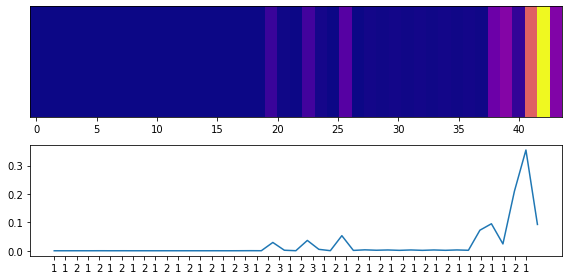

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


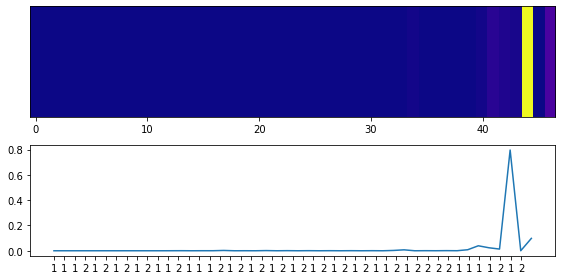

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


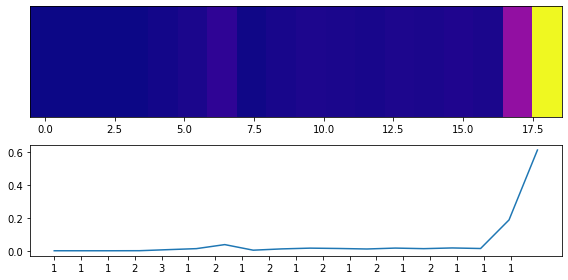

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


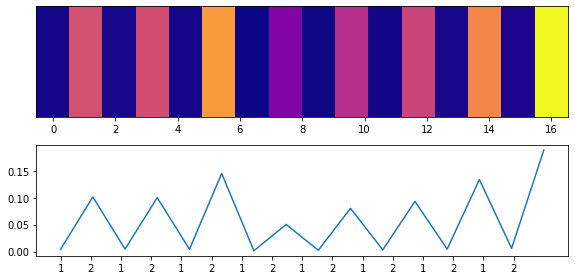

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


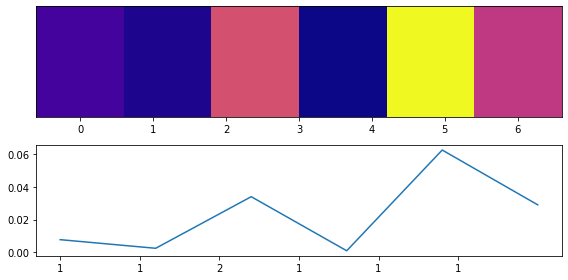

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


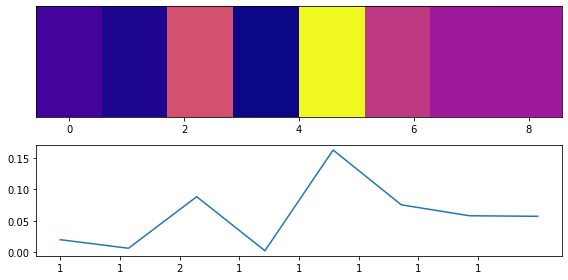

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


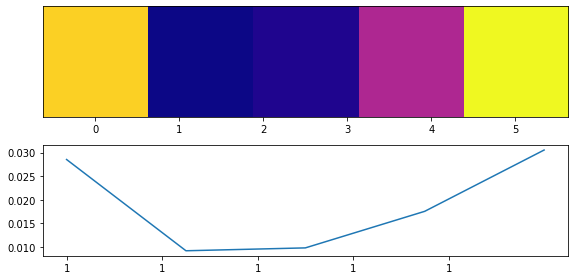

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


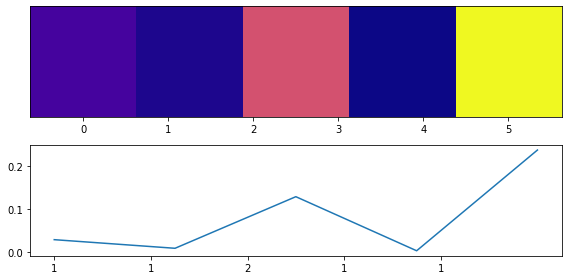

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


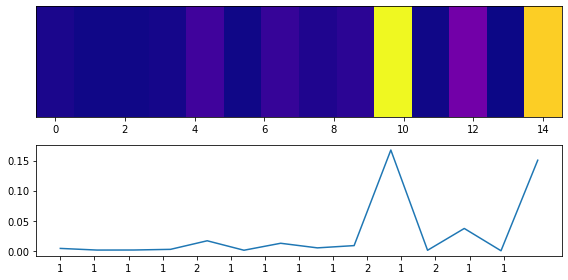

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


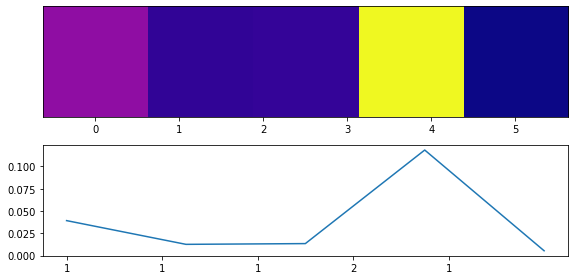

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


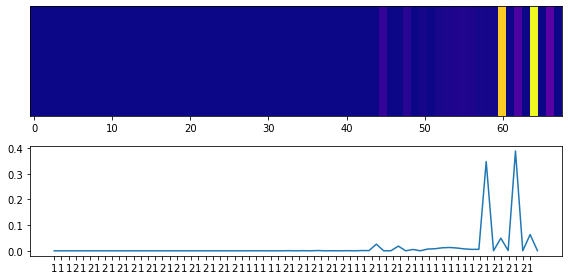

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


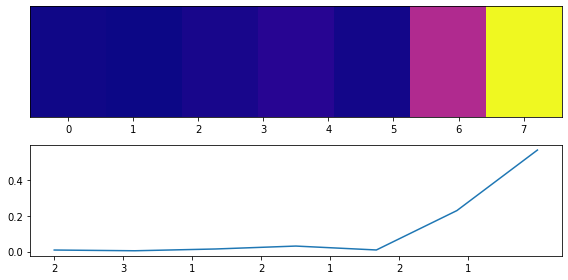

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


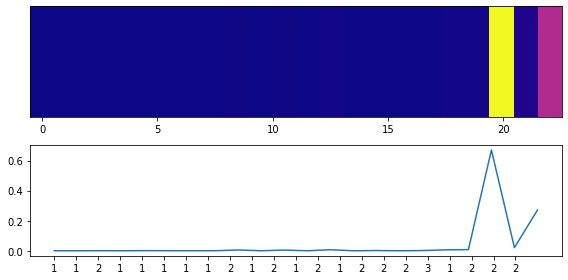

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


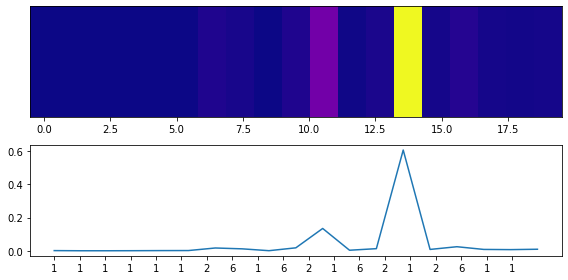

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


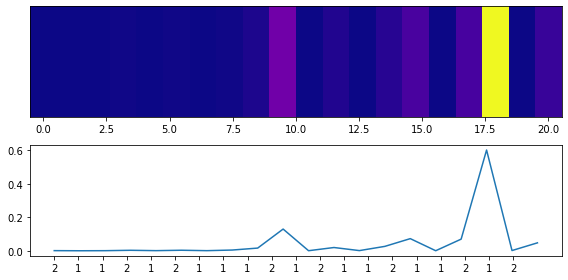

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


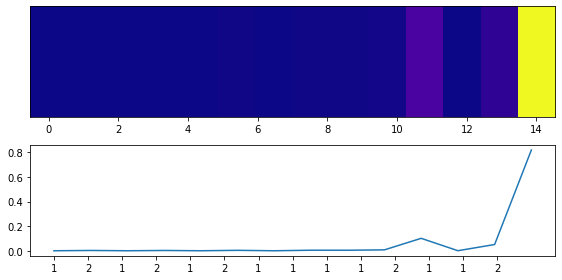

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


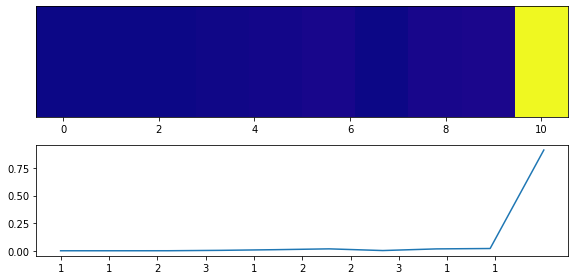

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


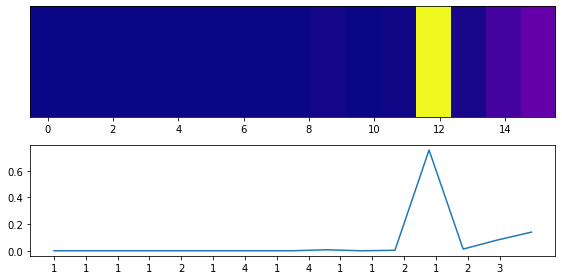

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


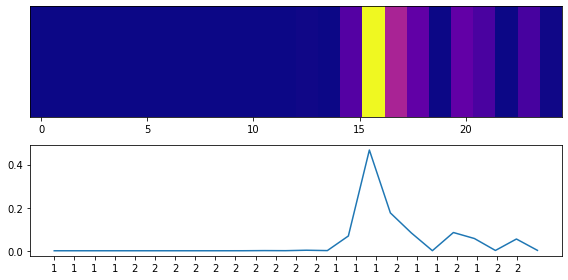

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


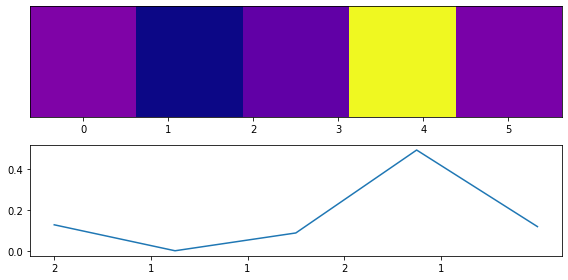

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


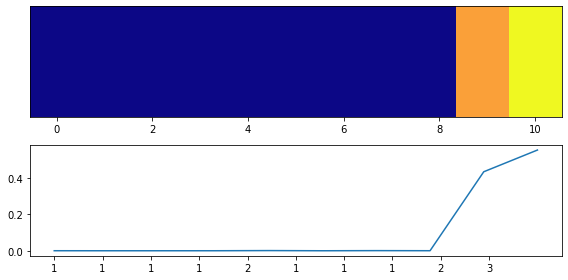

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


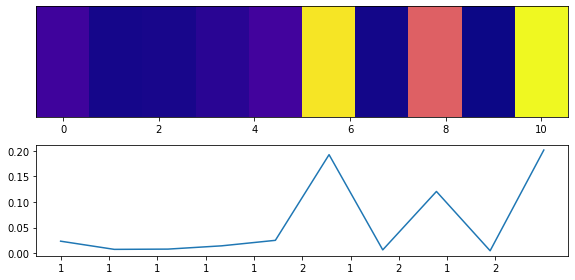

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


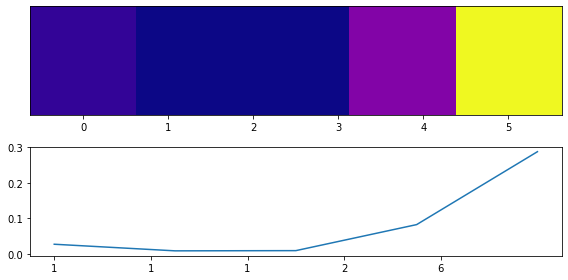

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


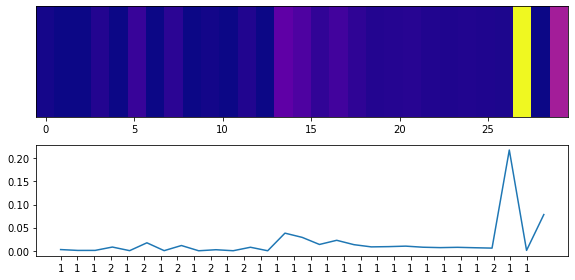

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


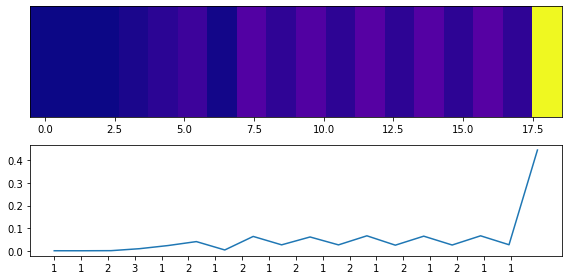

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


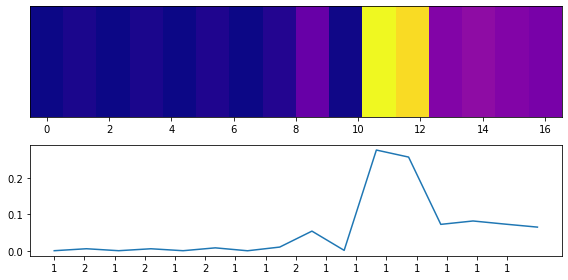

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


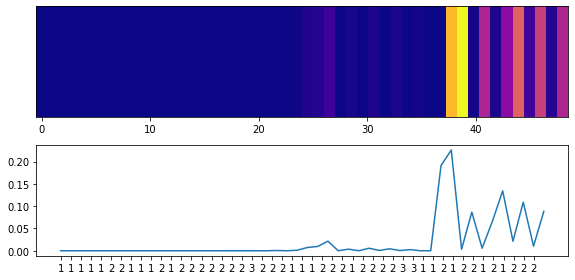

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


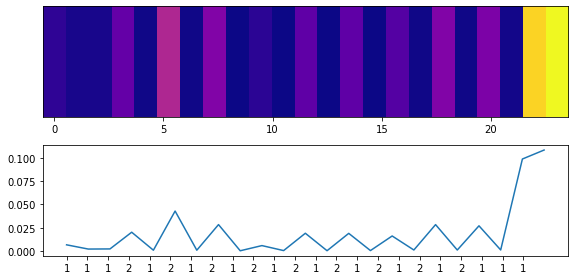

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


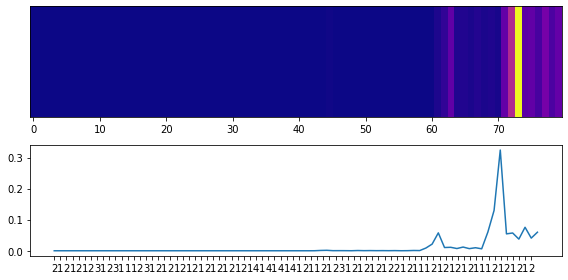

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


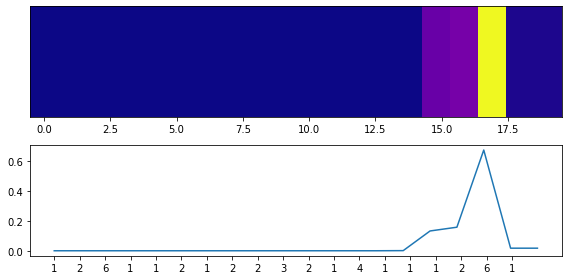

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


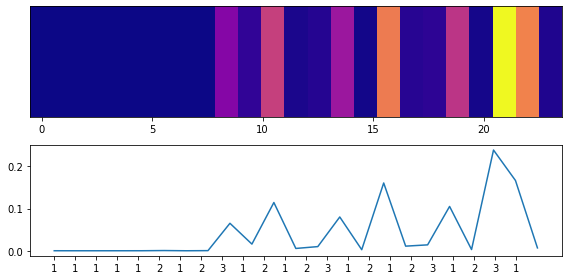

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


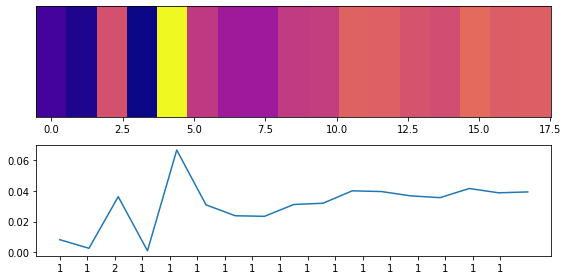

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


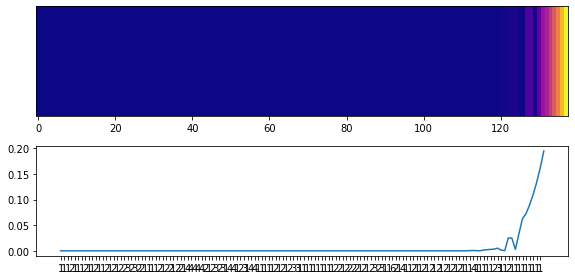

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


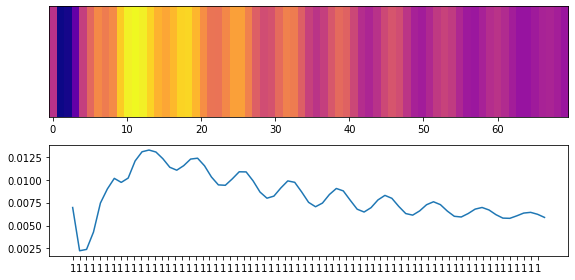

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


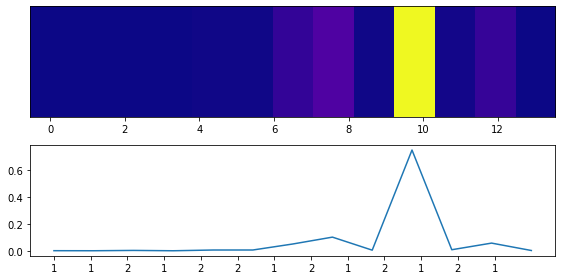

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


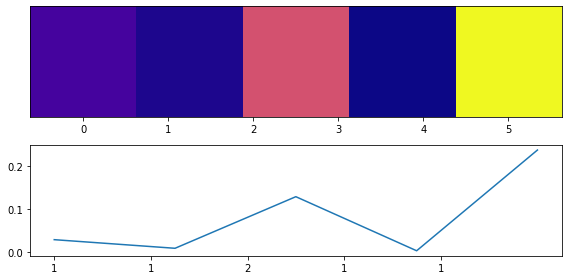

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


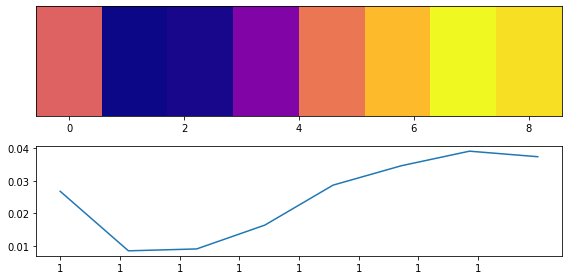

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


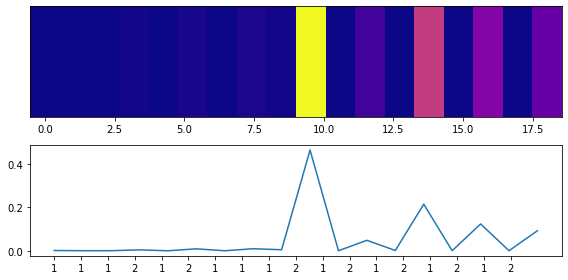

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


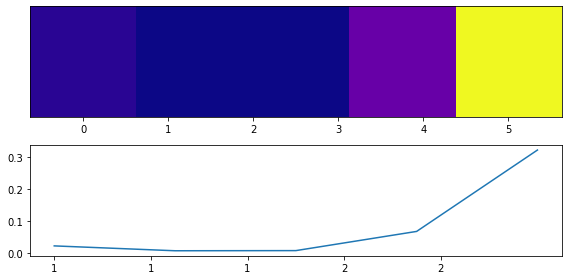

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


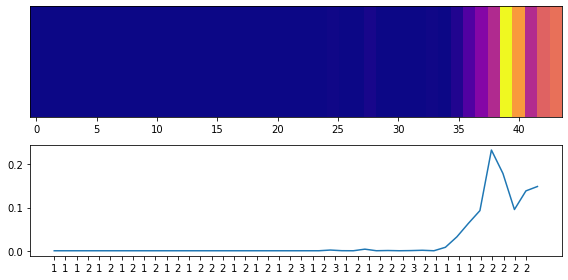

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


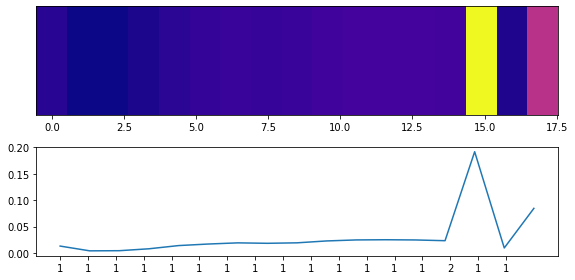

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


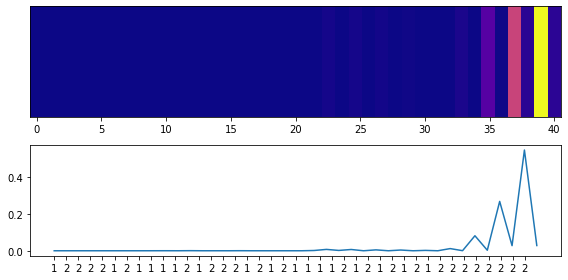

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


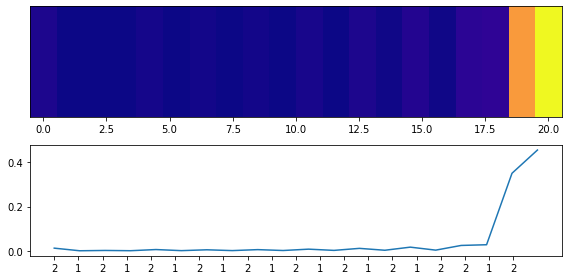

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


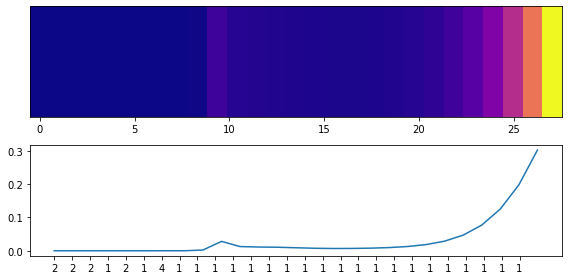

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


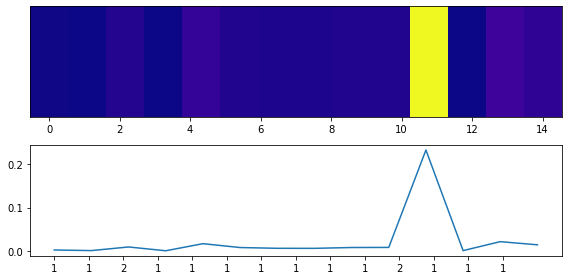

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


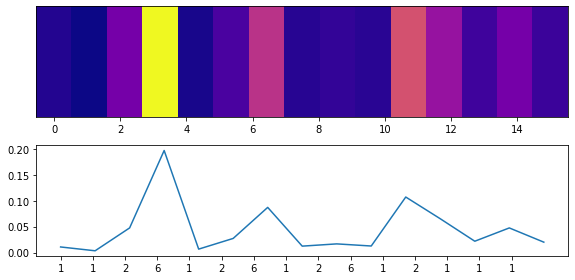

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


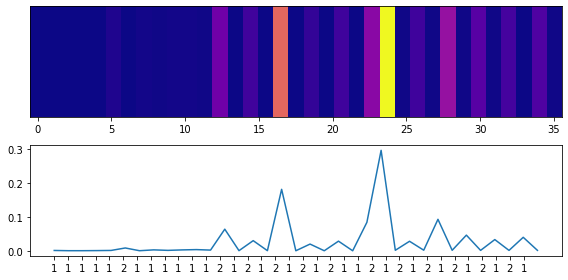

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


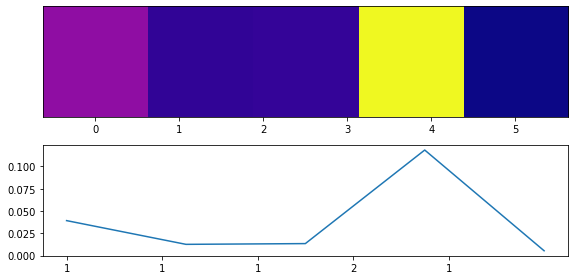

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


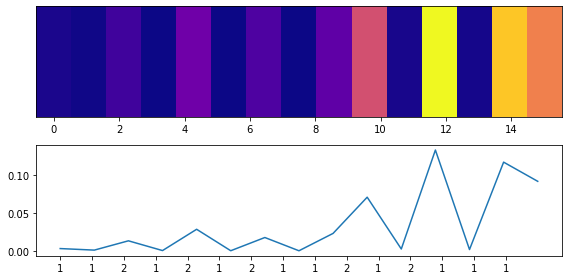

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


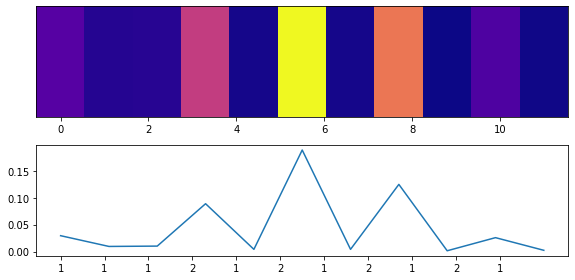

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


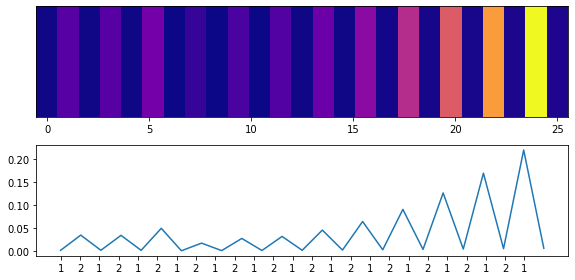

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


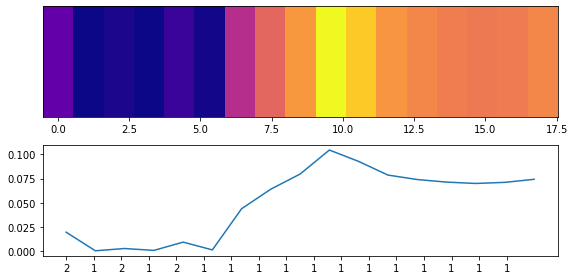

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


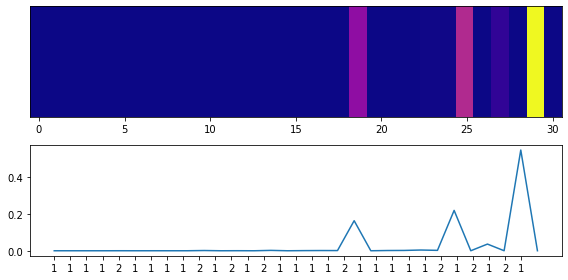

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


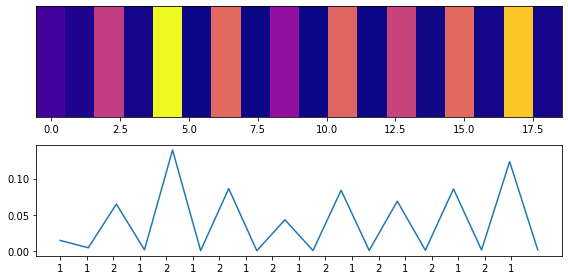

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


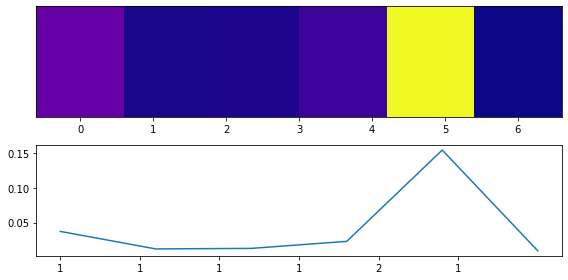

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


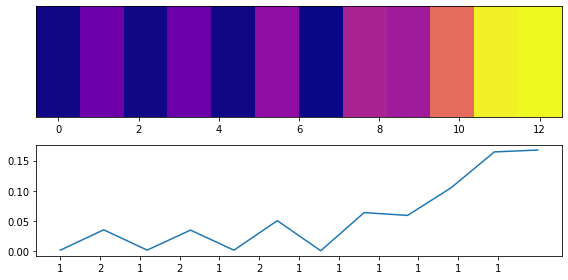

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


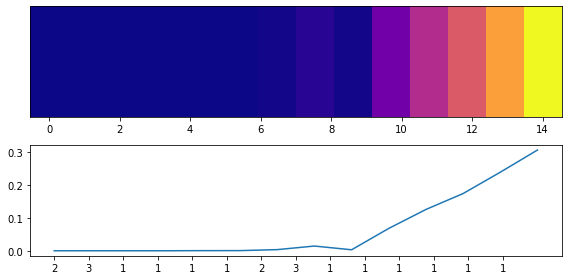

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


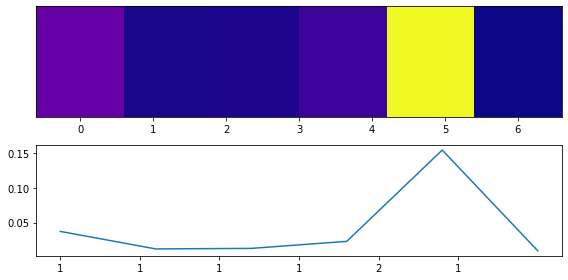

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


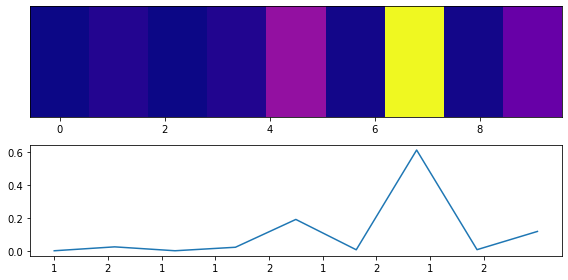

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


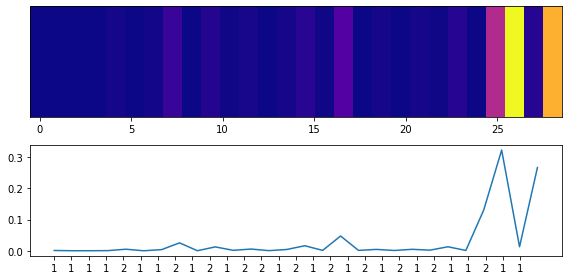

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


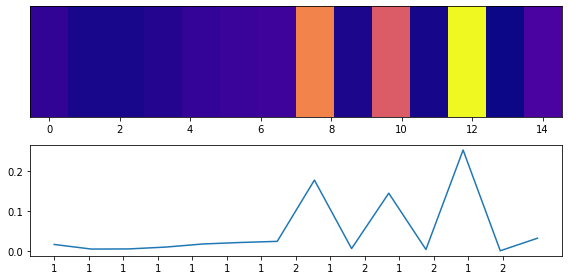

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


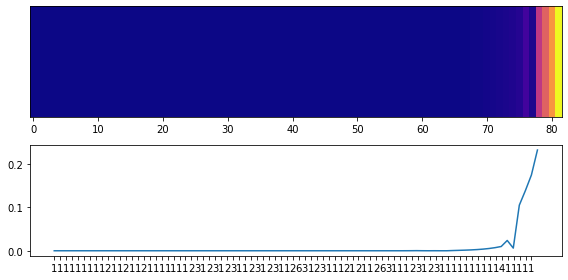

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


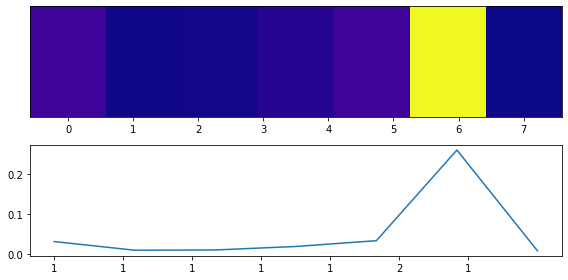

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


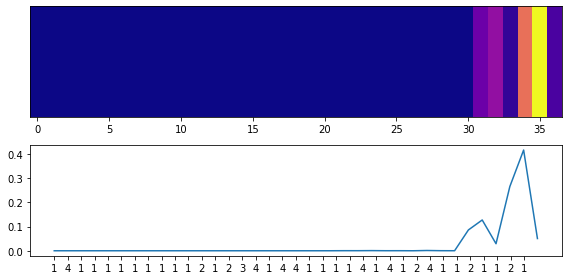

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


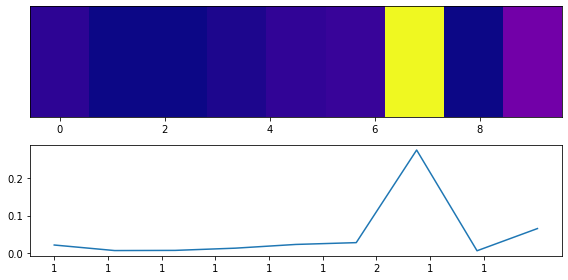

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


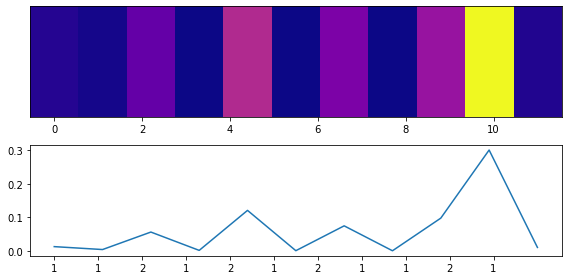

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


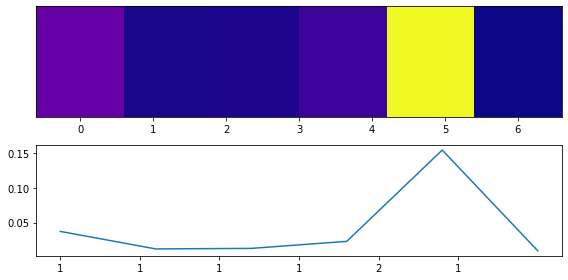

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


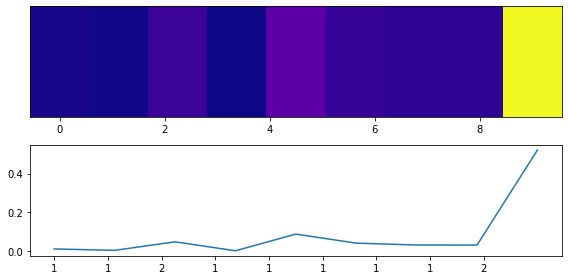

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


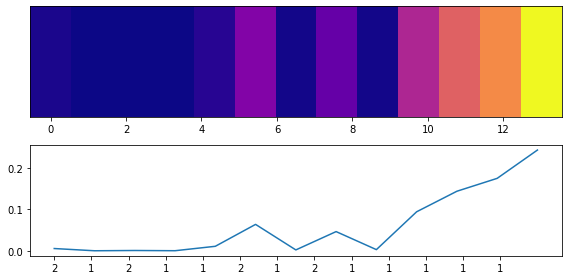

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


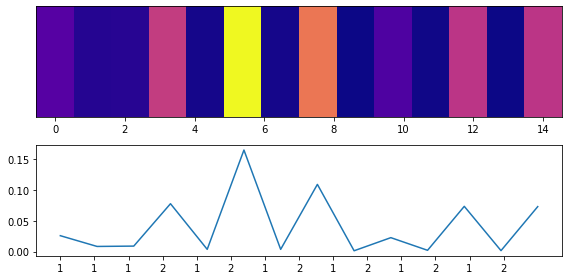

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


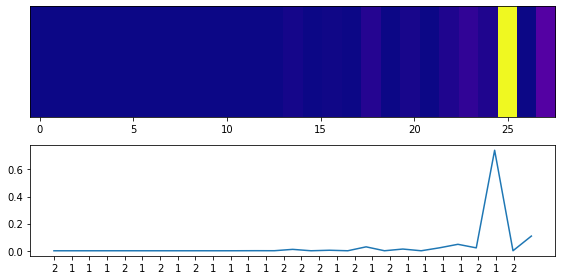

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


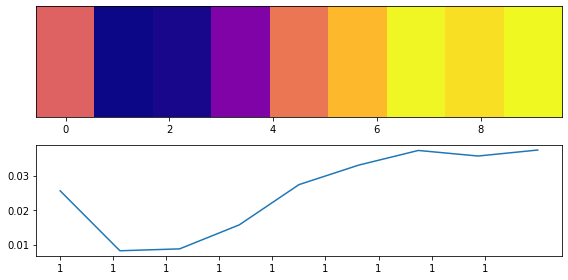

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


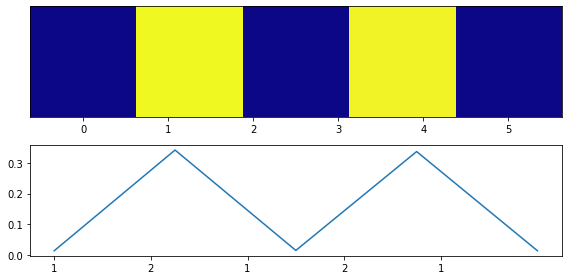

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


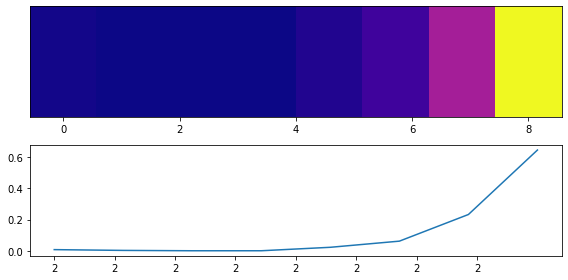

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


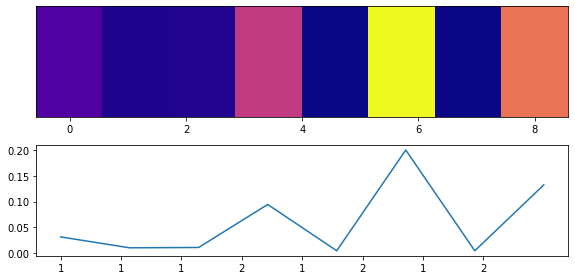

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


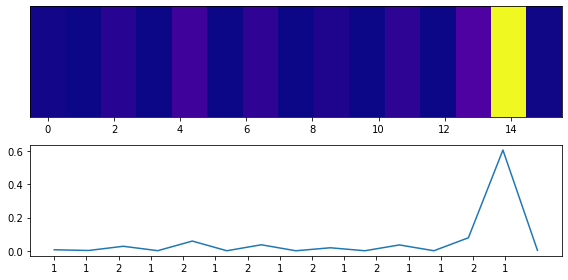

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


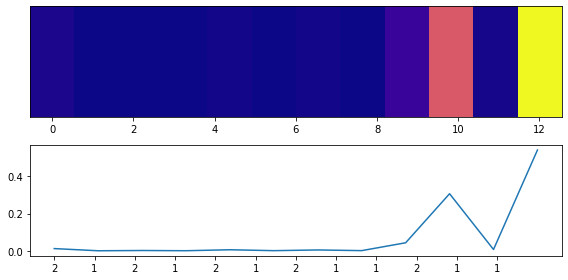

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


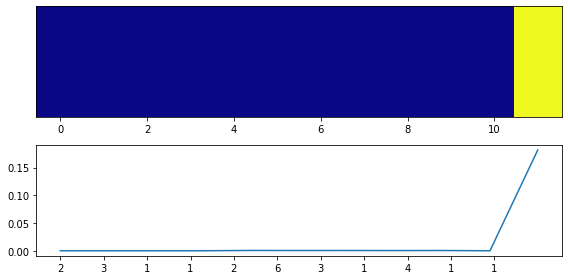

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


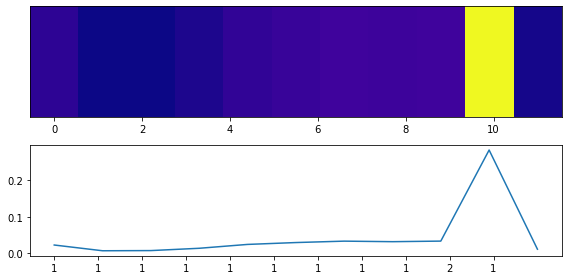

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


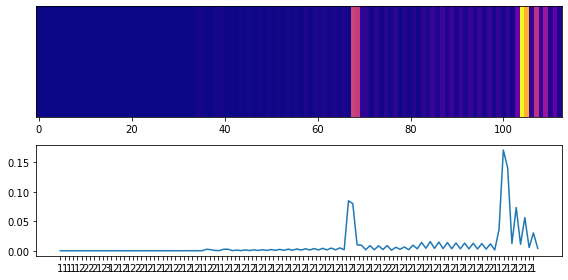

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


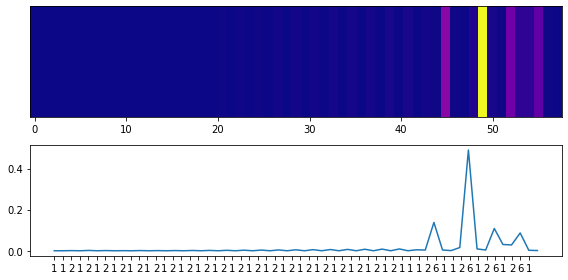

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


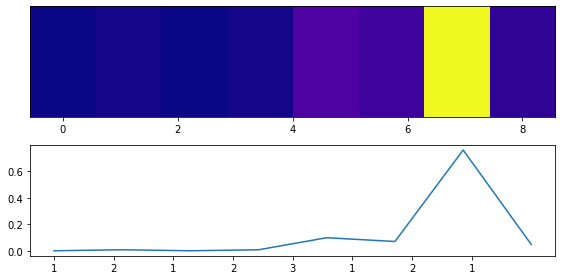

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


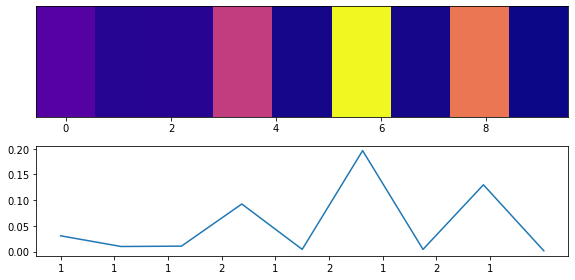

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


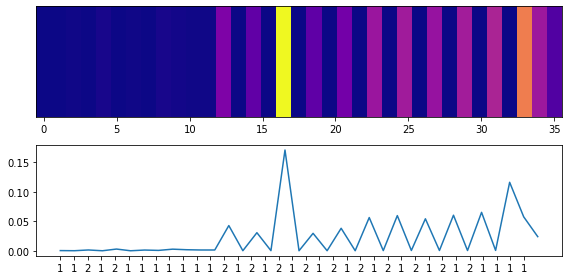

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


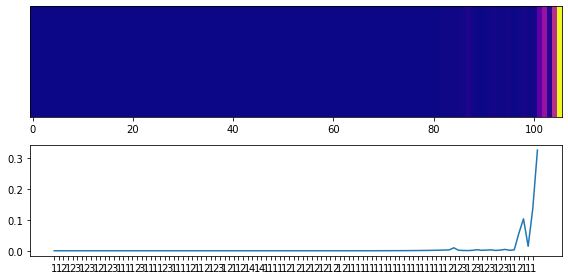

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


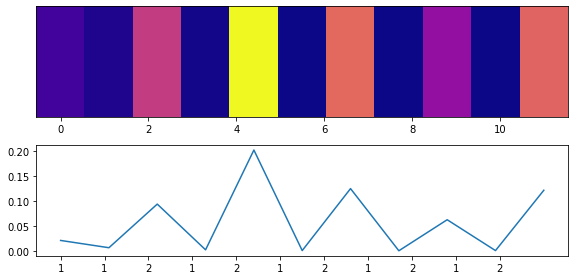

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


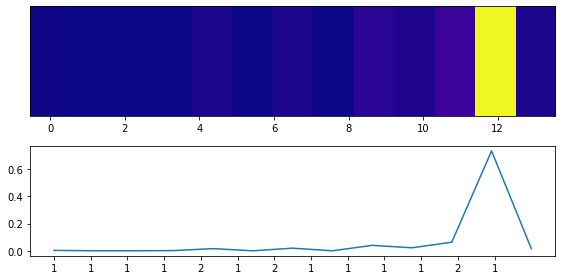

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


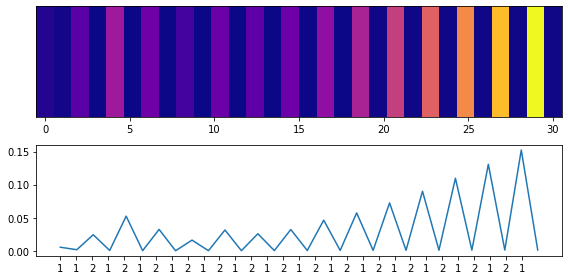

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


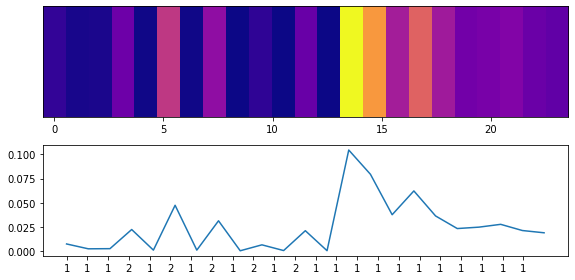

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


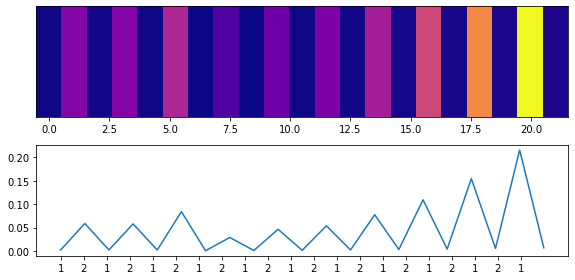

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


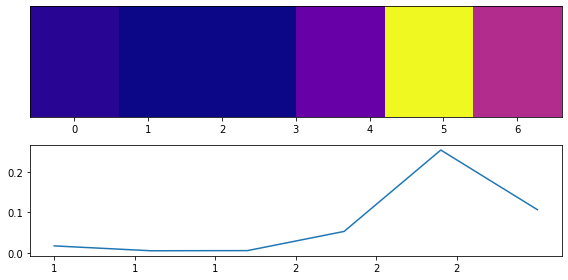

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


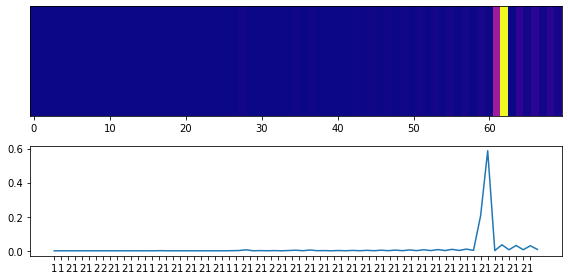

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


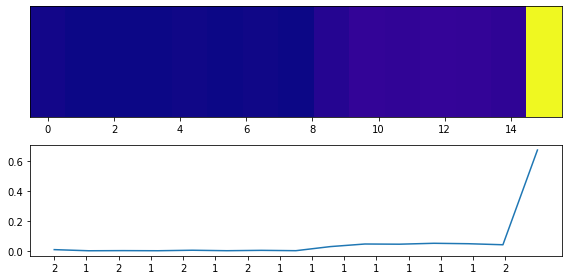

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


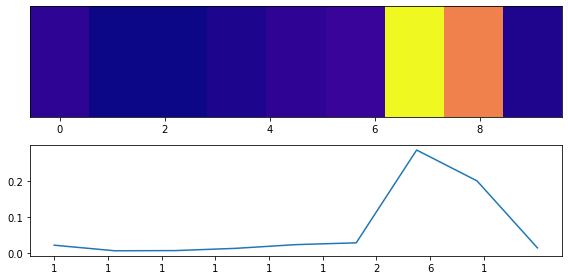

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


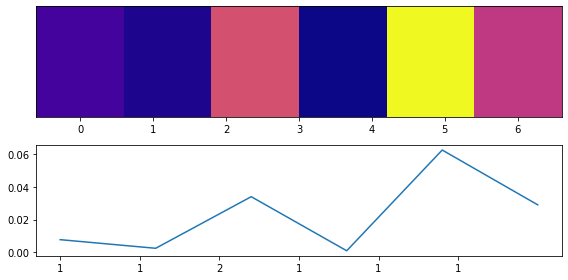

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


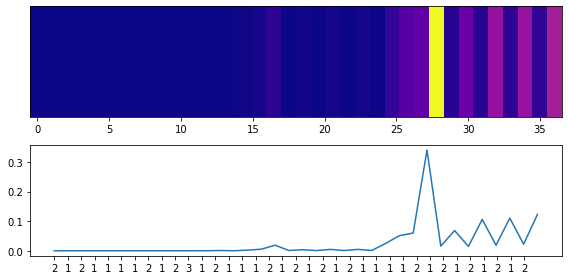

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


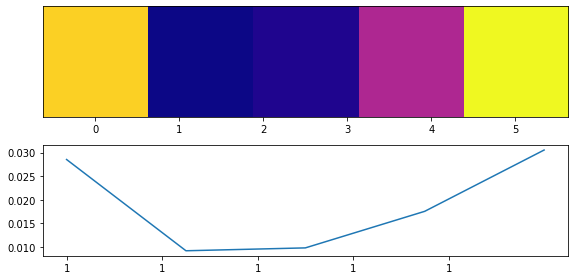

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


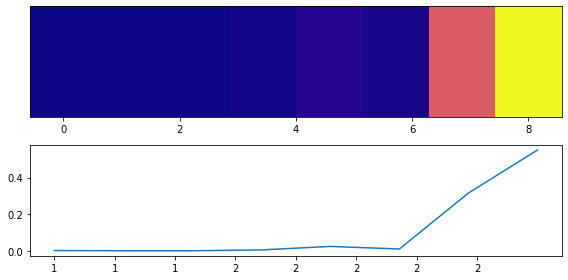

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


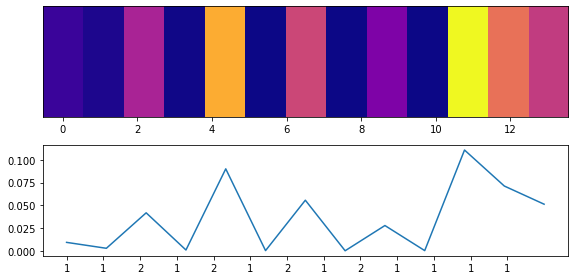

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


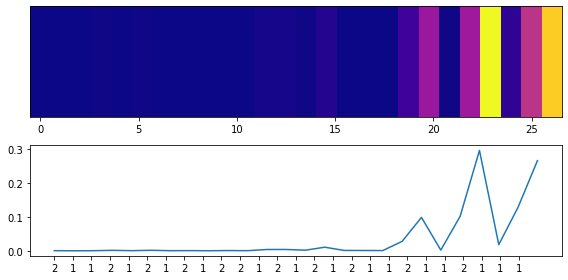

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


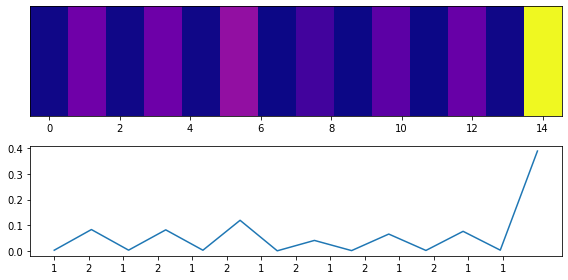

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


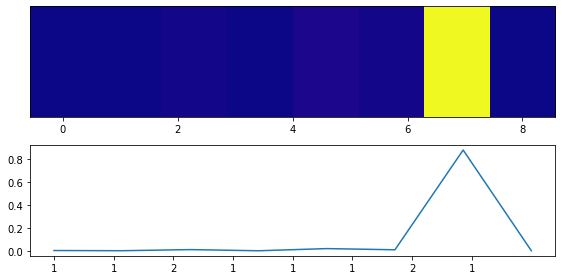

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


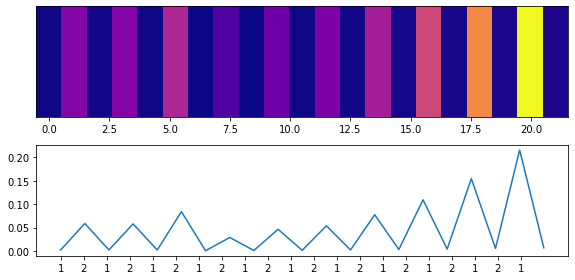

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


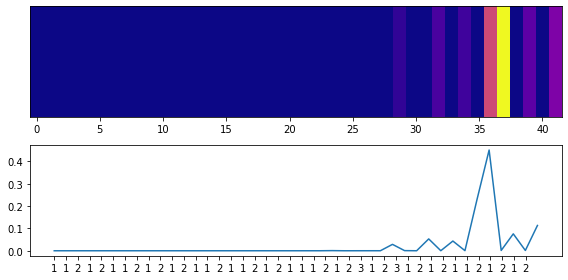

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


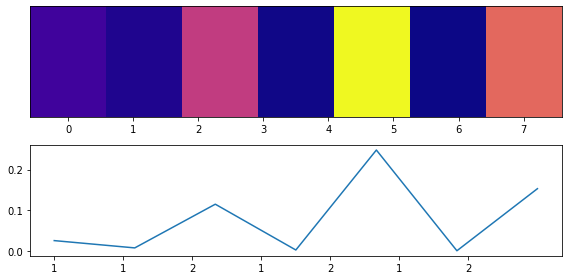

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


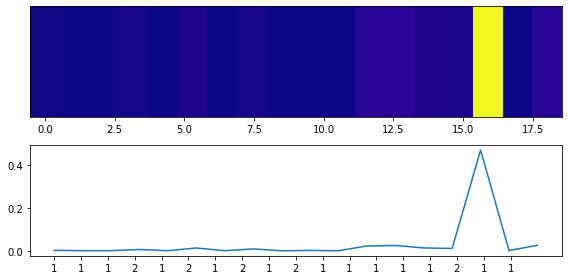

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


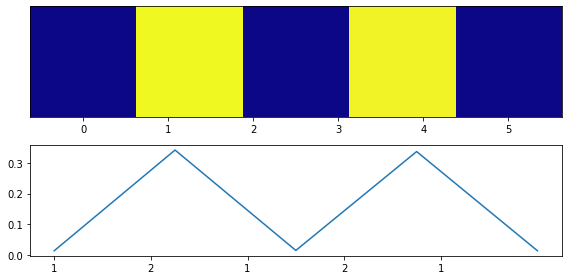

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


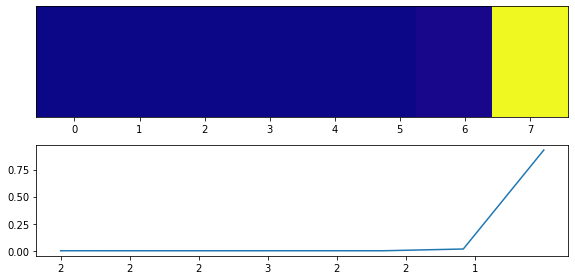

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


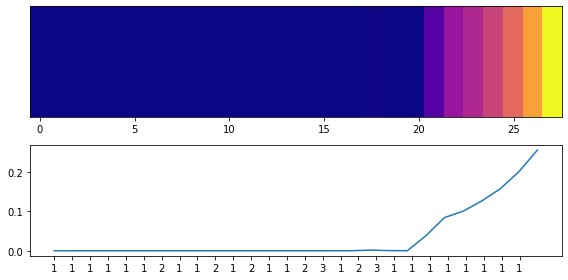

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


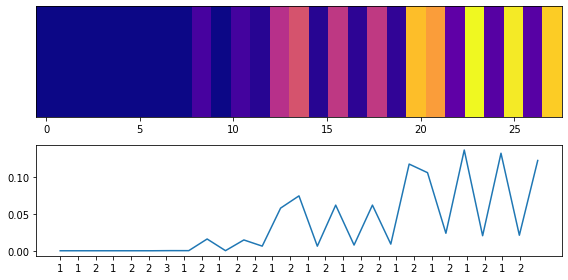

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


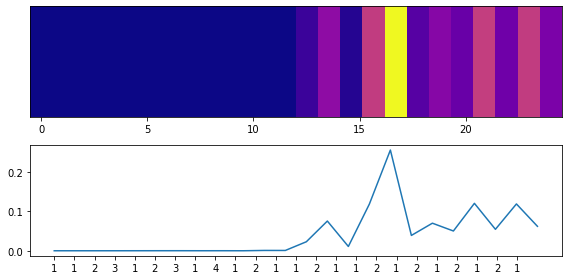

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


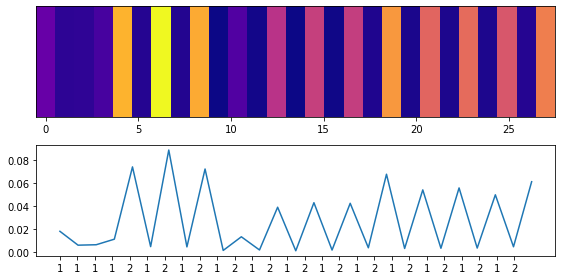

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


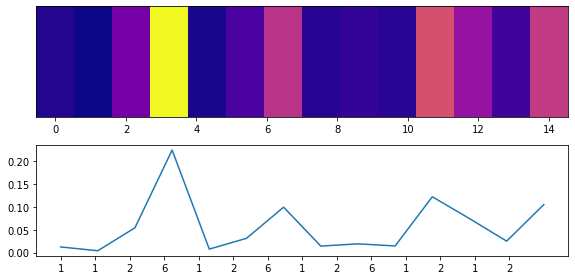

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


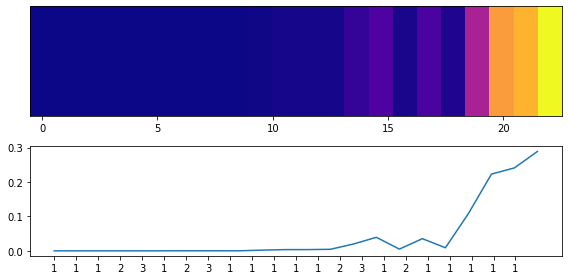

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


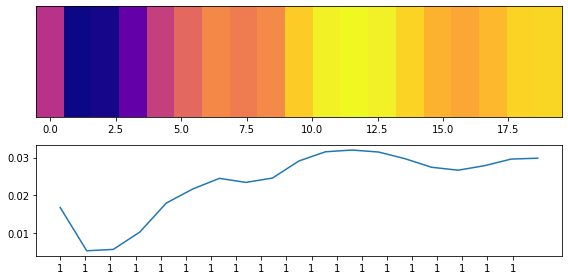

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


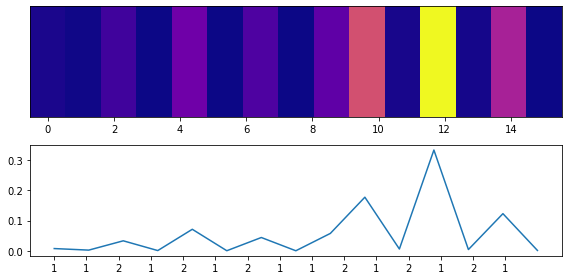

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


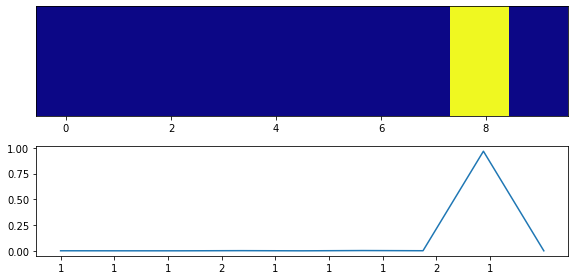

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


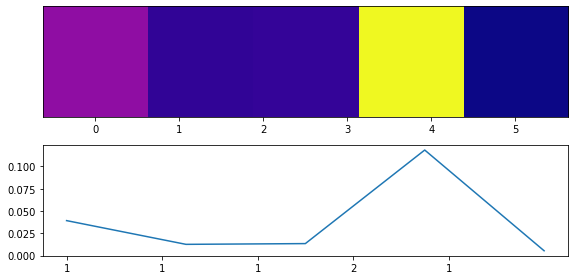

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


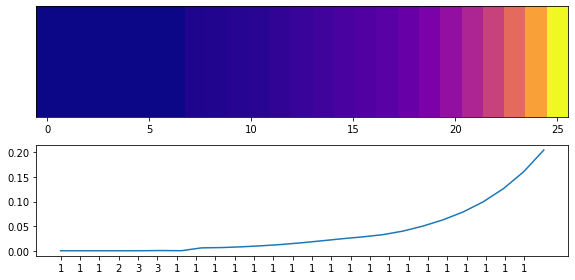

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


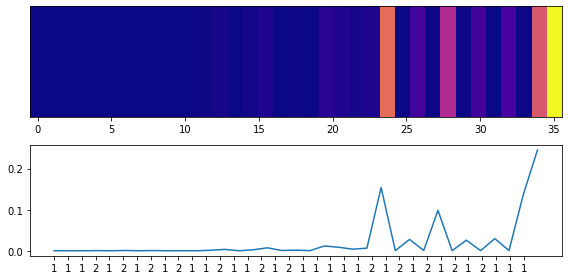

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


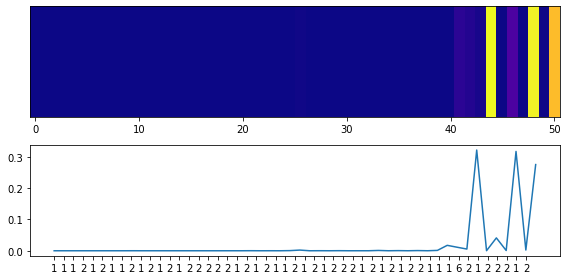

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


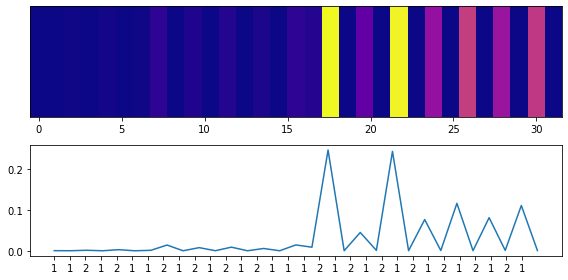

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


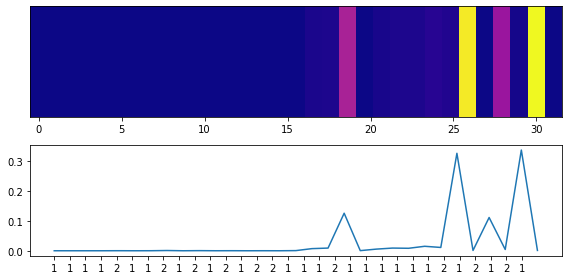

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


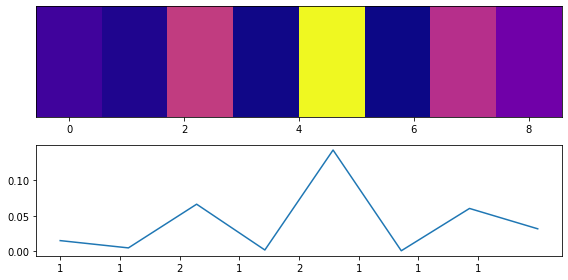

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


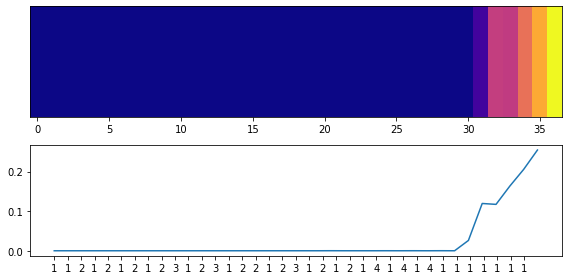

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


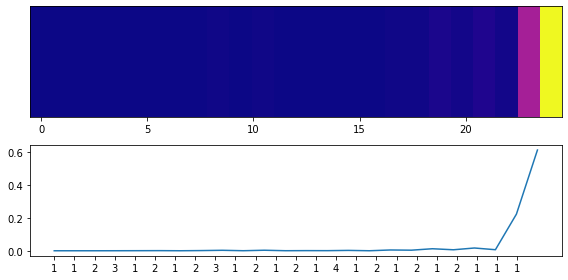

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


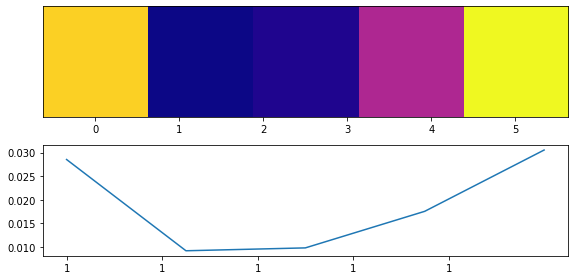

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


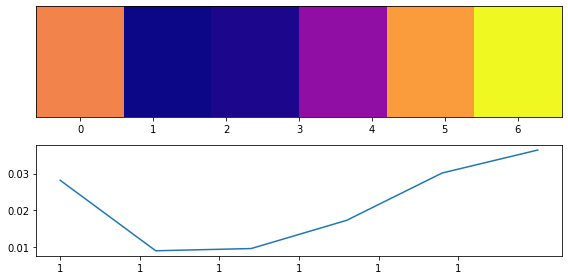

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


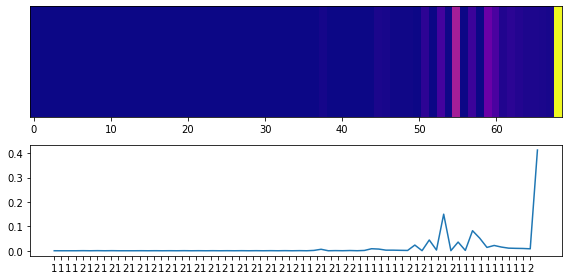

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


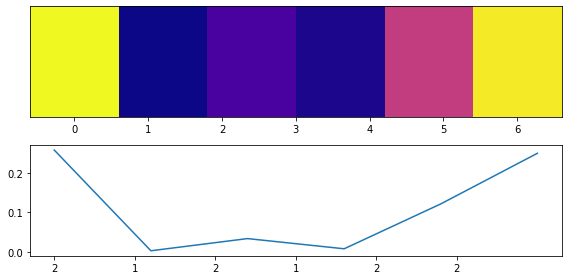

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


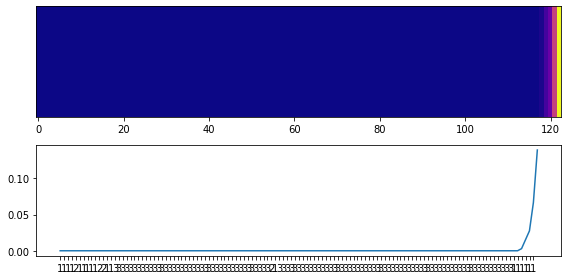

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


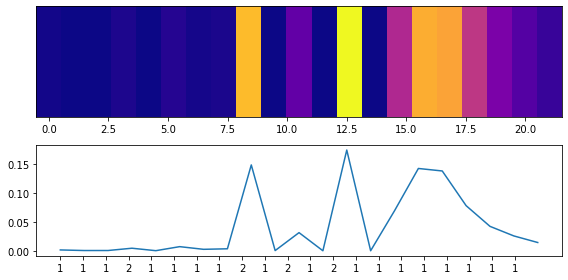

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


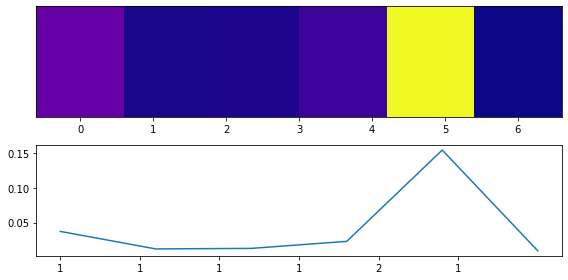

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


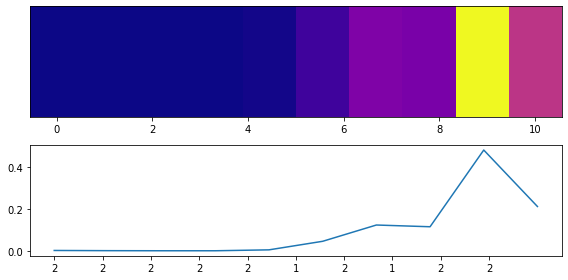

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


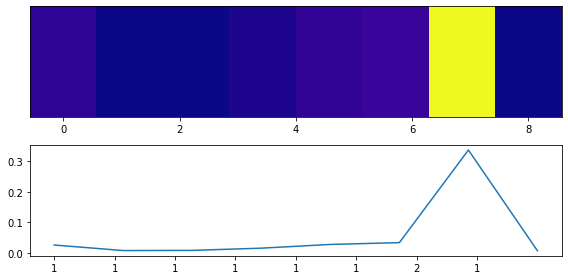

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


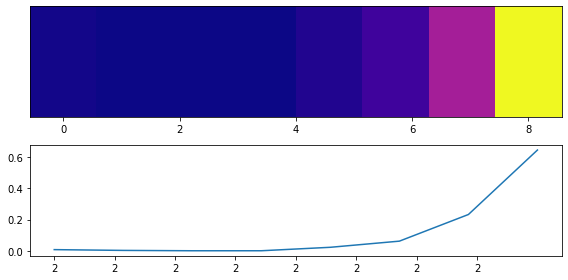

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


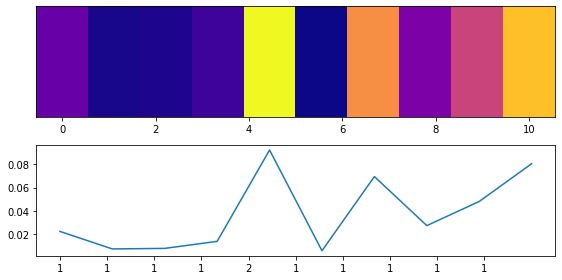

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


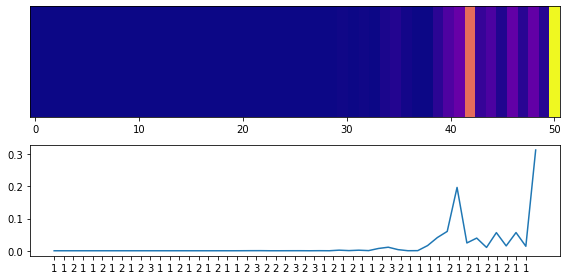

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


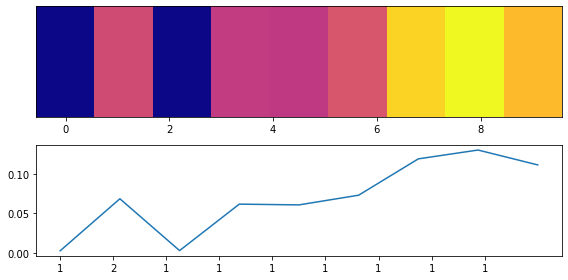

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


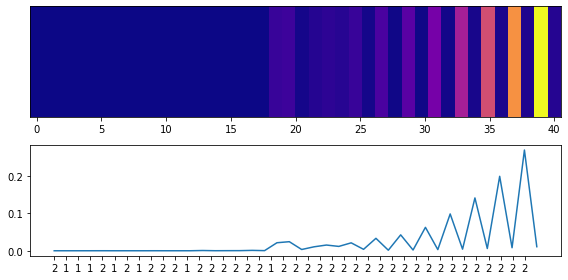

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


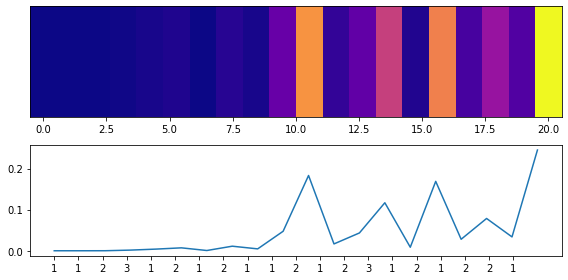

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


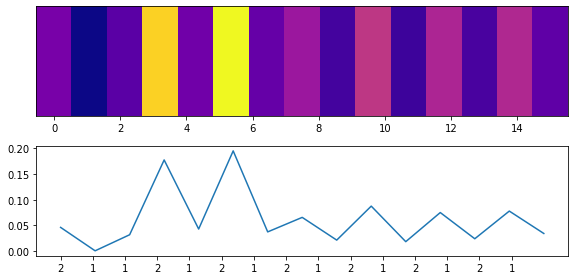

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


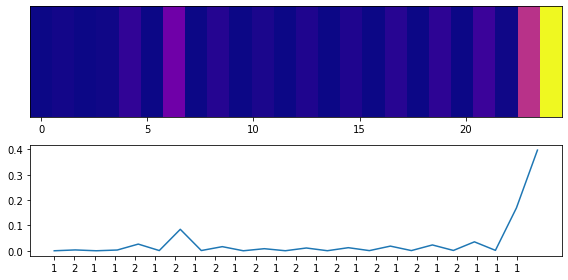

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


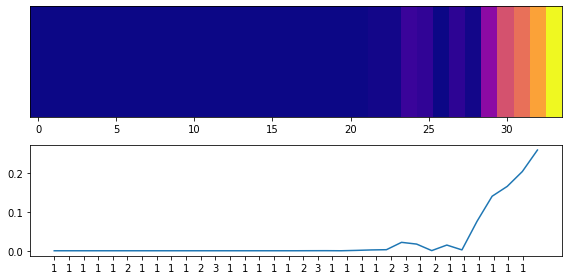

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


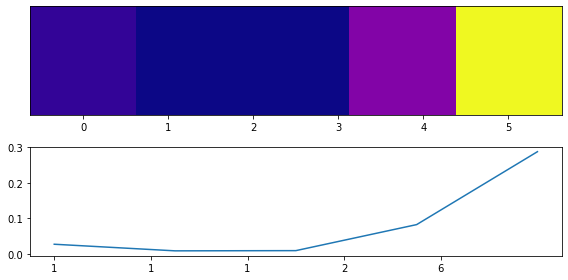

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


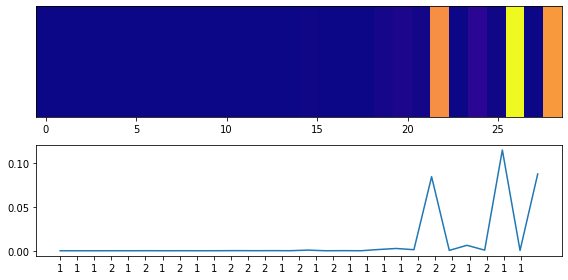

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


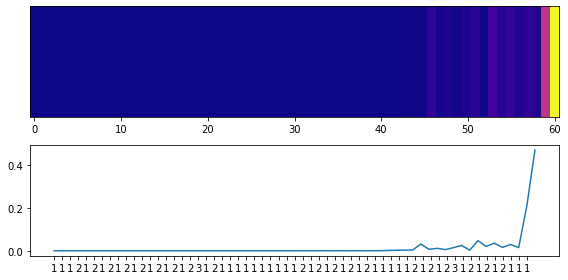

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


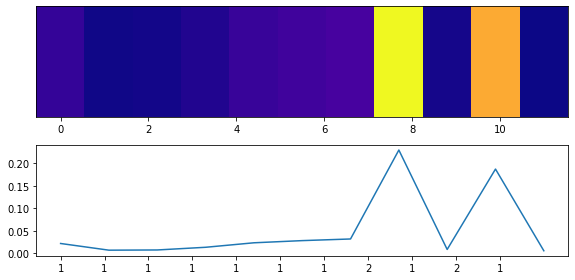

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


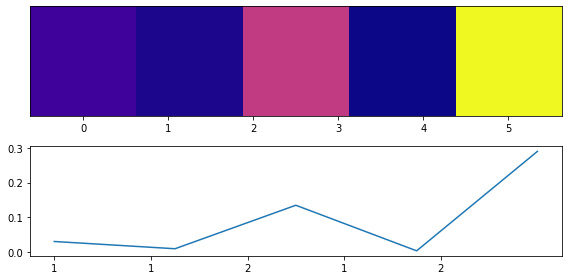

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


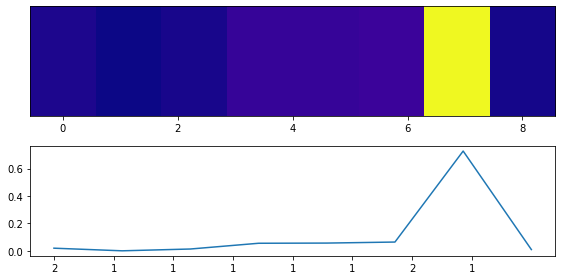

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


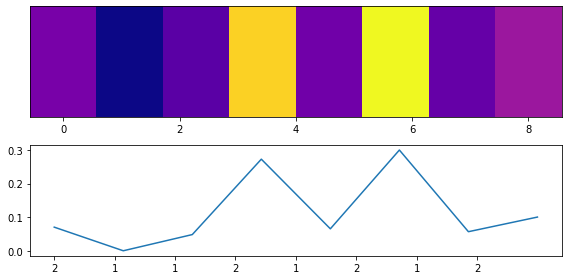

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


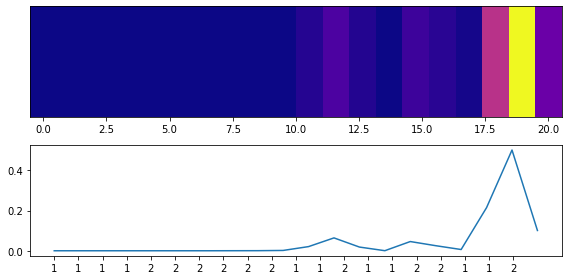

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


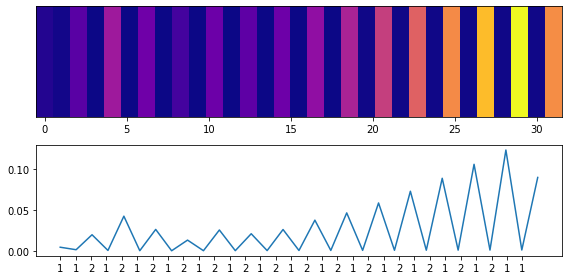

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


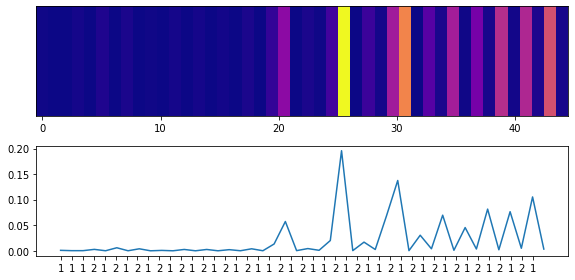

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


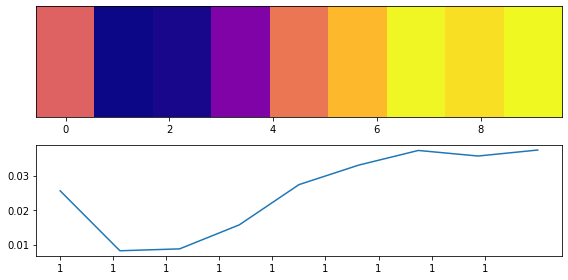

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


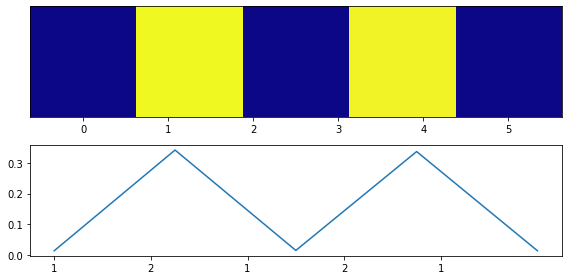

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


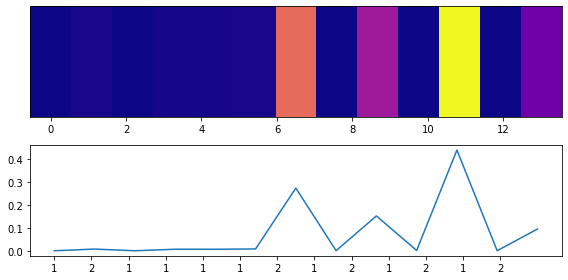

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


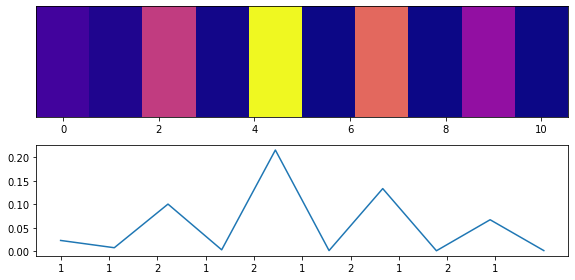

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


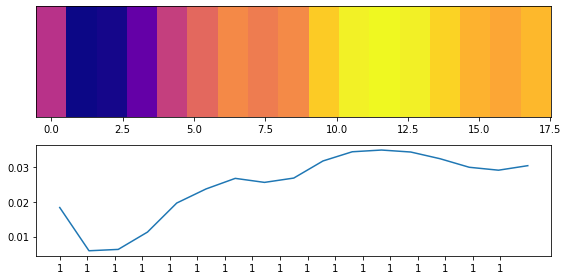

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


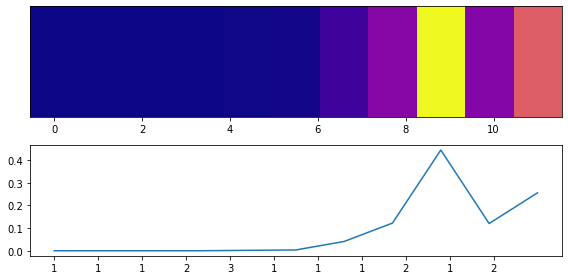

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


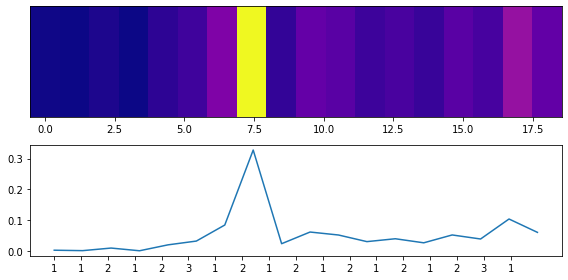

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


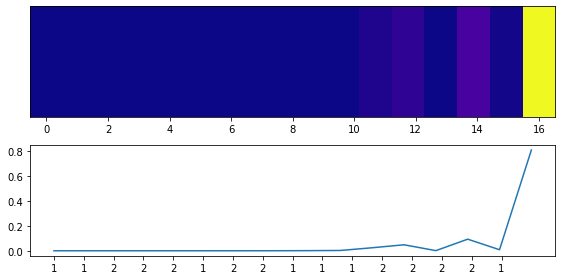

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


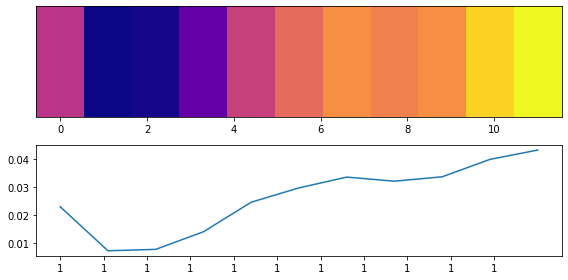

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


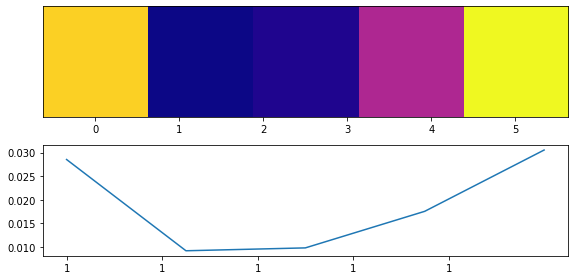

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


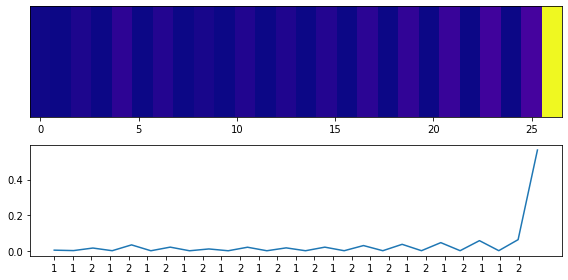

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


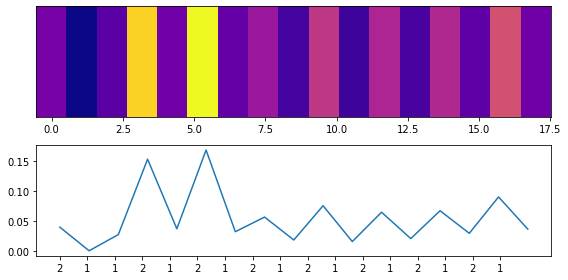

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


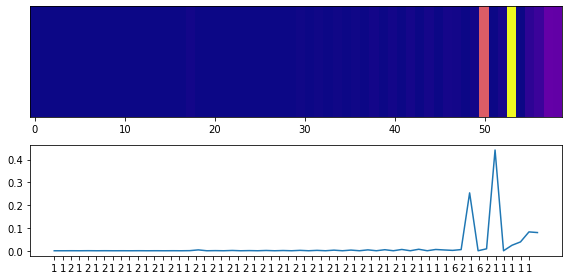

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


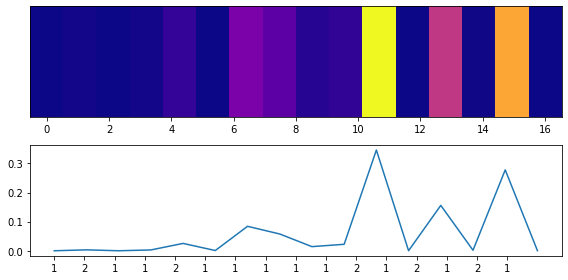

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


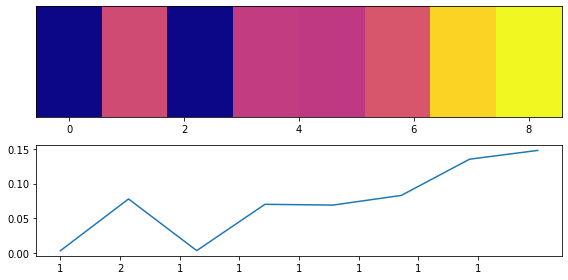

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


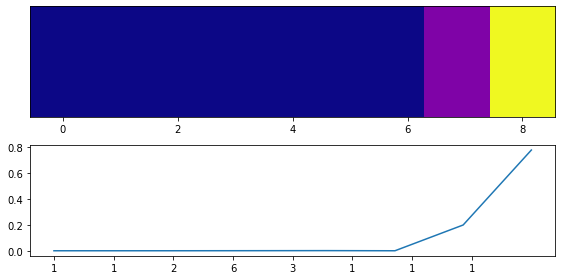

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


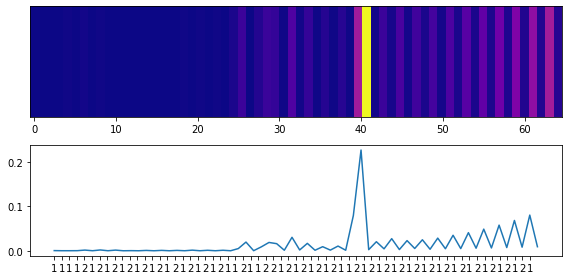

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


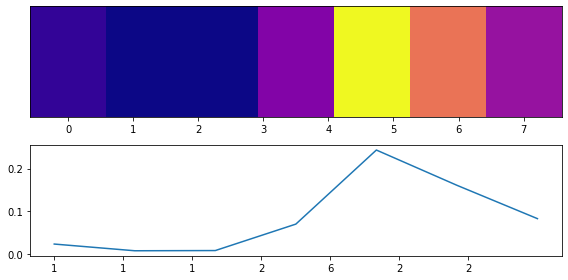

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


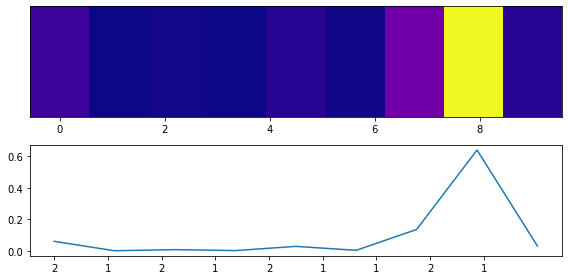

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


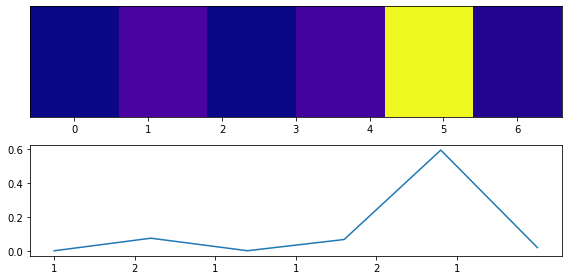

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


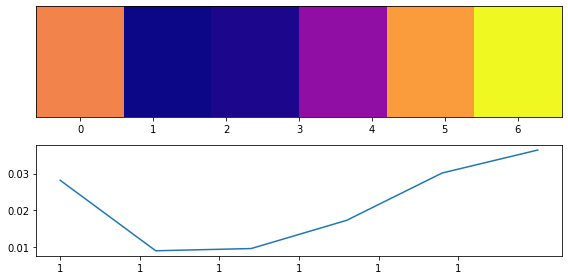

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


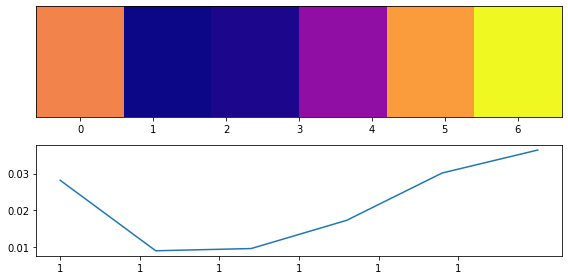

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


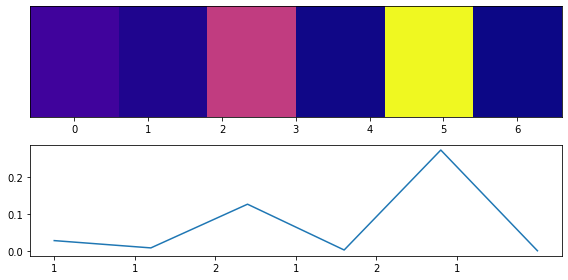

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


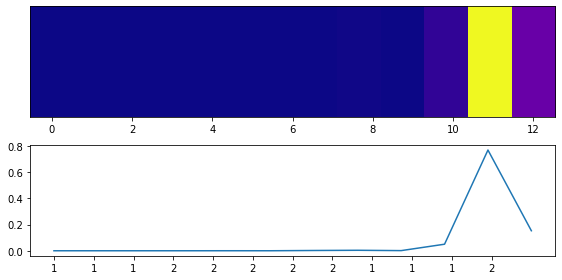

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


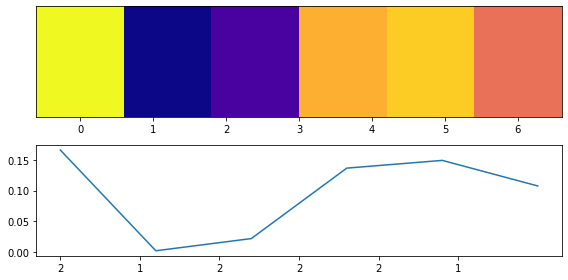

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


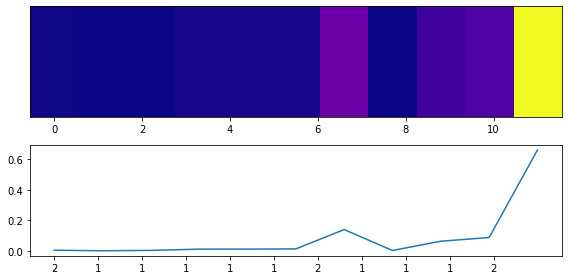

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


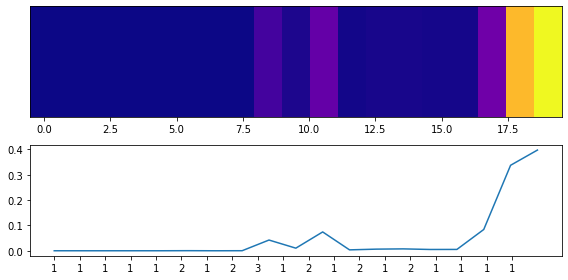

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


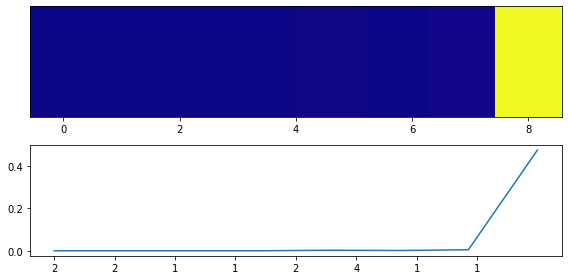

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


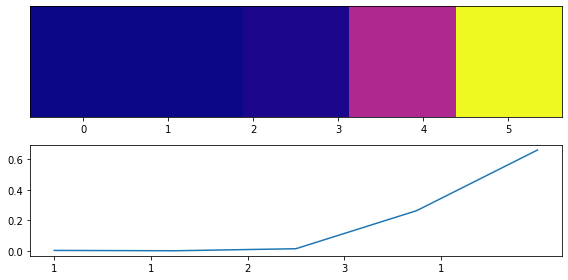

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


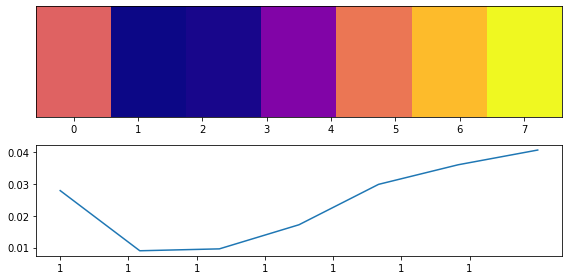

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


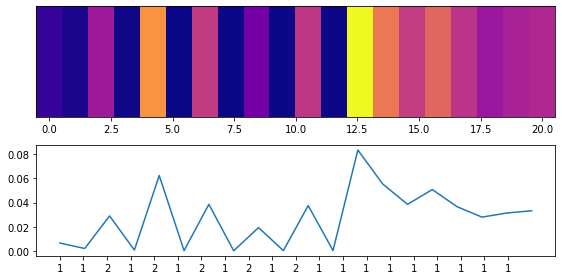

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


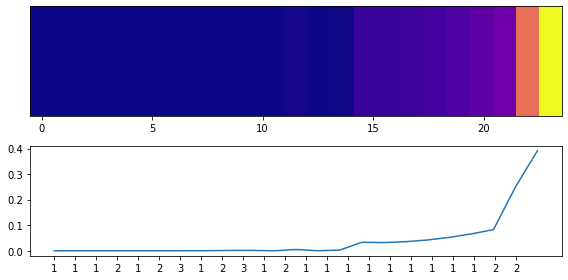

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


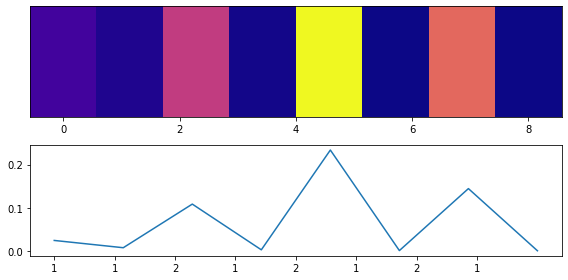

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


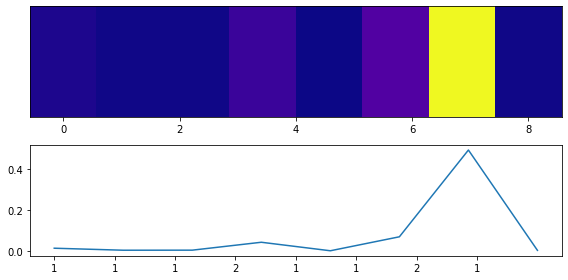

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


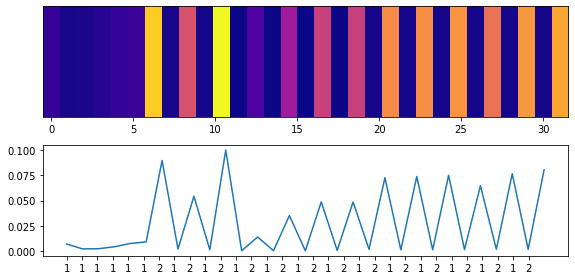

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


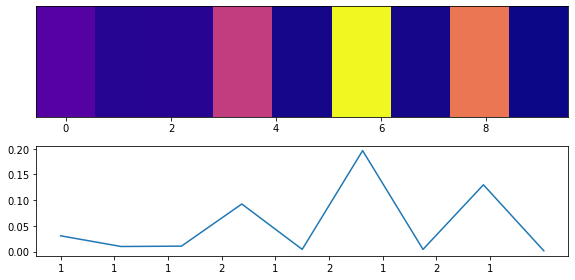

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


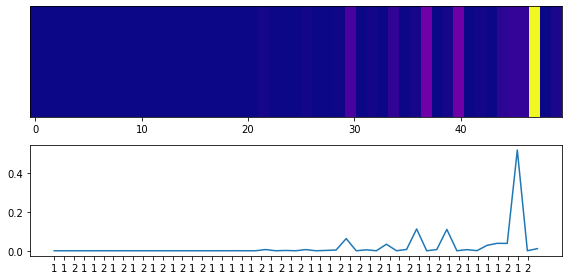

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


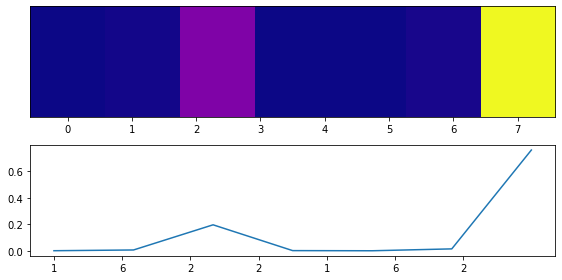

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


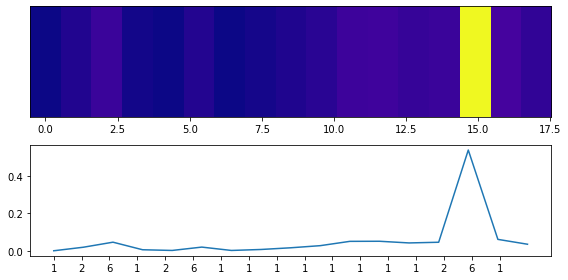

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


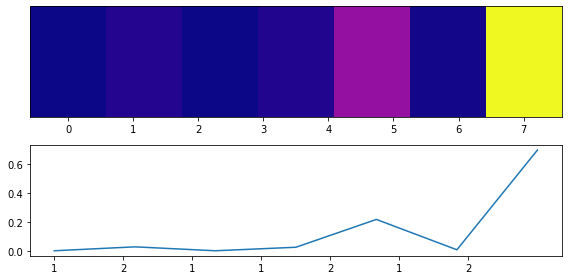

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


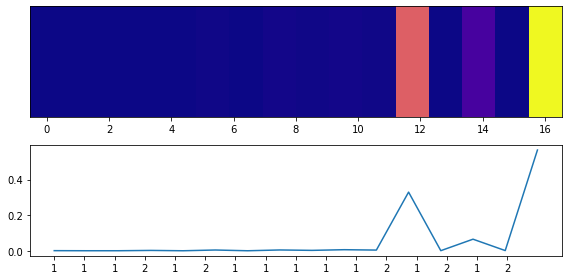

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


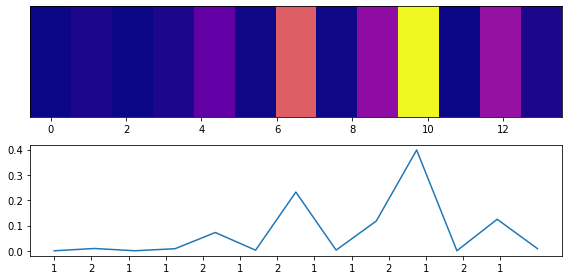

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


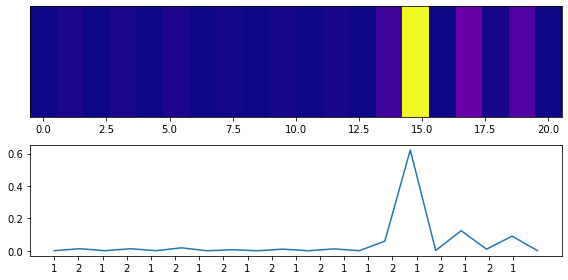

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


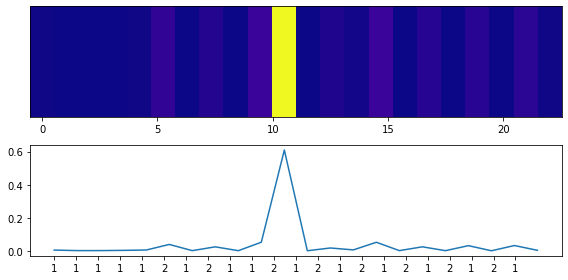

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


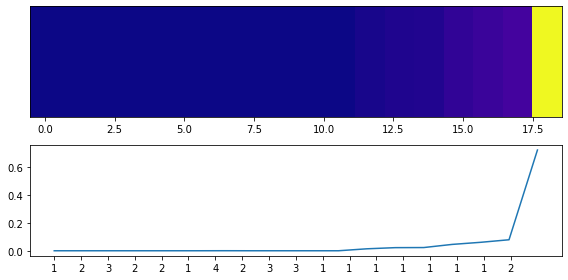

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


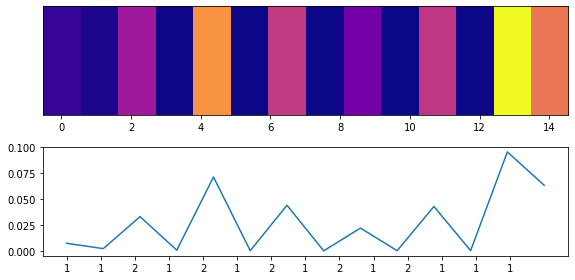

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


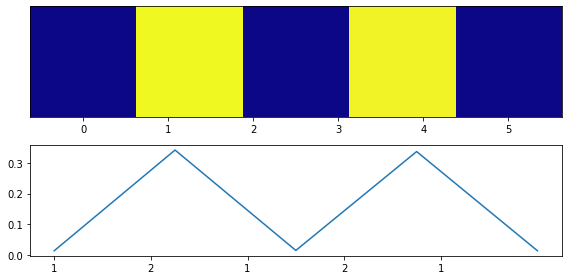

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


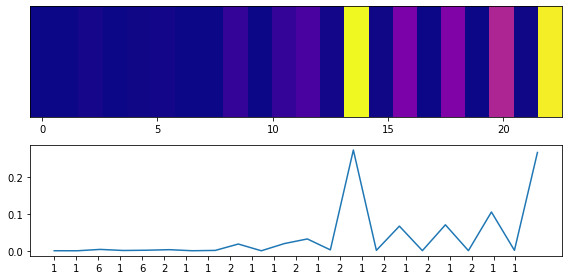

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


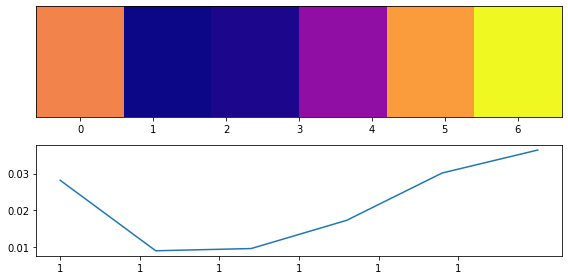

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


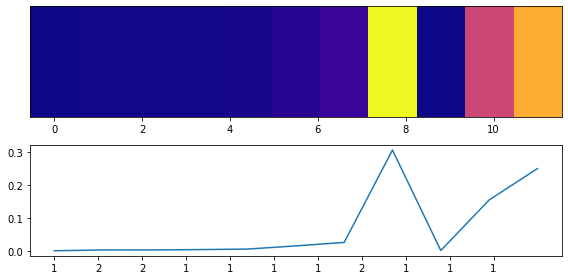

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


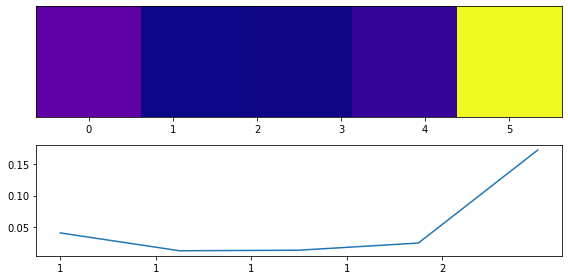

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


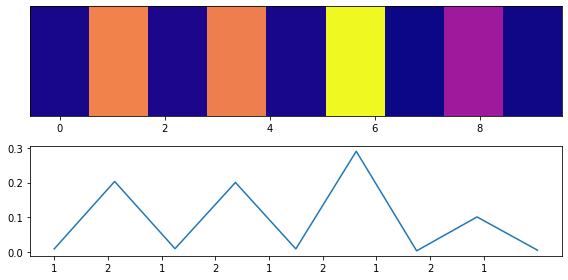

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


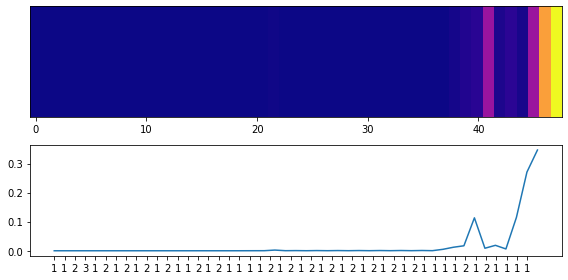

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


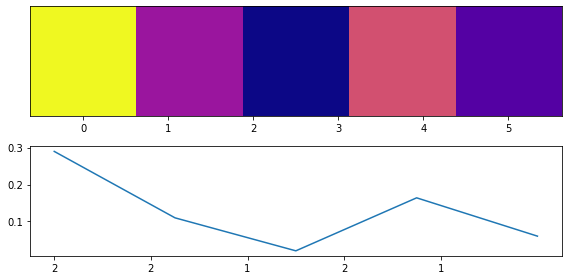

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


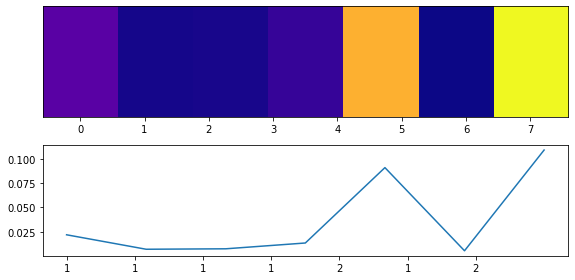

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


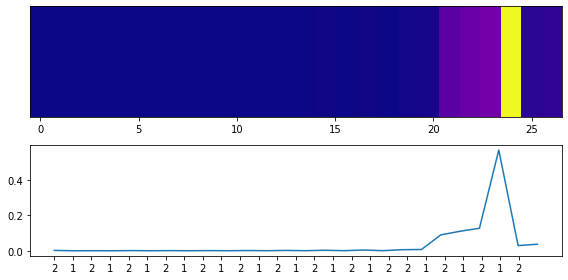

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


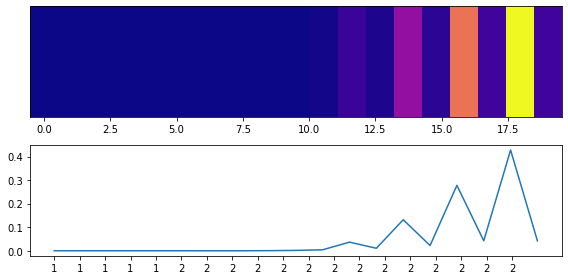

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


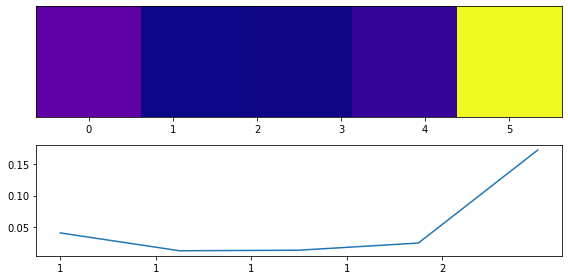

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


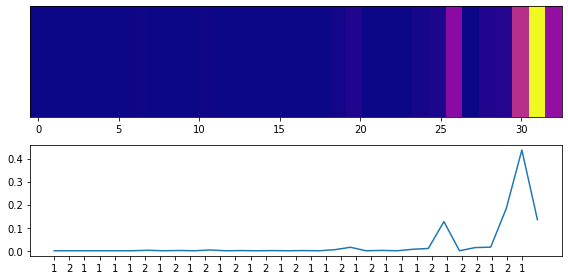

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


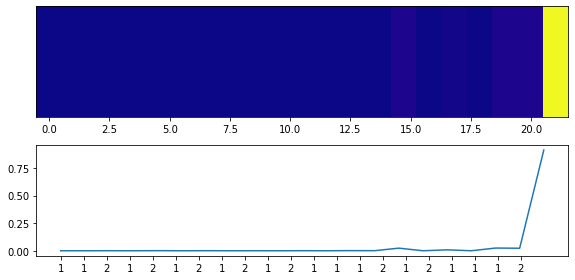

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


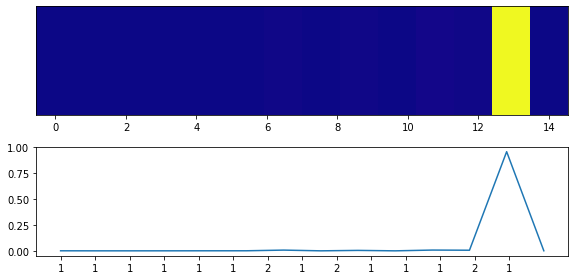

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


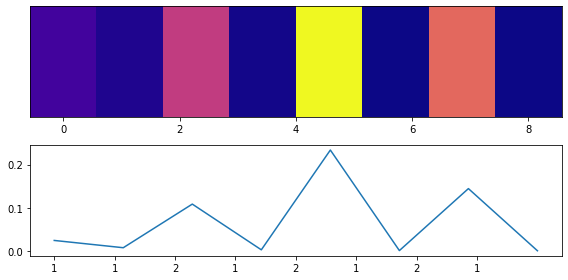

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


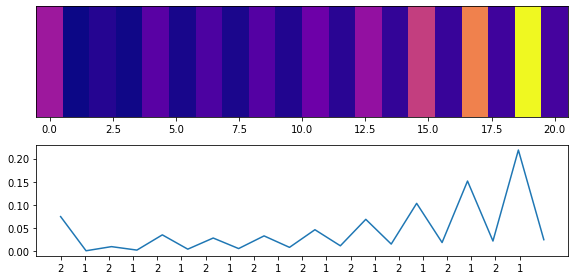

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


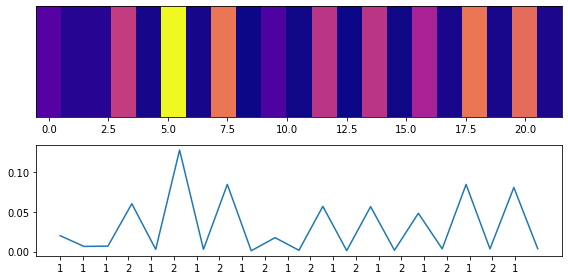

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


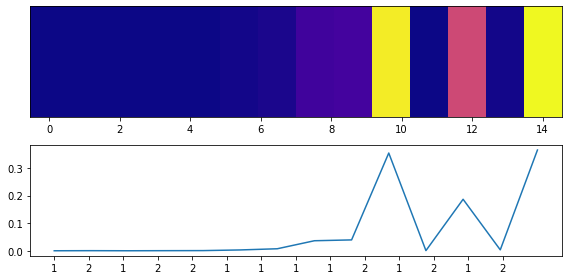

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


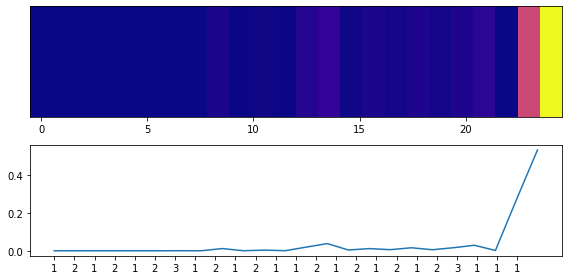

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


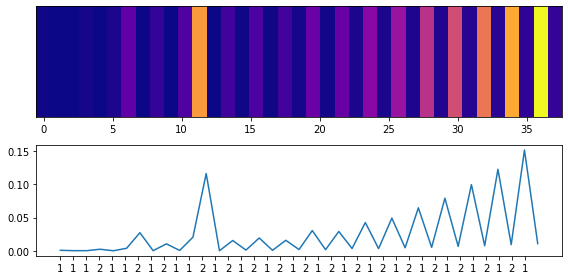

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


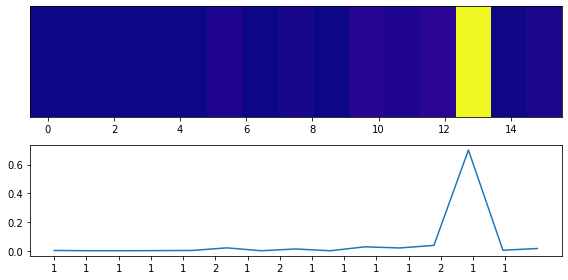

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


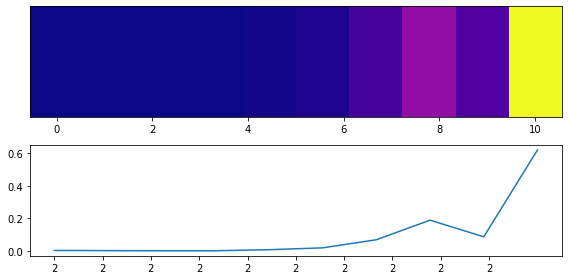

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


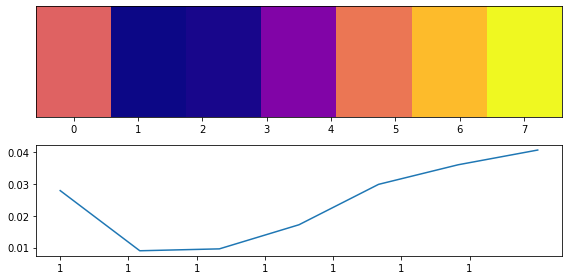

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


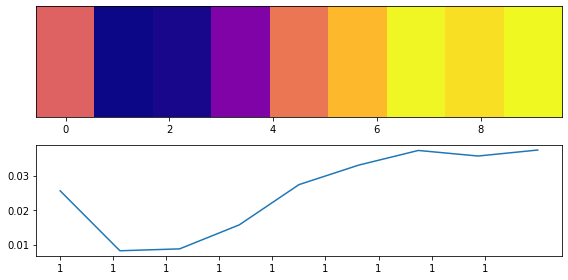

model prediction: 0 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


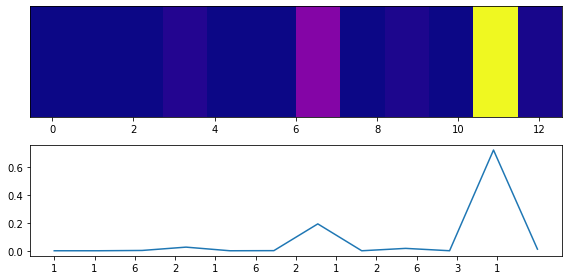

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


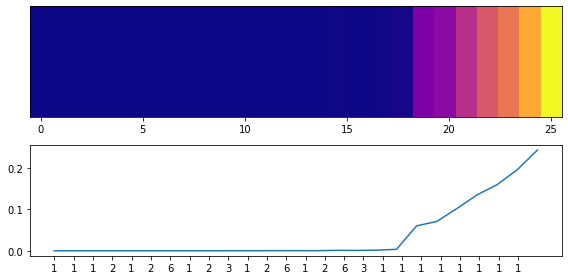

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


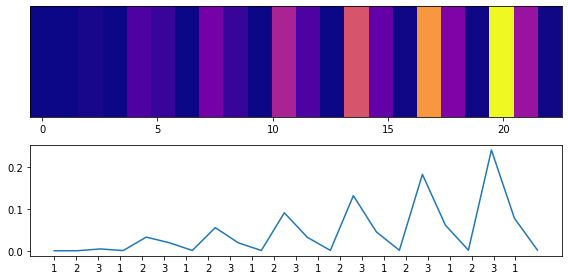

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


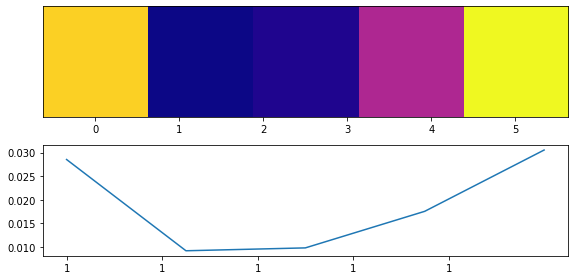

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


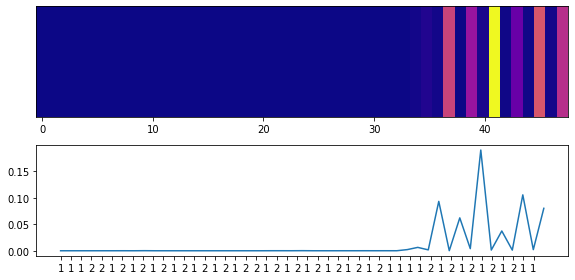

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


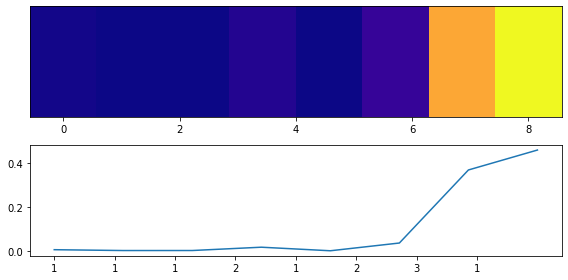

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


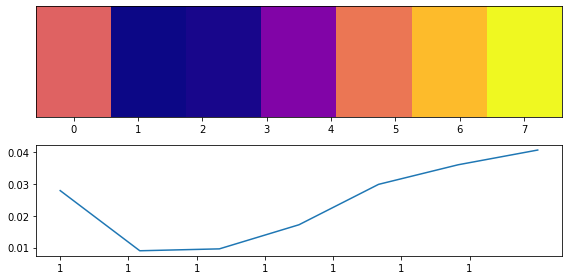

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


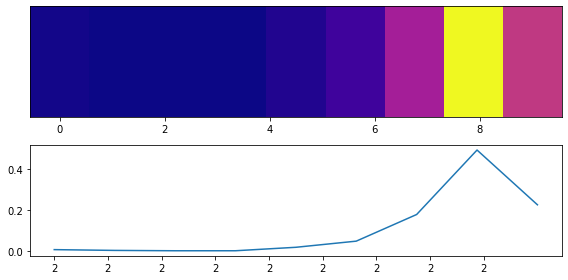

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


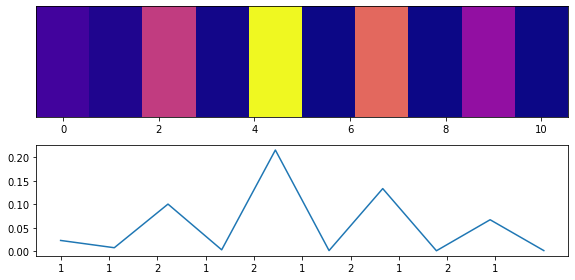

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


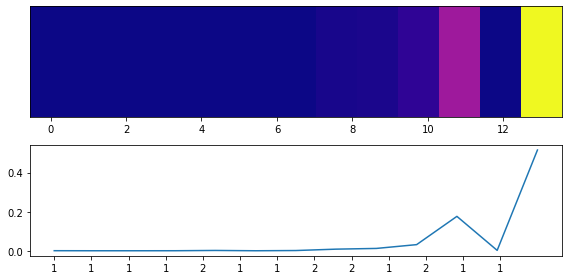

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


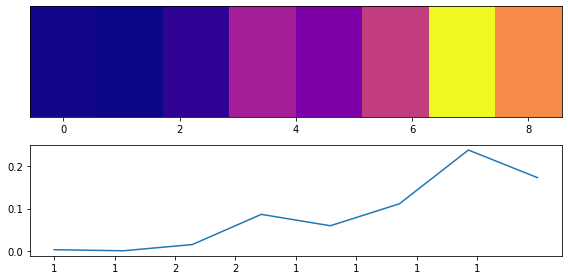

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


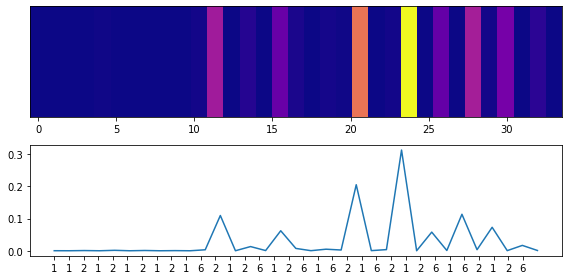

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


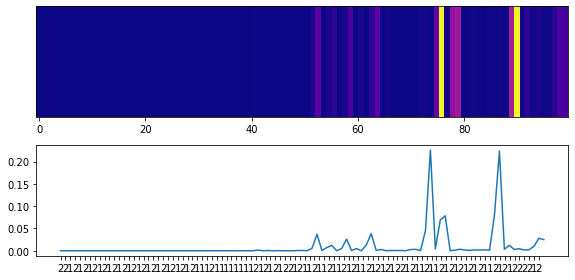

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


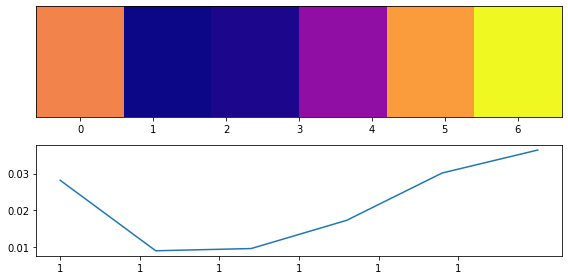

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


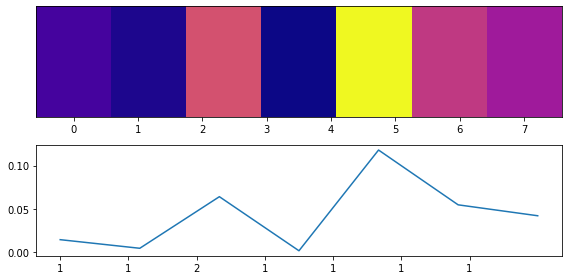

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


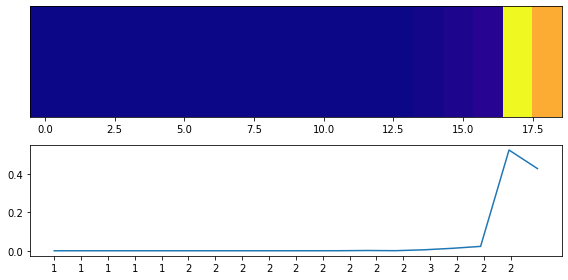

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


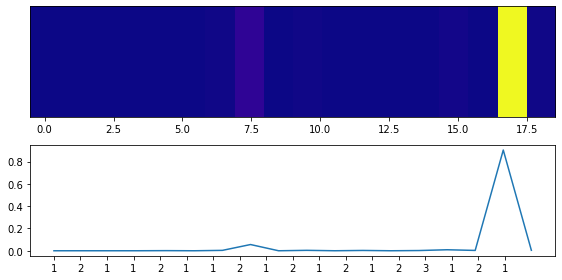

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


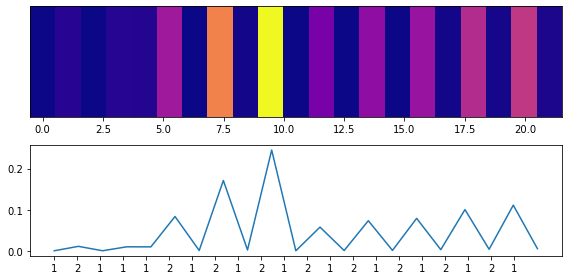

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


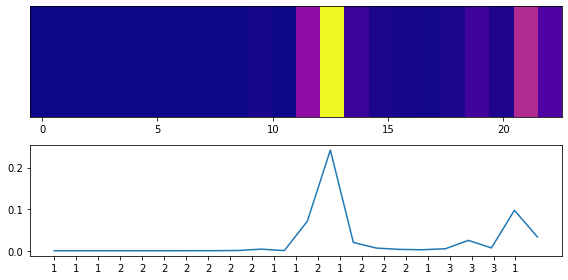

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


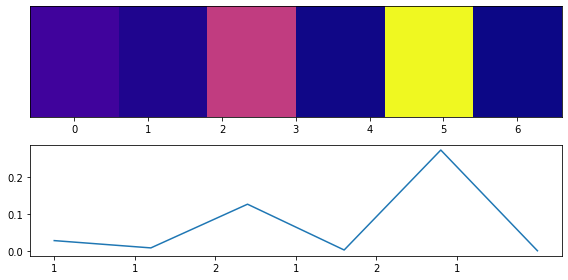

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


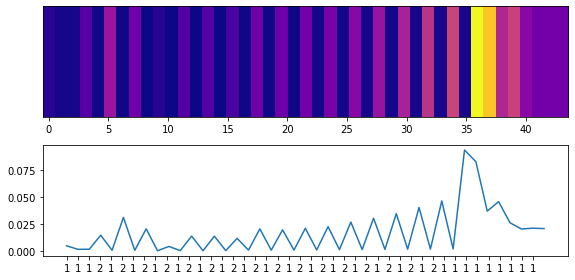

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


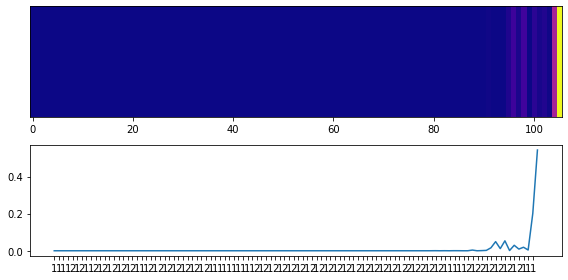

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


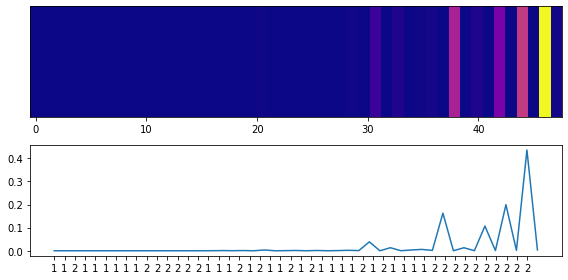

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


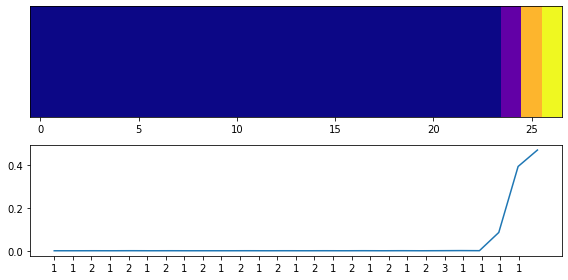

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


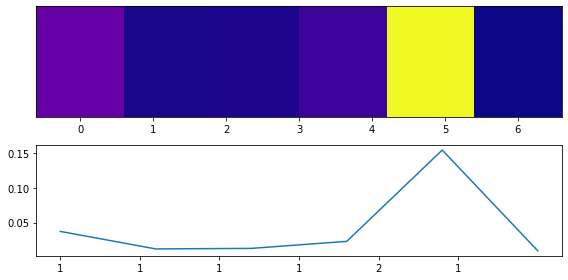

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


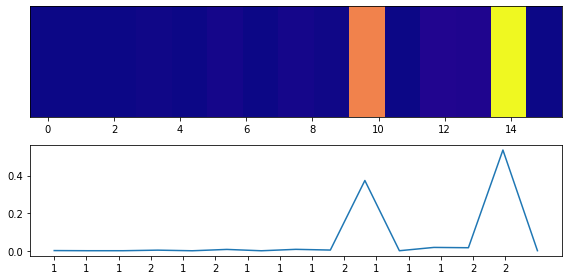

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


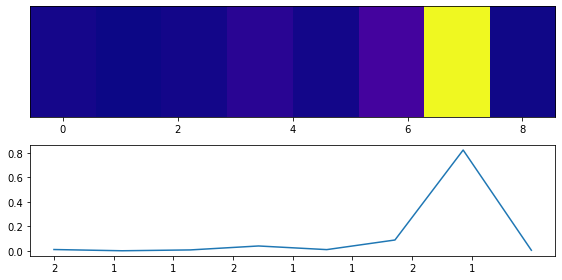

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


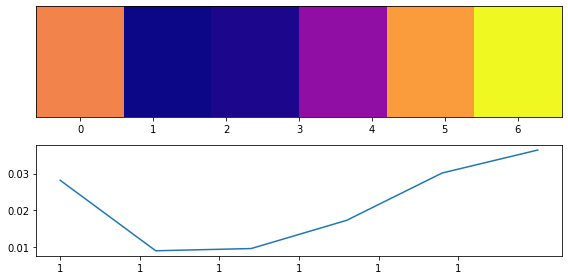

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


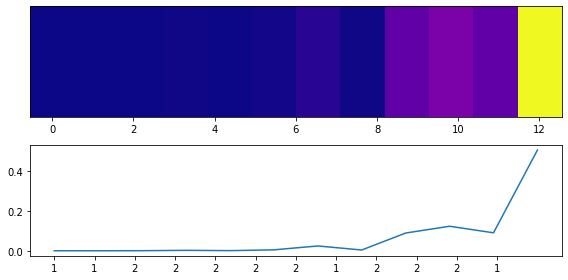

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


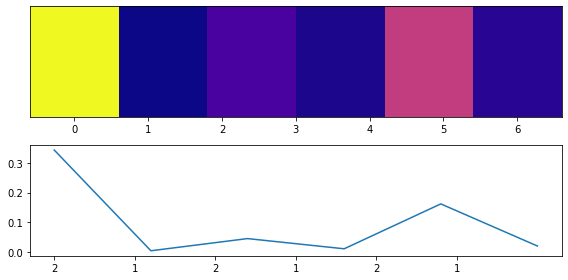

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


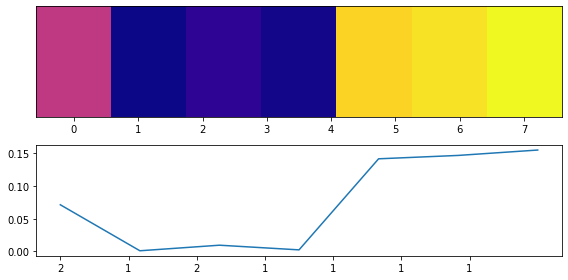

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


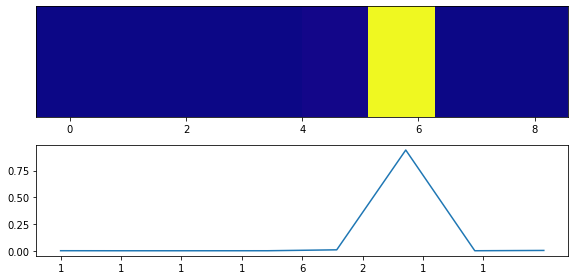

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


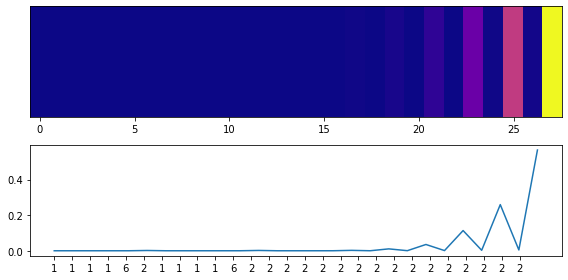

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


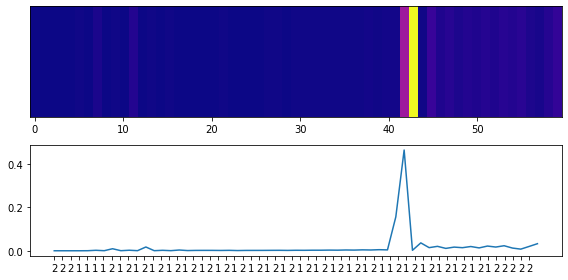

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


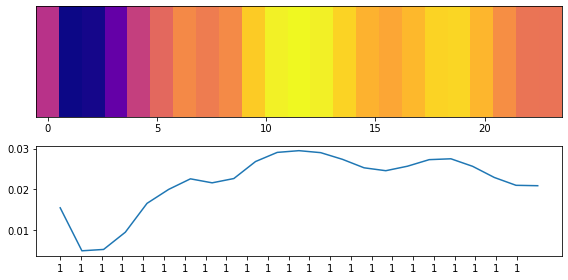

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


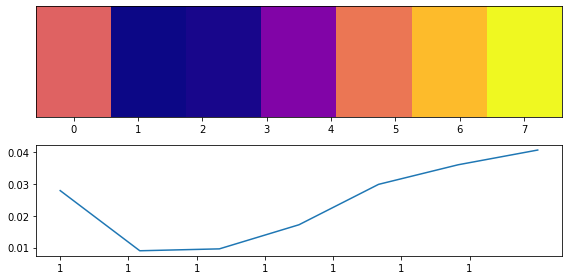

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


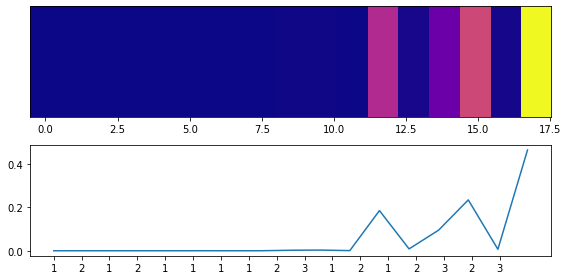

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


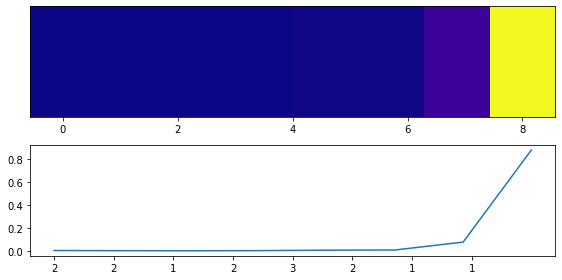

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


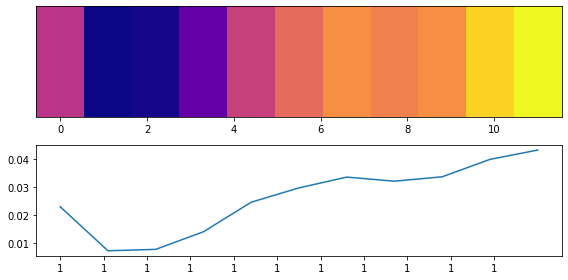

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


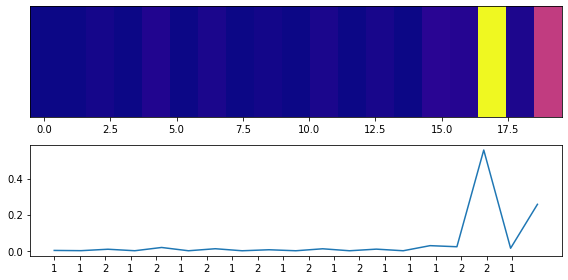

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


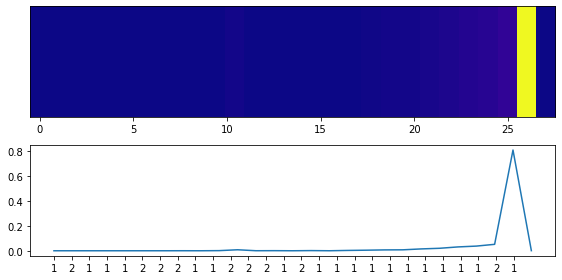

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


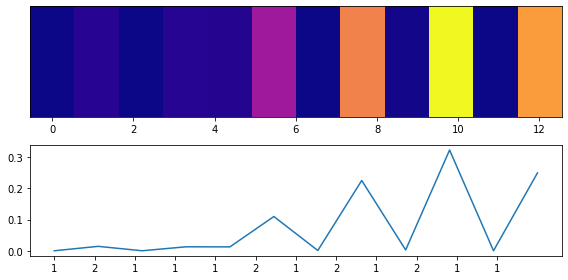

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


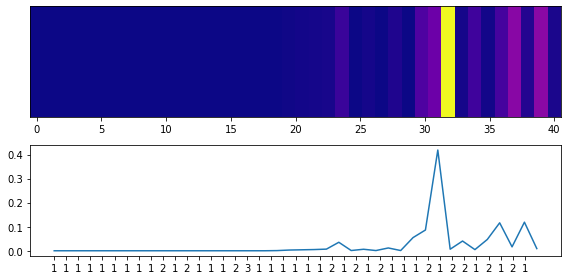

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


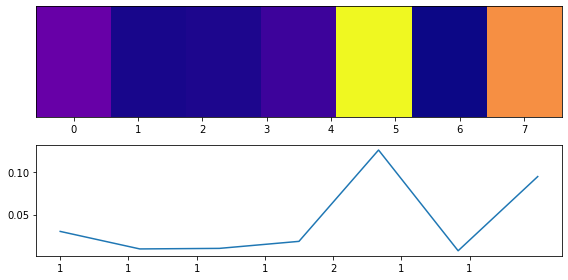

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


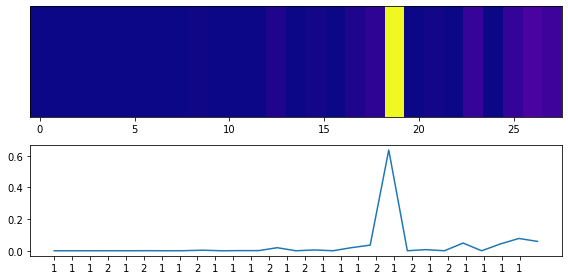

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


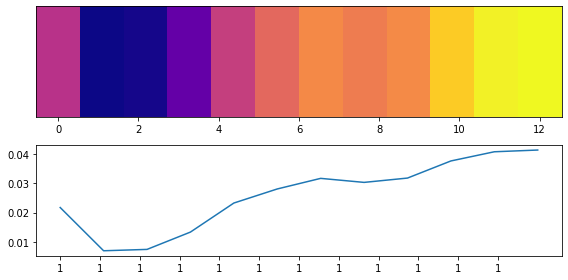

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


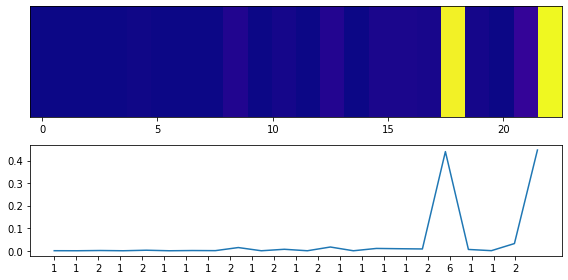

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


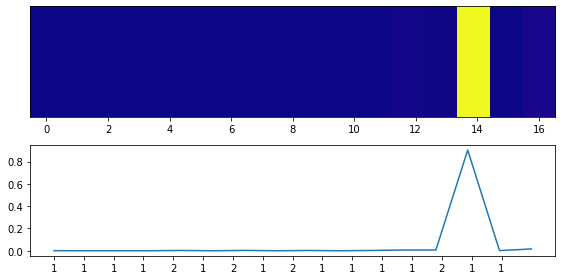

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


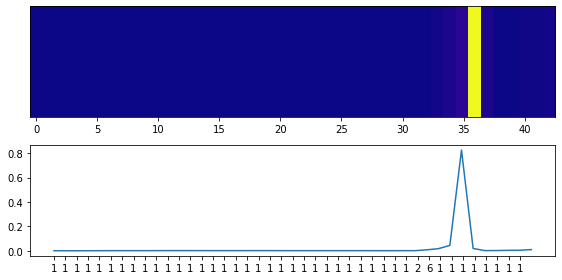

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


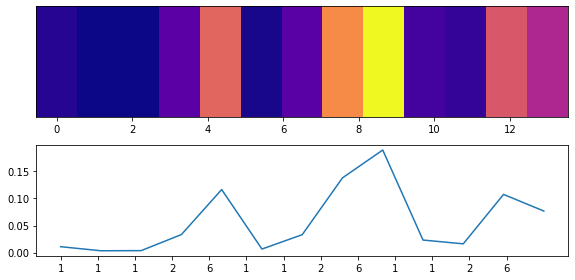

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


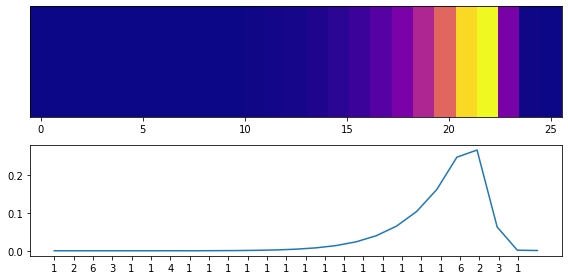

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


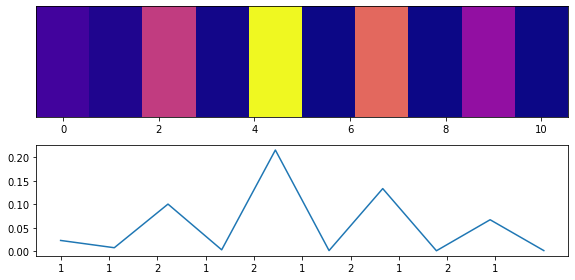

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


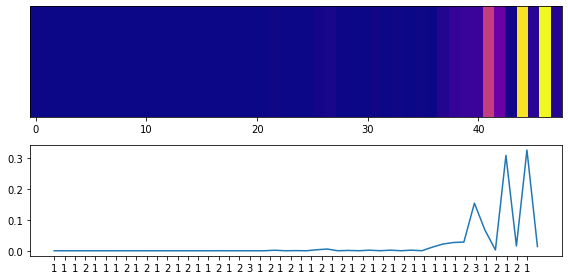

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


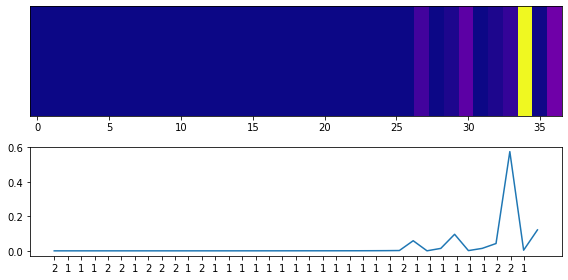

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


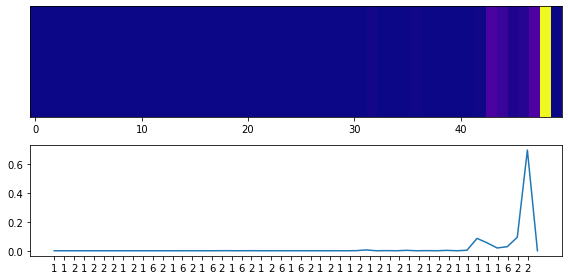

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


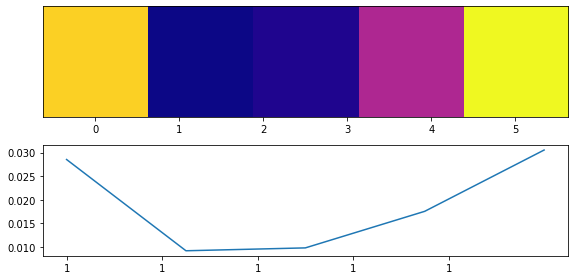

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


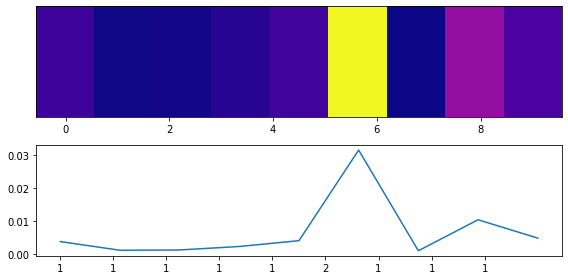

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


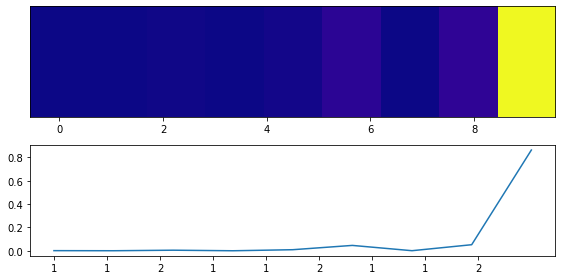

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


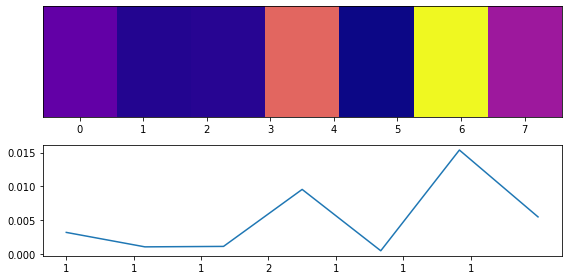

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


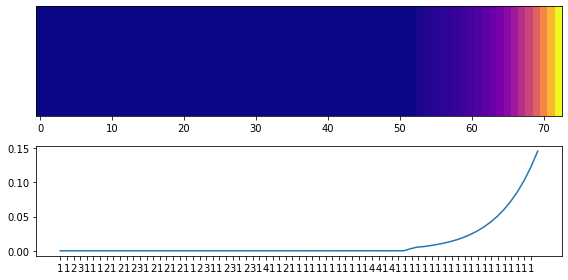

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


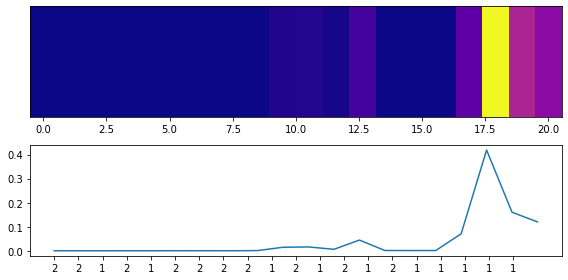

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


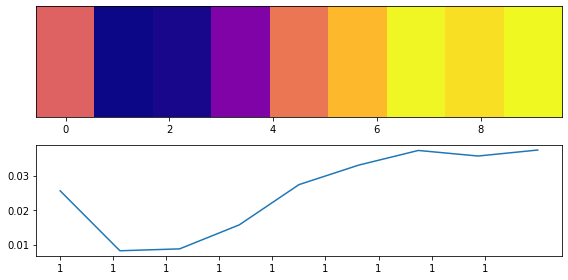

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


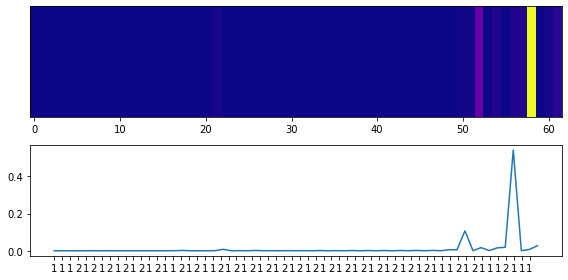

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


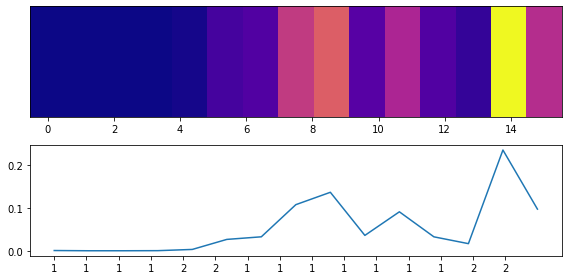

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


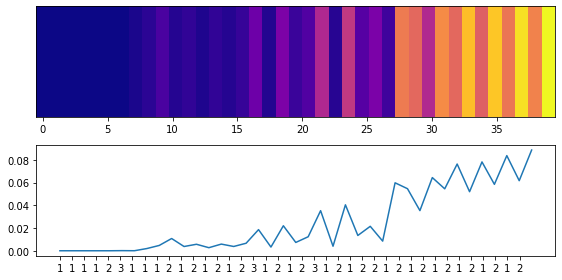

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


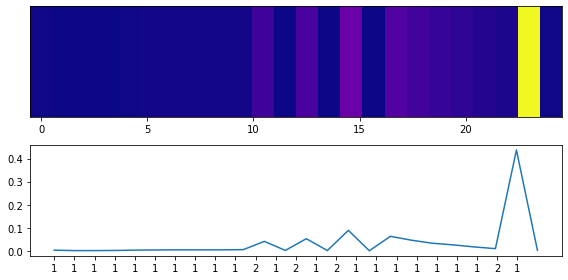

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


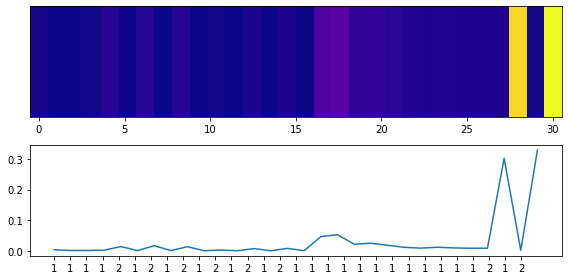

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


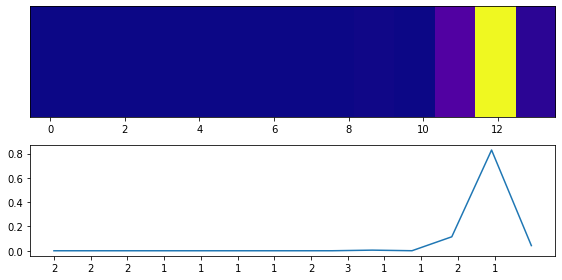

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


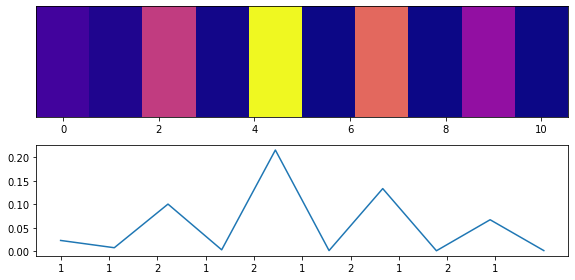

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


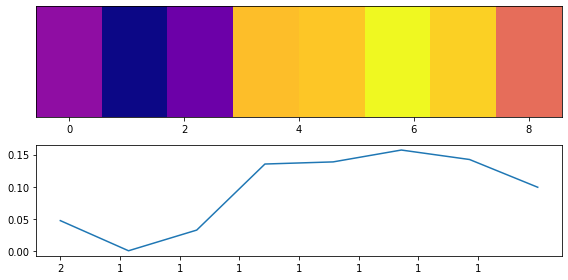

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


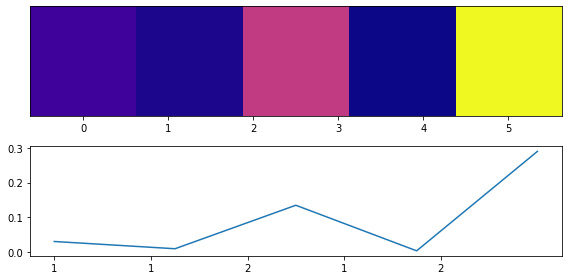

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


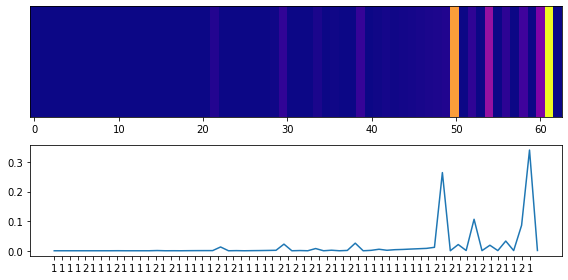

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


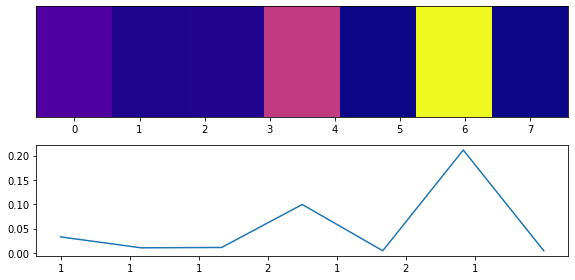

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


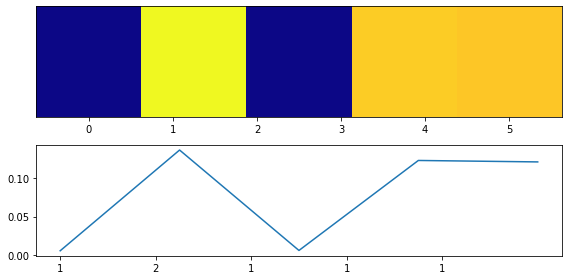

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


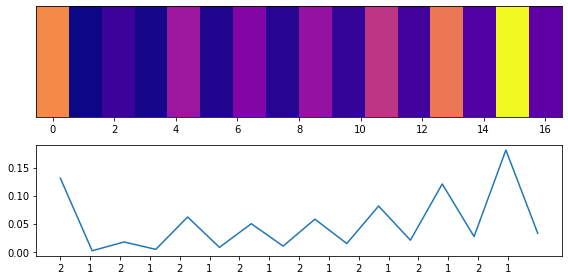

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


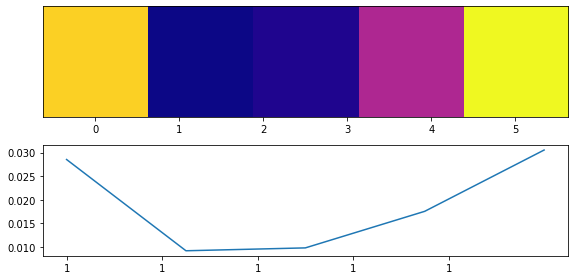

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


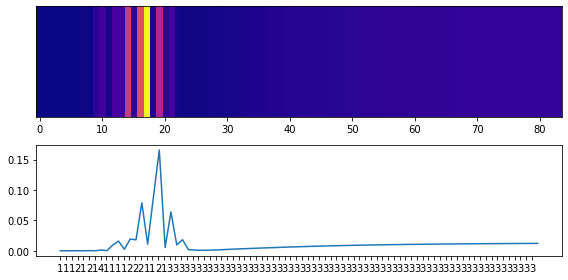

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


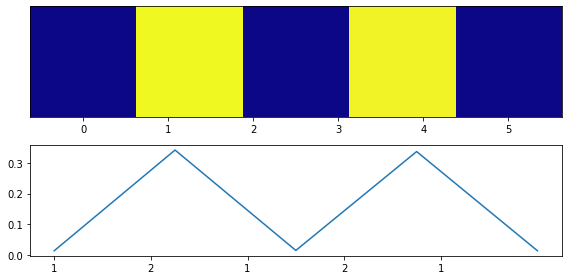

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


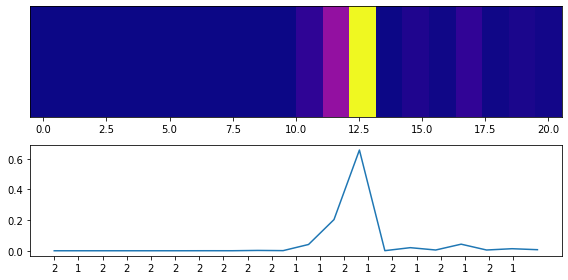

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


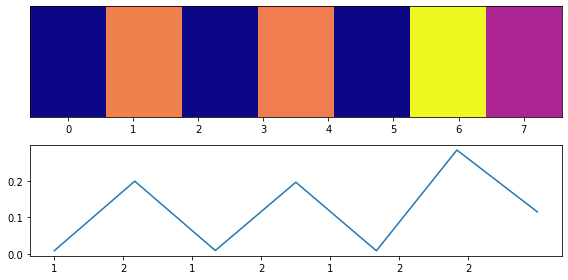

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


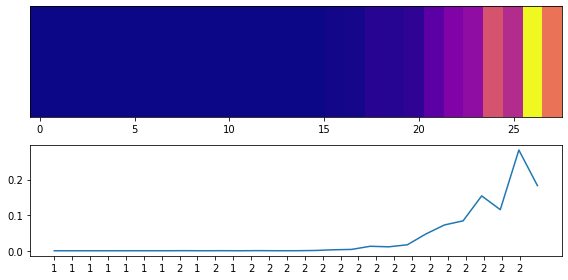

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


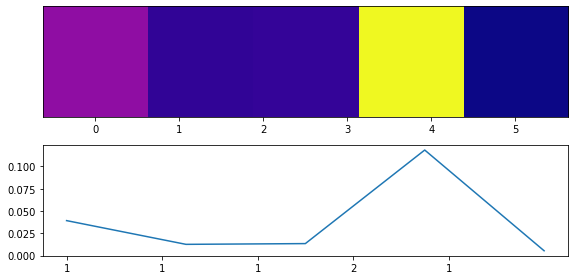

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


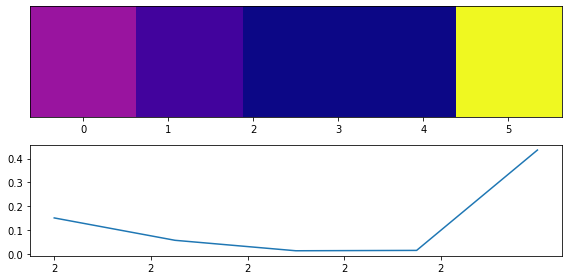

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


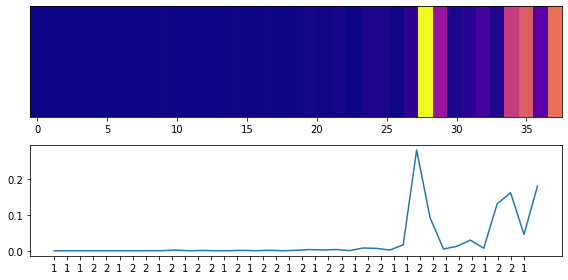

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


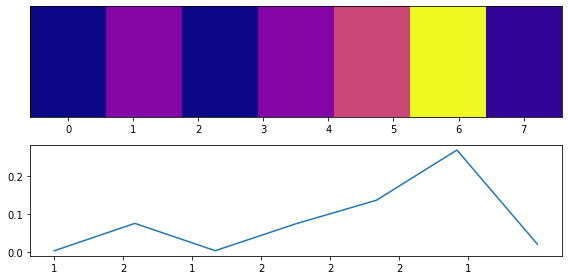

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


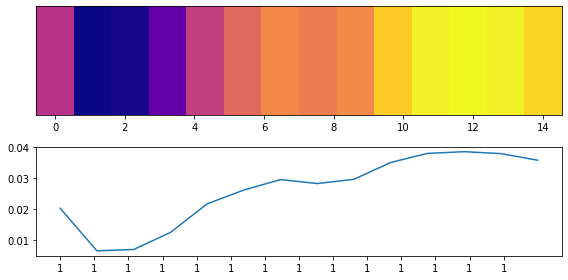

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


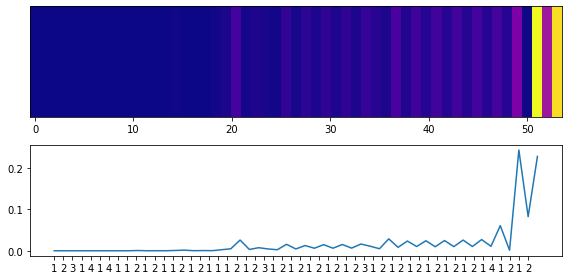

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


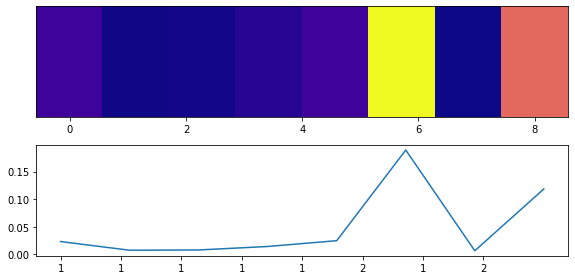

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


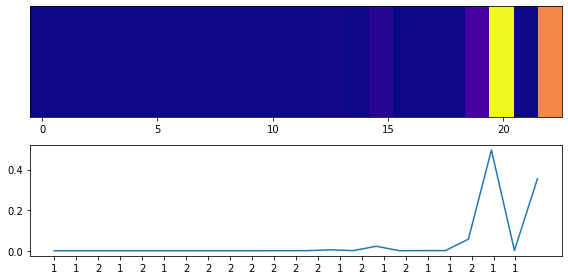

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


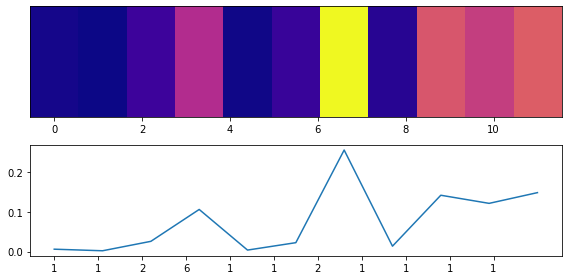

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


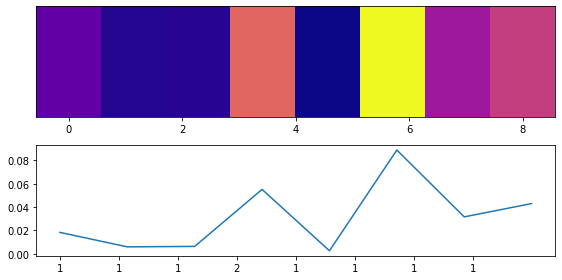

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


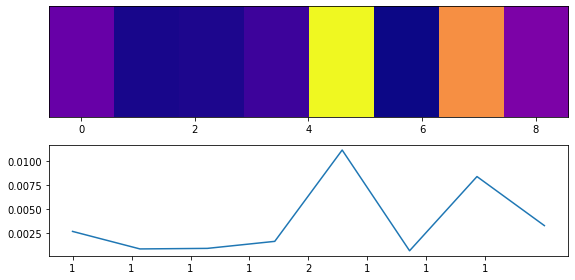

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


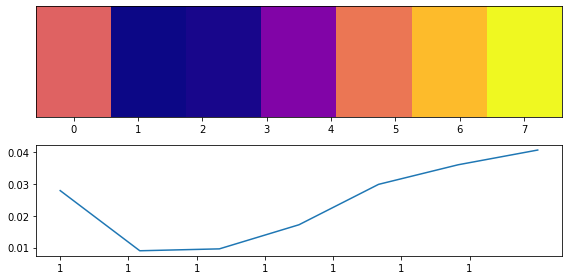

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


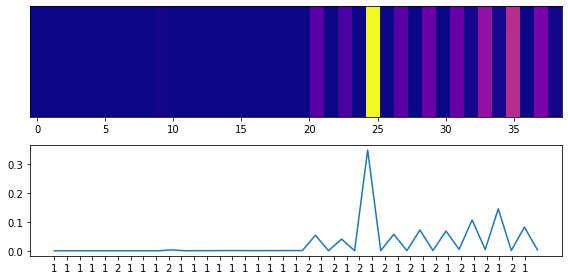

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


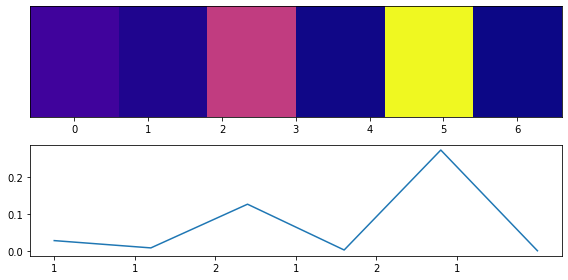

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


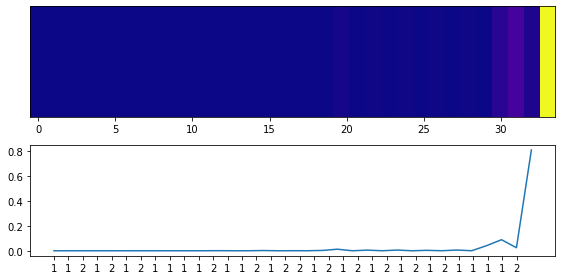

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


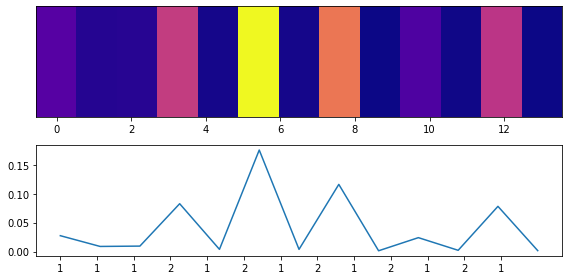

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


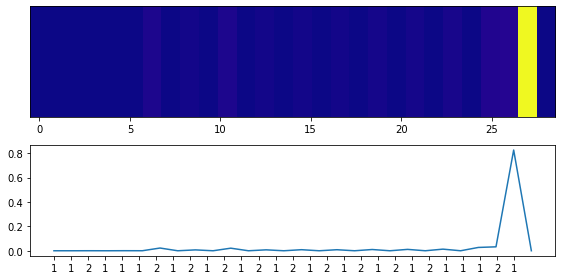

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


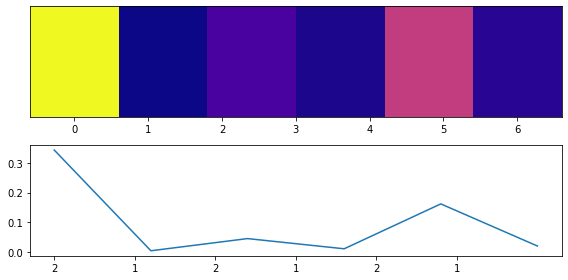

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


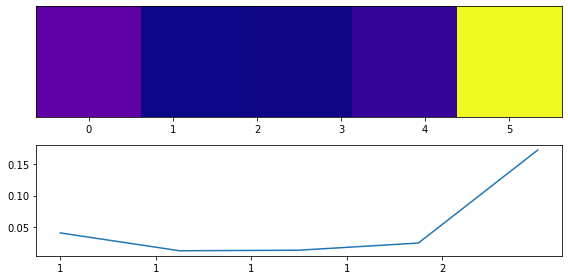

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


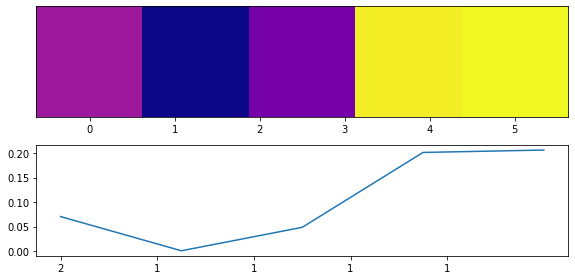

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


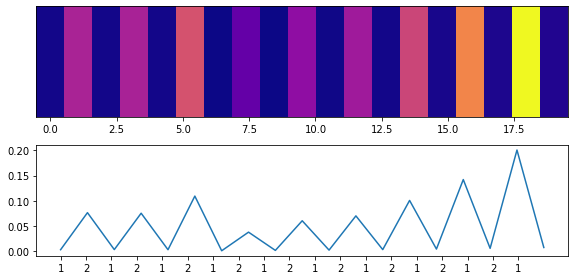

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


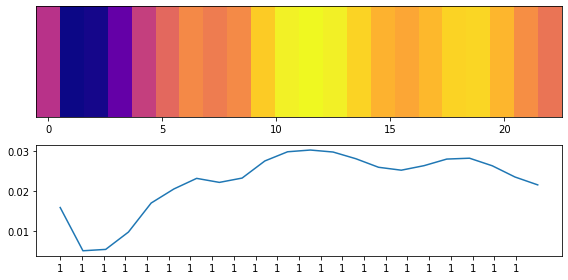

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


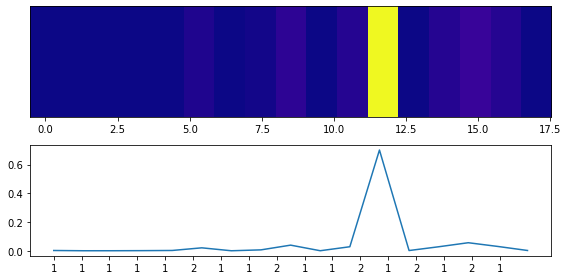

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


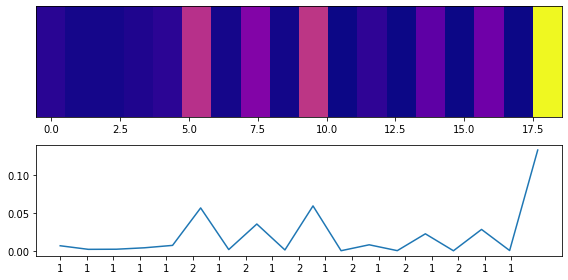

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


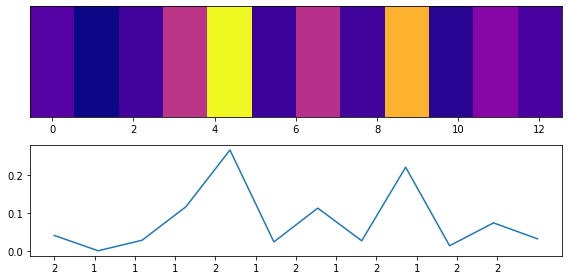

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


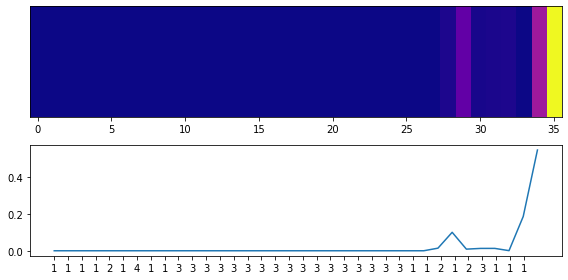

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


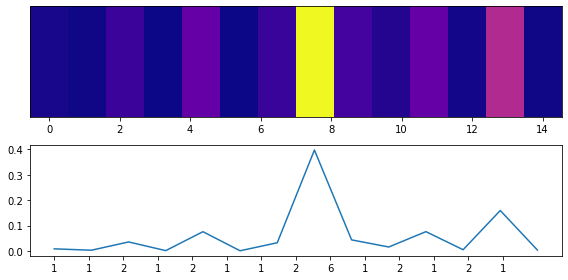

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


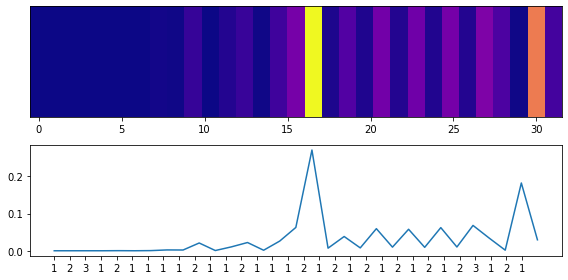

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


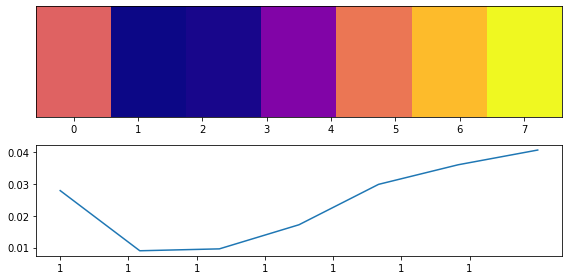

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


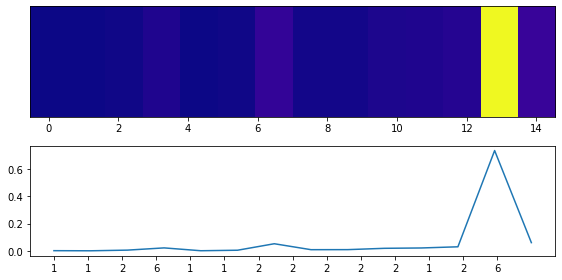

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


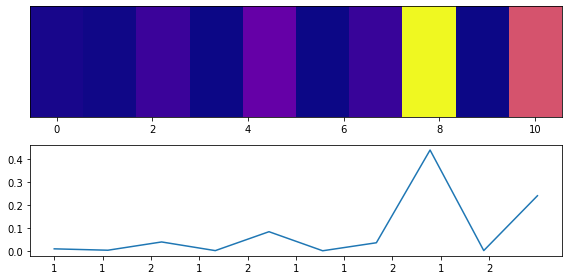

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


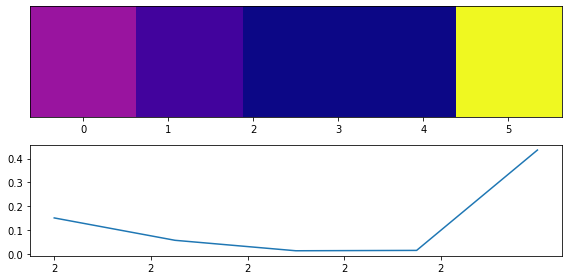

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


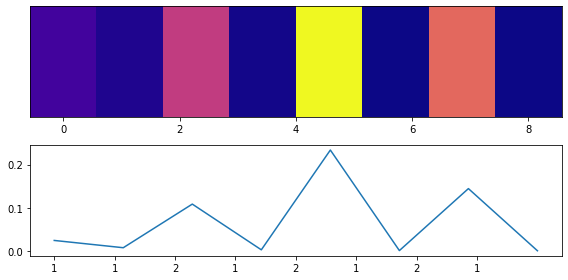

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


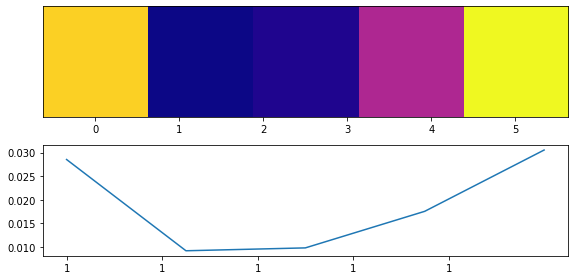

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


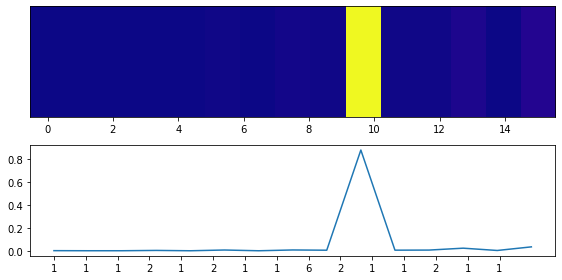

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


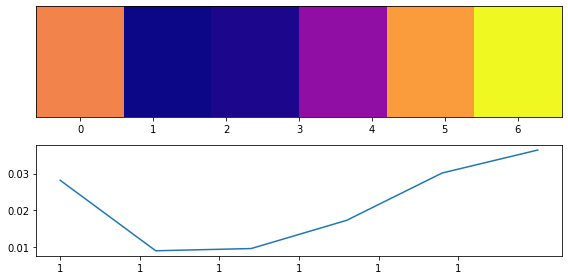

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


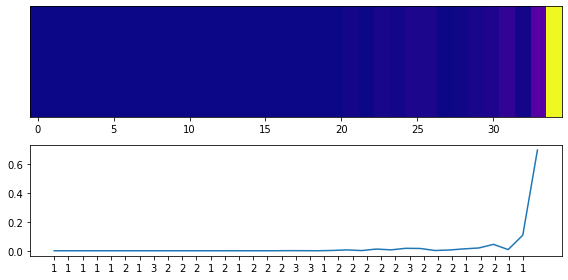

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


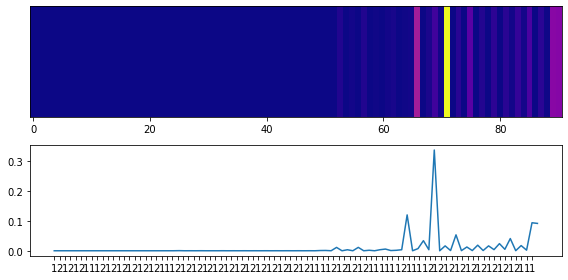

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


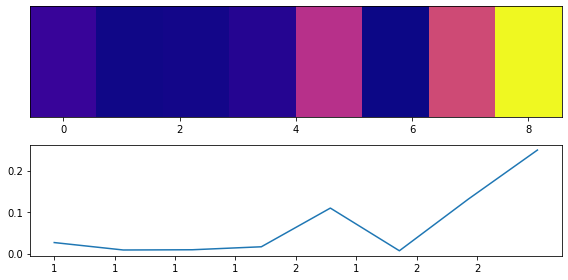

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


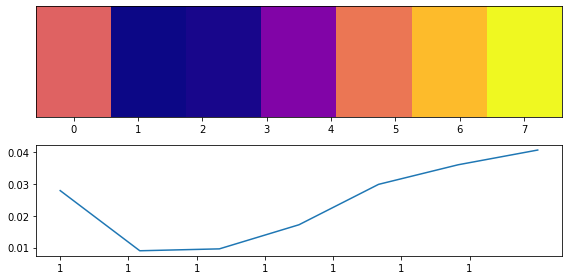

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


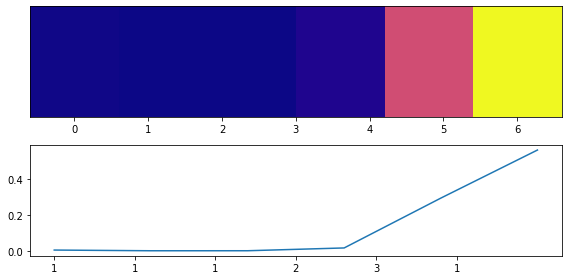

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


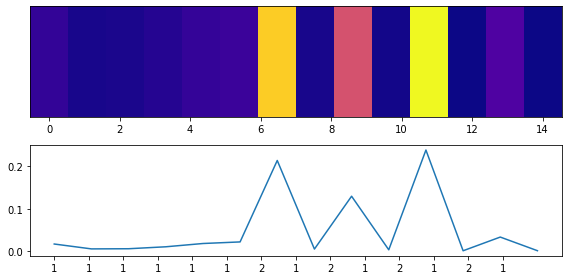

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


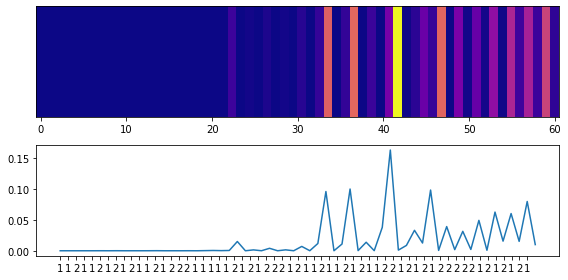

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


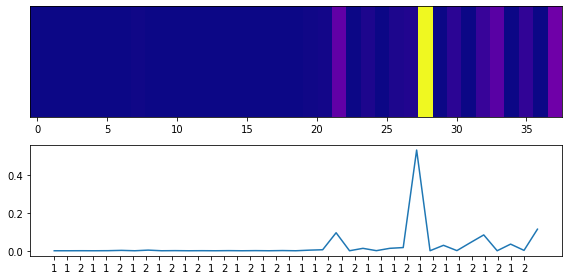

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


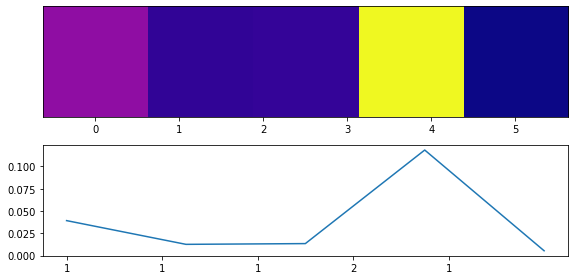

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


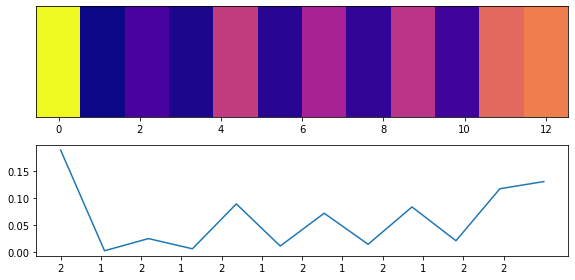

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


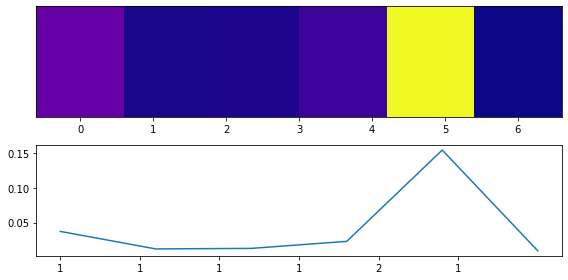

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


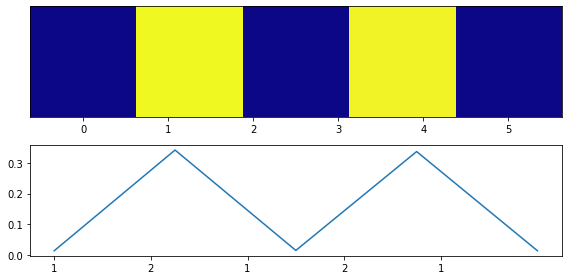

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


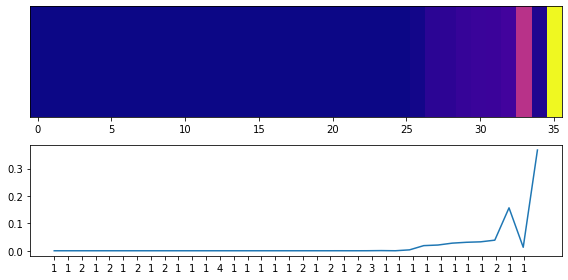

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


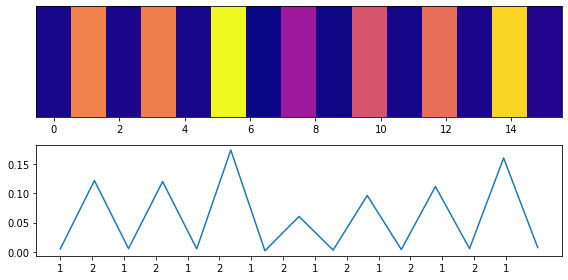

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


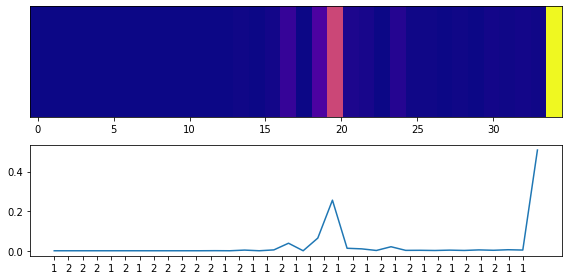

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


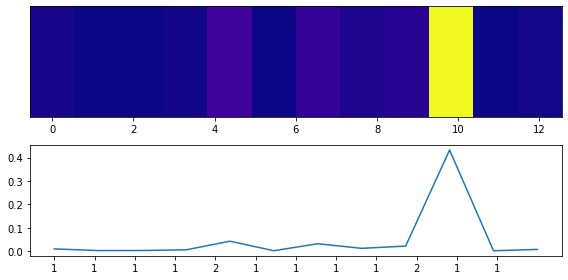

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


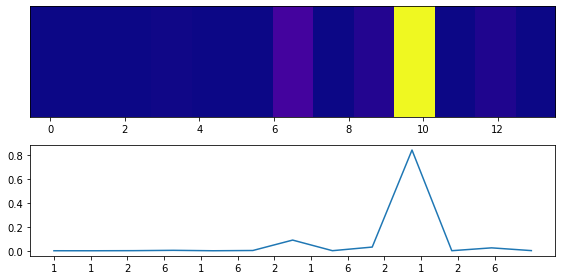

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


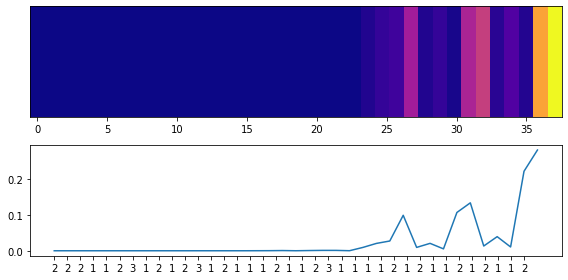

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


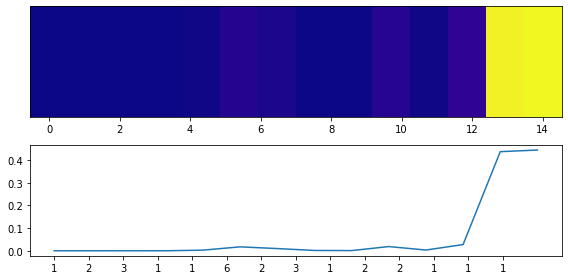

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


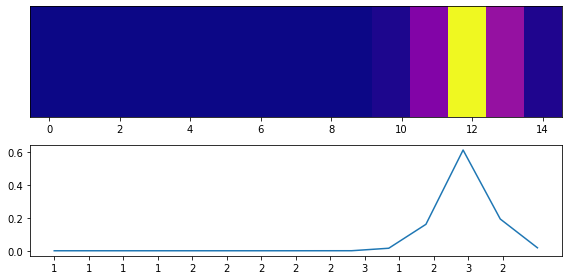

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


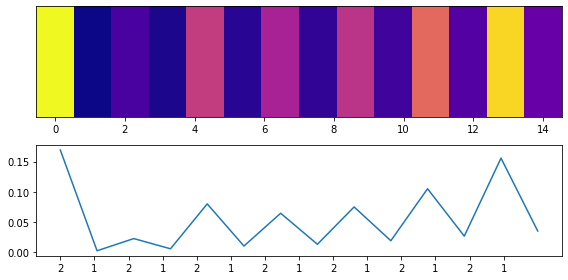

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


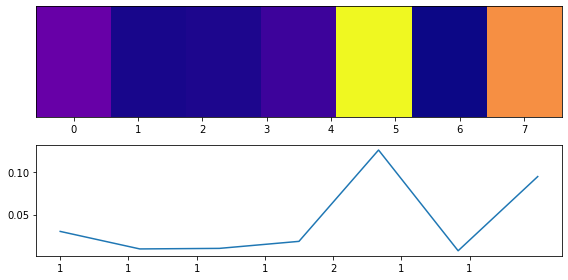

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


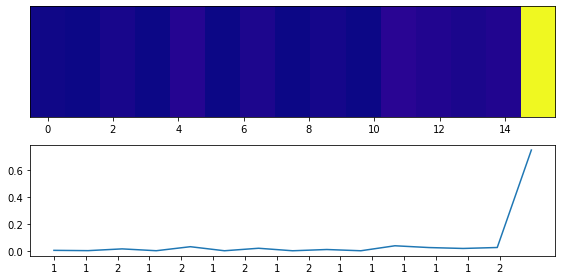

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


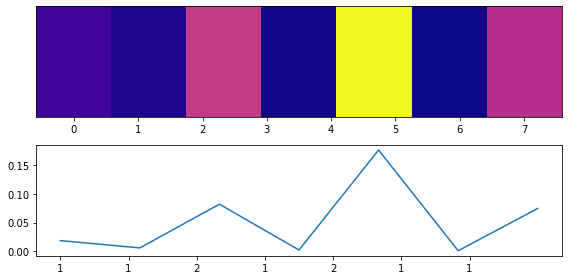

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


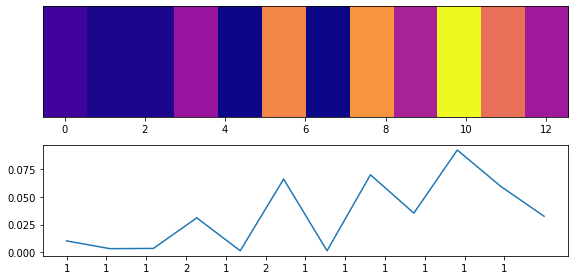

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


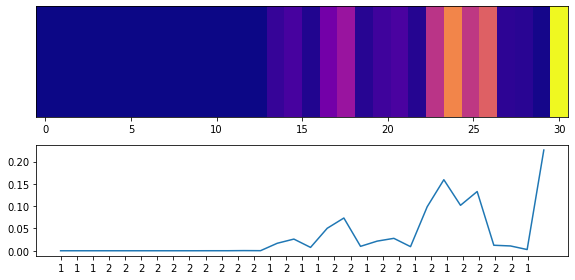

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


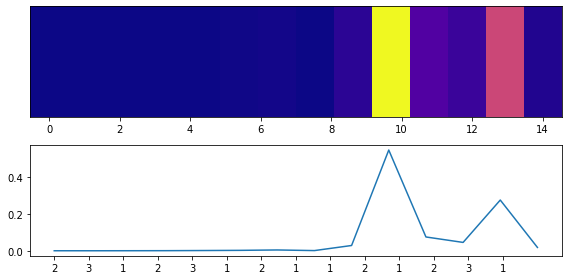

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


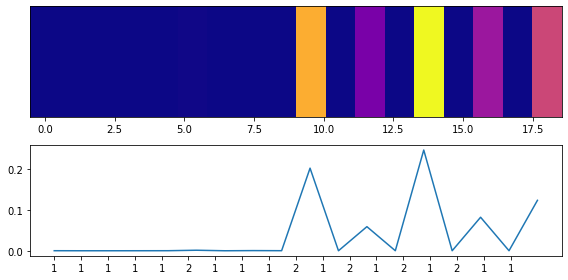

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


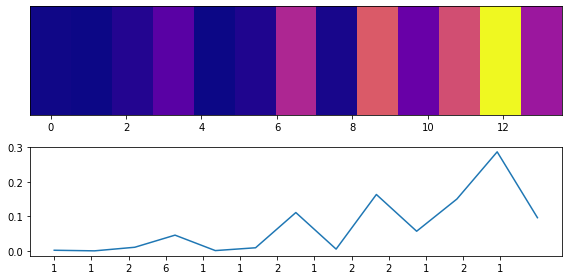

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


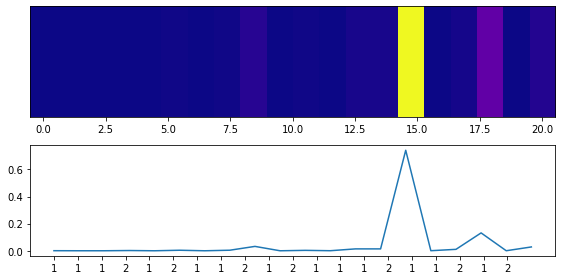

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


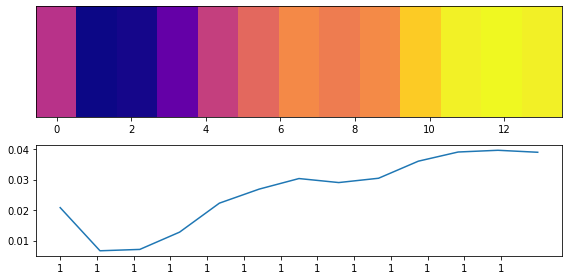

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


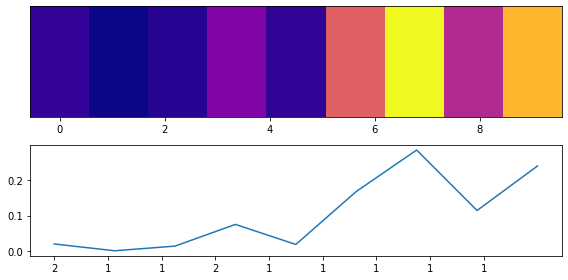

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


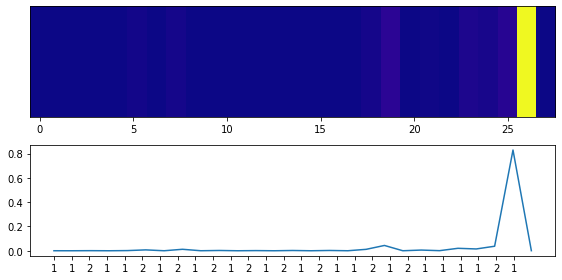

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


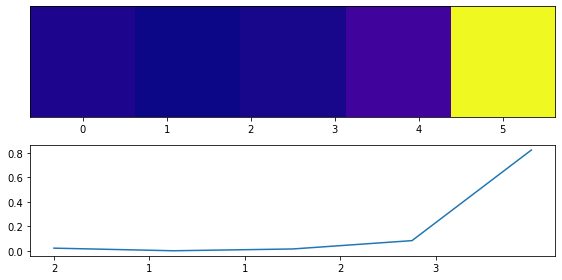

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


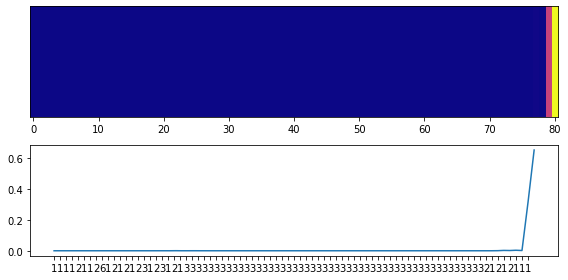

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


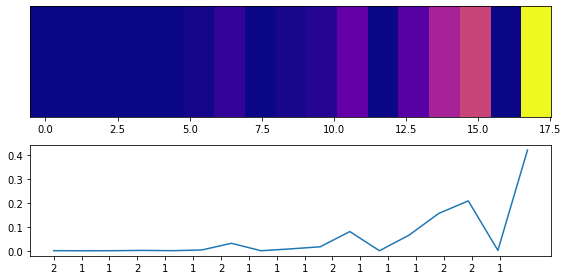

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


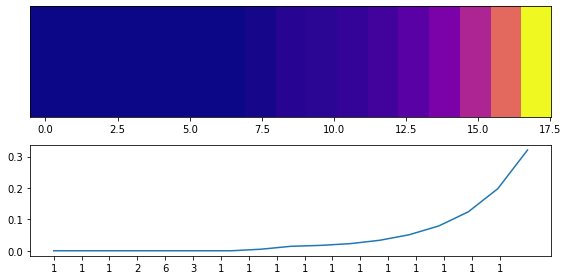

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


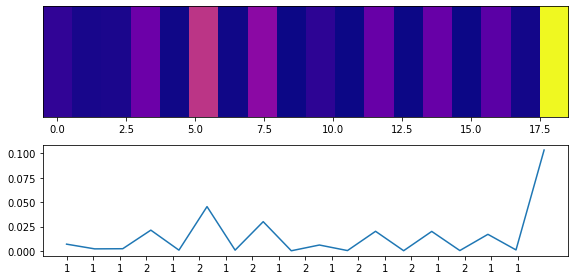

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


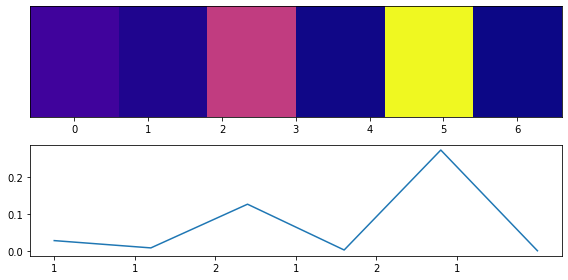

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


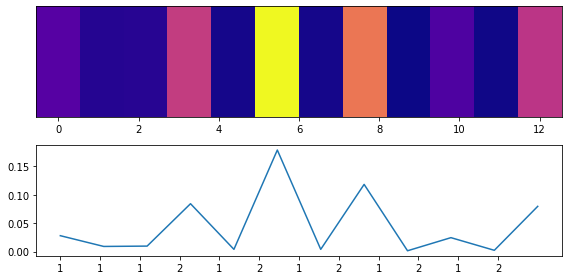

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


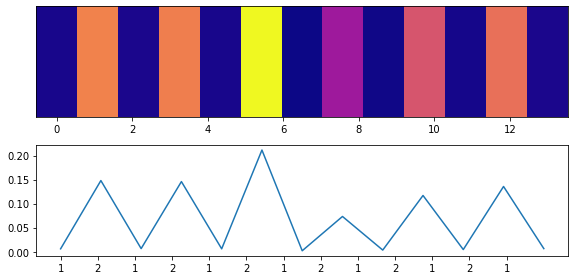

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


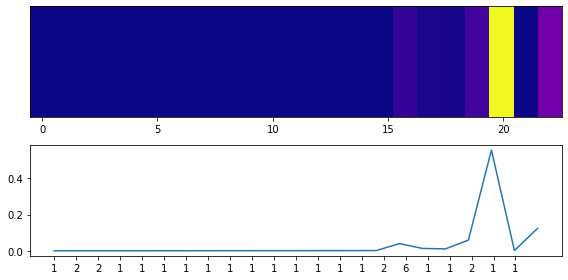

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


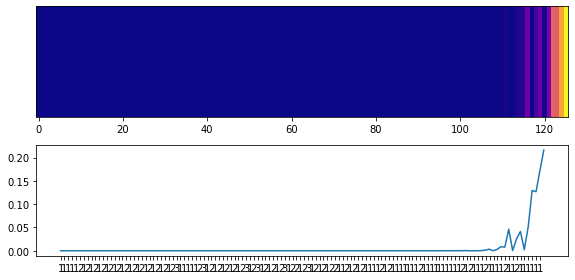

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


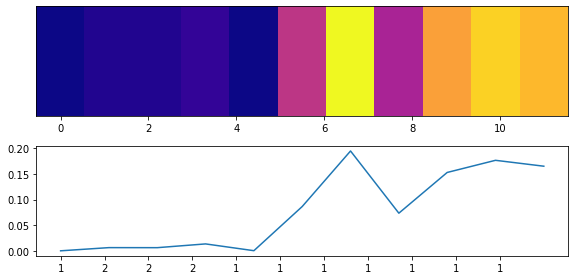

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


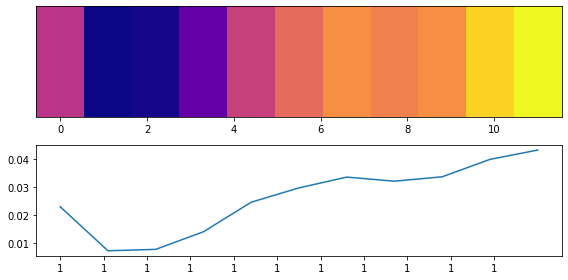

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


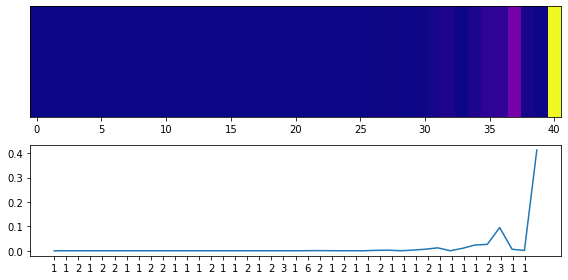

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


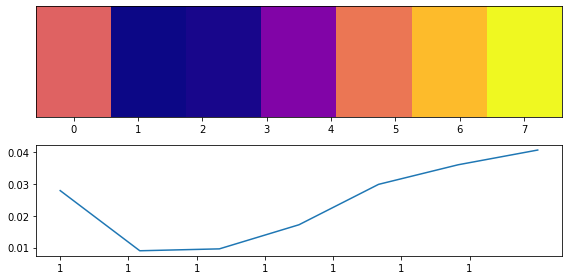

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


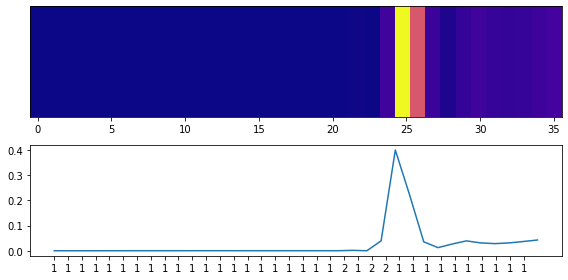

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


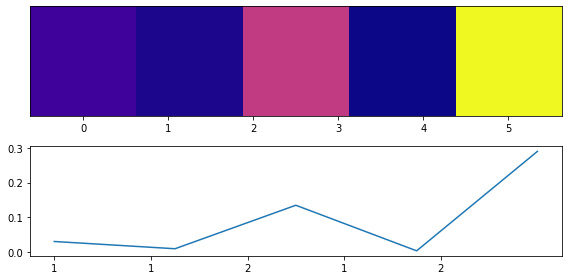

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


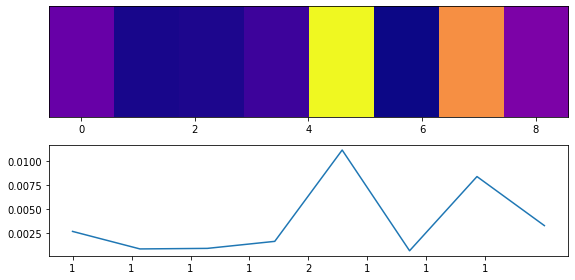

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


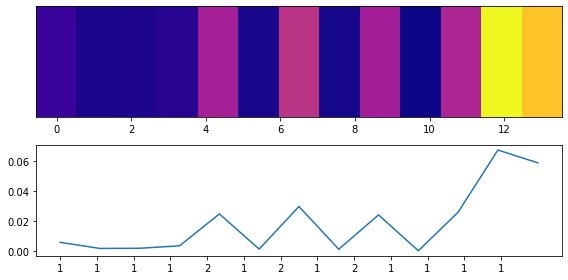

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


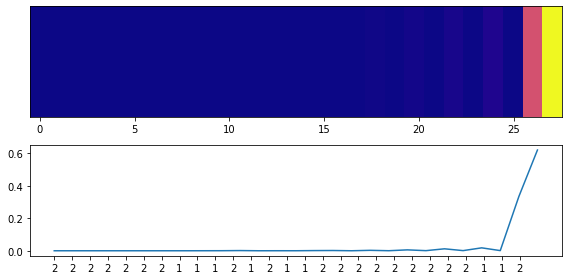

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


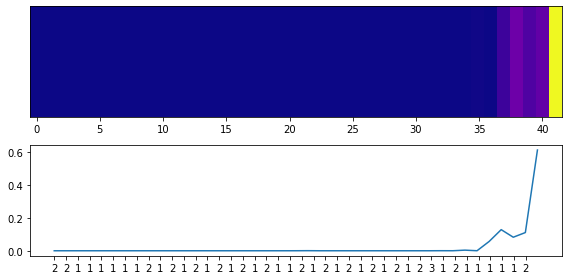

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


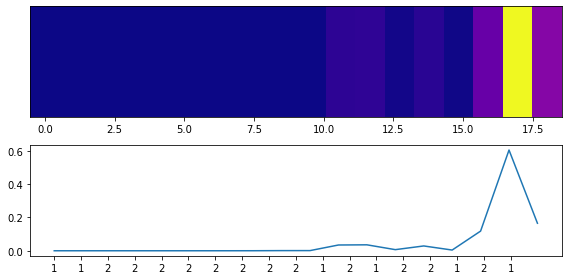

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


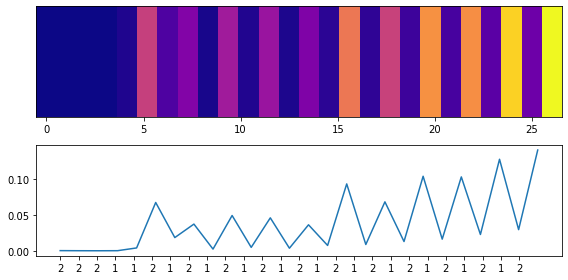

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


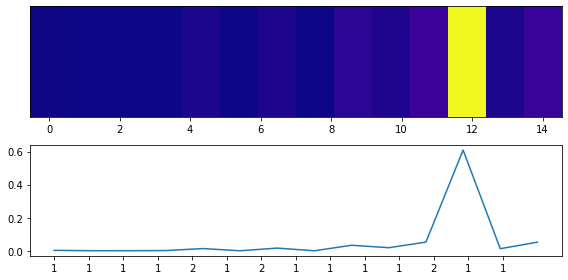

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


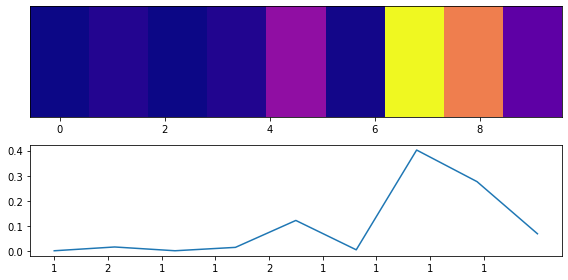

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


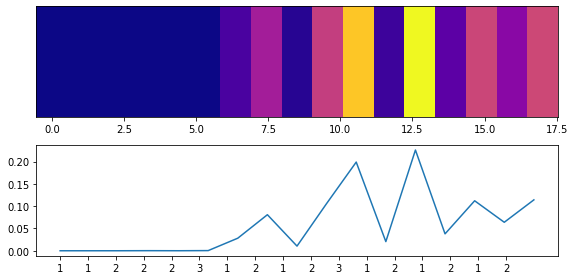

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


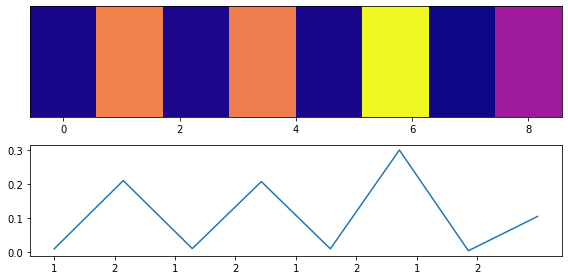

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


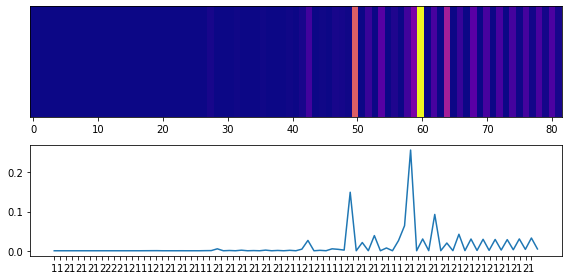

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


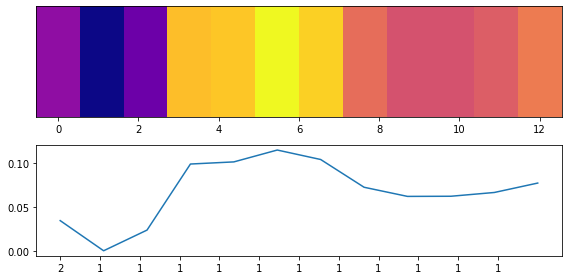

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


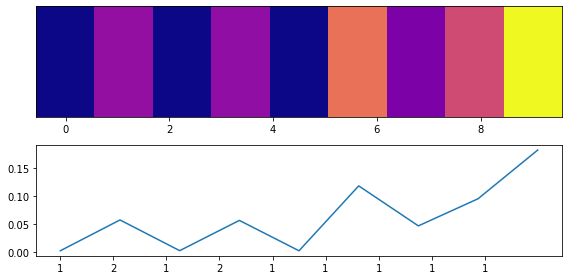

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


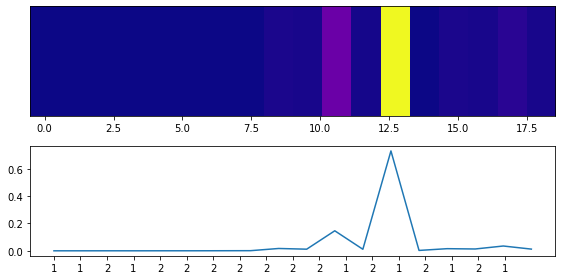

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


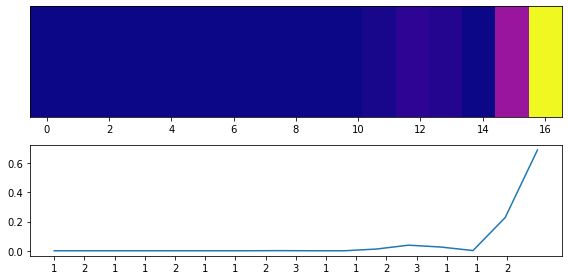

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


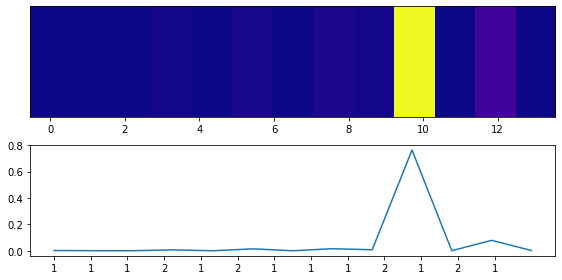

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


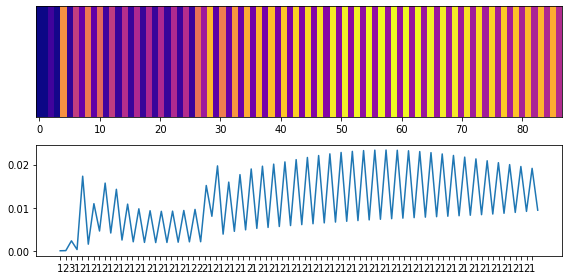

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


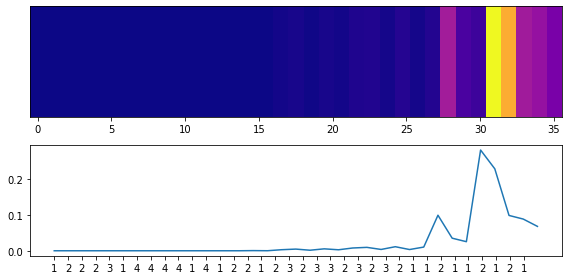

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


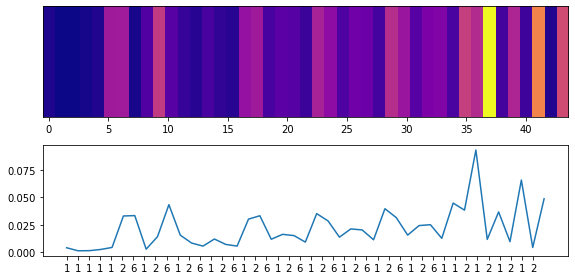

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


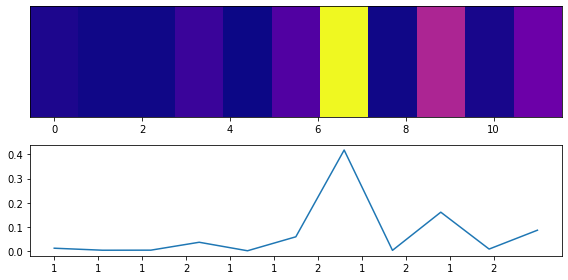

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


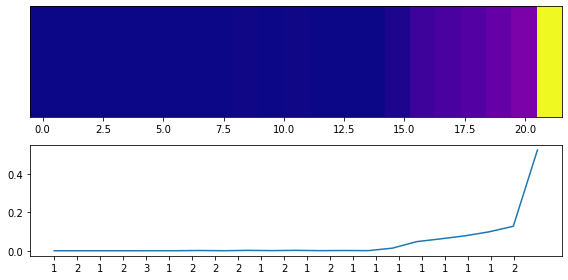

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


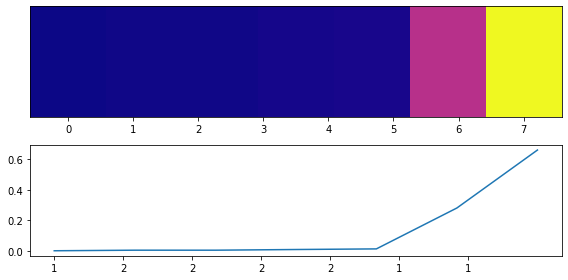

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


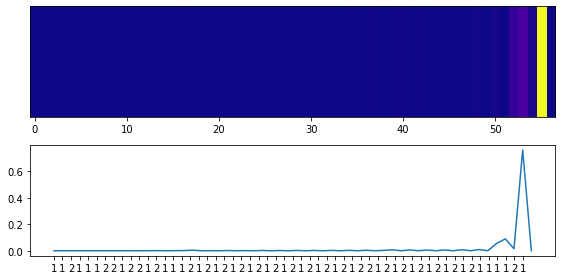

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


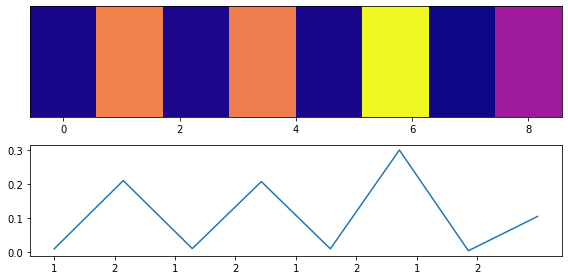

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


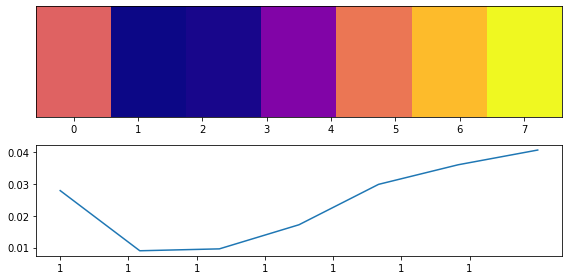

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


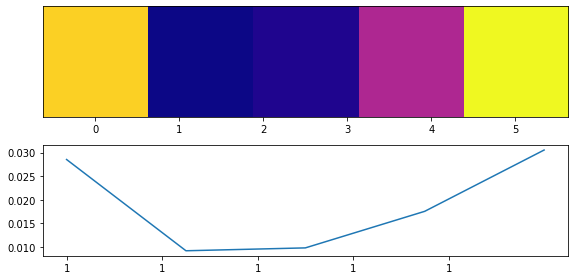

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


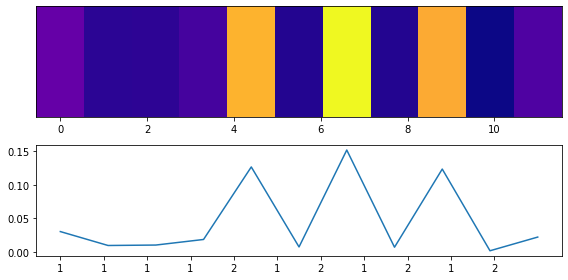

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


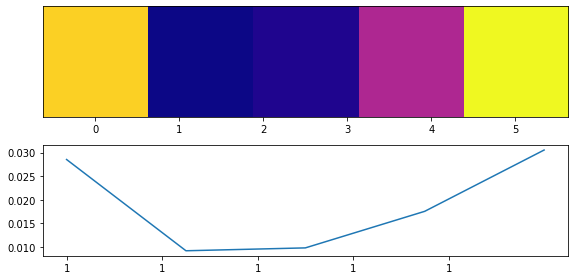

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


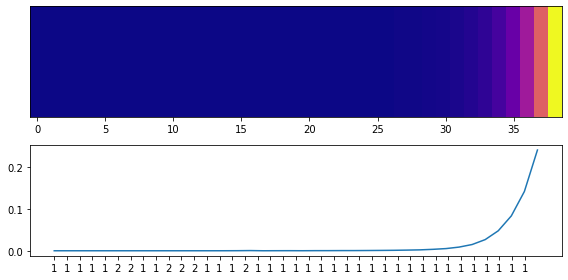

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


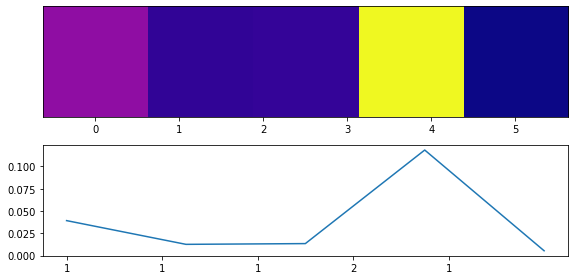

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


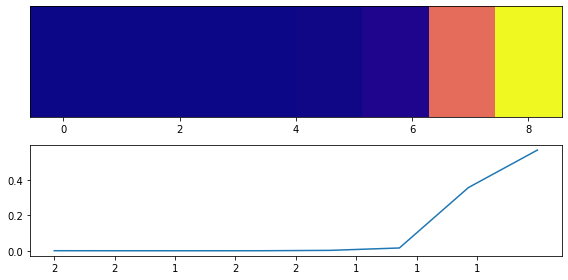

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


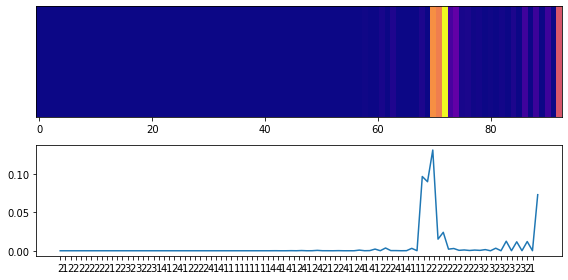

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


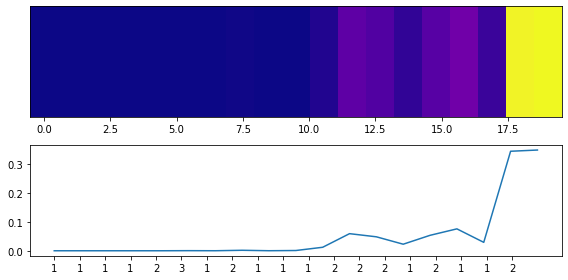

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


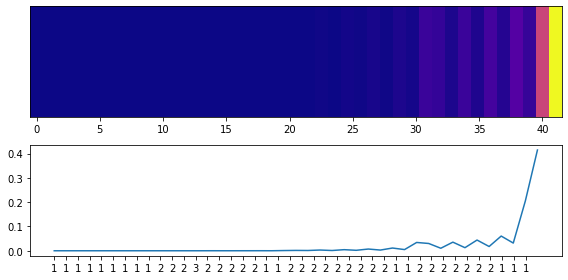

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


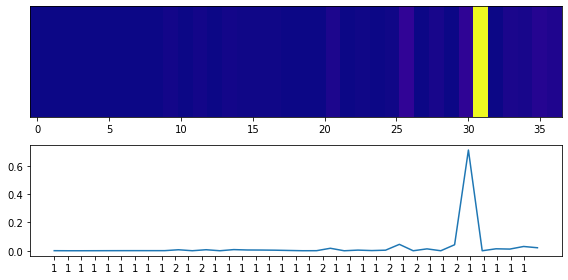

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


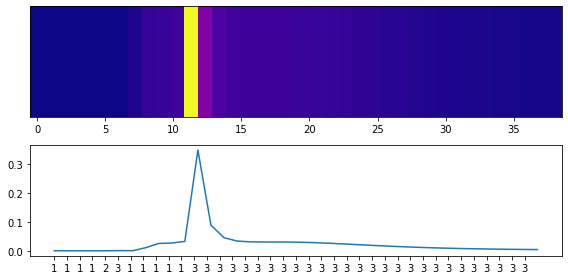

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


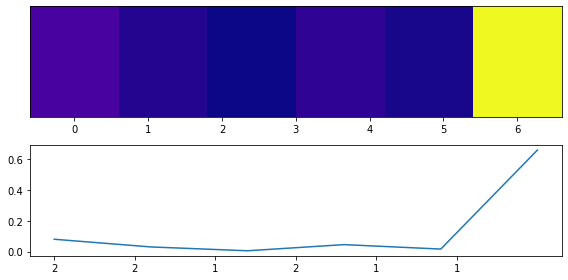

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


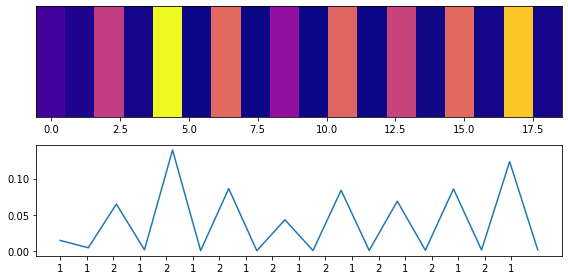

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


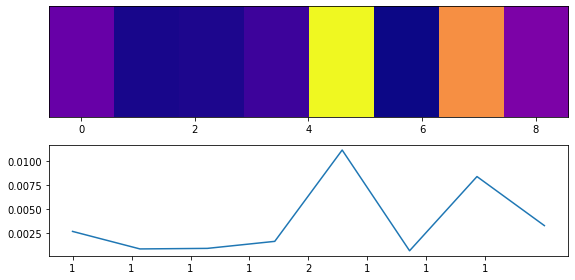

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


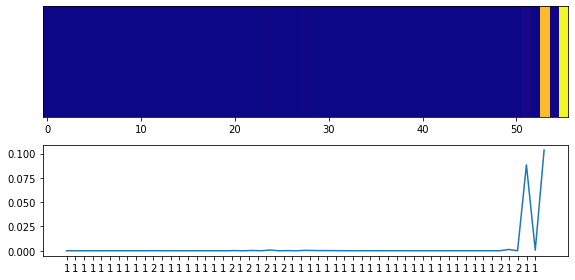

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


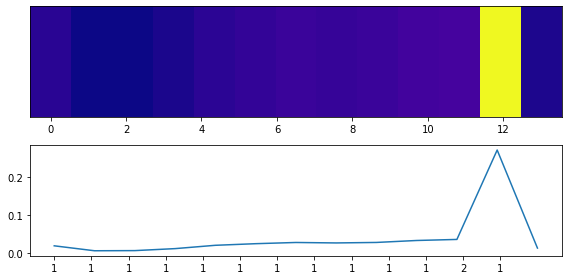

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


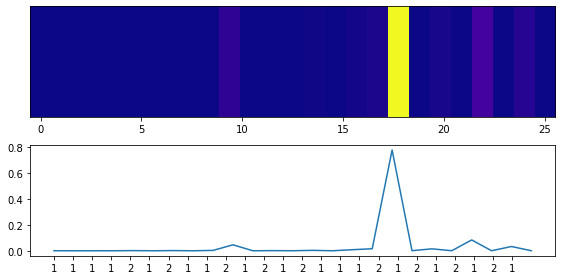

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


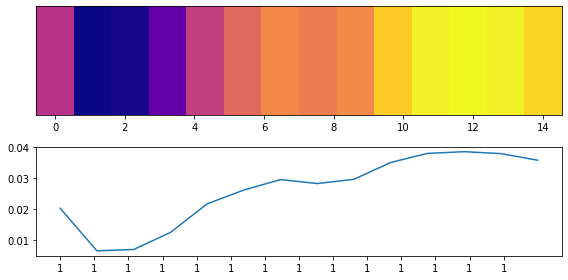

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


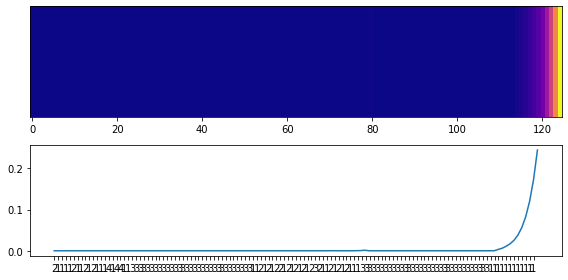

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


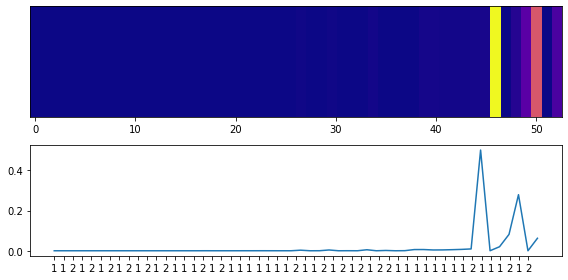

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


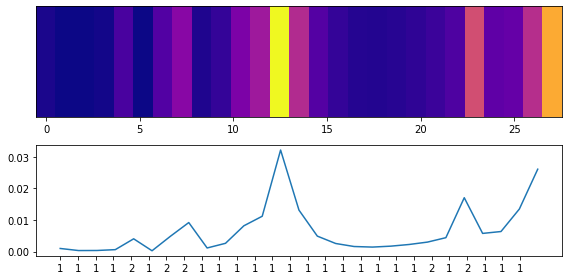

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


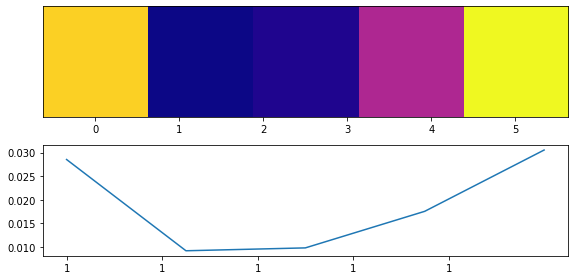

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


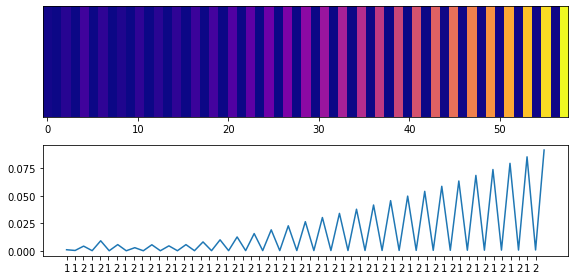

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


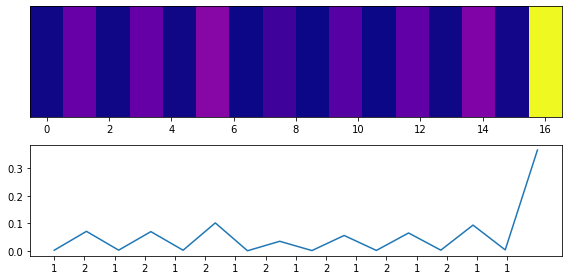

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


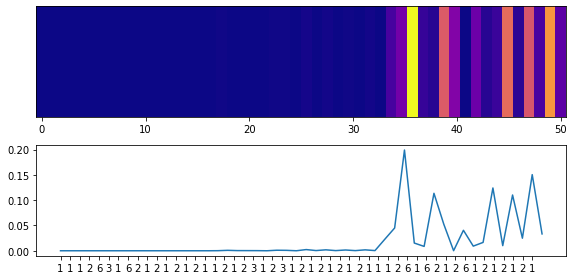

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


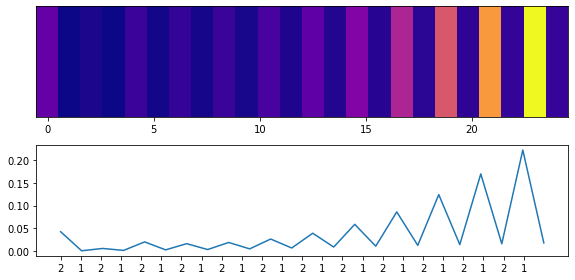

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


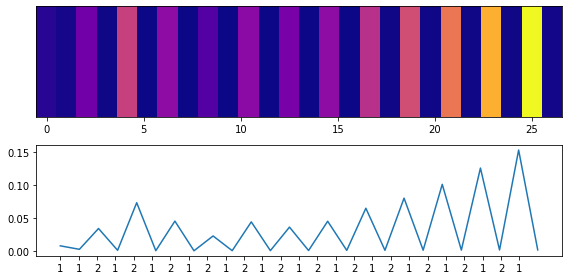

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


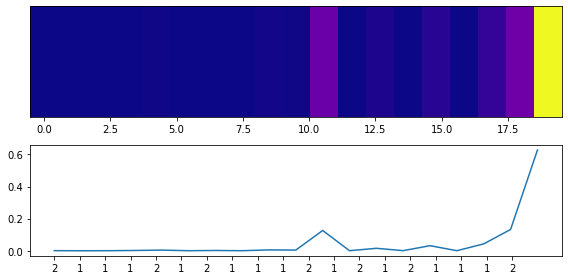

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


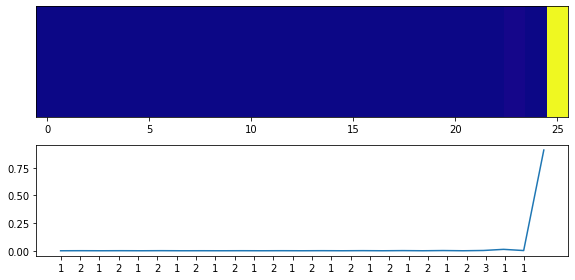

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


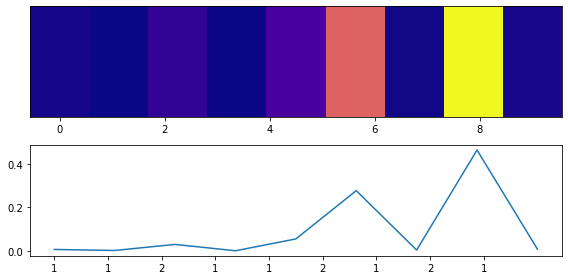

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


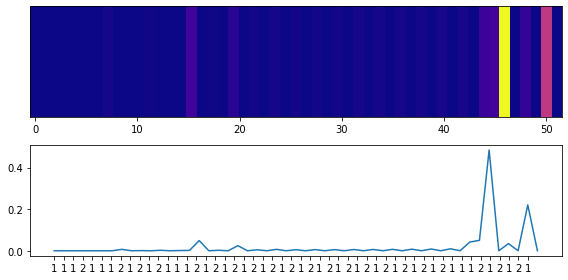

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


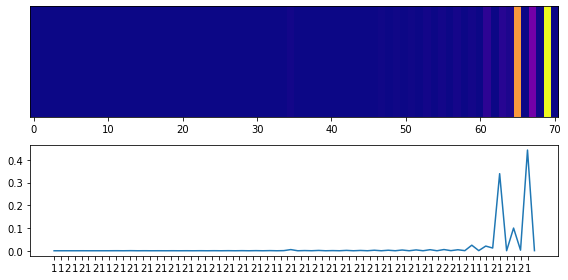

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


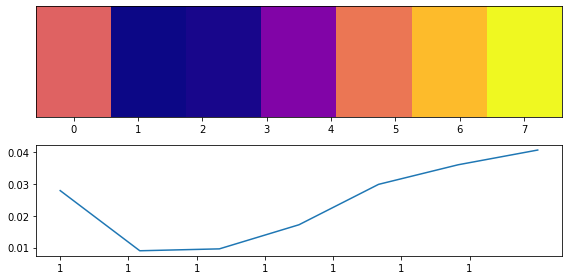

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


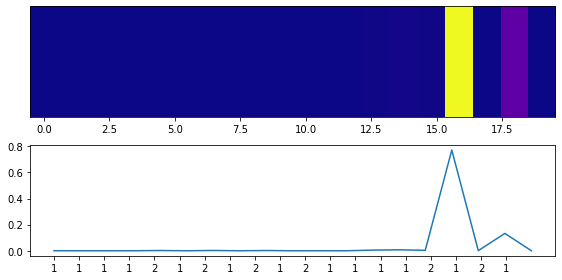

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


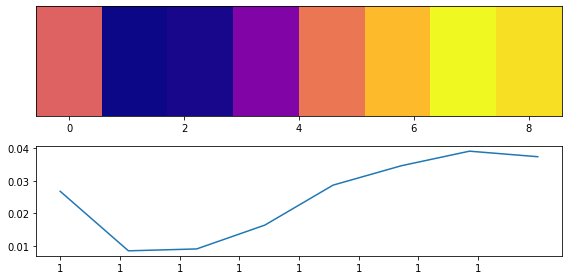

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


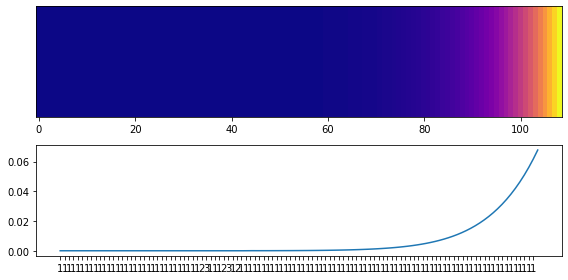

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


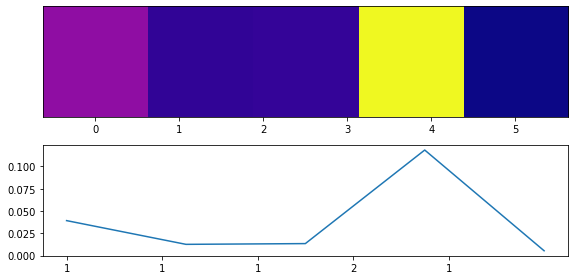

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


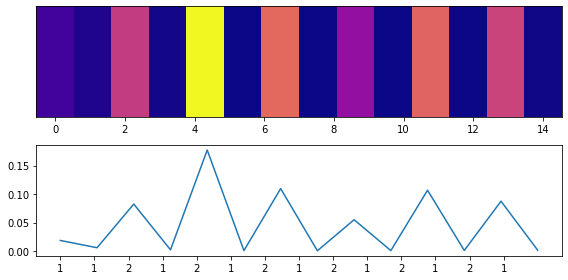

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


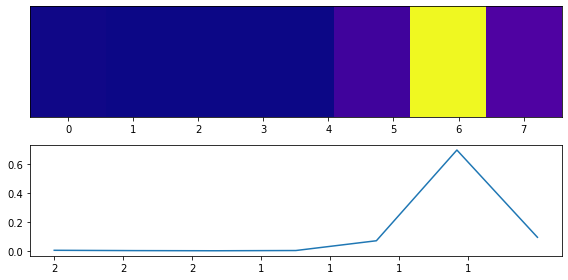

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


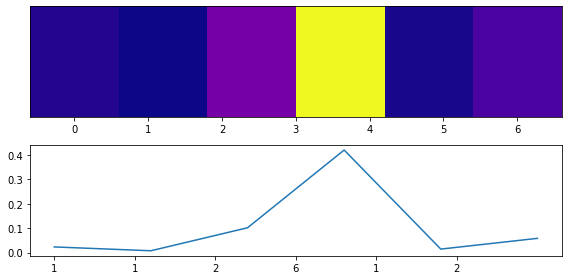

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


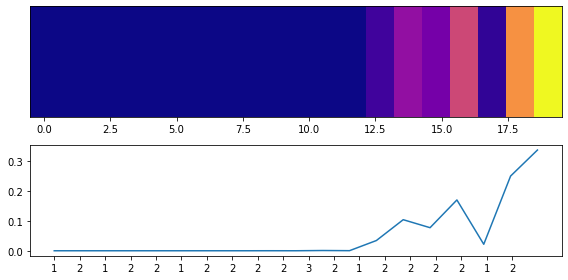

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


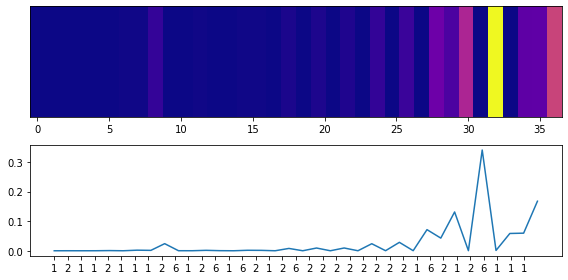

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


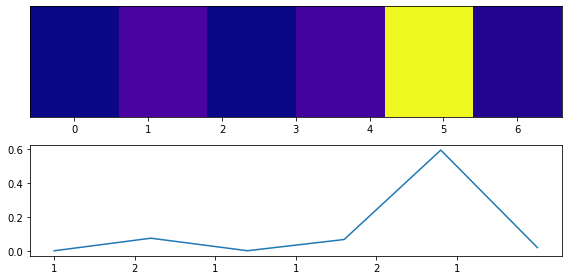

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


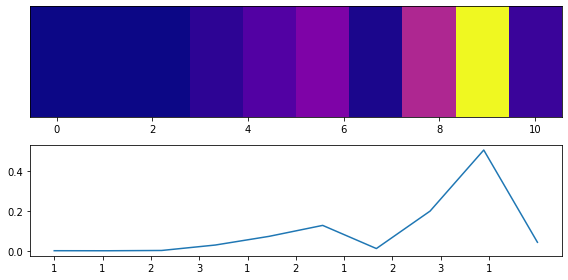

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


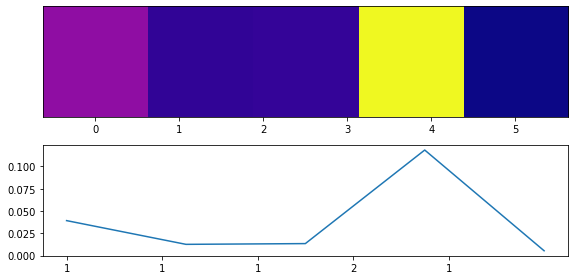

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


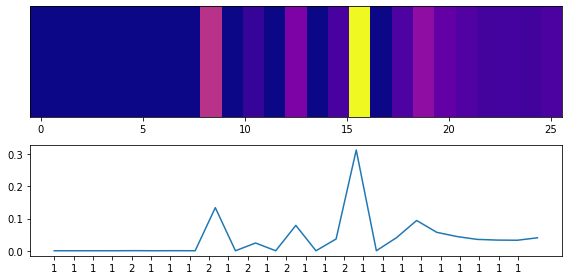

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


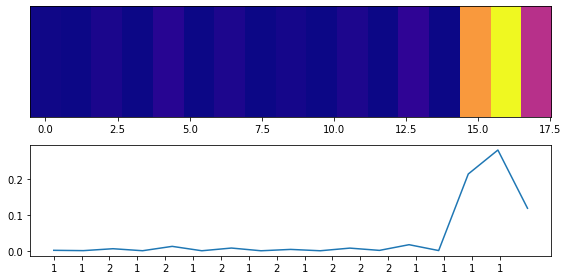

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


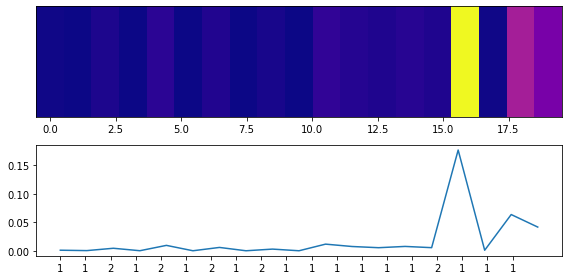

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


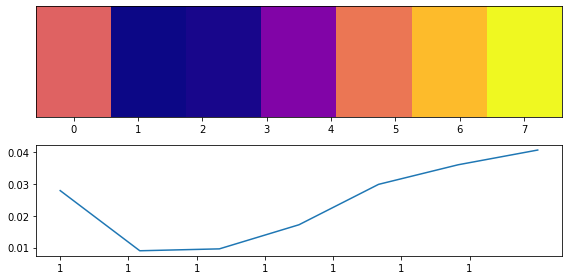

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


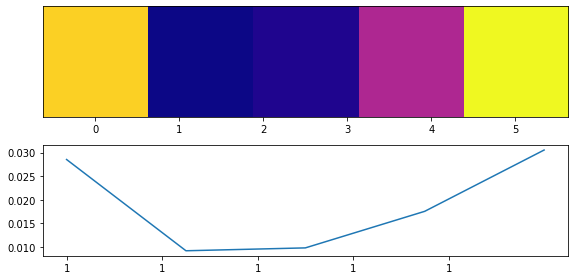

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


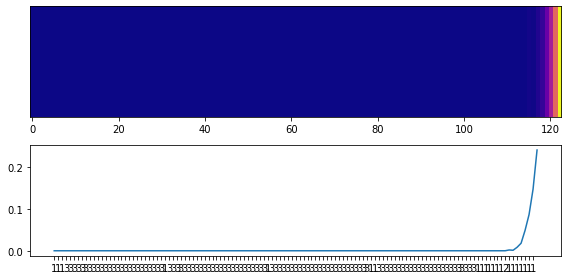

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


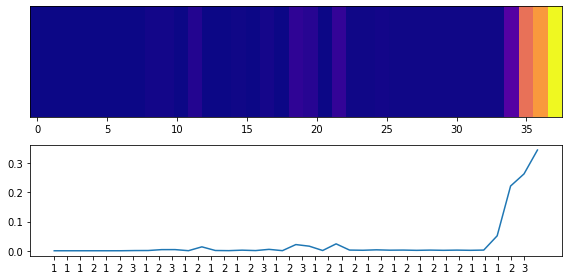

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


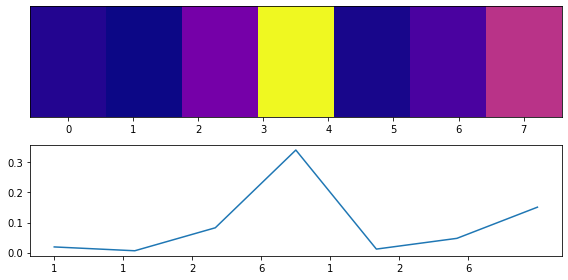

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


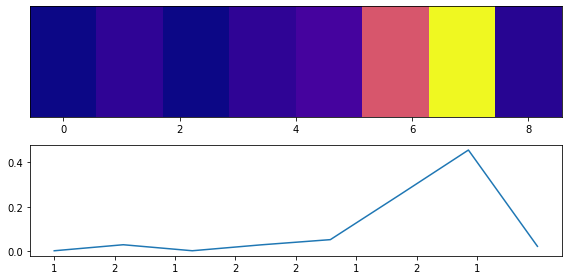

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


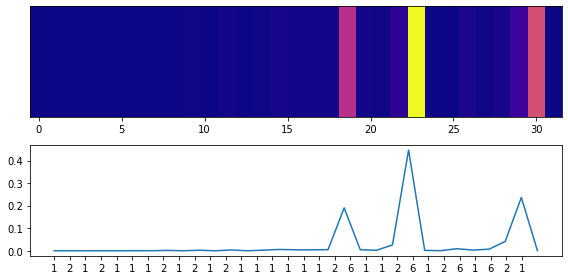

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


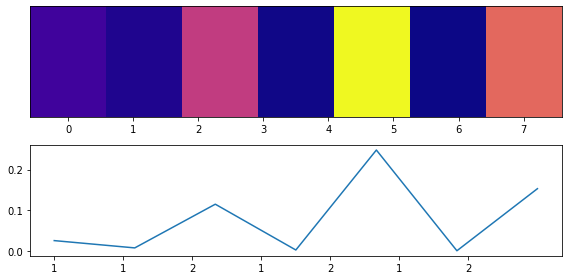

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


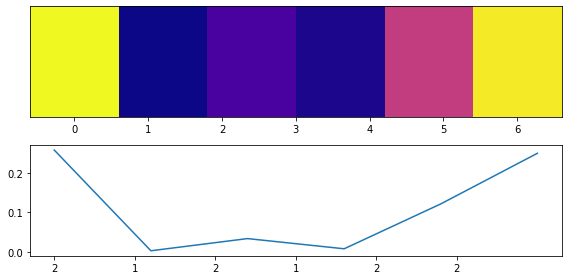

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


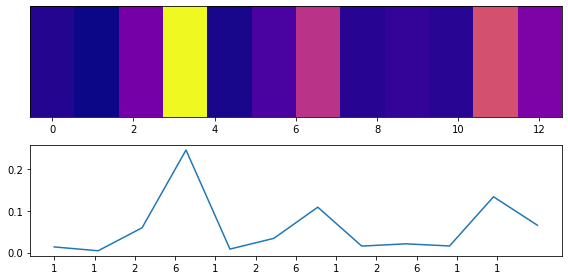

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


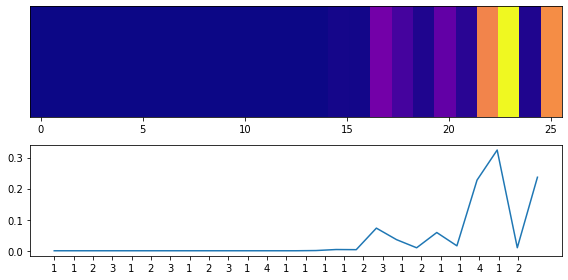

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


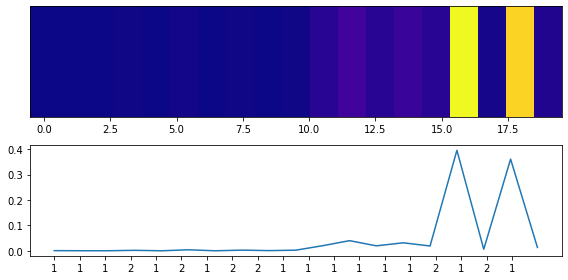

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


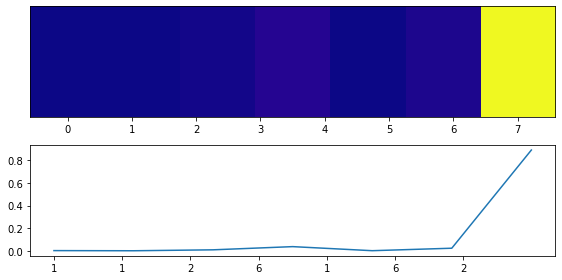

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


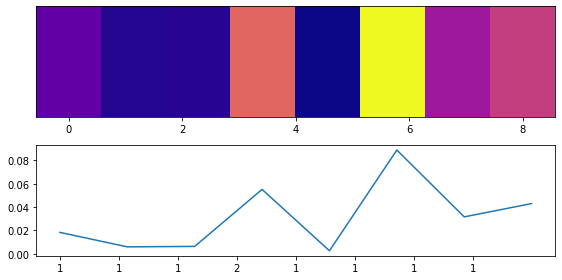

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


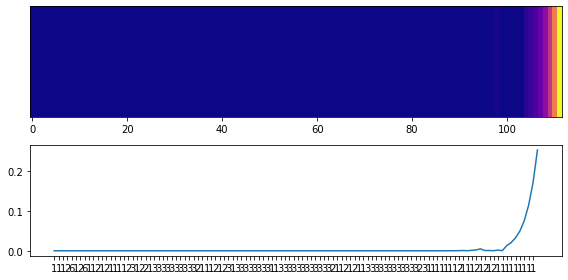

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


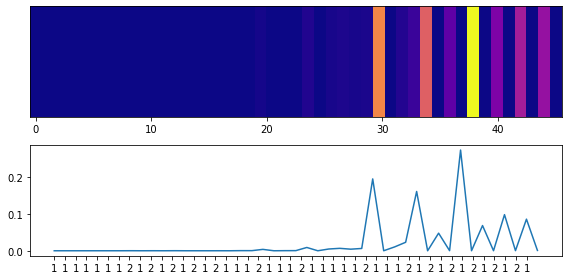

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


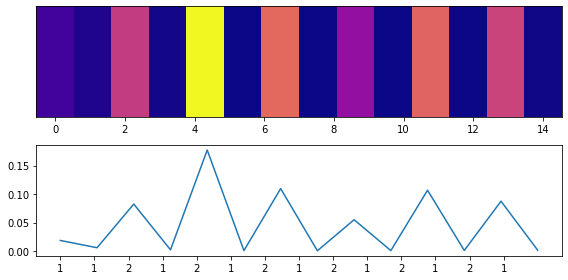

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


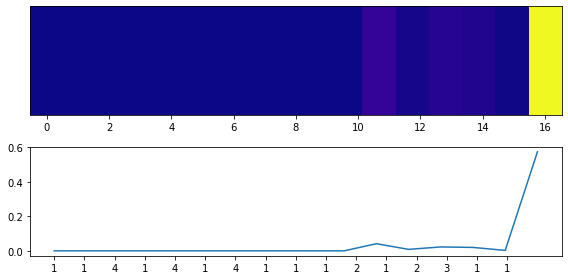

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


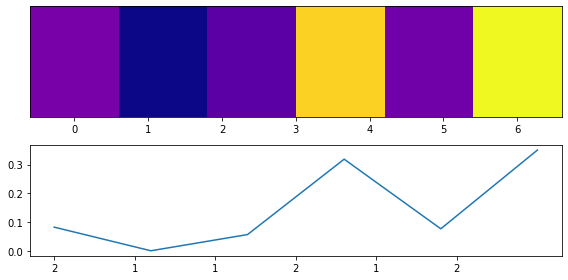

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


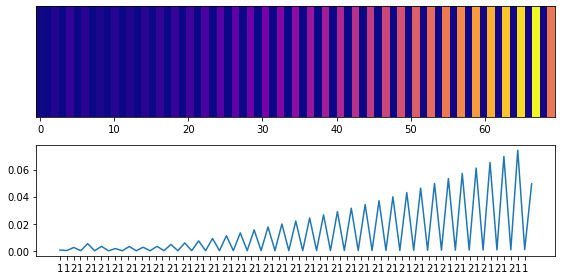

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


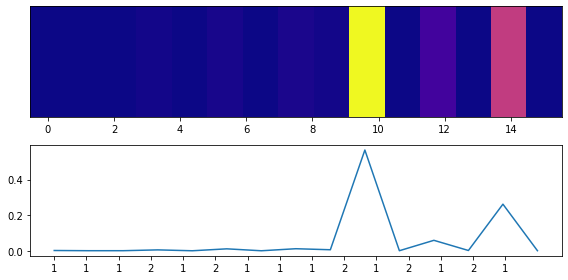

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


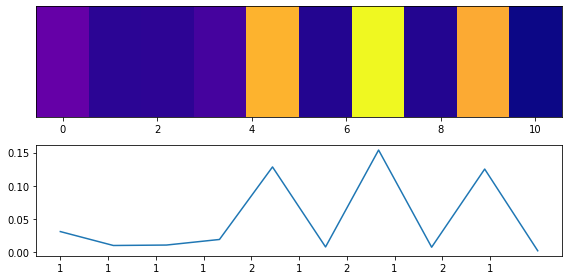

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


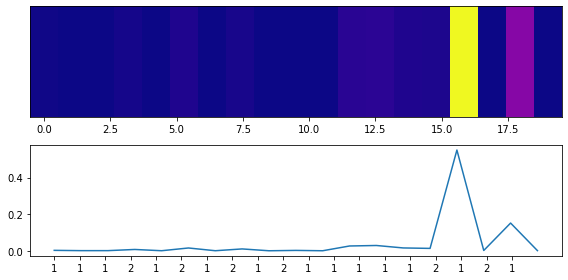

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


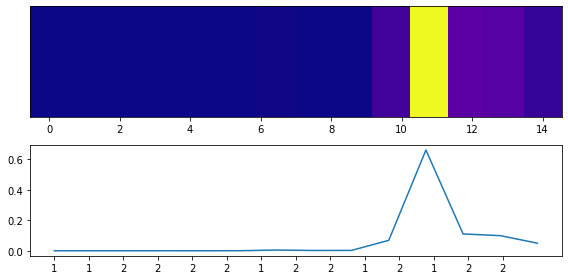

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


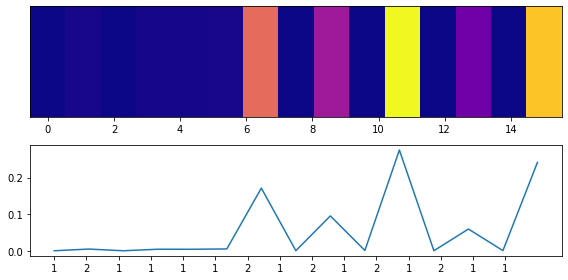

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


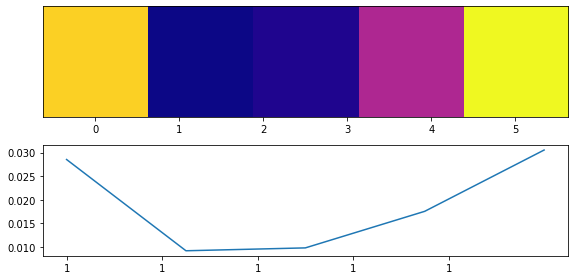

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


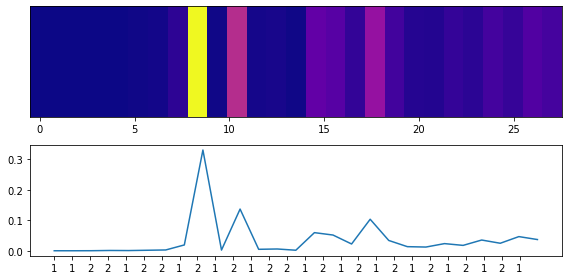

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


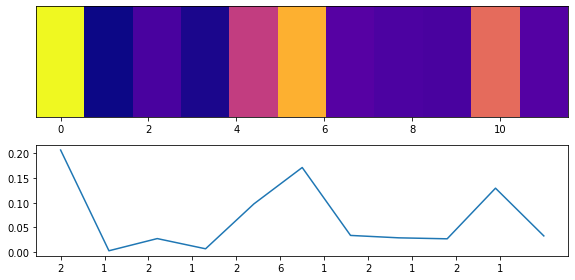

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


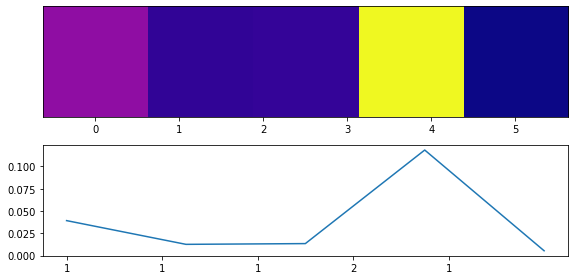

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


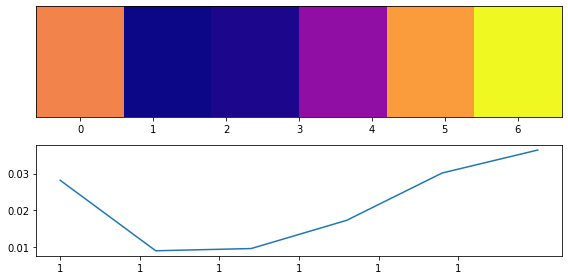

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


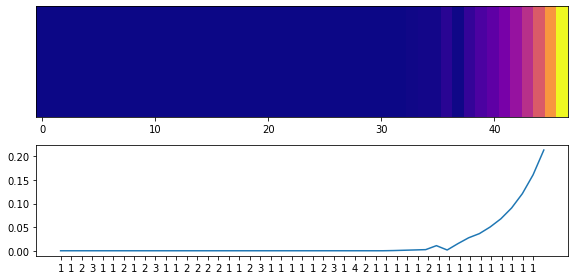

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


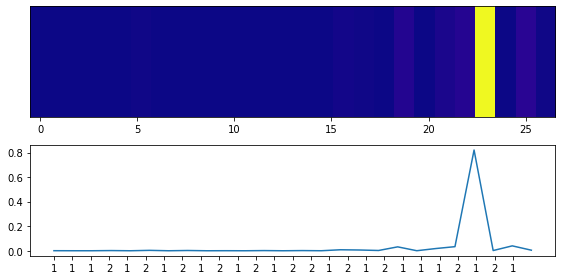

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


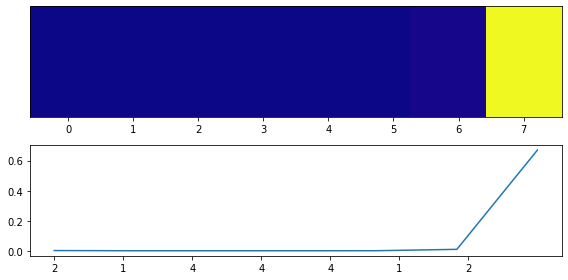

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


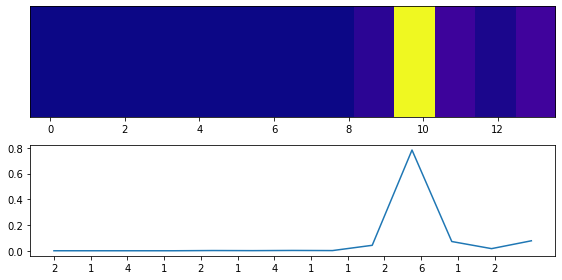

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


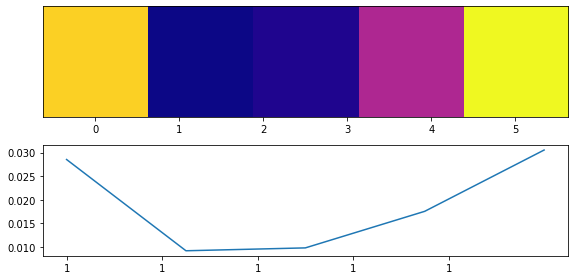

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


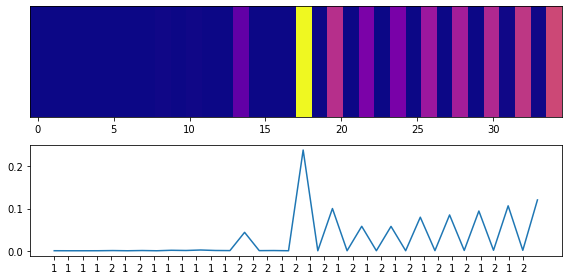

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


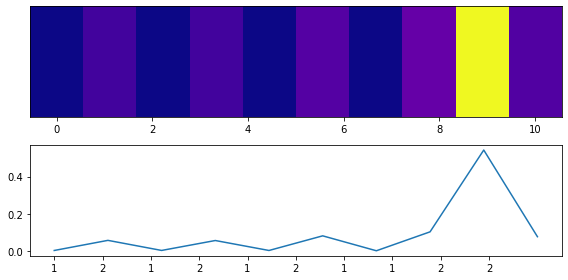

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


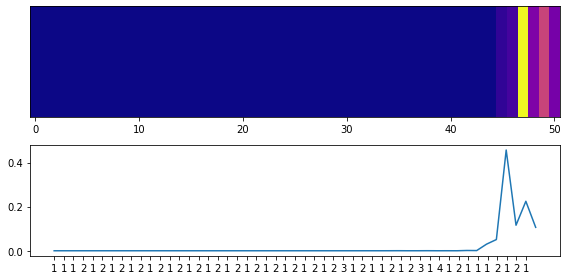

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


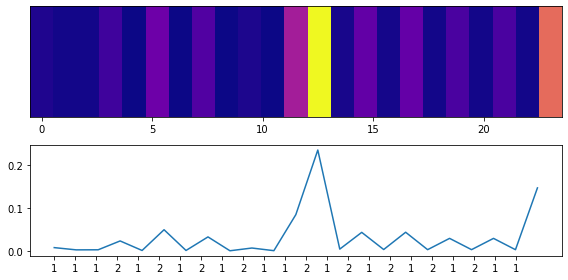

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


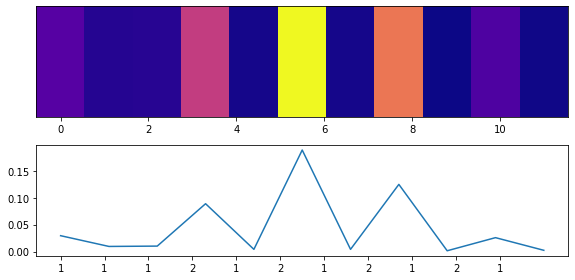

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


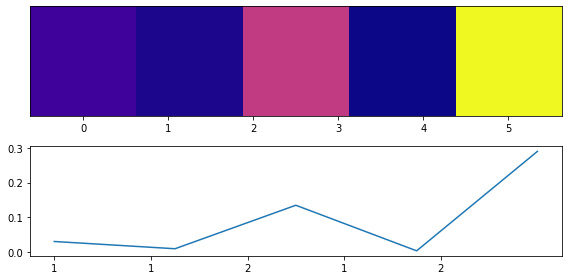

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


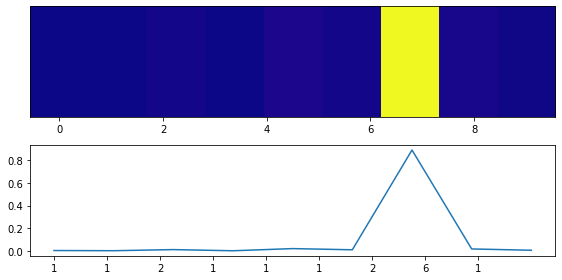

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


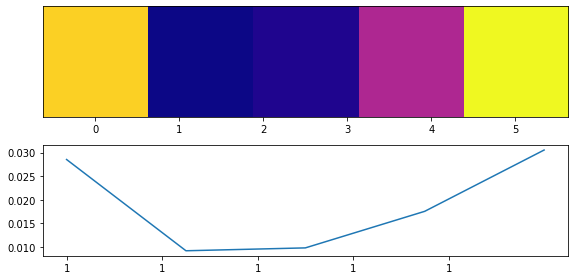

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


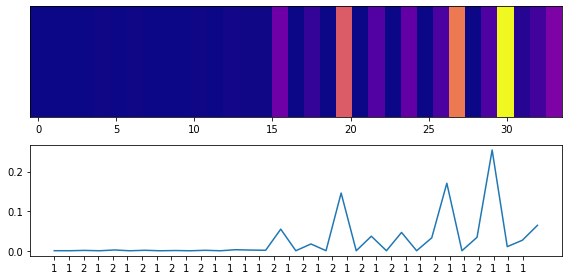

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


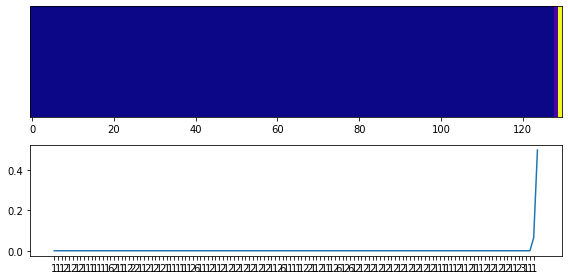

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


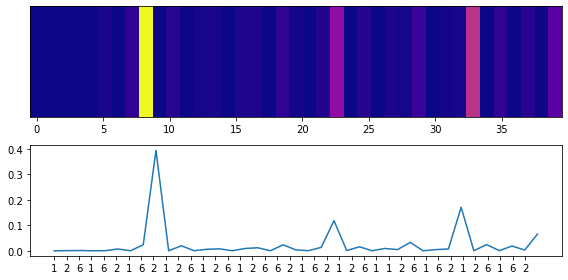

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


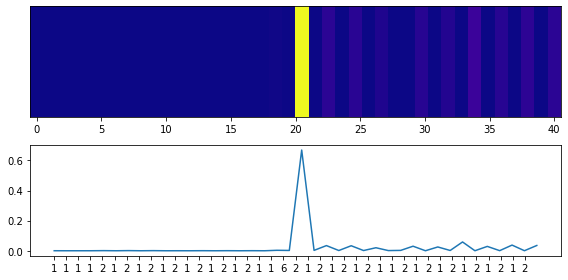

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


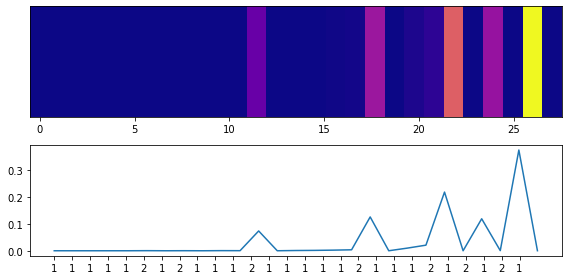

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


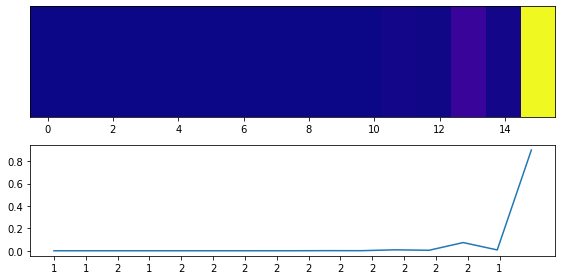

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


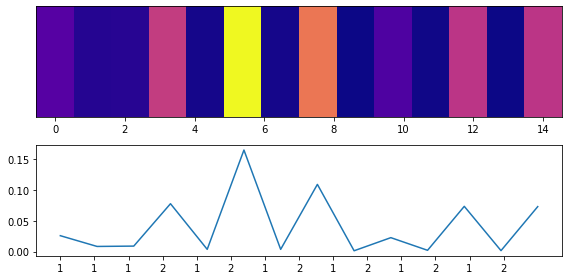

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


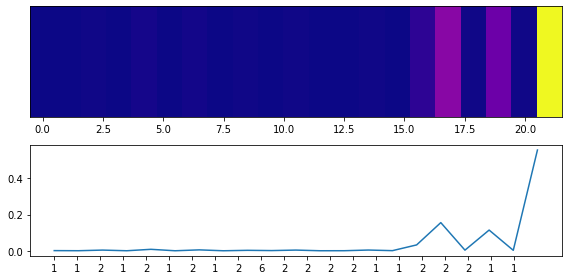

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


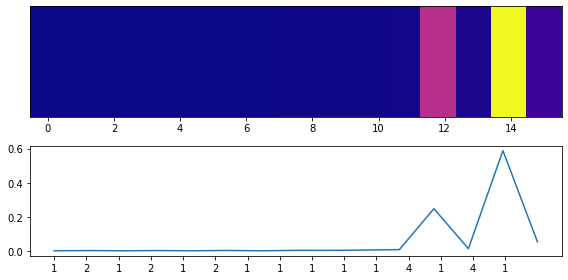

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


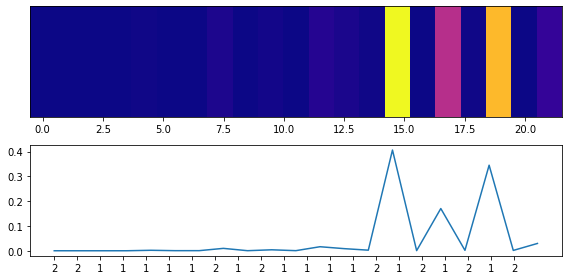

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


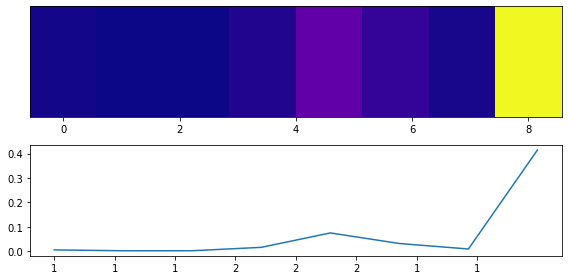

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


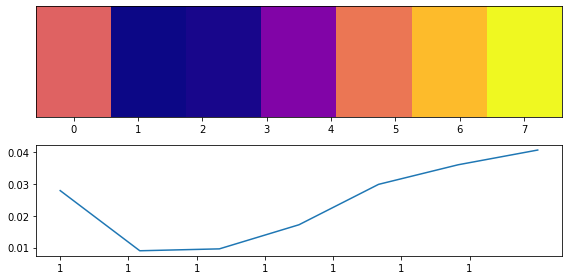

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


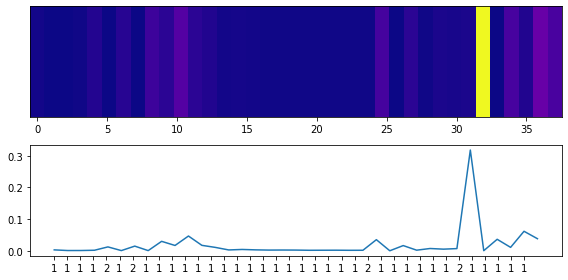

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


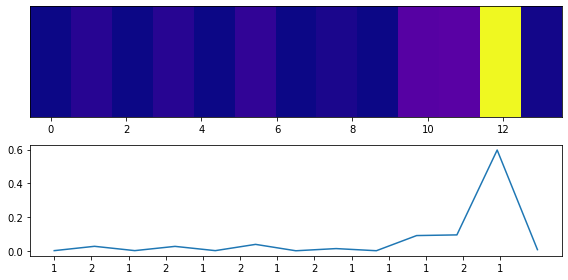

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


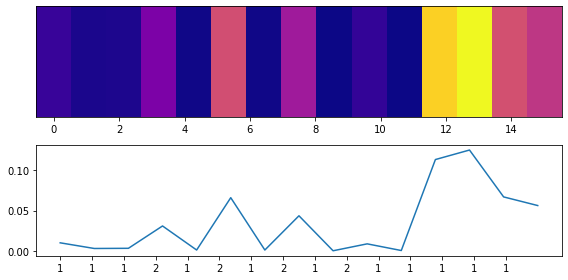

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


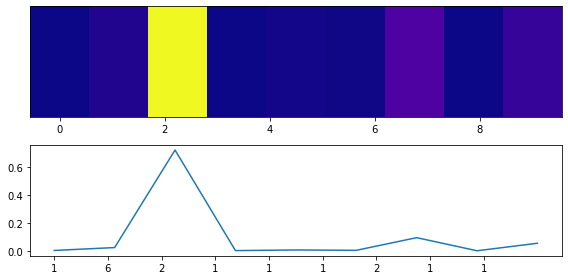

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


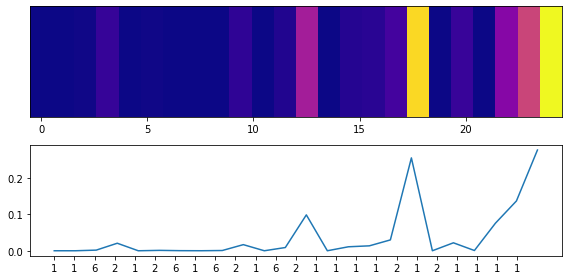

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


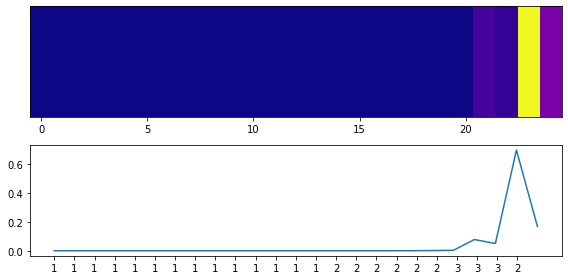

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


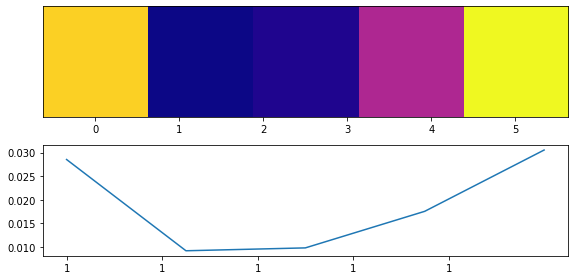

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


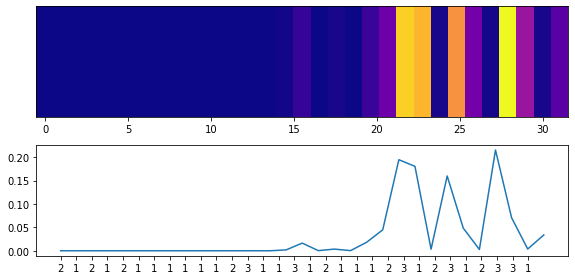

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


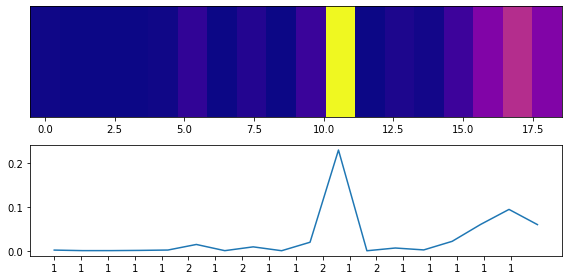

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


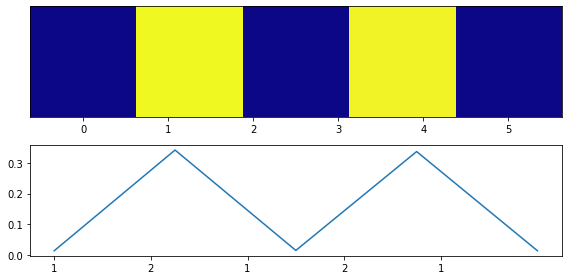

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


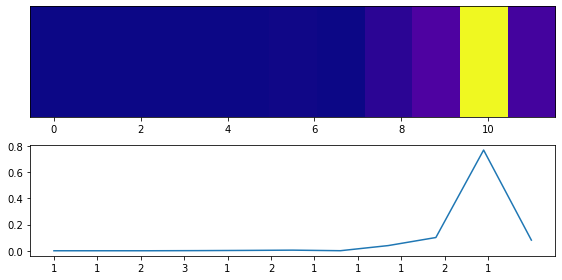

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


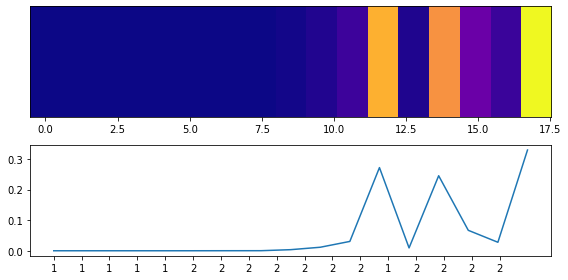

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


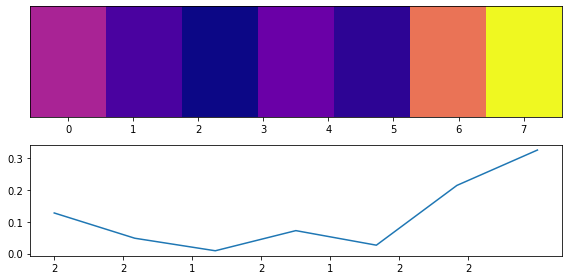

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


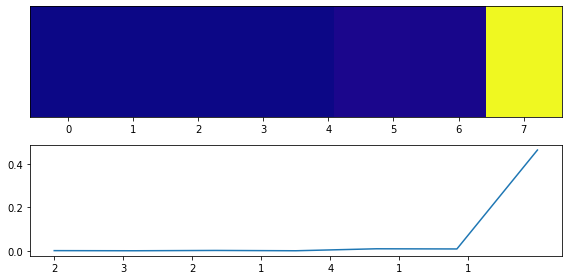

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


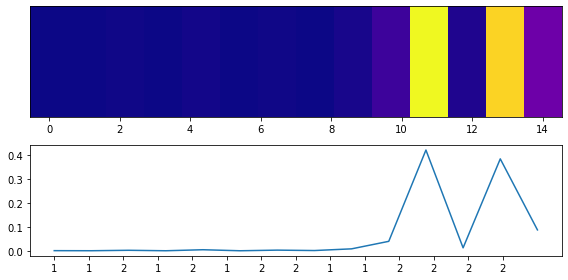

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


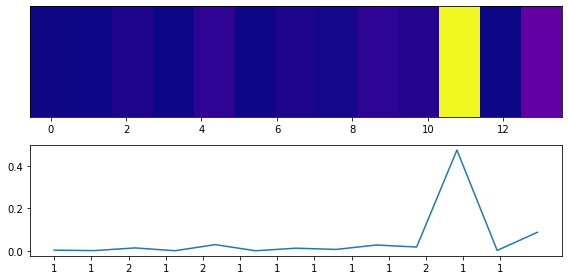

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


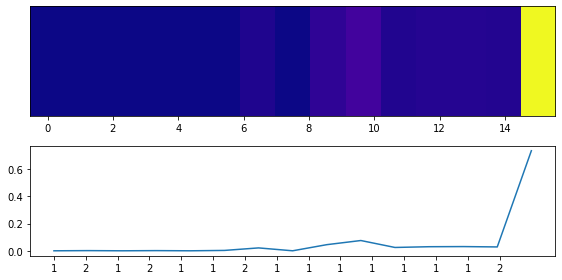

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


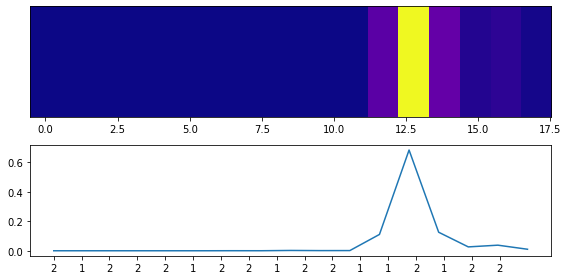

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


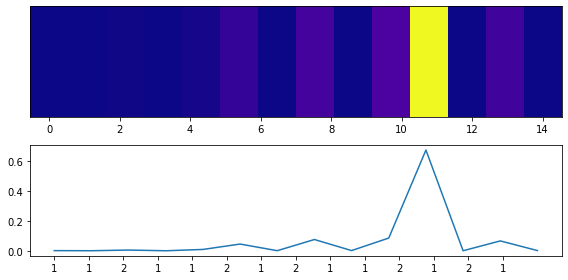

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


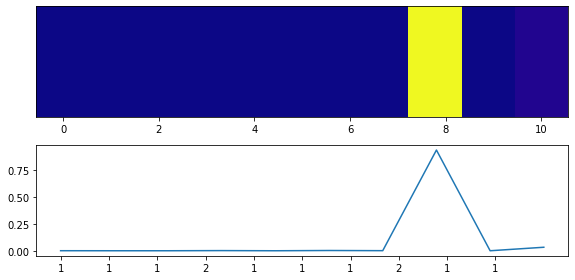

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


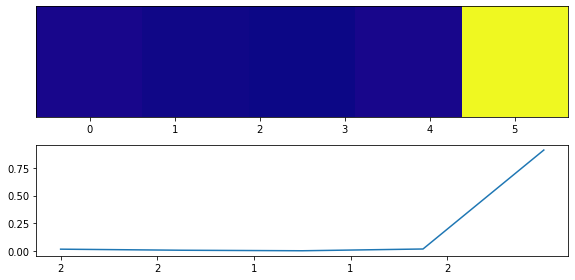

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


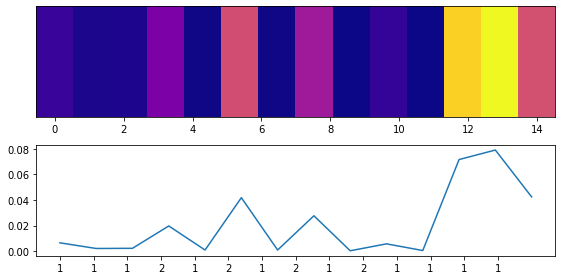

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


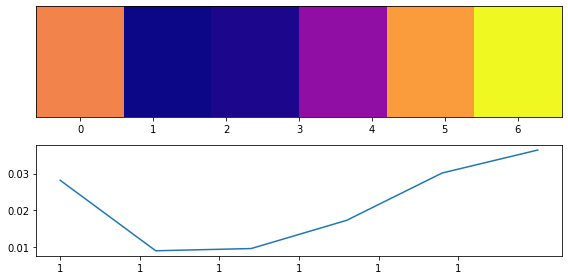

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


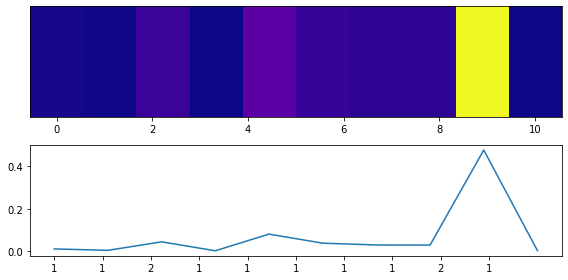

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


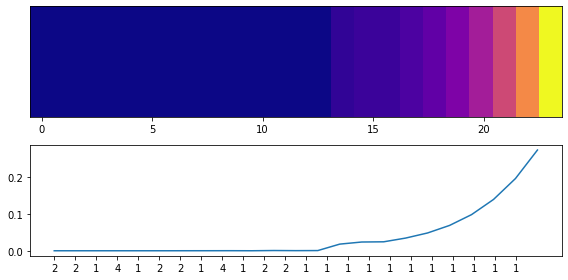

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


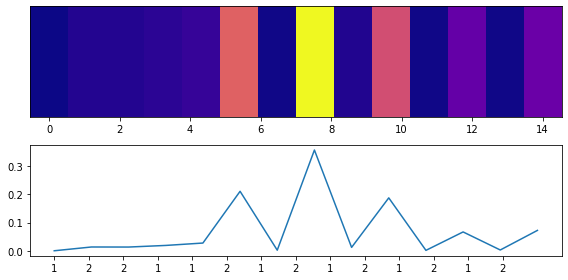

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


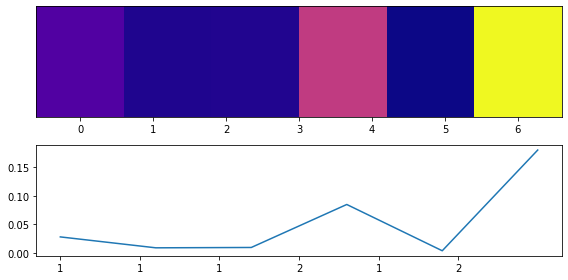

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


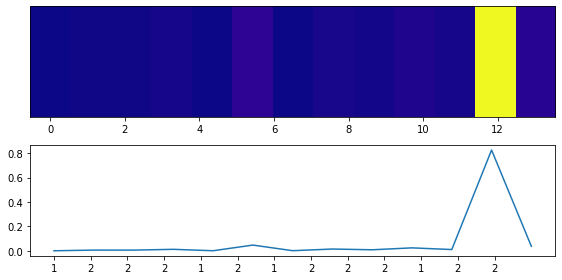

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


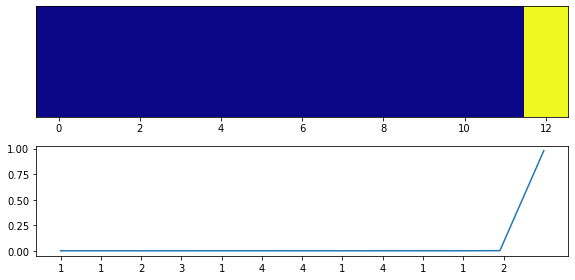

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


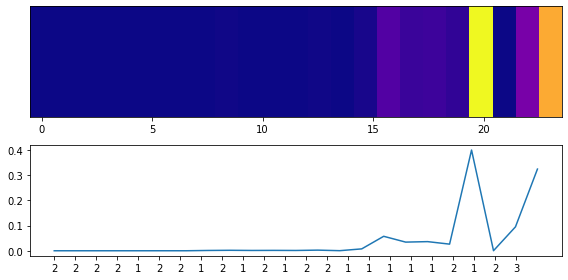

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


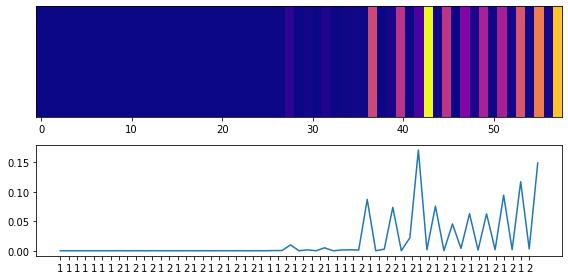

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


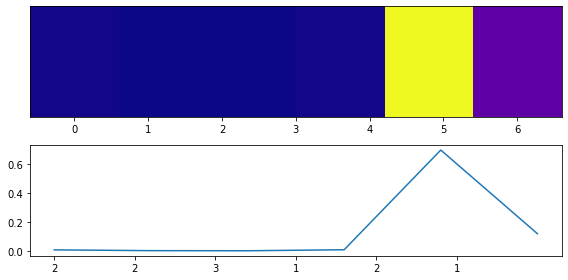

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


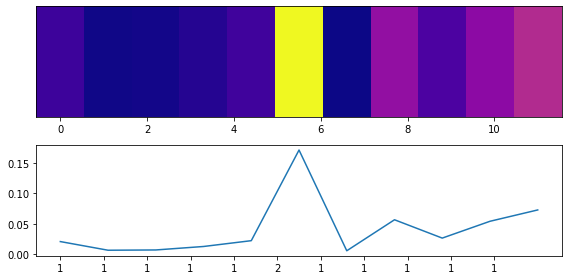

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


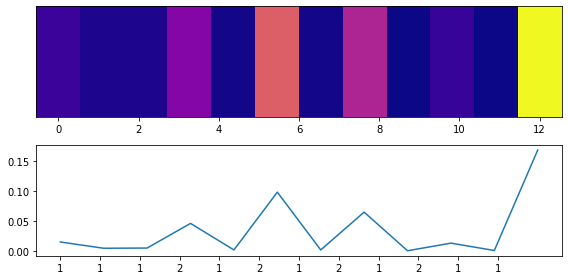

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


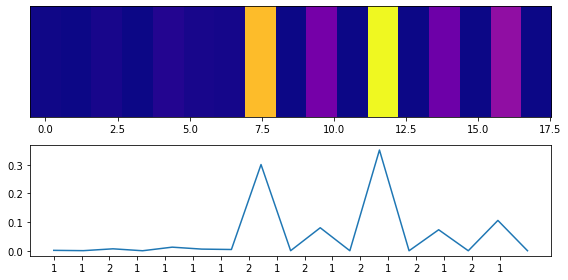

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


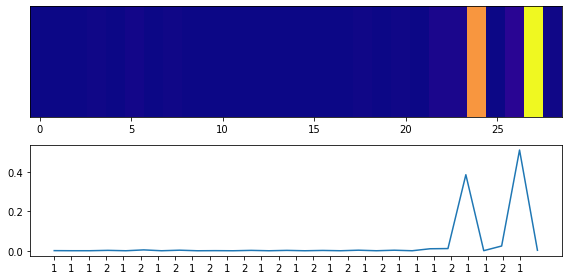

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


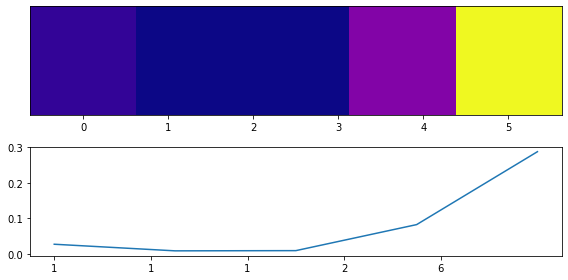

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


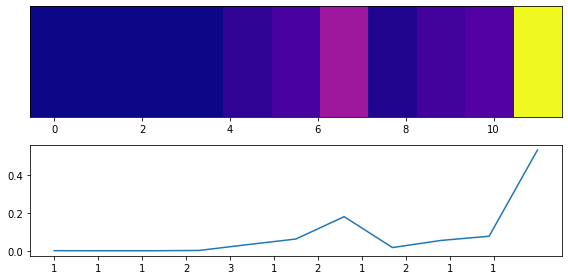

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


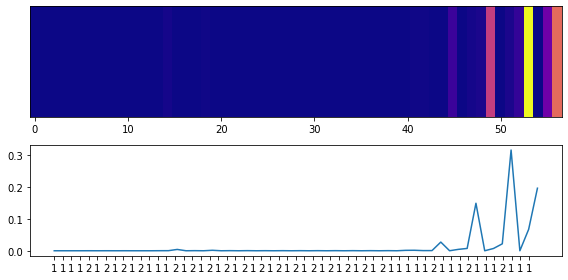

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


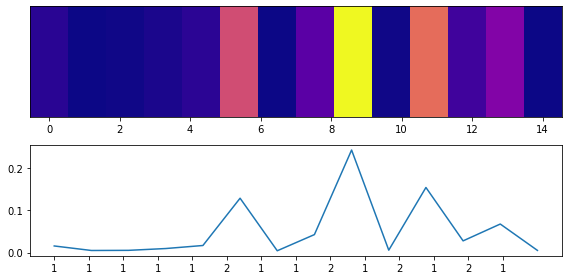

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


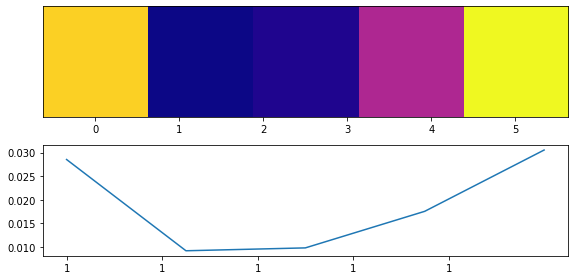

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


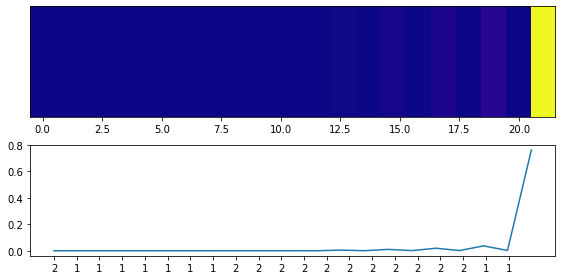

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


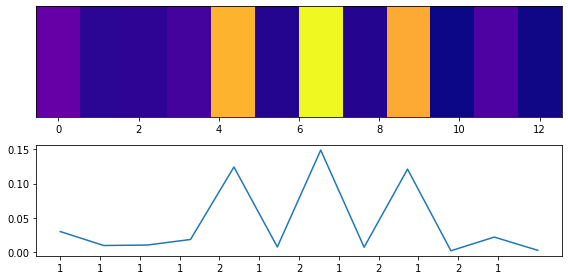

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


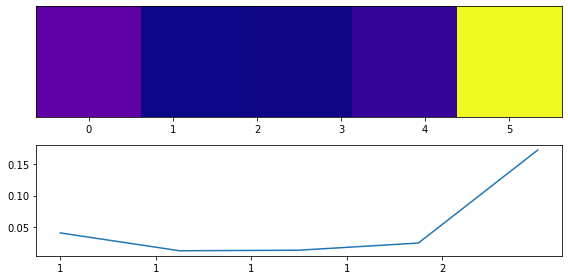

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


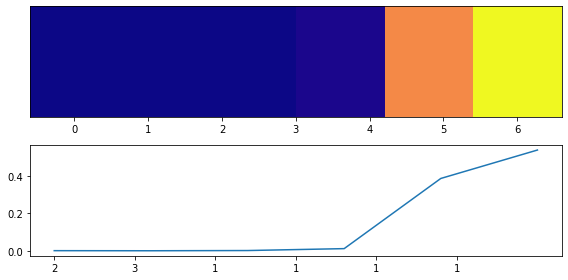

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


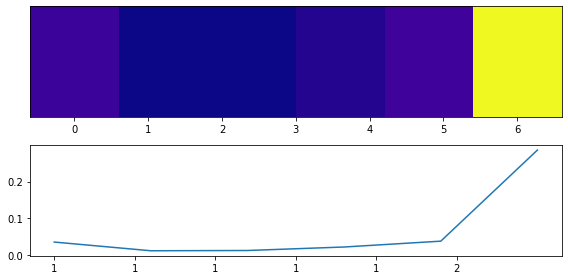

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


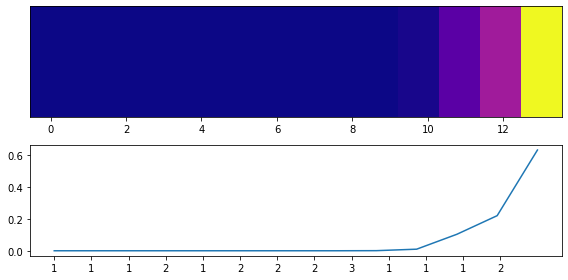

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


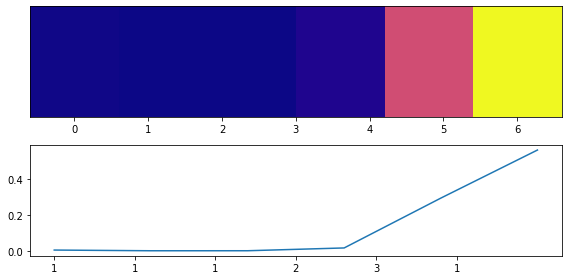

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


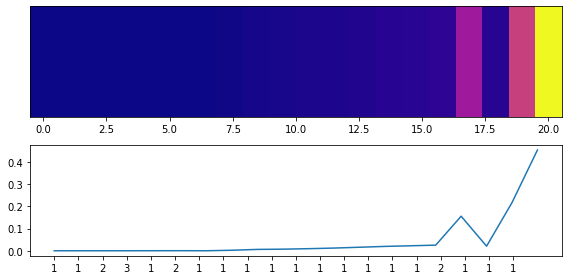

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


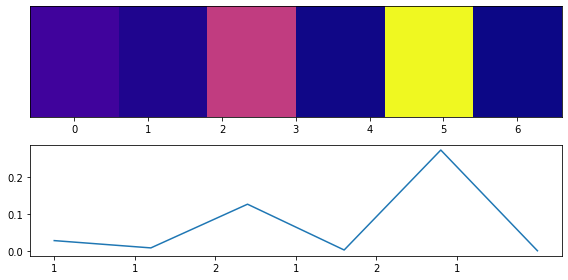

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


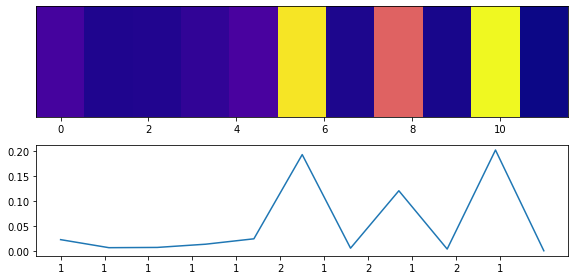

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


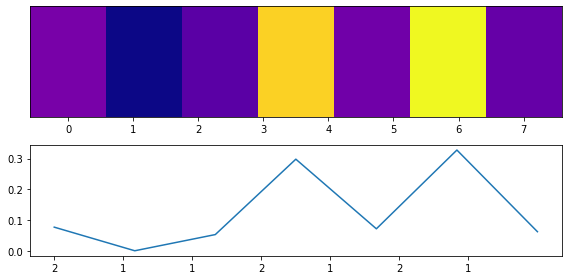

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


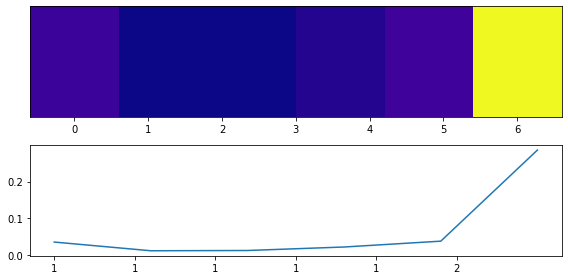

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


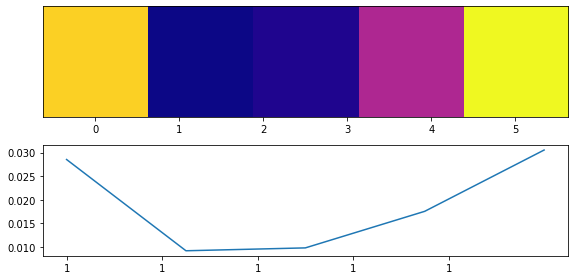

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


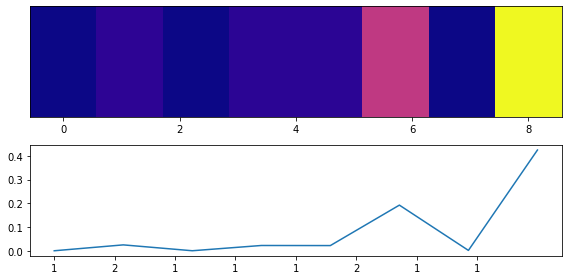

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


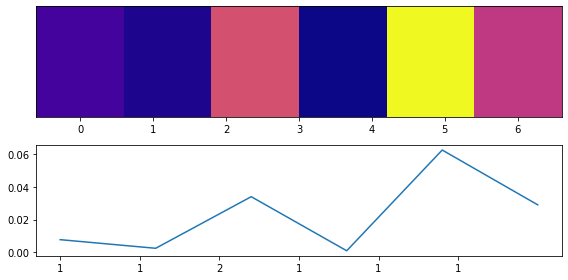

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


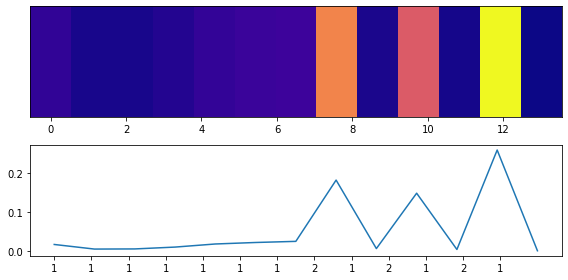

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


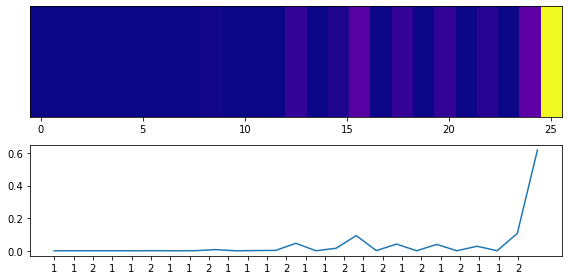

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


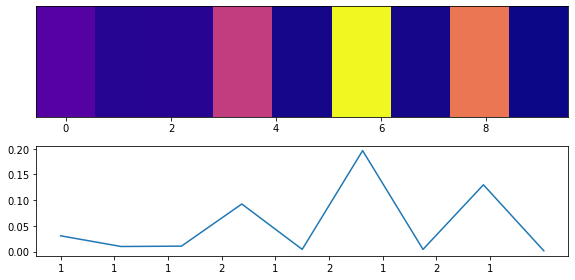

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


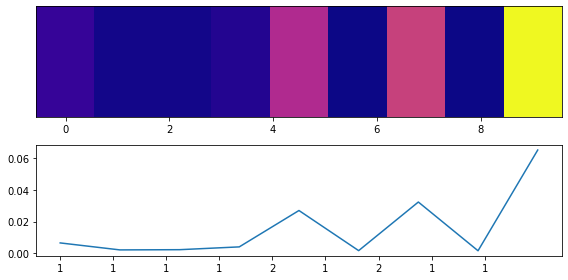

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


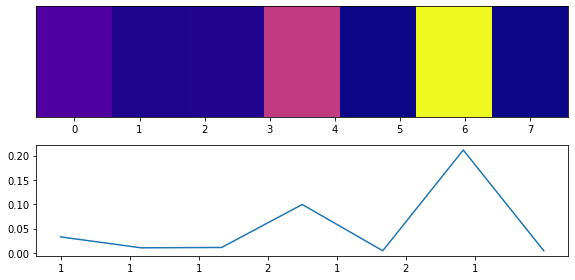

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


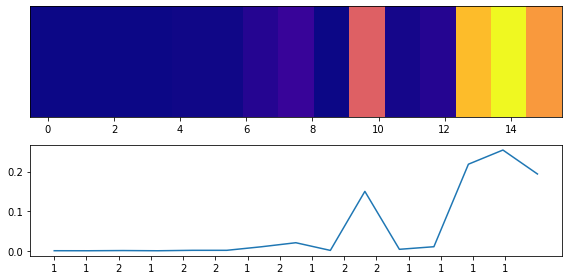

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


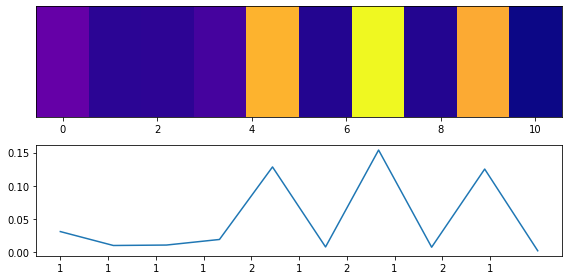

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


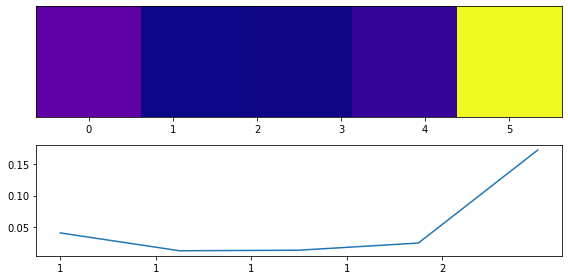

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


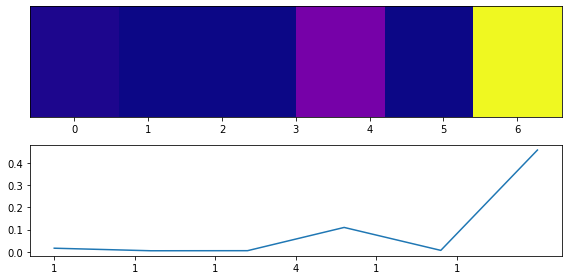

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


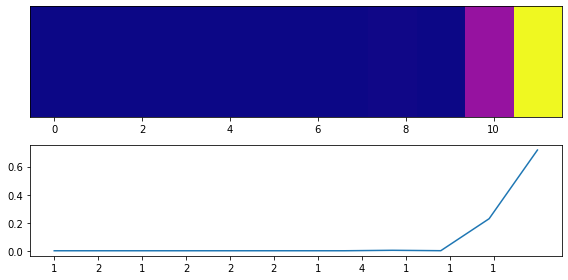

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


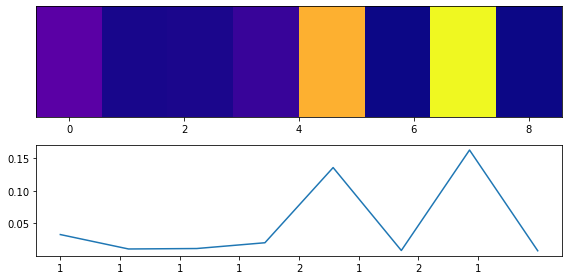

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


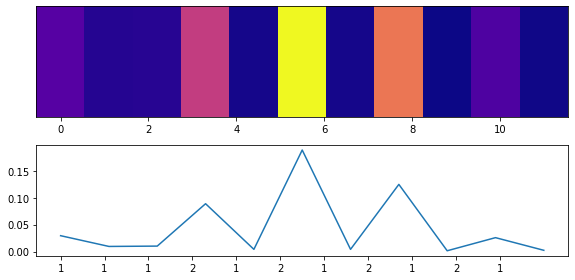

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


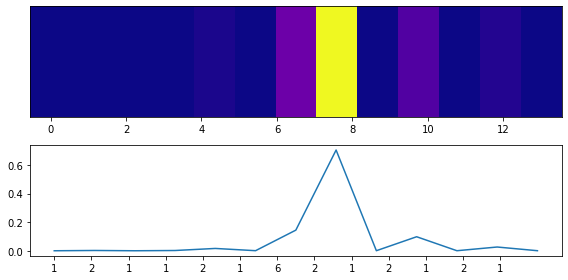

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


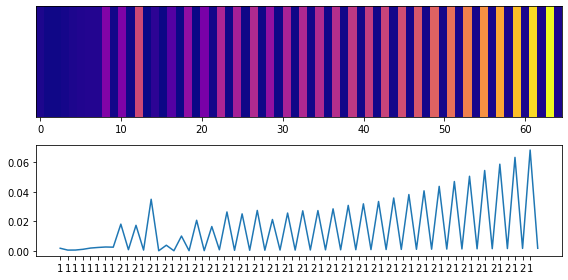

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


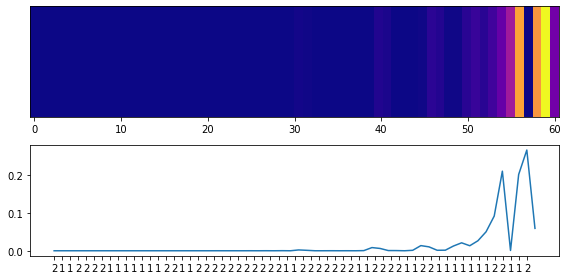

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


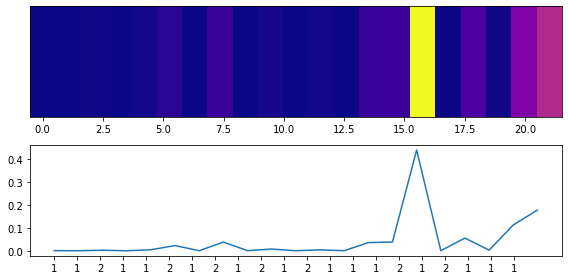

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


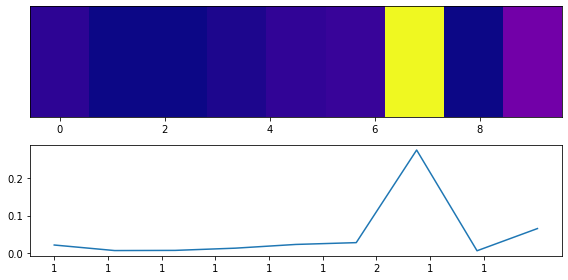

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


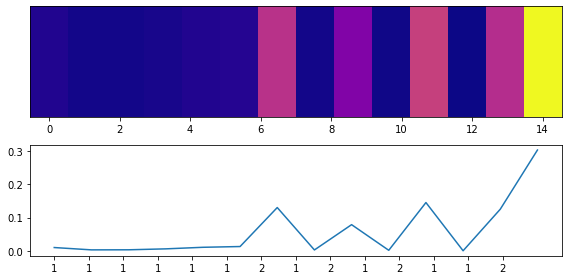

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


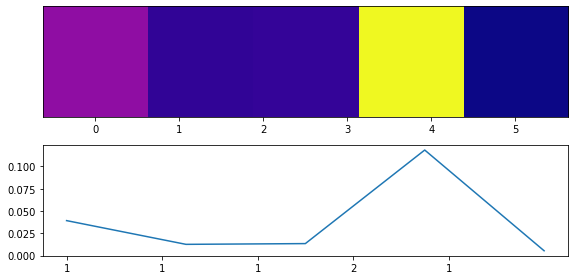

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


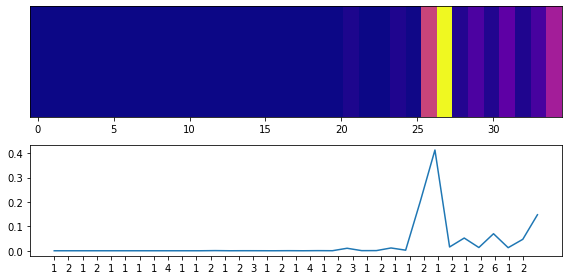

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


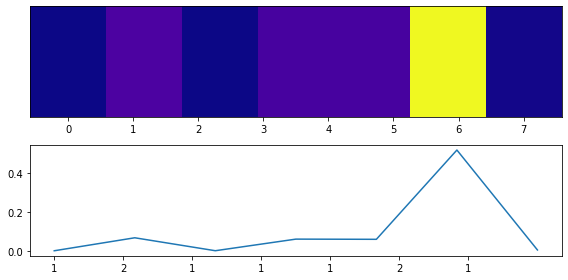

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


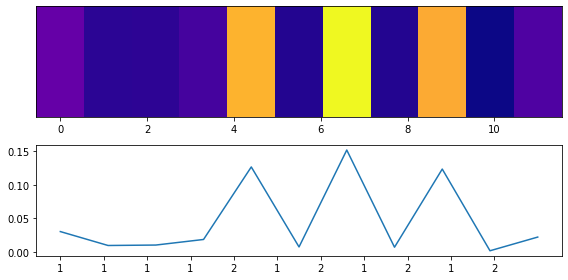

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


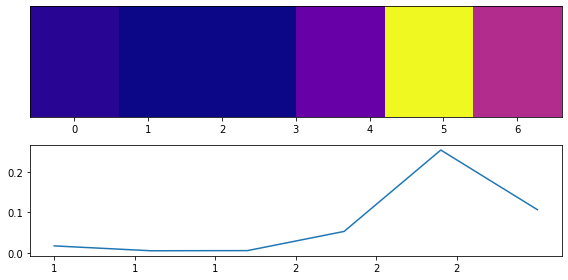

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


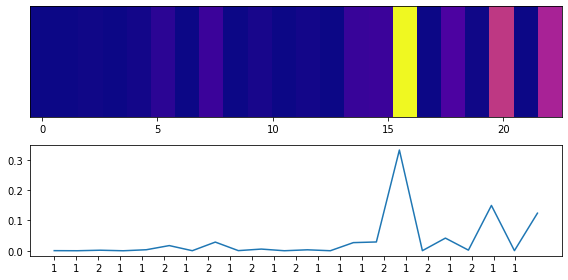

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


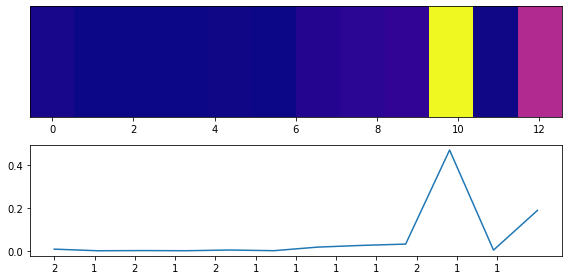

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


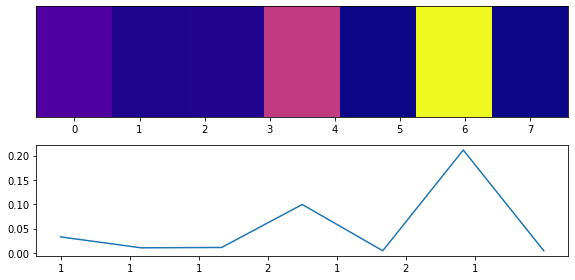

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


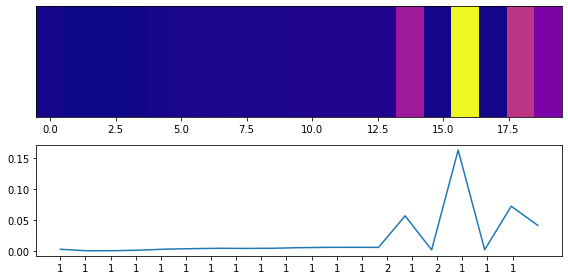

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


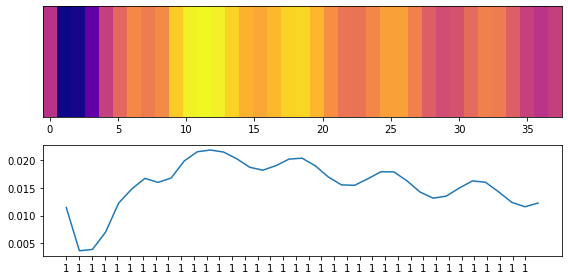

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


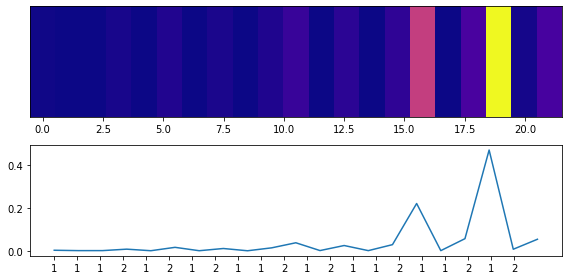

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


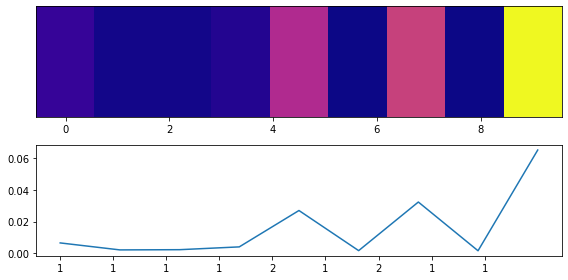

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


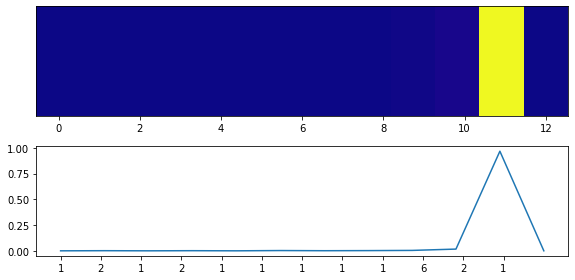

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


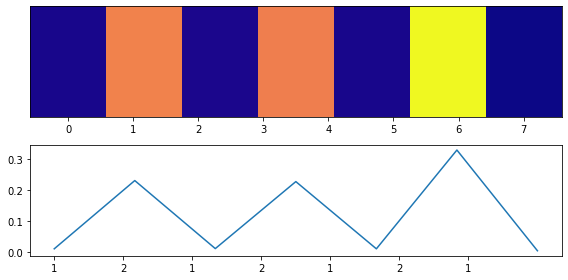

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


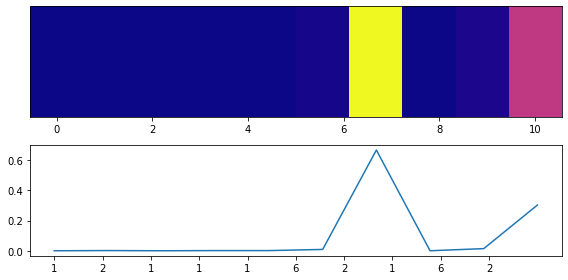

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


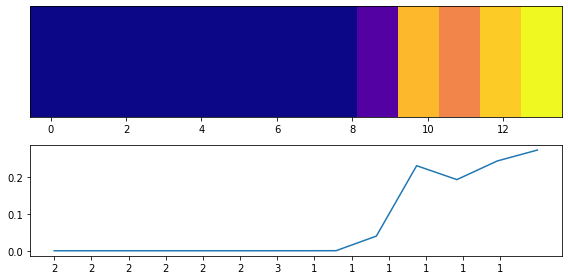

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


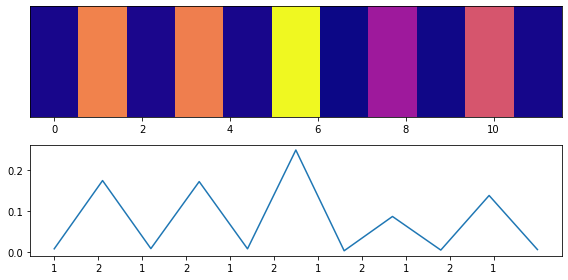

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


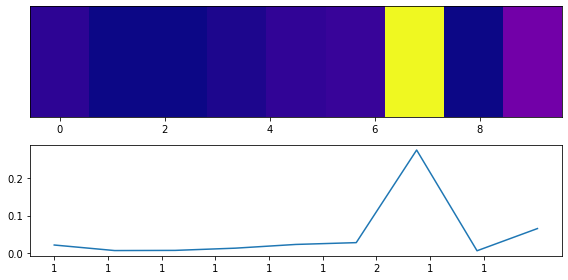

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


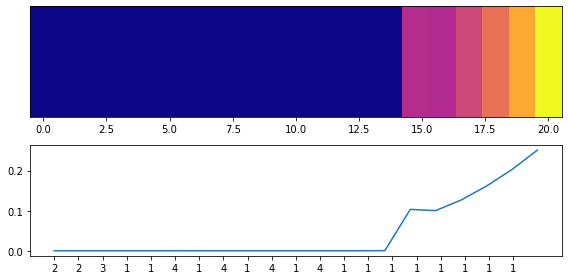

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


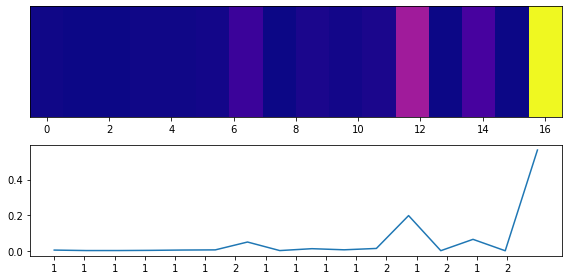

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


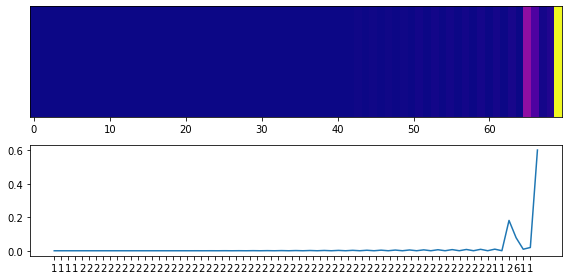

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


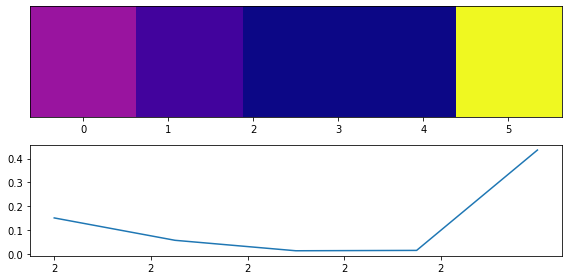

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


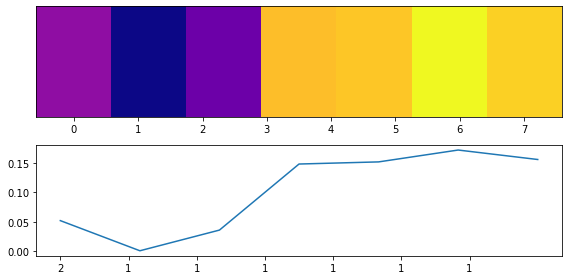

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


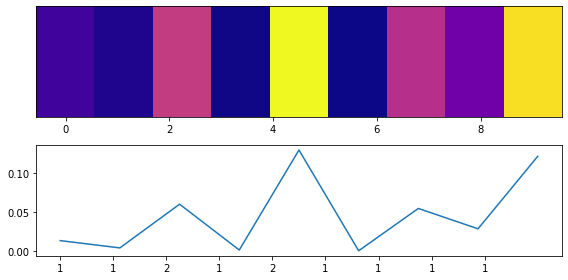

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


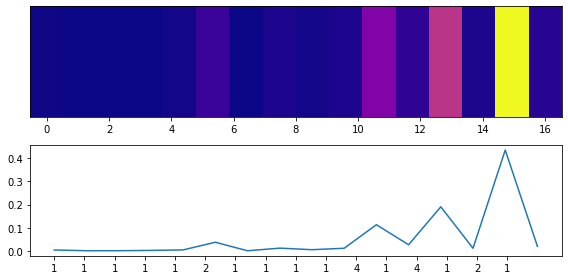

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


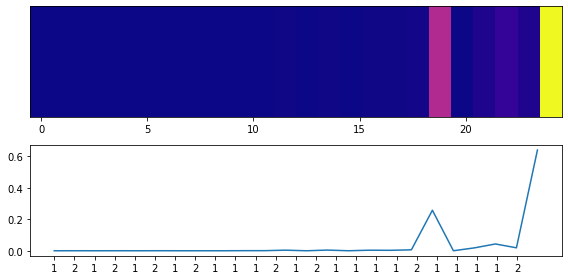

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


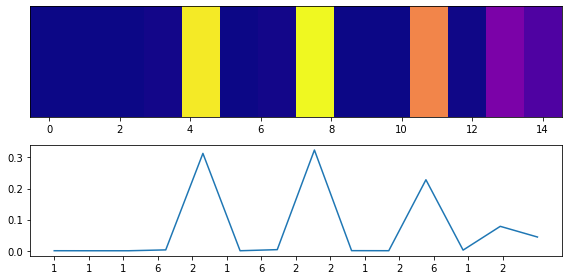

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


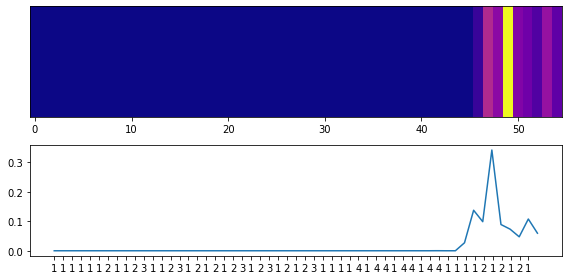

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


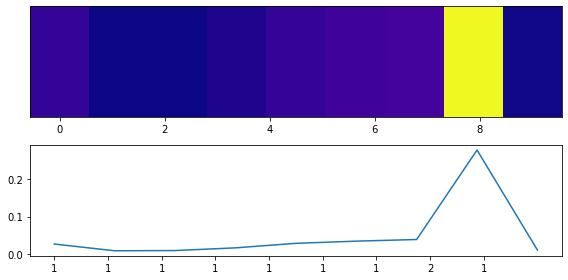

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


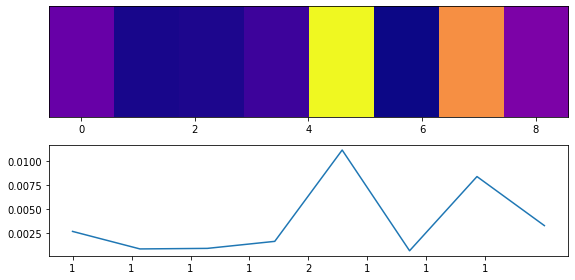

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


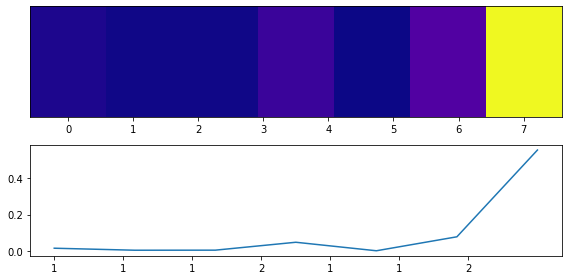

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


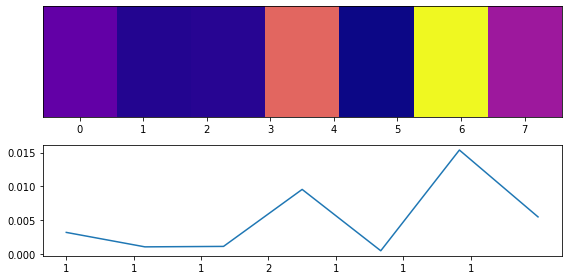

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


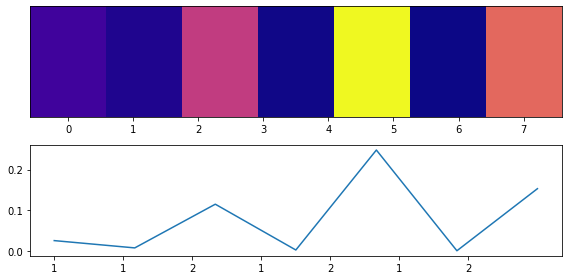

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


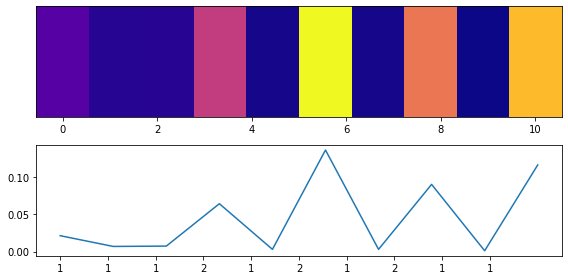

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


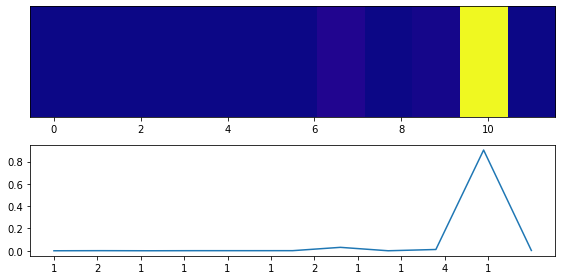

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


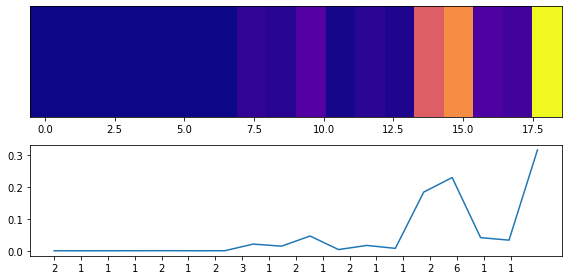

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


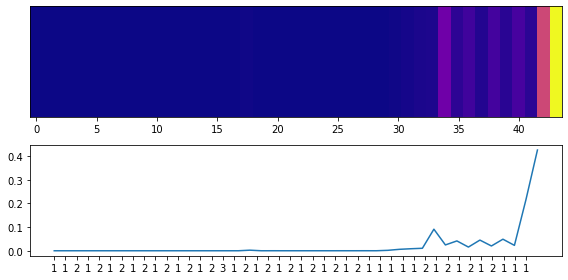

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


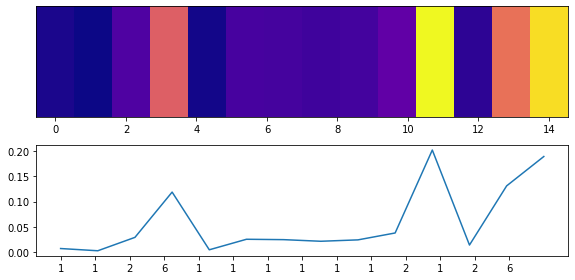

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


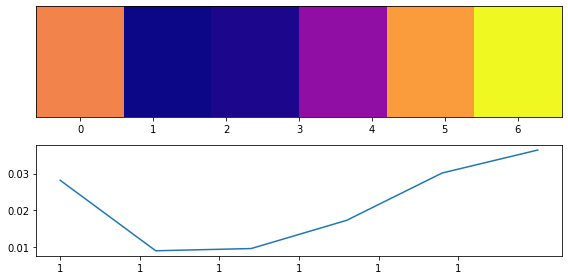

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


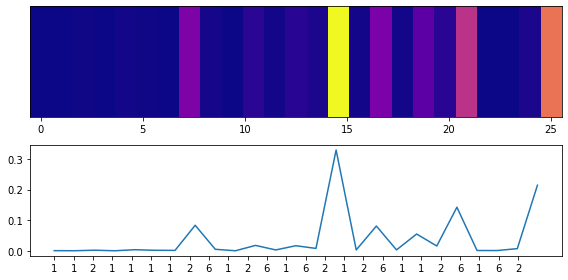

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


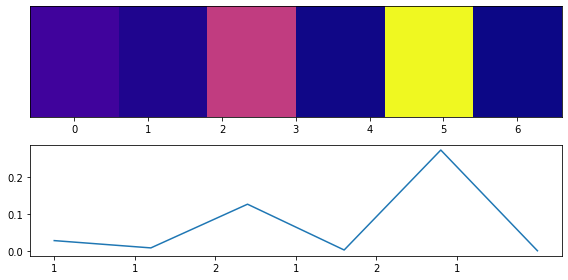

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


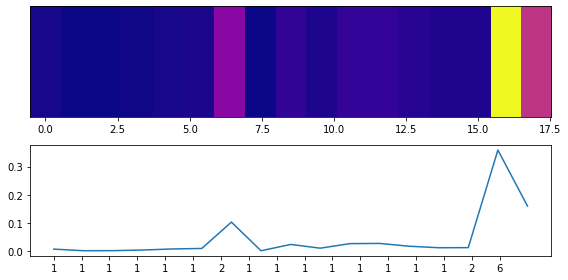

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


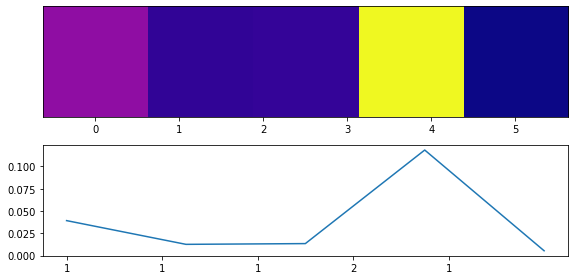

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


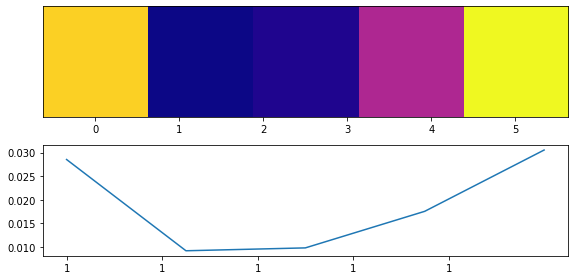

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


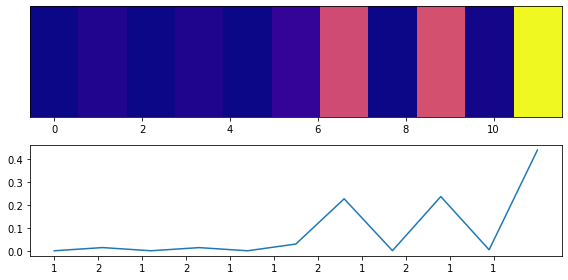

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


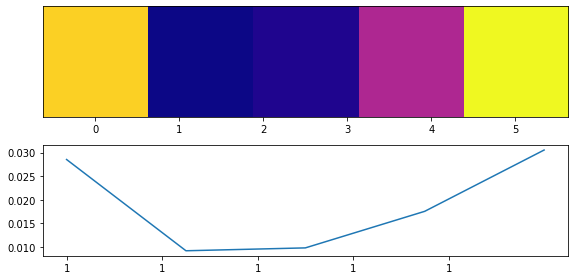

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


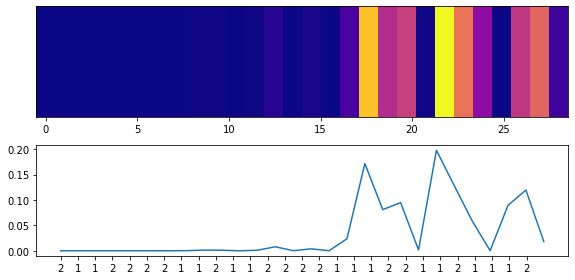

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


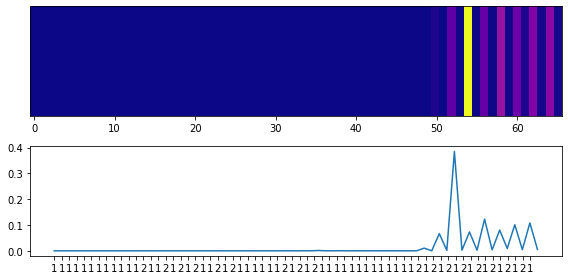

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


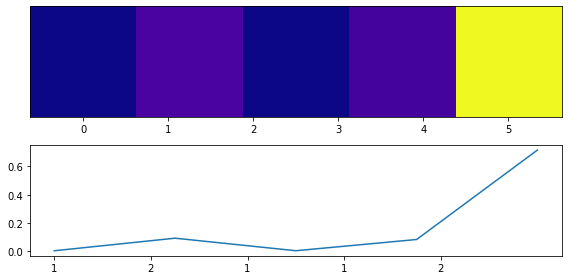

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


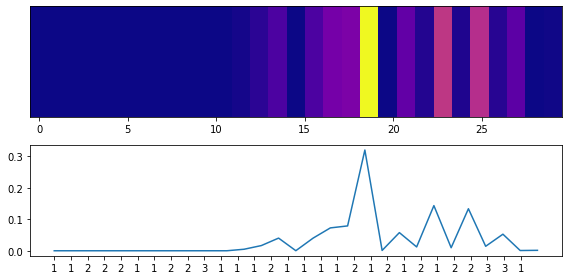

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


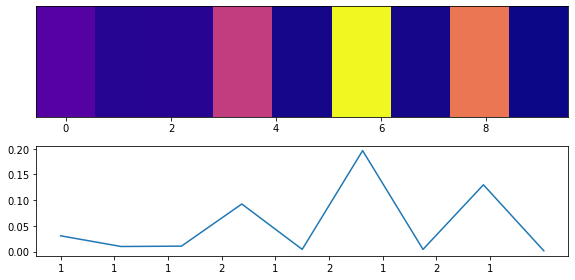

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


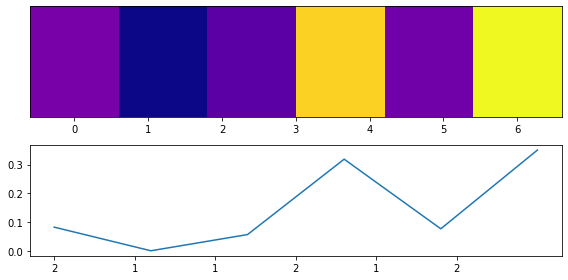

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


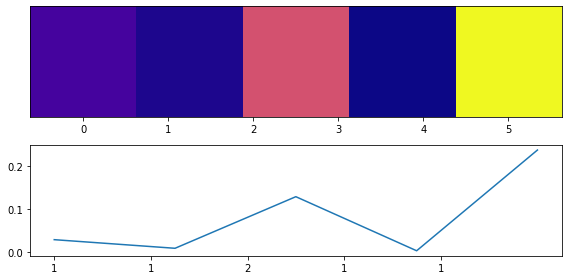

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


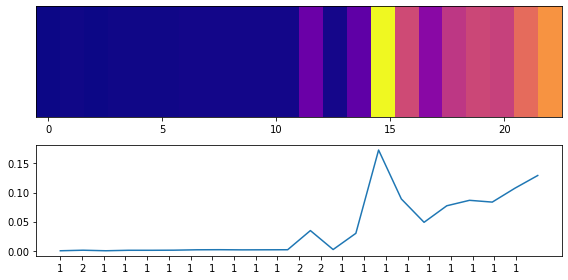

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


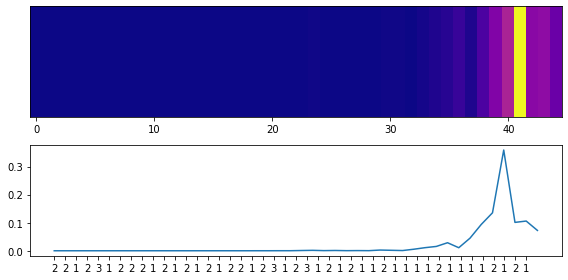

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


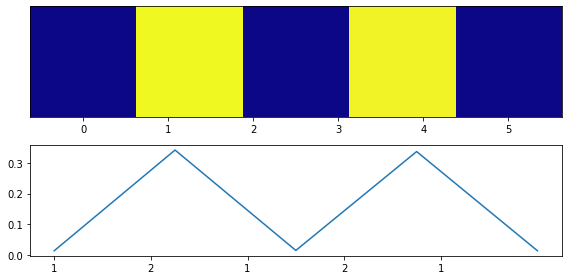

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


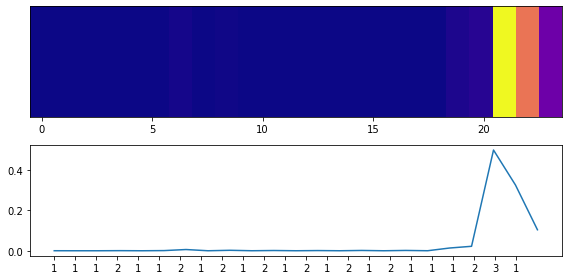

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


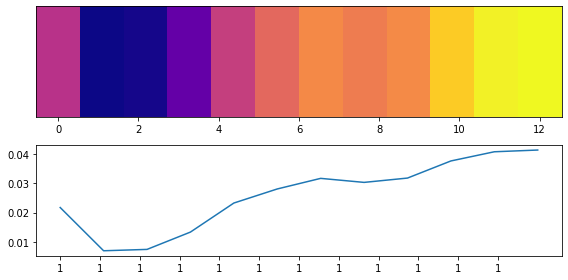

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


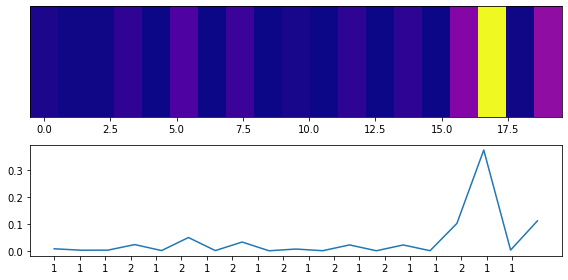

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


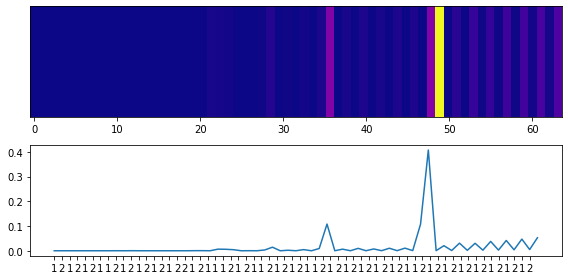

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


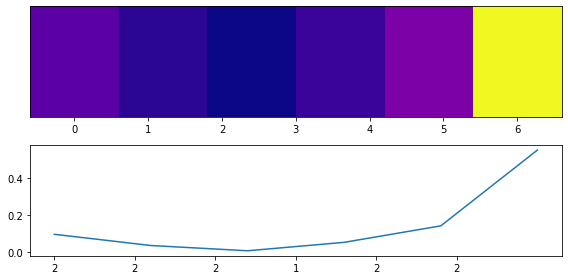

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


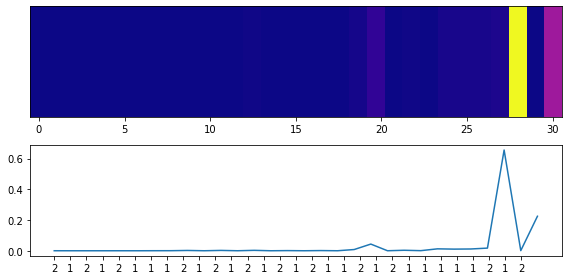

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


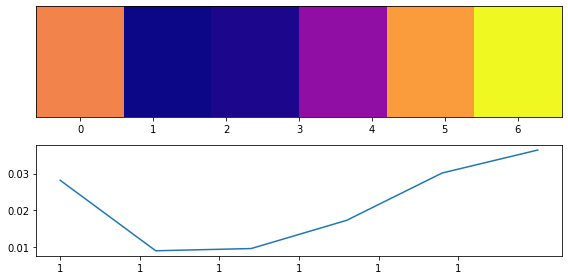

model prediction: 0 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


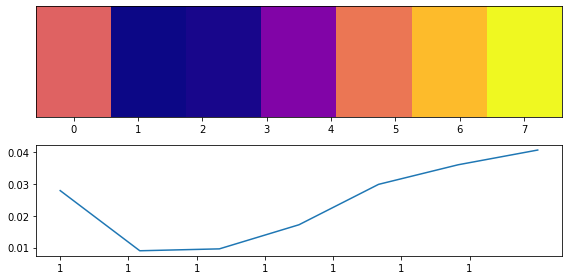

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


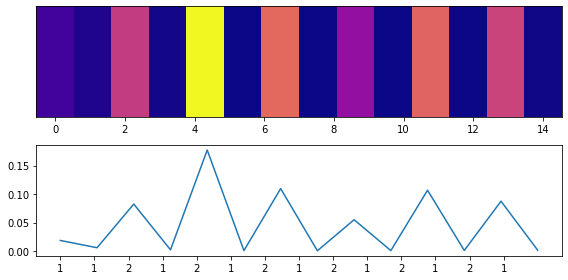

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


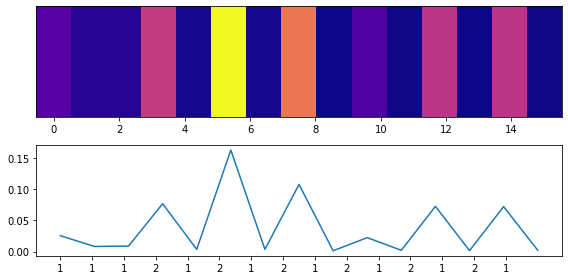

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


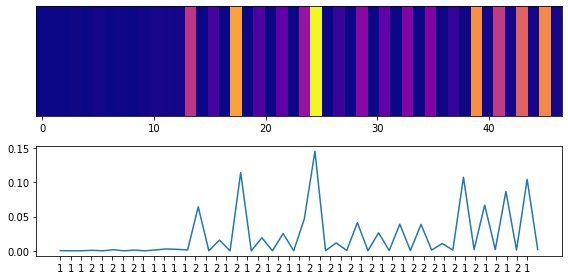

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


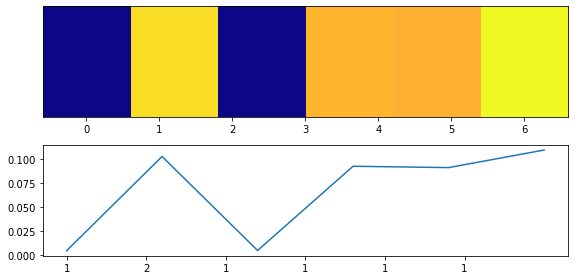

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


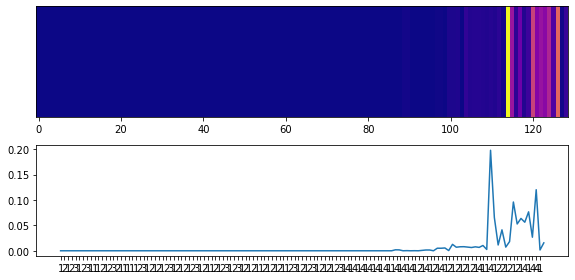

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


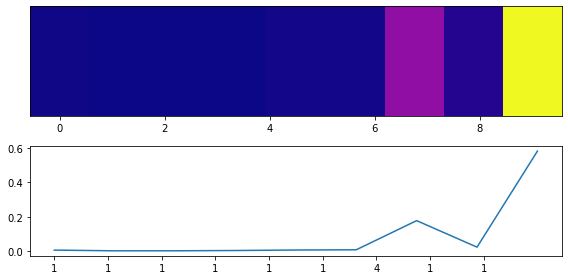

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


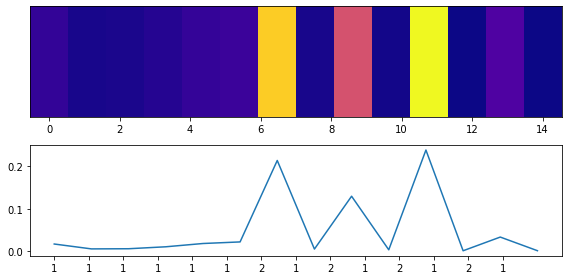

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


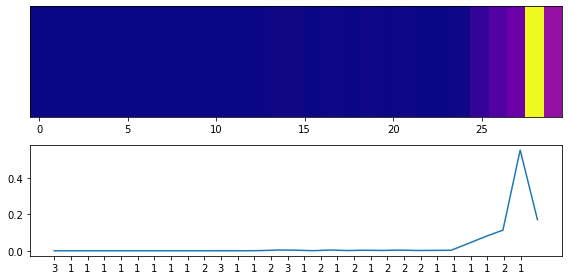

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


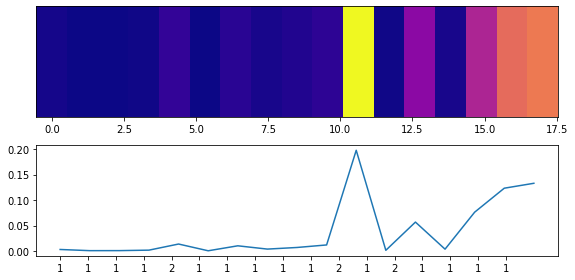

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


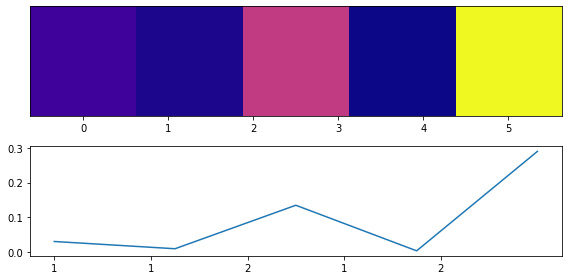

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


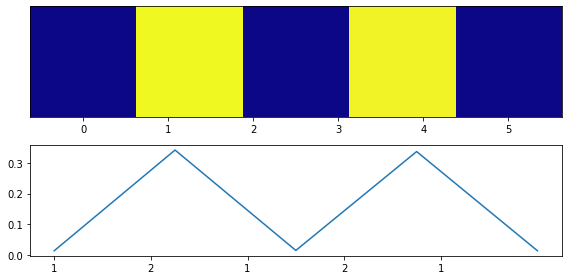

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


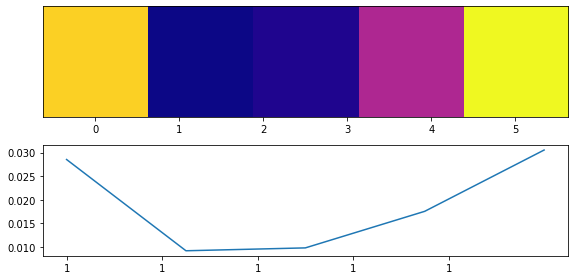

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


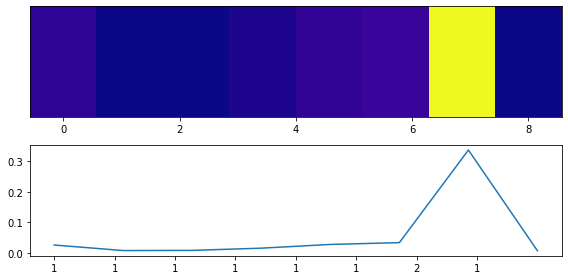

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


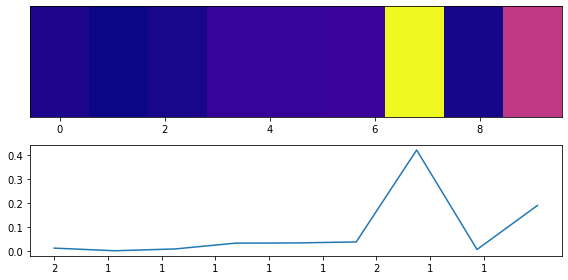

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


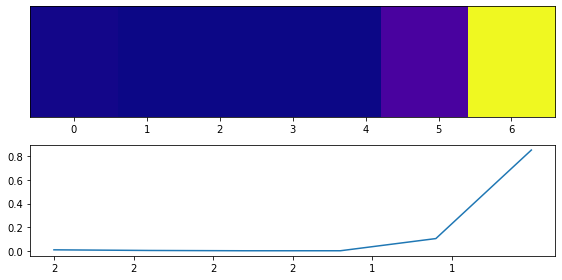

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


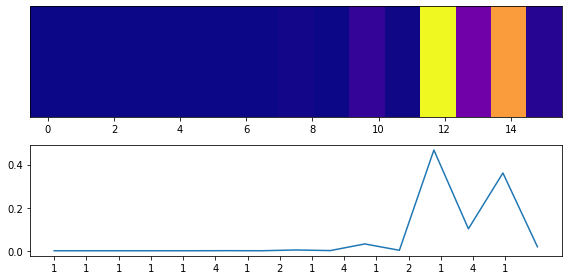

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


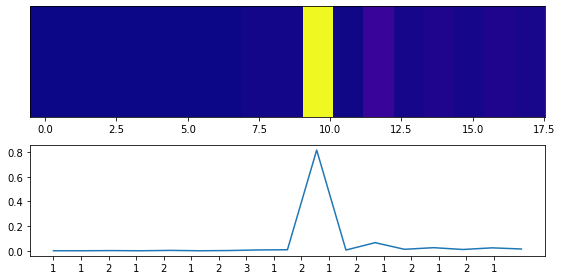

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


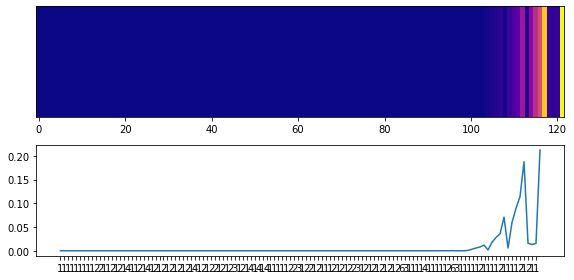

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


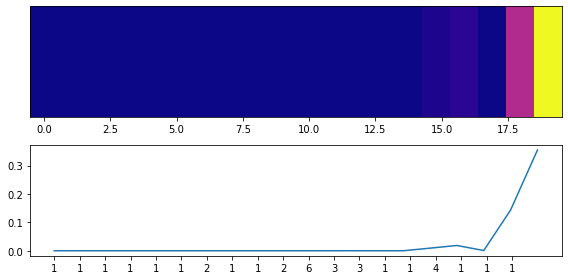

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


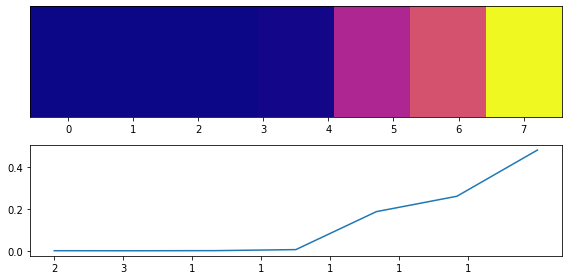

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


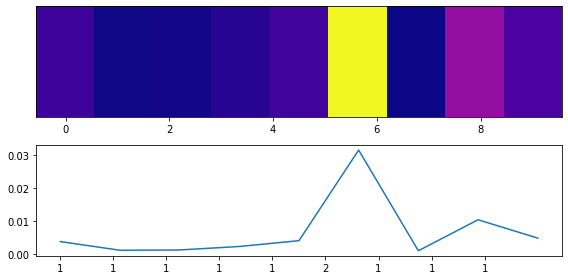

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


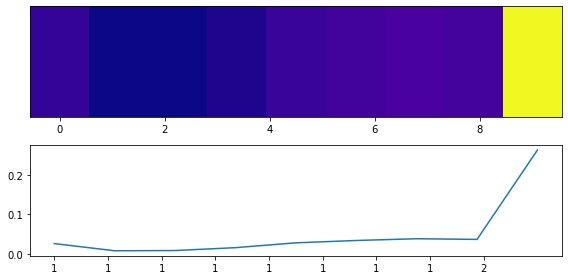

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


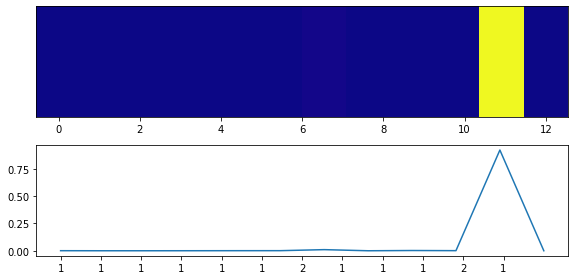

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


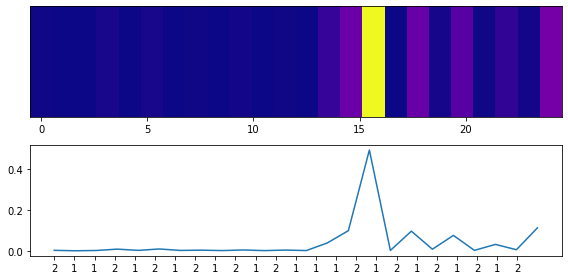

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


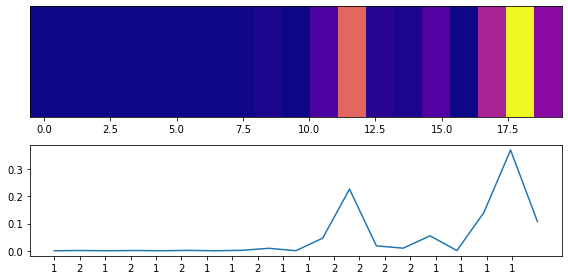

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


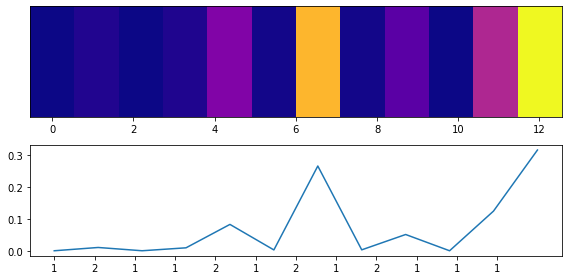

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


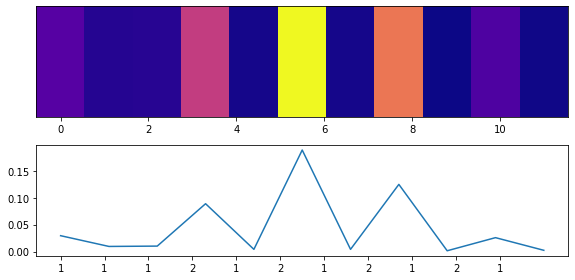

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


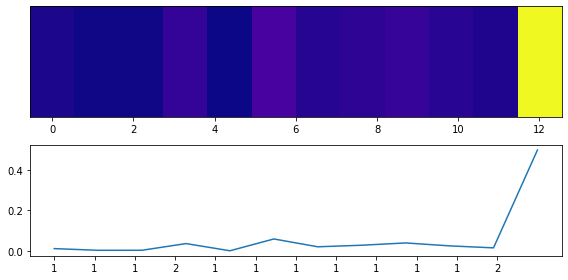

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


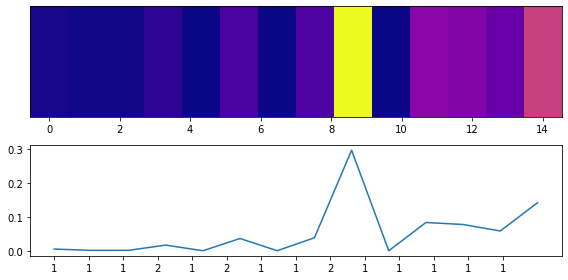

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


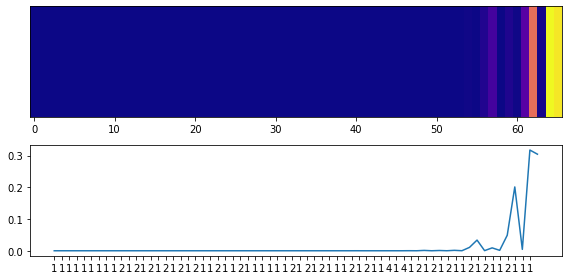

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


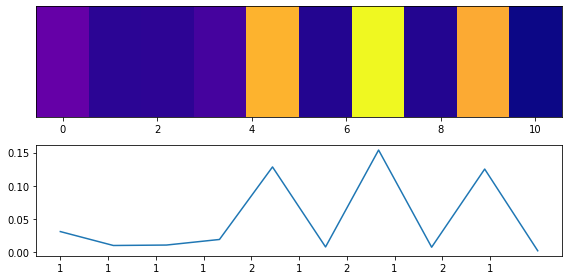

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


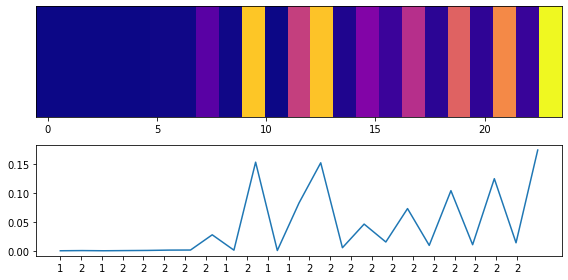

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


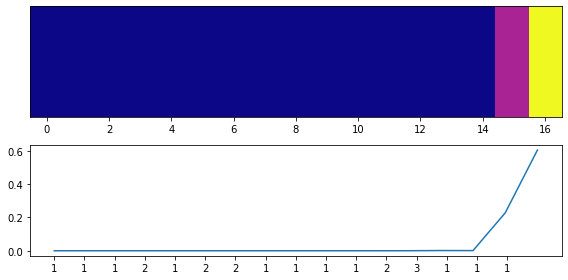

model prediction: 1 true label: 1
<class 'matplotlib.axes._subplots.AxesSubplot'>


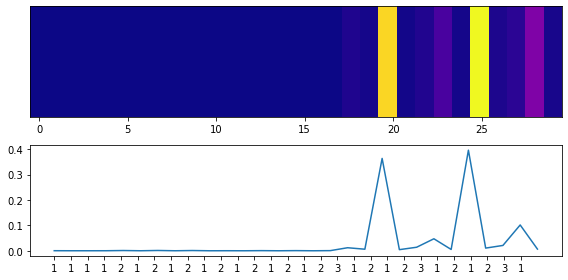

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


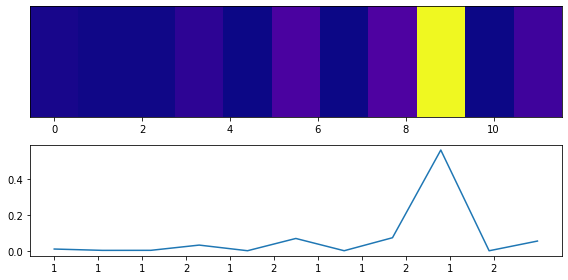

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


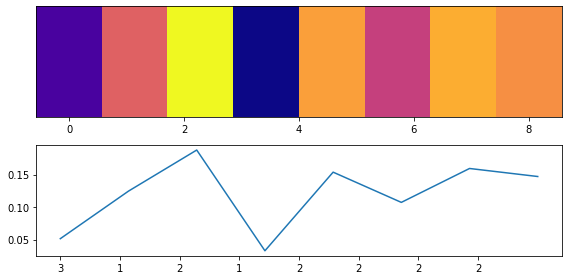

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


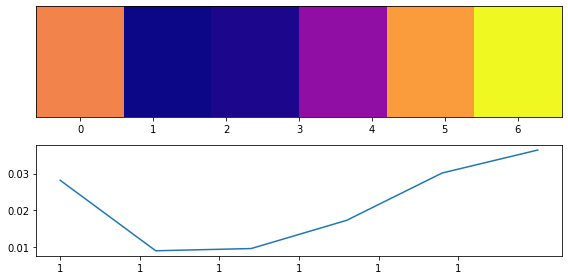

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


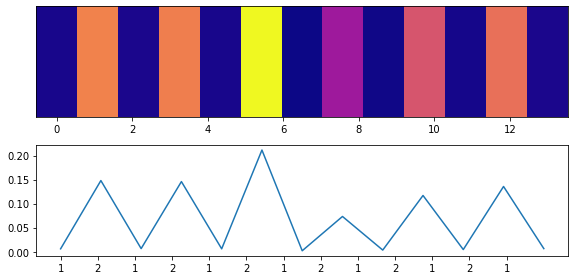

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


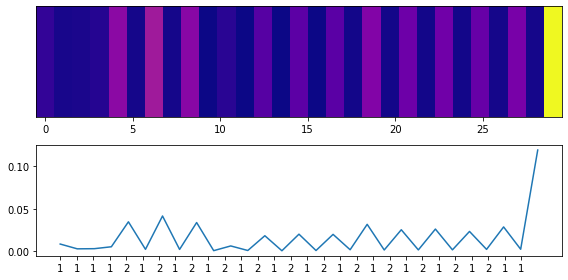

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


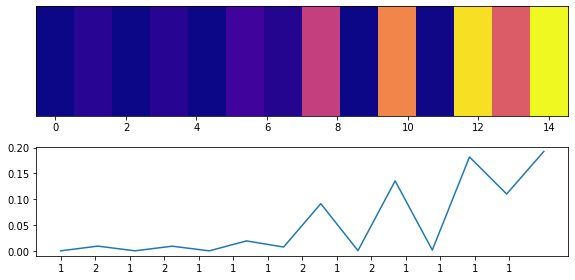

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


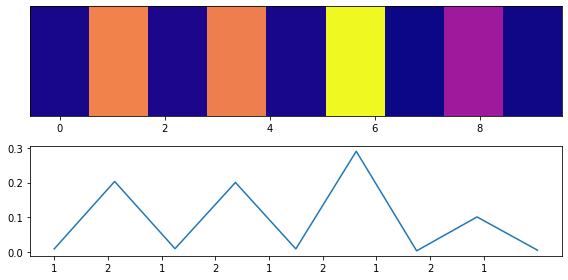

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


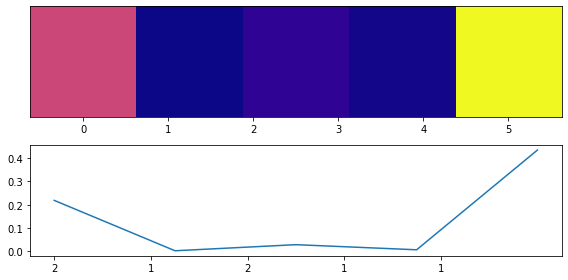

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


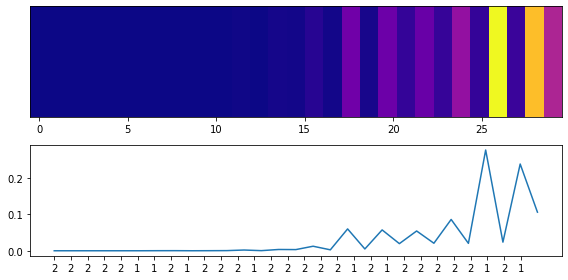

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


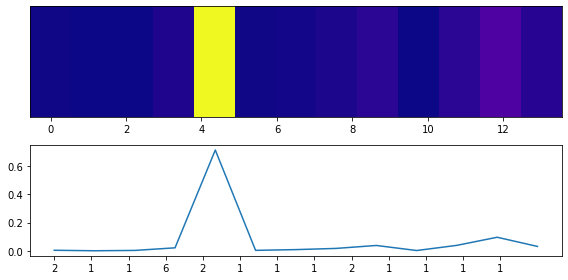

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


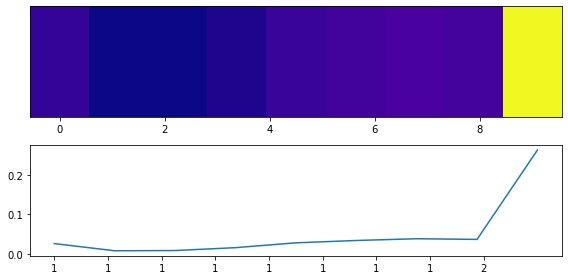

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


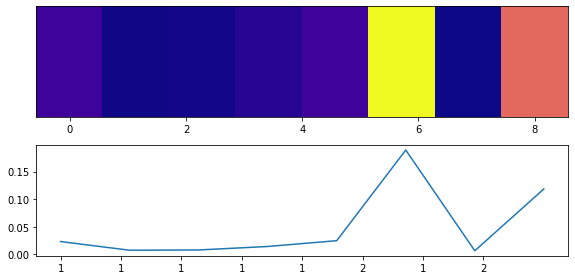

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


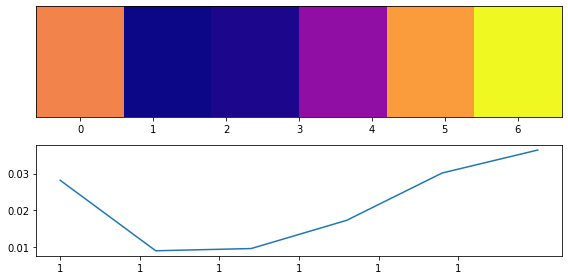

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


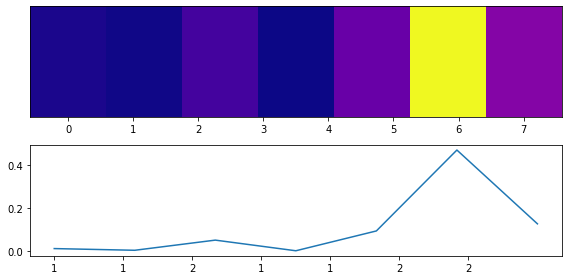

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


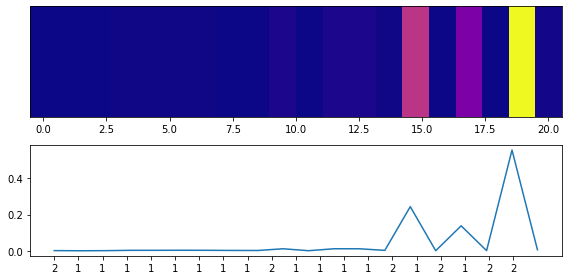

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


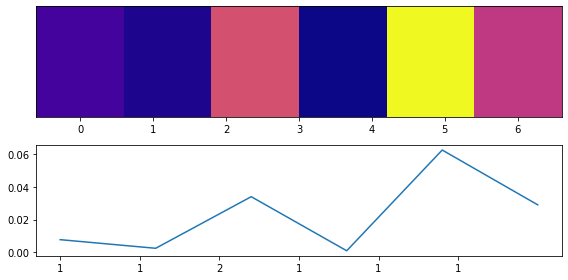

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


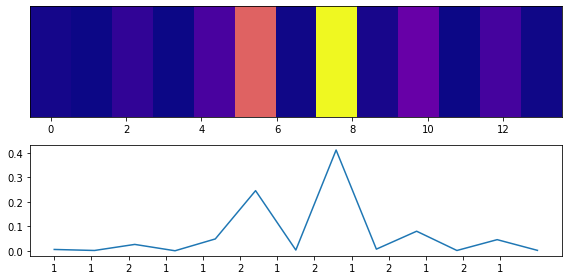

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


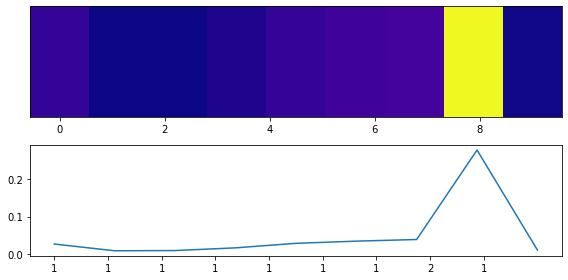

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


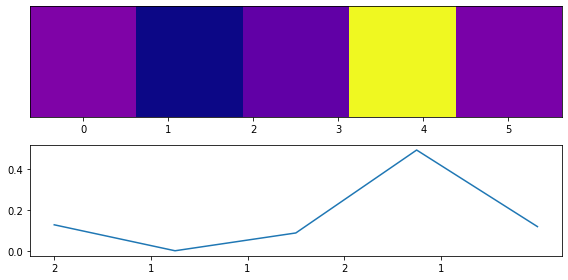

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


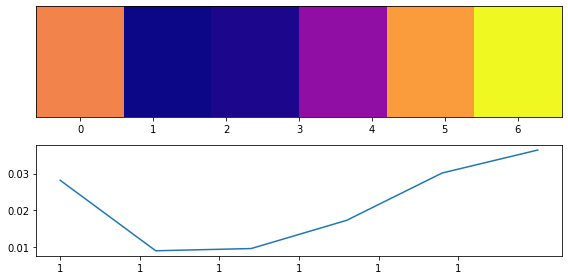

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


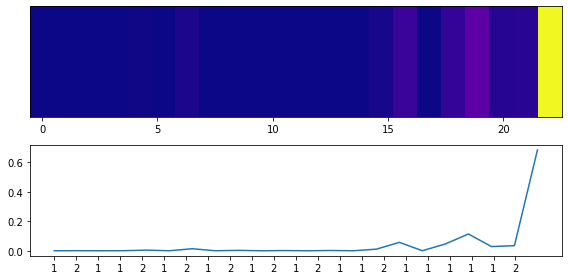

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


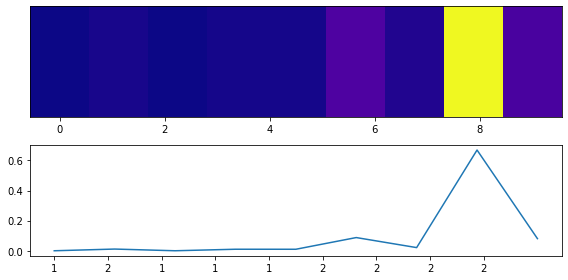

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


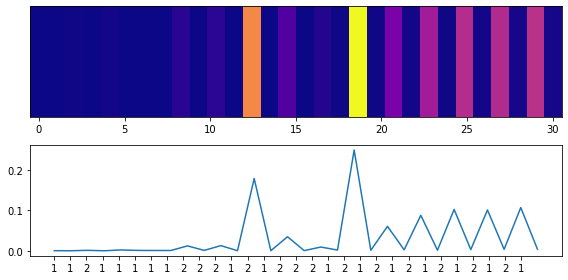

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


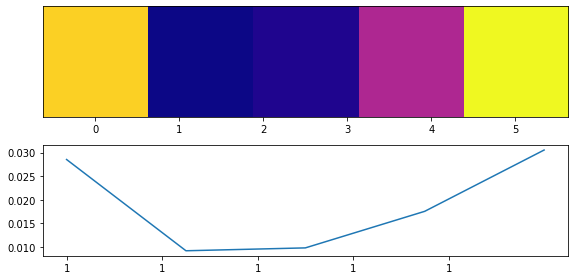

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


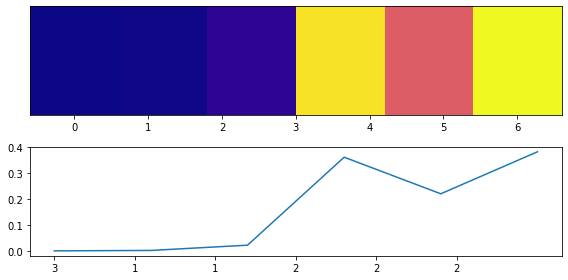

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


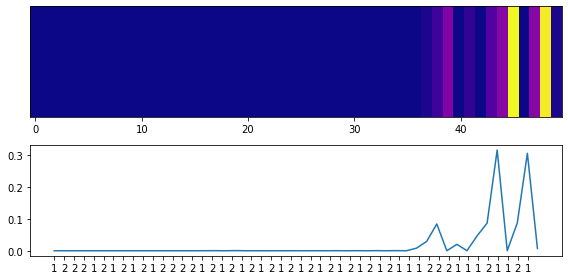

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


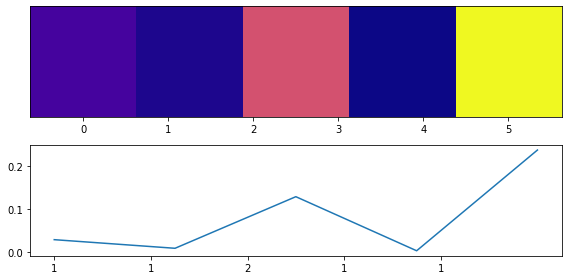

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


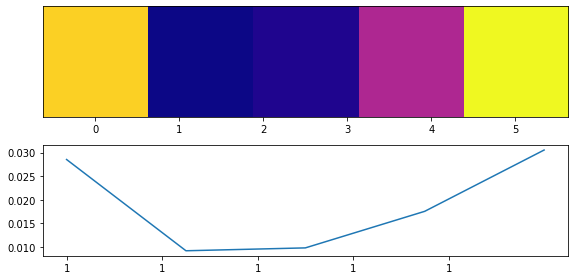

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


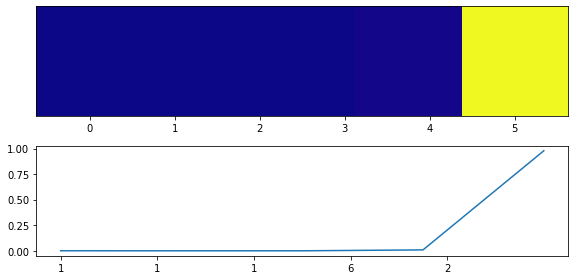

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


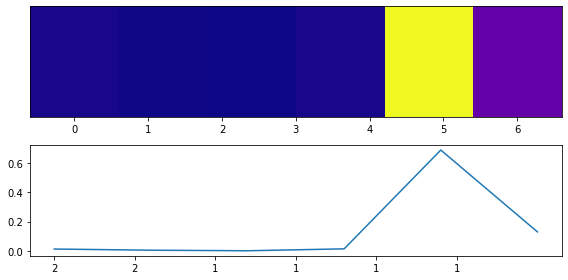

model prediction: 1 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


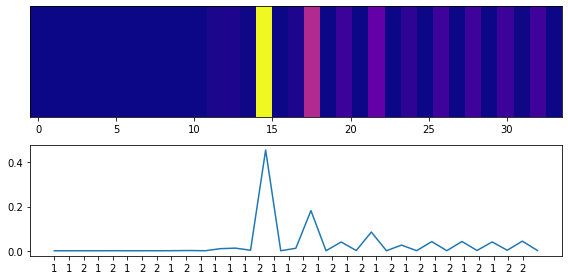

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


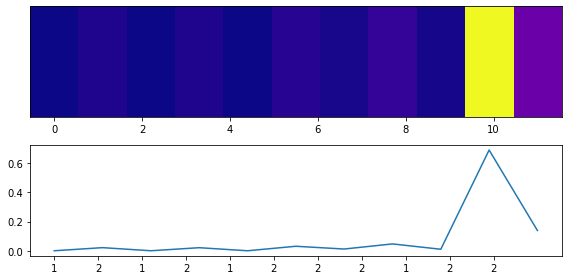

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


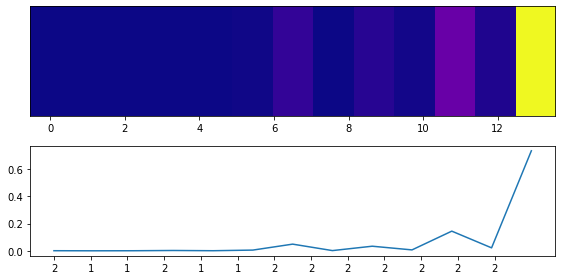

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


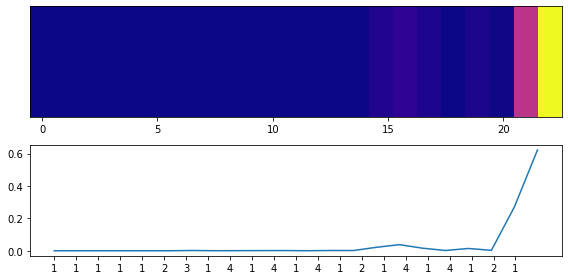

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


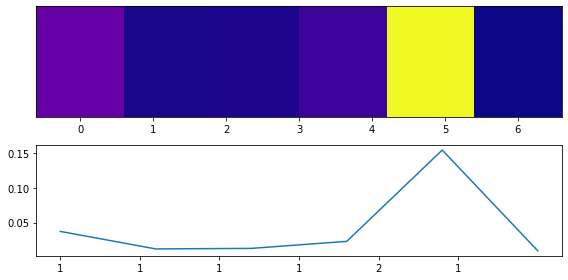

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


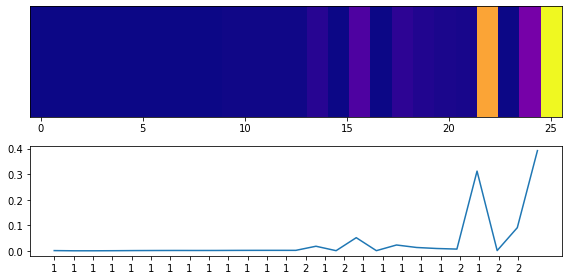

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


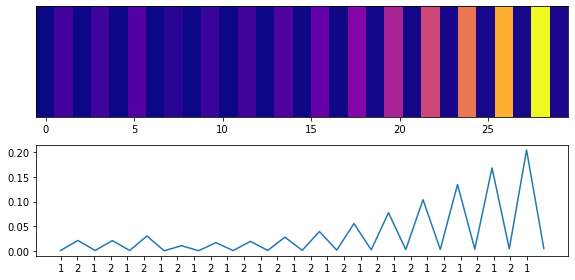

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


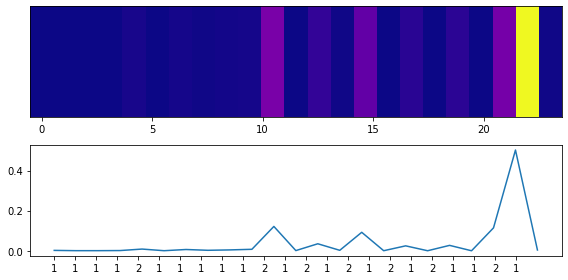

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


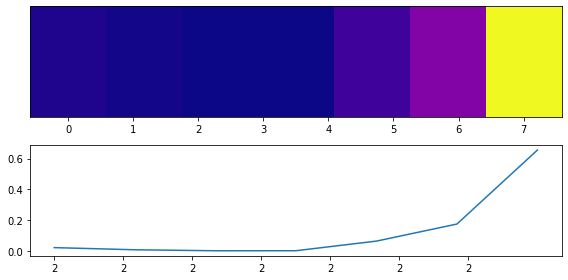

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


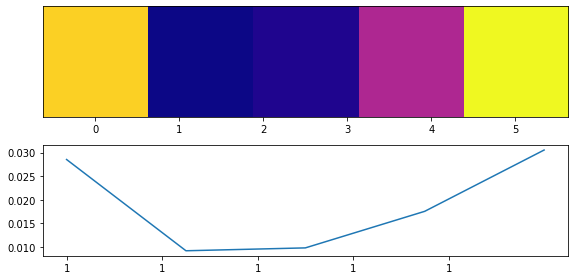

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


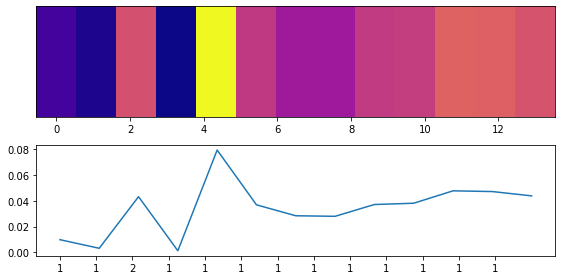

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


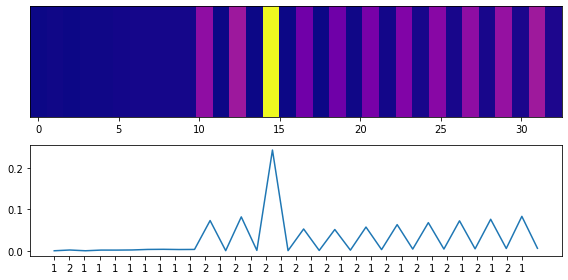

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


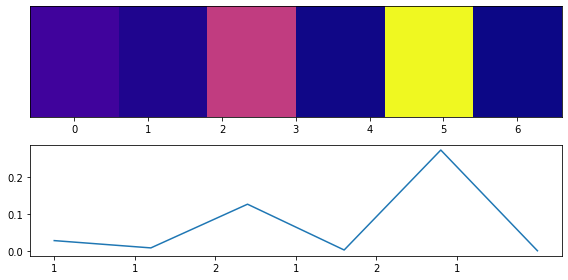

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


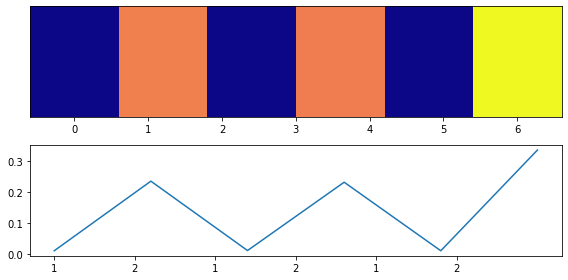

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


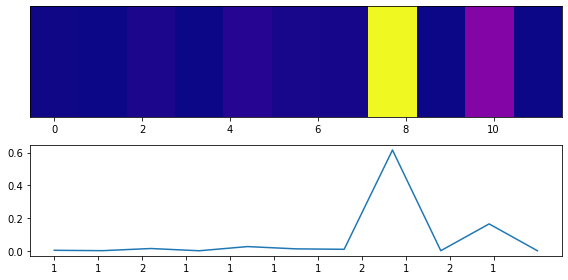

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


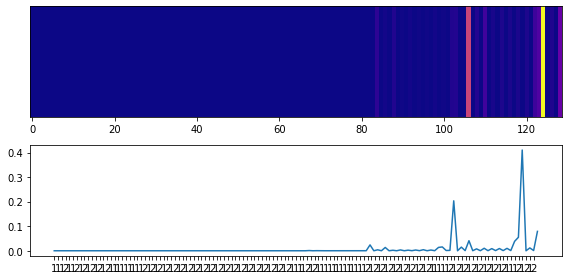

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


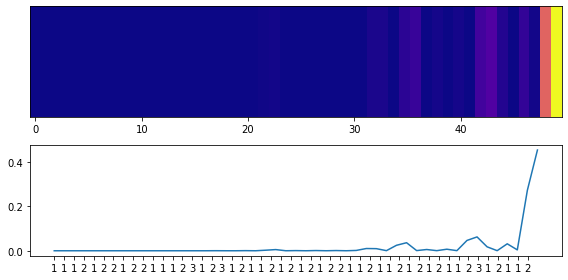

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


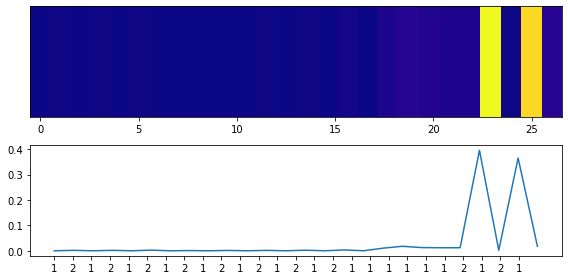

model prediction: 0 true label: 0
<class 'matplotlib.axes._subplots.AxesSubplot'>


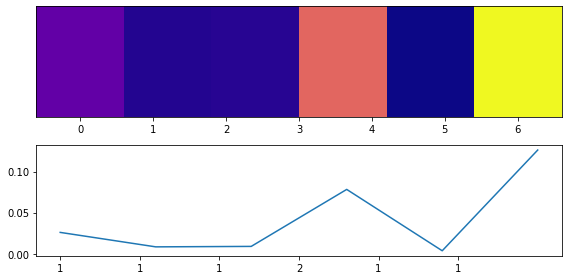

model prediction: 0 true label: 0


In [ ]:
for i in range(1000):

    plt.rcParams["figure.figsize"] = 8,4

    y = attention[i]

    a = len(attention[i])

    x = np.linspace(0,a,a)
    


    fig, (ax,ax2) = plt.subplots(nrows=2, sharex=False)
    print(type(ax))

    extent = [x[0]-(x[1]-x[0])/2., x[-1]+(x[1]-x[0])/2.,0,1]
    ax.imshow(y[np.newaxis,:], cmap="plasma", aspect="auto", extent=extent)
    ax.set_yticks([])
    ax.set_xlim(extent[0], extent[1])
    plt.xticks(list(range(len(sequence[i]))), sequence[i])

    ax2.plot(x,y)

    plt.tight_layout()
    plt.show()
    print("model prediction:",model_output[i],"true label:", y_test[i])

In [ ]:
len(sequence)

30463

In [ ]:
import more_itertools

In [ ]:
max_seq_list=[]
for seq in range(len(sequence)):
  a = list(more_itertools.windowed(sequence[seq],n=5,step=1))
  b = list(more_itertools.windowed(attention[seq],n=5,step=1))
  cycle=[]
  for i in range(len(b)):
    cycle.append(sum(b[i]))
  max_cycle=np.argmax(cycle)
  max_seq = a[max_cycle]
  max_seq_list.append(max_seq)



In [ ]:
print(len(max_seq_list))

30463


In [ ]:
df6['max_seq_list'] = max_seq_list

In [ ]:
dfconversion_output = df6[df6['model_output'] == 1]
dfnon_conversion_output = df6[df6['model_output'] == 0]
dfconversion_y = df6[df6['y_test'] == 1]
dfnon_conversion_y = df6[df6['y_test'] == 0]

In [ ]:
conversion_seq = dfconversion_output['max_seq_list']
non_conversion_seq = dfnon_conversion_output['max_seq_list']

In [ ]:
from collections import Counter

In [ ]:
non_convesion_seq = Counter(non_conversion_seq)

In [ ]:
non_convesion_seq.most_common()

[(('2', '1', '2', '1', '2'), 5217),
 (('1', '1', '1', '1', '1'), 3060),
 (('1', '1', '2', '1', '2'), 2068),
 (('1', '1', '1', '1', '2'), 1827),
 (('2', '1', '2', '1', '1'), 1276),
 (('1', '2', '1', '1', '2'), 1115),
 (('2', '1', '1', '1', '1'), 984),
 (('1', '2', '1', '2', '1'), 945),
 (('2', '1', '1', '1', '2'), 918),
 (('1', '1', '2', '1', '1'), 900),
 (('2', '2', '2', '2', '2'), 868),
 (('1', '2', '1', '1', '1'), 841),
 (('1', '1', '1', '2', '1'), 644),
 (('2', '1', '1', '2', '1'), 447),
 (('1', '2', '2', '2', '2'), 222),
 (('2', '2', '2', '1', '2'), 217),
 (('1', '1', '2', '2', '2'), 214),
 (('1', '1', '1', '2', '2'), 199),
 (('2', '1', '2', '2', '2'), 184),
 (('1', '2', '1', '2', '2'), 178),
 (('2', '3', '1', '2', '1'), 159),
 (('1', '1', '1', '2', '6'), 158),
 (('2', '2', '1', '1', '2'), 135),
 (('2', '6', '1', '2', '6'), 133),
 (('3', '1', '2', '1', '2'), 125),
 (('6', '2', '1', '6', '2'), 123),
 (('1', '2', '2', '1', '2'), 123),
 (('2', '2', '2', '1', '1'), 119),
 (('1', '2', '

In [ ]:
conversion_seq = Counter(conversion_seq)
conversion_seq.most_common()

[(('1', '1', '1', '1', '1'), 1459),
 (('1', '2', '1', '1', '1'), 287),
 (('2', '1', '1', '1', '1'), 263),
 (('2', '3', '1', '1', '1'), 206),
 (('1', '2', '3', '1', '1'), 155),
 (('1', '4', '1', '1', '1'), 147),
 (('3', '1', '1', '1', '1'), 108),
 (('2', '2', '1', '1', '1'), 82),
 (('4', '1', '1', '1', '1'), 80),
 (('2', '1', '2', '1', '1'), 72),
 (('1', '1', '2', '1', '1'), 66),
 (('1', '1', '4', '1', '1'), 40),
 (('1', '2', '2', '1', '1'), 35),
 (('2', '1', '4', '1', '1'), 33),
 (('3', '3', '1', '1', '1'), 31),
 (('4', '1', '4', '1', '1'), 30),
 (('3', '1', '4', '1', '1'), 24),
 (('2', '6', '3', '1', '1'), 23),
 (('3', '3', '3', '1', '1'), 21),
 (('3', '1', '2', '1', '1'), 19),
 (('2', '2', '3', '1', '1'), 17),
 (('6', '3', '1', '1', '1'), 17),
 (('2', '2', '2', '1', '1'), 16),
 (('2', '6', '1', '1', '1'), 14),
 (('3', '2', '1', '1', '1'), 13),
 (('4', '4', '1', '1', '1'), 12),
 (('6', '2', '3', '1', '1'), 10),
 (('1', '4', '4', '1', '1'), 10),
 (('4', '1', '2', '1', '1'), 10),
 (('2'